In [1]:
import pandas as pd
dataset=pd.read_csv("austin_weather.csv")
dataset.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,SeaLevelPressureAvgInches,SeaLevelPressureLowInches,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events
0,2013-12-21,74,60,45,67,49,43,93,75,57,...,29.68,29.59,10,7,2,20,4,31,0.46,"Rain , Thunderstorm"
1,2013-12-22,56,48,39,43,36,28,93,68,43,...,30.13,29.87,10,10,5,16,6,25,0,
2,2013-12-23,58,45,32,31,27,23,76,52,27,...,30.49,30.41,10,10,10,8,3,12,0,
3,2013-12-24,61,46,31,36,28,21,89,56,22,...,30.45,30.3,10,10,7,12,4,20,0,
4,2013-12-25,58,50,41,44,40,36,86,71,56,...,30.33,30.27,10,10,7,10,2,16,T,


In [4]:
dataset.isnull().sum()

Date                          0
TempHighF                     0
TempAvgF                      0
TempLowF                      0
DewPointHighF                 0
DewPointAvgF                  0
DewPointLowF                  0
HumidityHighPercent           0
HumidityAvgPercent            0
HumidityLowPercent            0
SeaLevelPressureHighInches    0
SeaLevelPressureAvgInches     0
SeaLevelPressureLowInches     0
VisibilityHighMiles           0
VisibilityAvgMiles            0
VisibilityLowMiles            0
WindHighMPH                   0
WindAvgMPH                    0
WindGustMPH                   0
PrecipitationSumInches        0
Events                        0
dtype: int64

In [5]:
dataset['Date']=pd.to_datetime(dataset.Date)
dataset['Year']=dataset['Date'].dt.year
dataset['Month']=dataset['Date'].dt.month
dataset['Day']=dataset['Date'].dt.day
dataset=dataset.drop('Date',axis=1)
dataset=dataset.drop('Events',axis=1)
dataset.head()

,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,SeaLevelPressureHighInches,...,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Year,Month,Day
0,74,60,45,67,49,43,93,75,57,29.86,...,10,7,2,20,4,31,0.46,2013,12,21
1,56,48,39,43,36,28,93,68,43,30.41,...,10,10,5,16,6,25,0,2013,12,22
2,58,45,32,31,27,23,76,52,27,30.56,...,10,10,10,8,3,12,0,2013,12,23
3,61,46,31,36,28,21,89,56,22,30.56,...,10,10,7,12,4,20,0,2013,12,24
4,58,50,41,44,40,36,86,71,56,30.41,...,10,10,7,10,2,16,T,2013,12,25


In [6]:
for col in dataset:
    print(dataset[col].unique())
    print("\n\n")
    if col=='PrecipitationSumInches':
        break

[ 74  56  58  61  57  60  62  64  44  55  69  71  59  36  48  53  70  72
  75  67  76  82  63  40  39  49  65  80  46  32  38  86  81  83  77  52
  73  47  50  68  66  89  79  85  84  87  78  88  96  93  94  91  92  90
  95  97  98 100 101  99 102 104 103  51  41  45  54  42  43  37 105  34
 107 106]



[60 48 45 46 50 53 51 40 54 44 43 57 47 29 35 62 65 52 56 59 64 42 33 38
 68 66 34 67 70 69 73 63 74 36 49 61 55 58 72 76 77 75 78 85 80 79 83 81
 82 92 84 86 87 88 90 89 91 71 39 37 41 30 32 93]



[45 39 32 31 41 40 36 35 33 28 42 34 22 53 57 48 46 43 37 38 27 26 55 29
 47 59 58 63 62 52 44 24 30 50 56 49 51 54 61 60 66 70 71 65 68 64 67 73
 72 74 75 76 77 78 69 79 80 23 81 19 21]



['67' '43' '31' '36' '44' '39' '41' '49' '51' '37' '55' '54' '15' '29'
 '60' '64' '58' '28' '42' '22' '38' '45' '19' '59' '62' '40' '17' '53'
 '34' '48' '52' '61' '63' '33' '57' '65' '46' '32' '50' '27' '56' '47'
 '68' '69' '66' '70' '73' '71' '76' '72' '75' '74' '-' '77' '23' '35' '30'
 '79' '78' '80' '2

In [7]:
dataset=dataset.replace('-','0')
dataset=dataset.replace(' ','Nan')|
dataset=dataset.replace('T','0')
print(dataset.dtypes)

SyntaxError: invalid syntax (<ipython-input-7-62806970c6c7>, line 2)

In [9]:
c=0
for col in dataset:
    if c>2:
        dataset[col]=dataset[col].astype('float')
    if col=='PrecipitationSumInches':
        break
    c = c+1
data=dataset.copy()

In [11]:
ds=data[['TempAvgF','DewPointAvgF']]

In [25]:
ds.iloc[5:15,:]

,TempAvgF,DewPointAvgF
5,48,36.0
6,53,39.0
7,51,39.0
8,50,41.0
9,40,26.0
10,46,28.0
11,54,42.0
12,44,26.0
13,43,22.0
14,57,48.0


Text(0, 0.5, 'DewPointF(Y)')

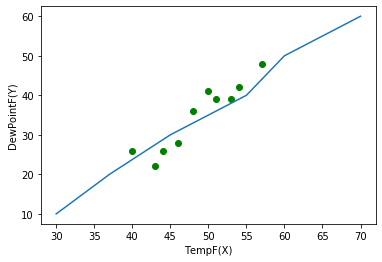

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(ds['TempAvgF'][5:15],ds['DewPointAvgF'][5:15],'go')
plt.plot([30,37,45,55,60,70],[10,20,30,40,50,60])
plt.xlabel('TempF(X)')
plt.ylabel('DewPointF(Y)')

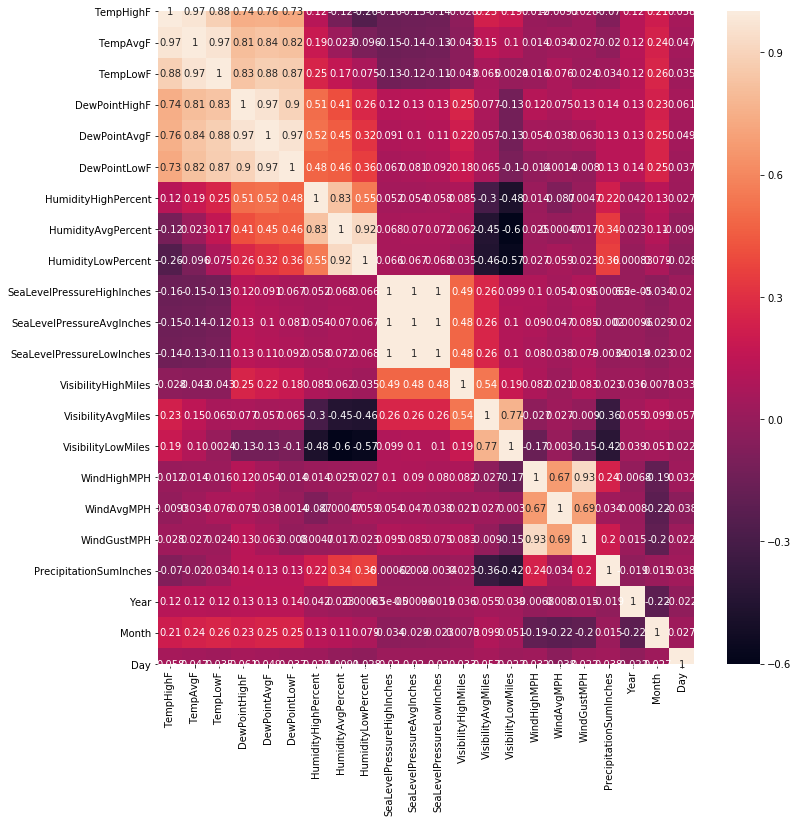

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

corrMatrix = data.corr()
plt.figure(figsize=(12, 12))
sns.heatmap(corrMatrix, annot=True)

In [20]:
Y_out = pd.DataFrame(data, columns = ['TempHighF','TempAvgF','TempLowF'])
data=data.drop('TempAvgF',axis=1)
data=data.drop('TempLowF',axis=1)
data=data.drop('TempHighF',axis=1)

In [21]:
X_train=pd.concat([data.iloc[0:100,:],data.iloc[200:1200,:]])
X_test=pd.concat([data.iloc[100:200,:],data.iloc[1200:,:]])
Y_train=pd.concat([Y_out.iloc[0:100,1:2],Y_out.iloc[200:1200,1:2]])
Y_test=pd.concat([Y_out.iloc[100:200,1:2],Y_out.iloc[1200:,1:2]])

In [22]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(1100, 19)
(1100, 1)
(219, 19)
(219, 1)


In [60]:
import numpy as np
def weight_initializer(no_independent_variables):
    weights=np.random.randn(no_independent_variables,1)
    return weights

def cost_computation(X,Y,weights,samples):
    Y_hat=np.dot(X,weights)
    cost= (1/(2*samples))*np.sum((Y_hat-Y)**2)
    mae=np.sum(Y_hat-Y)
    return cost,mae

def cal_gradient(X,Y,samples,weights):
    return 1/samples * np.dot(X.T,np.subtract(np.dot(X,weights),Y))

def update_weights(X,Y,weights,learning_rate,samples):
    weights=weights - learning_rate*cal_gradient(X,Y,samples,weights)
    return weights

def gradient_descent(X,Y,learning_rate,epochs):
    cost=[]
    it=[]
    samples=len(Y)
    n_variables=X.shape[1]
    weights=weight_initializer(n_variables)
    loss=cost_computation(X,Y,weights,samples)
    for i in range(epochs):
        weights=update_weights(X,Y,weights,learning_rate,samples)
        loss,mae=cost_computation(X,Y,weights,samples)
        if i%1000==0:
            cost.append(loss)
            it.append(i)
        print(f"Cost after iteration {str(i)}  ===>>>    {str(loss)}")
        print(f" MAE ===>>>  {str(mae)}")
        print("\n")
        
    %matplotlib inline
    plt.plot(it,cost)
    plt.xlabel('Iteration')
    plt.ylabel('Cost')
    
    return weights

def Predict(X_test, Y_test, weights):
    Y_hat=np.dot(X_test,weights)
    mae=np.sum(Y_hat-Y_test)
    d=pd.DataFrame({'Actual':[Y_test], 'Predicted':[Y_hat]})
    return d,Y_test,Y_hat

def manual_predict(X_test, weights):
    Y_hat=np.dot(X_test,weights)
    return Y_hat

Cost after iteration 0  ===>>>    76.90588546938127
 MAE ===>>>  2472.4871733397517


Cost after iteration 1  ===>>>    73.91648990530058
 MAE ===>>>  193.73520473967778


Cost after iteration 2  ===>>>    72.95981332057514
 MAE ===>>>  261.7807645685539


Cost after iteration 3  ===>>>    72.02460784247876
 MAE ===>>>  254.46028279649533


Cost after iteration 4  ===>>>    71.10831794815718
 MAE ===>>>  249.61555947612771


Cost after iteration 5  ===>>>    70.21047657509546
 MAE ===>>>  244.74433482253085


Cost after iteration 6  ===>>>    69.33063220285499
 MAE ===>>>  239.92641888738592


Cost after iteration 7  ===>>>    68.46834627585915
 MAE ===>>>  235.1586481304597


Cost after iteration 8  ===>>>    67.62319277994679
 MAE ===>>>  230.4405332935719


Cost after iteration 9  ===>>>    66.79475783604369
 MAE ===>>>  225.77150677504585


Cost after iteration 10  ===>>>    65.98263930818932
 MAE ===>>>  221.1510109818355


Cost after iteration 11  ===>>>    65.18644642538179
 MAE

Cost after iteration 126  ===>>>    26.12230506982308
 MAE ===>>>  -91.98452089315236


Cost after iteration 127  ===>>>    25.997404550870023
 MAE ===>>>  -93.41361222567406


Cost after iteration 128  ===>>>    25.874109638792664
 MAE ===>>>  -94.82878501733458


Cost after iteration 129  ===>>>    25.752394331946608
 MAE ===>>>  -96.2301763065334


Cost after iteration 130  ===>>>    25.632233111862867
 MAE ===>>>  -97.61792165374632


Cost after iteration 131  ===>>>    25.51360093307305
 MAE ===>>>  -98.9921551593612


Cost after iteration 132  ===>>>    25.396473213178172
 MAE ===>>>  -100.35300948102162


Cost after iteration 133  ===>>>    25.280825823154142
 MAE ===>>>  -101.70061585089053


Cost after iteration 134  ===>>>    25.166635077887822
 MAE ===>>>  -103.03510409265871


Cost after iteration 135  ===>>>    25.053877726937188
 MAE ===>>>  -104.35660263829274


Cost after iteration 136  ===>>>    24.94253094550988
 MAE ===>>>  -105.66523854461951


Cost after iteration 

Cost after iteration 268  ===>>>    17.22310913303902
 MAE ===>>>  -201.662363132454


Cost after iteration 269  ===>>>    17.193295131799683
 MAE ===>>>  -202.00501299341806


Cost after iteration 270  ===>>>    17.163703013648107
 MAE ===>>>  -202.34397716228003


Cost after iteration 271  ===>>>    17.134330186800153
 MAE ===>>>  -202.67928839572076


Cost after iteration 272  ===>>>    17.105174096012984
 MAE ===>>>  -203.0109791428958


Cost after iteration 273  ===>>>    17.076232222008336
 MAE ===>>>  -203.33908154853032


Cost after iteration 274  ===>>>    17.04750208090574
 MAE ===>>>  -203.66362745600813


Cost after iteration 275  ===>>>    17.018981223665687
 MAE ===>>>  -203.98464841046058


Cost after iteration 276  ===>>>    16.990667235542162
 MAE ===>>>  -204.30217566176336


Cost after iteration 277  ===>>>    16.96255773554478
 MAE ===>>>  -204.61624016757784


Cost after iteration 278  ===>>>    16.934650375910113
 MAE ===>>>  -204.92687259625944


Cost after itera

Cost after iteration 413  ===>>>    14.368972058839113
 MAE ===>>>  -224.97115364821659


Cost after iteration 414  ===>>>    14.355692570903473
 MAE ===>>>  -225.01019532794615


Cost after iteration 415  ===>>>    14.342467064085813
 MAE ===>>>  -225.04819456742175


Cost after iteration 416  ===>>>    14.329295116762156
 MAE ===>>>  -225.08516030815252


Cost after iteration 417  ===>>>    14.316176311861145
 MAE ===>>>  -225.12110141572327


Cost after iteration 418  ===>>>    14.303110236805415
 MAE ===>>>  -225.15602668043977


Cost after iteration 419  ===>>>    14.290096483453873
 MAE ===>>>  -225.1899448180042


Cost after iteration 420  ===>>>    14.277134648044687
 MAE ===>>>  -225.22286447021264


Cost after iteration 421  ===>>>    14.26422433113918
 MAE ===>>>  -225.25479420561814


Cost after iteration 422  ===>>>    14.251365137566507
 MAE ===>>>  -225.28574252022304


Cost after iteration 423  ===>>>    14.238556676369031
 MAE ===>>>  -225.31571783805393


Cost after i

Cost after iteration 571  ===>>>    12.74930418810918
 MAE ===>>>  -222.5017623878278


Cost after iteration 572  ===>>>    12.741253861783362
 MAE ===>>>  -222.4511544155336


Cost after iteration 573  ===>>>    12.733223535429193
 MAE ===>>>  -222.40029270445567


Cost after iteration 574  ===>>>    12.725213108737092
 MAE ===>>>  -222.3491796960828


Cost after iteration 575  ===>>>    12.717222482136457
 MAE ===>>>  -222.29781781249727


Cost after iteration 576  ===>>>    12.709251556788324
 MAE ===>>>  -222.246209456566


Cost after iteration 577  ===>>>    12.701300234578136
 MAE ===>>>  -222.19435701200354


Cost after iteration 578  ===>>>    12.693368418108577
 MAE ===>>>  -222.14226284363477


Cost after iteration 579  ===>>>    12.685456010692524
 MAE ===>>>  -222.08992929748993


Cost after iteration 580  ===>>>    12.677562916346016
 MAE ===>>>  -222.03735870095622


Cost after iteration 581  ===>>>    12.66968903978141
 MAE ===>>>  -221.98455336299412


Cost after iterat

Cost after iteration 710  ===>>>    11.786877817759855
 MAE ===>>>  -213.86717690075807


Cost after iteration 711  ===>>>    11.780886965087097
 MAE ===>>>  -213.79811657039974


Cost after iteration 712  ===>>>    11.774906998657293
 MAE ===>>>  -213.72900877973598


Cost after iteration 713  ===>>>    11.768937876581688
 MAE ===>>>  -213.65985433747255


Cost after iteration 714  ===>>>    11.762979557195825
 MAE ===>>>  -213.5906540458831


Cost after iteration 715  ===>>>    11.75703199905793
 MAE ===>>>  -213.52140870077017


Cost after iteration 716  ===>>>    11.751095160947276
 MAE ===>>>  -213.45211909164203


Cost after iteration 717  ===>>>    11.745169001862648
 MAE ===>>>  -213.3827860016458


Cost after iteration 718  ===>>>    11.739253481020722
 MAE ===>>>  -213.3134102076493


Cost after iteration 719  ===>>>    11.733348557854544
 MAE ===>>>  -213.2439924803467


Cost after iteration 720  ===>>>    11.72745419201196
 MAE ===>>>  -213.17453358421807


Cost after itera

Cost after iteration 835  ===>>>    11.110934264297349
 MAE ===>>>  -205.07110398216025


Cost after iteration 836  ===>>>    11.106038083115816
 MAE ===>>>  -205.00072417549936


Cost after iteration 837  ===>>>    11.101148892914619
 MAE ===>>>  -204.930360427975


Cost after iteration 838  ===>>>    11.096266670905404
 MAE ===>>>  -204.86001302412024


Cost after iteration 839  ===>>>    11.091391394401505
 MAE ===>>>  -204.7896822459096


Cost after iteration 840  ===>>>    11.08652304081738
 MAE ===>>>  -204.71936837289581


Cost after iteration 841  ===>>>    11.081661587668062
 MAE ===>>>  -204.64907168202524


Cost after iteration 842  ===>>>    11.076807012568603
 MAE ===>>>  -204.57879244791795


Cost after iteration 843  ===>>>    11.071959293233508
 MAE ===>>>  -204.50853094261595


Cost after iteration 844  ===>>>    11.067118407476192
 MAE ===>>>  -204.43828743583998


Cost after iteration 845  ===>>>    11.062284333208444
 MAE ===>>>  -204.3680621948338


Cost after iter

Cost after iteration 980  ===>>>    10.464189072850479
 MAE ===>>>  -195.13867680527278


Cost after iteration 981  ===>>>    10.460110987524212
 MAE ===>>>  -195.07261376361788


Cost after iteration 982  ===>>>    10.456037426934449
 MAE ===>>>  -195.00658902698763


Cost after iteration 983  ===>>>    10.451968378670319
 MAE ===>>>  -194.94060265590826


Cost after iteration 984  ===>>>    10.447903830369965
 MAE ===>>>  -194.87465471011612


Cost after iteration 985  ===>>>    10.443843769720337
 MAE ===>>>  -194.80874524846917


Cost after iteration 986  ===>>>    10.43978818445695
 MAE ===>>>  -194.7428743289815


Cost after iteration 987  ===>>>    10.435737062363685
 MAE ===>>>  -194.67704200888178


Cost after iteration 988  ===>>>    10.431690391272536
 MAE ===>>>  -194.6112483445086


Cost after iteration 989  ===>>>    10.427648159063416
 MAE ===>>>  -194.54549339148065


Cost after iteration 990  ===>>>    10.423610353663921
 MAE ===>>>  -194.47977720451053


Cost after it

Cost after iteration 1127  ===>>>    9.907636569279479
 MAE ===>>>  -185.85698318269172


Cost after iteration 1128  ===>>>    9.904112205774938
 MAE ===>>>  -185.79686084959474


Cost after iteration 1129  ===>>>    9.900590970515536
 MAE ===>>>  -185.73677927015936


Cost after iteration 1130  ===>>>    9.897072856380069
 MAE ===>>>  -185.67673843093706


Cost after iteration 1131  ===>>>    9.89355785627299
 MAE ===>>>  -185.61673831821162


Cost after iteration 1132  ===>>>    9.890045963124273
 MAE ===>>>  -185.55677891799962


Cost after iteration 1133  ===>>>    9.886537169889312
 MAE ===>>>  -185.4968602161198


Cost after iteration 1134  ===>>>    9.883031469548824
 MAE ===>>>  -185.43698219808772


Cost after iteration 1135  ===>>>    9.879528855108733
 MAE ===>>>  -185.3771448491621


Cost after iteration 1136  ===>>>    9.876029319600057
 MAE ===>>>  -185.31734815443258


Cost after iteration 1137  ===>>>    9.872532856078816
 MAE ===>>>  -185.25759209864796


Cost after it

Cost after iteration 1275  ===>>>    9.41672805523357
 MAE ===>>>  -177.3912212904753


Cost after iteration 1276  ===>>>    9.41360094993683
 MAE ===>>>  -177.33688432557562


Cost after iteration 1277  ===>>>    9.410476148912656
 MAE ===>>>  -177.2825842784862


Cost after iteration 1278  ===>>>    9.407353647880138
 MAE ===>>>  -177.22832111570276


Cost after iteration 1279  ===>>>    9.404233442572322
 MAE ===>>>  -177.17409480370193


Cost after iteration 1280  ===>>>    9.401115528736138
 MAE ===>>>  -177.1199053088794


Cost after iteration 1281  ===>>>    9.397999902132375
 MAE ===>>>  -177.06575259765563


Cost after iteration 1282  ===>>>    9.394886558535594
 MAE ===>>>  -177.01163663630075


Cost after iteration 1283  ===>>>    9.391775493734105
 MAE ===>>>  -176.9575573911166


Cost after iteration 1284  ===>>>    9.388666703529882
 MAE ===>>>  -176.90351482831994


Cost after iteration 1285  ===>>>    9.385560183738528
 MAE ===>>>  -176.849508914115


Cost after iterati

Cost after iteration 1414  ===>>>    9.002473116528126
 MAE ===>>>  -170.1773225721119


Cost after iteration 1415  ===>>>    8.999630617786758
 MAE ===>>>  -170.12778380068133


Cost after iteration 1416  ===>>>    8.996789940924529
 MAE ===>>>  -170.07827708244025


Cost after iteration 1417  ===>>>    8.993951083157642
 MAE ===>>>  -170.02880238235335


Cost after iteration 1418  ===>>>    8.991114041710428
 MAE ===>>>  -169.97935966541357


Cost after iteration 1419  ===>>>    8.988278813815304
 MAE ===>>>  -169.92994889661415


Cost after iteration 1420  ===>>>    8.985445396712748
 MAE ===>>>  -169.88057004098556


Cost after iteration 1421  ===>>>    8.982613787651268
 MAE ===>>>  -169.8312230635425


Cost after iteration 1422  ===>>>    8.979783983887366
 MAE ===>>>  -169.78190792932511


Cost after iteration 1423  ===>>>    8.976955982685512
 MAE ===>>>  -169.73262460342121


Cost after iteration 1424  ===>>>    8.974129781318126
 MAE ===>>>  -169.68337305091222


Cost after i

Cost after iteration 1572  ===>>>    8.574341278946532
 MAE ===>>>  -162.7257026683862


Cost after iteration 1573  ===>>>    8.571756668740457
 MAE ===>>>  -162.6808086456478


Cost after iteration 1574  ===>>>    8.569173524316076
 MAE ===>>>  -162.63594144966206


Cost after iteration 1575  ===>>>    8.566591843862383
 MAE ===>>>  -162.59110104978987


Cost after iteration 1576  ===>>>    8.564011625572933
 MAE ===>>>  -162.54628741550363


Cost after iteration 1577  ===>>>    8.561432867645829
 MAE ===>>>  -162.50150051626463


Cost after iteration 1578  ===>>>    8.558855568283684
 MAE ===>>>  -162.45674032156063


Cost after iteration 1579  ===>>>    8.556279725693631
 MAE ===>>>  -162.4120068009469


Cost after iteration 1580  ===>>>    8.553705338087276
 MAE ===>>>  -162.36729992398895


Cost after iteration 1581  ===>>>    8.551132403680727
 MAE ===>>>  -162.3226196603155


Cost after iteration 1582  ===>>>    8.548560920694527
 MAE ===>>>  -162.2779659795507


Cost after iter

Cost after iteration 1717  ===>>>    8.214047522929784
 MAE ===>>>  -156.48154301635782


Cost after iteration 1718  ===>>>    8.21165855746841
 MAE ===>>>  -156.44023719748387


Cost after iteration 1719  ===>>>    8.20927083579887
 MAE ===>>>  -156.39895414228795


Cost after iteration 1720  ===>>>    8.206884356631337
 MAE ===>>>  -156.3576938253544


Cost after iteration 1721  ===>>>    8.20449911867874
 MAE ===>>>  -156.3164562213048


Cost after iteration 1722  ===>>>    8.20211512065681
 MAE ===>>>  -156.27524130480532


Cost after iteration 1723  ===>>>    8.199732361284044
 MAE ===>>>  -156.23404905056293


Cost after iteration 1724  ===>>>    8.197350839281707
 MAE ===>>>  -156.1928794332866


Cost after iteration 1725  ===>>>    8.194970553373803
 MAE ===>>>  -156.15173242775214


Cost after iteration 1726  ===>>>    8.19259150228709
 MAE ===>>>  -156.11060800876717


Cost after iteration 1727  ===>>>    8.19021368475107
 MAE ===>>>  -156.06950615116563


Cost after iteratio

Cost after iteration 1874  ===>>>    7.8534571527502965
 MAE ===>>>  -150.26005070112674


Cost after iteration 1875  ===>>>    7.851249235882177
 MAE ===>>>  -150.22202911773206


Cost after iteration 1876  ===>>>    7.849042389506101
 MAE ===>>>  -150.1840267195109


Cost after iteration 1877  ===>>>    7.846836612678682
 MAE ===>>>  -150.14604348619065


Cost after iteration 1878  ===>>>    7.844631904458255
 MAE ===>>>  -150.10807939748764


Cost after iteration 1879  ===>>>    7.842428263904876
 MAE ===>>>  -150.07013443320344


Cost after iteration 1880  ===>>>    7.84022569008031
 MAE ===>>>  -150.03220857312544


Cost after iteration 1881  ===>>>    7.8380241820480325
 MAE ===>>>  -149.9943017970988


Cost after iteration 1882  ===>>>    7.835823738873216
 MAE ===>>>  -149.95641408495828


Cost after iteration 1883  ===>>>    7.833624359622735
 MAE ===>>>  -149.91854541662963


Cost after iteration 1884  ===>>>    7.831426043365151
 MAE ===>>>  -149.88069577200343


Cost after 

Cost after iteration 2031  ===>>>    7.519365109224132
 MAE ===>>>  -144.5134628679926


Cost after iteration 2032  ===>>>    7.517314687323097
 MAE ===>>>  -144.47822277282435


Cost after iteration 2033  ===>>>    7.515265206129805
 MAE ===>>>  -144.44299901689016


Cost after iteration 2034  ===>>>    7.513216664920085
 MAE ===>>>  -144.40779158408702


Cost after iteration 2035  ===>>>    7.511169062970897
 MAE ===>>>  -144.3726004583375


Cost after iteration 2036  ===>>>    7.509122399560307
 MAE ===>>>  -144.3374256236027


Cost after iteration 2037  ===>>>    7.5070766739675046
 MAE ===>>>  -144.30226706382723


Cost after iteration 2038  ===>>>    7.505031885472791
 MAE ===>>>  -144.2671247630216


Cost after iteration 2039  ===>>>    7.50298803335758
 MAE ===>>>  -144.23199870520176


Cost after iteration 2040  ===>>>    7.500945116904387
 MAE ===>>>  -144.19688887438474


Cost after iteration 2041  ===>>>    7.498903135396841
 MAE ===>>>  -144.1617952546687


Cost after iter

Cost after iteration 2189  ===>>>    7.206624992703437
 MAE ===>>>  -139.13836105138472


Cost after iteration 2190  ===>>>    7.204714879347524
 MAE ===>>>  -139.1055171823894


Cost after iteration 2191  ===>>>    7.2028056045600115
 MAE ===>>>  -139.07268737852849


Cost after iteration 2192  ===>>>    7.200897167763815
 MAE ===>>>  -139.039871627019


Cost after iteration 2193  ===>>>    7.1989895683826095
 MAE ===>>>  -139.00706991504734


Cost after iteration 2194  ===>>>    7.1970828058408465
 MAE ===>>>  -138.97428222986764


Cost after iteration 2195  ===>>>    7.1951768795637285
 MAE ===>>>  -138.9415085587085


Cost after iteration 2196  ===>>>    7.193271788977234
 MAE ===>>>  -138.90874888884406


Cost after iteration 2197  ===>>>    7.191367533508088
 MAE ===>>>  -138.87600320757576


Cost after iteration 2198  ===>>>    7.1894641125837895
 MAE ===>>>  -138.8432715021935


Cost after iteration 2199  ===>>>    7.187561525632588
 MAE ===>>>  -138.81055376001743


Cost after

Cost after iteration 2324  ===>>>    6.956122733423074
 MAE ===>>>  -134.82675455699675


Cost after iteration 2325  ===>>>    6.95432089389524
 MAE ===>>>  -134.79570059430455


Cost after iteration 2326  ===>>>    6.952519821348673
 MAE ===>>>  -134.76465912161174


Cost after iteration 2327  ===>>>    6.950719515296288
 MAE ===>>>  -134.73363012828105


Cost after iteration 2328  ===>>>    6.948919975251564
 MAE ===>>>  -134.70261360378052


Cost after iteration 2329  ===>>>    6.94712120072858
 MAE ===>>>  -134.67160953751753


Cost after iteration 2330  ===>>>    6.945323191241966
 MAE ===>>>  -134.64061791894034


Cost after iteration 2331  ===>>>    6.943525946306939
 MAE ===>>>  -134.609638737504


Cost after iteration 2332  ===>>>    6.941729465439287
 MAE ===>>>  -134.5786719827014


Cost after iteration 2333  ===>>>    6.939933748155361
 MAE ===>>>  -134.54771764400704


Cost after iteration 2334  ===>>>    6.9381387939720875
 MAE ===>>>  -134.51677571092168


Cost after ite

Cost after iteration 2473  ===>>>    6.695852973996196
 MAE ===>>>  -130.3319767258182


Cost after iteration 2474  ===>>>    6.6941603346164005
 MAE ===>>>  -130.30267432631993


Cost after iteration 2475  ===>>>    6.692468395435814
 MAE ===>>>  -130.27338298580128


Cost after iteration 2476  ===>>>    6.69077715604211
 MAE ===>>>  -130.24410269557904


Cost after iteration 2477  ===>>>    6.689086616023403
 MAE ===>>>  -130.21483344700184


Cost after iteration 2478  ===>>>    6.687396774968245
 MAE ===>>>  -130.18557523140095


Cost after iteration 2479  ===>>>    6.685707632465613
 MAE ===>>>  -130.15632804014984


Cost after iteration 2480  ===>>>    6.684019188104931
 MAE ===>>>  -130.12709186459367


Cost after iteration 2481  ===>>>    6.682331441476035
 MAE ===>>>  -130.09786669611572


Cost after iteration 2482  ===>>>    6.68064439216921
 MAE ===>>>  -130.06865252613545


Cost after iteration 2483  ===>>>    6.678958039775166
 MAE ===>>>  -130.03944934601446


Cost after i

Cost after iteration 2628  ===>>>    6.441609332197638
 MAE ===>>>  -125.91706120458997


Cost after iteration 2629  ===>>>    6.440020550921936
 MAE ===>>>  -125.88937586142748


Cost after iteration 2630  ===>>>    6.438432410700186
 MAE ===>>>  -125.86170035667239


Cost after iteration 2631  ===>>>    6.436844911179351
 MAE ===>>>  -125.83403468320928


Cost after iteration 2632  ===>>>    6.435258052006728
 MAE ===>>>  -125.8063788339284


Cost after iteration 2633  ===>>>    6.433671832829945
 MAE ===>>>  -125.77873280170868


Cost after iteration 2634  ===>>>    6.432086253296964
 MAE ===>>>  -125.75109657945228


Cost after iteration 2635  ===>>>    6.430501313056081
 MAE ===>>>  -125.72347016006307


Cost after iteration 2636  ===>>>    6.4289170117559316
 MAE ===>>>  -125.6958535364695


Cost after iteration 2637  ===>>>    6.427333349045473
 MAE ===>>>  -125.66824670158186


Cost after iteration 2638  ===>>>    6.4257503245740075
 MAE ===>>>  -125.64064964834489


Cost after

Cost after iteration 2780  ===>>>    6.207275583665456
 MAE ===>>>  -121.81788395850828


Cost after iteration 2781  ===>>>    6.2057803727467515
 MAE ===>>>  -121.79161700680469


Cost after iteration 2782  ===>>>    6.204285752784171
 MAE ===>>>  -121.76535890318698


Cost after iteration 2783  ===>>>    6.202791723470134
 MAE ===>>>  -121.73910964173078


Cost after iteration 2784  ===>>>    6.201298284497312
 MAE ===>>>  -121.71286921647524


Cost after iteration 2785  ===>>>    6.199805435558644
 MAE ===>>>  -121.68663762152173


Cost after iteration 2786  ===>>>    6.19831317634734
 MAE ===>>>  -121.660414850911


Cost after iteration 2787  ===>>>    6.196821506556872
 MAE ===>>>  -121.6342008987629


Cost after iteration 2788  ===>>>    6.195330425880973
 MAE ===>>>  -121.60799575914021


Cost after iteration 2789  ===>>>    6.193839934013647
 MAE ===>>>  -121.58179942616026


Cost after iteration 2790  ===>>>    6.192350030649157
 MAE ===>>>  -121.5556118939146


Cost after ite

Cost after iteration 2922  ===>>>    6.00073215066678
 MAE ===>>>  -118.17388549231319


Cost after iteration 2923  ===>>>    5.999317894647652
 MAE ===>>>  -118.14881851768965


Cost after iteration 2924  ===>>>    5.997904188403209
 MAE ===>>>  -118.12375961133783


Cost after iteration 2925  ===>>>    5.996491031660137
 MAE ===>>>  -118.09870876816552


Cost after iteration 2926  ===>>>    5.995078424145341
 MAE ===>>>  -118.07366598313314


Cost after iteration 2927  ===>>>    5.993666365585941
 MAE ===>>>  -118.04863125117818


Cost after iteration 2928  ===>>>    5.992254855709276
 MAE ===>>>  -118.02360456724134


Cost after iteration 2929  ===>>>    5.990843894242906
 MAE ===>>>  -117.99858592629344


Cost after iteration 2930  ===>>>    5.989433480914607
 MAE ===>>>  -117.97357532329715


Cost after iteration 2931  ===>>>    5.988023615452369
 MAE ===>>>  -117.94857275320516


Cost after iteration 2932  ===>>>    5.986614297584397
 MAE ===>>>  -117.9235782110025


Cost after i

Cost after iteration 3061  ===>>>    5.809306885765848
 MAE ===>>>  -114.76481886673666


Cost after iteration 3062  ===>>>    5.807966518644466
 MAE ===>>>  -114.74082709305821


Cost after iteration 3063  ===>>>    5.806626665282893
 MAE ===>>>  -114.7168427330032


Cost after iteration 3064  ===>>>    5.805287325435617
 MAE ===>>>  -114.69286578220868


Cost after iteration 3065  ===>>>    5.803948498857303
 MAE ===>>>  -114.66889623629112


Cost after iteration 3066  ===>>>    5.802610185302807
 MAE ===>>>  -114.64493409091406


Cost after iteration 3067  ===>>>    5.8012723845271665
 MAE ===>>>  -114.62097934169495


Cost after iteration 3068  ===>>>    5.7999350962855925
 MAE ===>>>  -114.59703198428922


Cost after iteration 3069  ===>>>    5.79859832033349
 MAE ===>>>  -114.57309201434315


Cost after iteration 3070  ===>>>    5.797262056426441
 MAE ===>>>  -114.54915942752208


Cost after iteration 3071  ===>>>    5.795926304320202
 MAE ===>>>  -114.5252342194737


Cost after 

Cost after iteration 3215  ===>>>    5.608800377930654
 MAE ===>>>  -111.15491316467526


Cost after iteration 3216  ===>>>    5.607536341693053
 MAE ===>>>  -111.13201412900884


Cost after iteration 3217  ===>>>    5.606272783432949
 MAE ===>>>  -111.10912188304508


Cost after iteration 3218  ===>>>    5.605009702930535
 MAE ===>>>  -111.08623642301632


Cost after iteration 3219  ===>>>    5.603747099966147
 MAE ===>>>  -111.06335774516096


Cost after iteration 3220  ===>>>    5.602484974320278
 MAE ===>>>  -111.04048584578706


Cost after iteration 3221  ===>>>    5.601223325773575
 MAE ===>>>  -111.017620721096


Cost after iteration 3222  ===>>>    5.599962154106827
 MAE ===>>>  -110.99476236740753


Cost after iteration 3223  ===>>>    5.598701459100986
 MAE ===>>>  -110.97191078094204


Cost after iteration 3224  ===>>>    5.5974412405371465
 MAE ===>>>  -110.94906595800383


Cost after iteration 3225  ===>>>    5.596181498196559
 MAE ===>>>  -110.92622789485404


Cost after 

Cost after iteration 3370  ===>>>    5.418449027846491
 MAE ===>>>  -107.68439549717411


Cost after iteration 3371  ===>>>    5.41725654341606
 MAE ===>>>  -107.6625062024148


Cost after iteration 3372  ===>>>    5.41606450460792
 MAE ===>>>  -107.64062315646706


Cost after iteration 3373  ===>>>    5.414872911223931
 MAE ===>>>  -107.61874635607252


Cost after iteration 3374  ===>>>    5.413681763066059
 MAE ===>>>  -107.59687579800062


Cost after iteration 3375  ===>>>    5.412491059936411
 MAE ===>>>  -107.57501147901723


Cost after iteration 3376  ===>>>    5.411300801637212
 MAE ===>>>  -107.55315339587113


Cost after iteration 3377  ===>>>    5.41011098797083
 MAE ===>>>  -107.53130154534892


Cost after iteration 3378  ===>>>    5.408921618739744
 MAE ===>>>  -107.50945592421722


Cost after iteration 3379  ===>>>    5.407732693746568
 MAE ===>>>  -107.48761652923815


Cost after iteration 3380  ===>>>    5.406544212794048
 MAE ===>>>  -107.46578335720187


Cost after ite

Cost after iteration 3508  ===>>>    5.258015530750052
 MAE ===>>>  -104.72139379294035


Cost after iteration 3509  ===>>>    5.256882722082012
 MAE ===>>>  -104.70033737650921


Cost after iteration 3510  ===>>>    5.255750332847071
 MAE ===>>>  -104.67928678746657


Cost after iteration 3511  ===>>>    5.254618362863559
 MAE ===>>>  -104.65824202293945


Cost after iteration 3512  ===>>>    5.253486811949912
 MAE ===>>>  -104.63720308006252


Cost after iteration 3513  ===>>>    5.252355679924686
 MAE ===>>>  -104.61616995597116


Cost after iteration 3514  ===>>>    5.251224966606536
 MAE ===>>>  -104.59514264779233


Cost after iteration 3515  ===>>>    5.250094671814237
 MAE ===>>>  -104.5741211526641


Cost after iteration 3516  ===>>>    5.248964795366668
 MAE ===>>>  -104.55310546774732


Cost after iteration 3517  ===>>>    5.247835337082824
 MAE ===>>>  -104.53209559015653


Cost after iteration 3518  ===>>>    5.24670629678181
 MAE ===>>>  -104.51109151705057


Cost after i

Cost after iteration 3661  ===>>>    5.08946901361406
 MAE ===>>>  -101.56589422330003


Cost after iteration 3662  ===>>>    5.088398328442898
 MAE ===>>>  -101.5456973801424


Cost after iteration 3663  ===>>>    5.087328036139806
 MAE ===>>>  -101.52550595192912


Cost after iteration 3664  ===>>>    5.086258136538921
 MAE ===>>>  -101.50531993611979


Cost after iteration 3665  ===>>>    5.08518862947446
 MAE ===>>>  -101.48513933020251


Cost after iteration 3666  ===>>>    5.084119514780753
 MAE ===>>>  -101.46496413163277


Cost after iteration 3667  ===>>>    5.083050792292216
 MAE ===>>>  -101.44479433791177


Cost after iteration 3668  ===>>>    5.0819824618433636
 MAE ===>>>  -101.42462994649956


Cost after iteration 3669  ===>>>    5.080914523268804
 MAE ===>>>  -101.40447095489881


Cost after iteration 3670  ===>>>    5.079846976403241
 MAE ===>>>  -101.38431736057754


Cost after iteration 3671  ===>>>    5.078779821081481
 MAE ===>>>  -101.3641691610303


Cost after it

Cost after iteration 3799  ===>>>    4.945358514161519
 MAE ===>>>  -98.82886268036482


Cost after iteration 3800  ===>>>    4.944340516666668
 MAE ===>>>  -98.80939004615595


Cost after iteration 3801  ===>>>    4.943322890019737
 MAE ===>>>  -98.78992249640888


Cost after iteration 3802  ===>>>    4.942305634067295
 MAE ===>>>  -98.77046002884836


Cost after iteration 3803  ===>>>    4.941288748656
 MAE ===>>>  -98.7510026412369


Cost after iteration 3804  ===>>>    4.940272233632585
 MAE ===>>>  -98.73155033125204


Cost after iteration 3805  ===>>>    4.9392560888438695
 MAE ===>>>  -98.71210309669843


Cost after iteration 3806  ===>>>    4.9382403141367615
 MAE ===>>>  -98.69266093527298


Cost after iteration 3807  ===>>>    4.937224909358251
 MAE ===>>>  -98.67322384473903


Cost after iteration 3808  ===>>>    4.936209874355415
 MAE ===>>>  -98.65379182283502


Cost after iteration 3809  ===>>>    4.935195208975408
 MAE ===>>>  -98.63436486730222


Cost after iteration 38

Cost after iteration 3965  ===>>>    4.781337334799672
 MAE ===>>>  -95.6643915588307


Cost after iteration 3966  ===>>>    4.78037885799407
 MAE ===>>>  -95.64573315415214


Cost after iteration 3967  ===>>>    4.779420727672943
 MAE ===>>>  -95.62707948021617


Cost after iteration 3968  ===>>>    4.7784629436959625
 MAE ===>>>  -95.6084305350276


Cost after iteration 3969  ===>>>    4.777505505922869
 MAE ===>>>  -95.58978631657502


Cost after iteration 3970  ===>>>    4.776548414213473
 MAE ===>>>  -95.571146822864


Cost after iteration 3971  ===>>>    4.775591668427673
 MAE ===>>>  -95.552512051902


Cost after iteration 3972  ===>>>    4.774635268425427
 MAE ===>>>  -95.53388200168708


Cost after iteration 3973  ===>>>    4.773679214066772
 MAE ===>>>  -95.51525667023279


Cost after iteration 3974  ===>>>    4.7727235052118155
 MAE ===>>>  -95.49663605554049


Cost after iteration 3975  ===>>>    4.771768141720746
 MAE ===>>>  -95.47802015561575


Cost after iteration 3976 

Cost after iteration 4089  ===>>>    4.665085658270276
 MAE ===>>>  -93.38621868242546


Cost after iteration 4090  ===>>>    4.664169097637242
 MAE ===>>>  -93.36813206540718


Cost after iteration 4091  ===>>>    4.663252866630573
 MAE ===>>>  -93.35004994163108


Cost after iteration 4092  ===>>>    4.662336965118622
 MAE ===>>>  -93.331972309246


Cost after iteration 4093  ===>>>    4.6614213929698085
 MAE ===>>>  -93.31389916643741


Cost after iteration 4094  ===>>>    4.66050615005262
 MAE ===>>>  -93.29583051135828


Cost after iteration 4095  ===>>>    4.659591236235611
 MAE ===>>>  -93.27776634220517


Cost after iteration 4096  ===>>>    4.6586766513874
 MAE ===>>>  -93.2597066571252


Cost after iteration 4097  ===>>>    4.657762395376672
 MAE ===>>>  -93.24165145430783


Cost after iteration 4098  ===>>>    4.656848468072183
 MAE ===>>>  -93.22360073193065


Cost after iteration 4099  ===>>>    4.655934869342747
 MAE ===>>>  -93.20555448816336


Cost after iteration 4100 

Cost after iteration 4259  ===>>>    4.5139017143244615
 MAE ===>>>  -90.37460722247326


Cost after iteration 4260  ===>>>    4.5130393510186675
 MAE ===>>>  -90.35725913190721


Cost after iteration 4261  ===>>>    4.512177295877207
 MAE ===>>>  -90.33991524060242


Cost after iteration 4262  ===>>>    4.5113155487790735
 MAE ===>>>  -90.32257554693635


Cost after iteration 4263  ===>>>    4.510454109603318
 MAE ===>>>  -90.30524004928162


Cost after iteration 4264  ===>>>    4.509592978229043
 MAE ===>>>  -90.28790874600287


Cost after iteration 4265  ===>>>    4.508732154535418
 MAE ===>>>  -90.27058163547989


Cost after iteration 4266  ===>>>    4.507871638401665
 MAE ===>>>  -90.2532587160726


Cost after iteration 4267  ===>>>    4.507011429707068
 MAE ===>>>  -90.23593998616371


Cost after iteration 4268  ===>>>    4.506151528330967
 MAE ===>>>  -90.21862544412843


Cost after iteration 4269  ===>>>    4.505291934152763
 MAE ===>>>  -90.20131508835289


Cost after iteratio

Cost after iteration 4415  ===>>>    4.383025007792944
 MAE ===>>>  -87.71808693012437


Cost after iteration 4416  ===>>>    4.3822092905680625
 MAE ===>>>  -87.70137485374218


Cost after iteration 4417  ===>>>    4.381393863314417
 MAE ===>>>  -87.68466673464235


Cost after iteration 4418  ===>>>    4.38057872591967
 MAE ===>>>  -87.66796257138981


Cost after iteration 4419  ===>>>    4.379763878271534
 MAE ===>>>  -87.65126236245541


Cost after iteration 4420  ===>>>    4.378949320257788
 MAE ===>>>  -87.63456610642116


Cost after iteration 4421  ===>>>    4.378135051766241
 MAE ===>>>  -87.6178738017794


Cost after iteration 4422  ===>>>    4.377321072684776
 MAE ===>>>  -87.60118544708058


Cost after iteration 4423  ===>>>    4.376507382901314
 MAE ===>>>  -87.58450104084548


Cost after iteration 4424  ===>>>    4.375693982303836
 MAE ===>>>  -87.5678205816119


Cost after iteration 4425  ===>>>    4.374880870780371
 MAE ===>>>  -87.55114406790352


Cost after iteration 44

Cost after iteration 4554  ===>>>    4.2723729952697465
 MAE ===>>>  -85.43243077137336


Cost after iteration 4555  ===>>>    4.2715965291634515
 MAE ===>>>  -85.41625502010207


Cost after iteration 4556  ===>>>    4.270820337903344
 MAE ===>>>  -85.40008302984624


Cost after iteration 4557  ===>>>    4.270044421384083
 MAE ===>>>  -85.38391479928703


Cost after iteration 4558  ===>>>    4.269268779500372
 MAE ===>>>  -85.36775032705427


Cost after iteration 4559  ===>>>    4.268493412146955
 MAE ===>>>  -85.35158961178342


Cost after iteration 4560  ===>>>    4.267718319218632
 MAE ===>>>  -85.33543265216025


Cost after iteration 4561  ===>>>    4.266943500610249
 MAE ===>>>  -85.31927944682297


Cost after iteration 4562  ===>>>    4.266168956216696
 MAE ===>>>  -85.3031299944092


Cost after iteration 4563  ===>>>    4.265394685932918
 MAE ===>>>  -85.28698429358244


Cost after iteration 4564  ===>>>    4.264620689653902
 MAE ===>>>  -85.27084234300085


Cost after iteration

Cost after iteration 4699  ===>>>    4.1626032126793895
 MAE ===>>>  -83.12555357254212


Cost after iteration 4700  ===>>>    4.1618655228173855
 MAE ===>>>  -83.10990945730049


Cost after iteration 4701  ===>>>    4.1611280930127785
 MAE ===>>>  -83.09426891535064


Cost after iteration 4702  ===>>>    4.160390923166876
 MAE ===>>>  -83.07863194545558


Cost after iteration 4703  ===>>>    4.159654013181037
 MAE ===>>>  -83.06299854639684


Cost after iteration 4704  ===>>>    4.15891736295665
 MAE ===>>>  -83.04736871691475


Cost after iteration 4705  ===>>>    4.158180972395156
 MAE ===>>>  -83.03174245578964


Cost after iteration 4706  ===>>>    4.157444841398042
 MAE ===>>>  -83.0161197617665


Cost after iteration 4707  ===>>>    4.1567089698668305
 MAE ===>>>  -83.00050063362322


Cost after iteration 4708  ===>>>    4.155973357703097
 MAE ===>>>  -82.98488507013039


Cost after iteration 4709  ===>>>    4.155238004808449
 MAE ===>>>  -82.96927307002876


Cost after iteratio

Cost after iteration 4863  ===>>>    4.045028019703745
 MAE ===>>>  -80.60680552436537


Cost after iteration 4864  ===>>>    4.0443316910293605
 MAE ===>>>  -80.59173137399918


Cost after iteration 4865  ===>>>    4.043635606794294
 MAE ===>>>  -80.57666060297805


Cost after iteration 4866  ===>>>    4.042939766906701
 MAE ===>>>  -80.56159321020866


Cost after iteration 4867  ===>>>    4.042244171274782
 MAE ===>>>  -80.54652919452576


Cost after iteration 4868  ===>>>    4.041548819806772
 MAE ===>>>  -80.53146855481207


Cost after iteration 4869  ===>>>    4.040853712410952
 MAE ===>>>  -80.51641128995405


Cost after iteration 4870  ===>>>    4.040158848995632
 MAE ===>>>  -80.50135739879735


Cost after iteration 4871  ===>>>    4.039464229469173
 MAE ===>>>  -80.48630688025199


Cost after iteration 4872  ===>>>    4.038769853739971
 MAE ===>>>  -80.47125973319311


Cost after iteration 4873  ===>>>    4.038075721716459
 MAE ===>>>  -80.45621595645923


Cost after iteration

Cost after iteration 5000  ===>>>    3.9518702358704045
 MAE ===>>>  -78.57266490899349


Cost after iteration 5001  ===>>>    3.9512065561336205
 MAE ===>>>  -78.55804348232897


Cost after iteration 5002  ===>>>    3.950543108614831
 MAE ===>>>  -78.54342528620887


Cost after iteration 5003  ===>>>    3.949879893227426
 MAE ===>>>  -78.52881031957656


Cost after iteration 5004  ===>>>    3.9492169098848438
 MAE ===>>>  -78.51419858139437


Cost after iteration 5005  ===>>>    3.9485541585005626
 MAE ===>>>  -78.49959007064001


Cost after iteration 5006  ===>>>    3.9478916389880845
 MAE ===>>>  -78.48498478623279


Cost after iteration 5007  ===>>>    3.9472293512609578
 MAE ===>>>  -78.47038272716509


Cost after iteration 5008  ===>>>    3.9465672952327715
 MAE ===>>>  -78.45578389234765


Cost after iteration 5009  ===>>>    3.9459054708171357
 MAE ===>>>  -78.44118828078643


Cost after iteration 5010  ===>>>    3.9452438779277137
 MAE ===>>>  -78.42659589141572


Cost after i

Cost after iteration 5166  ===>>>    3.844815892864819
 MAE ===>>>  -76.18898449246183


Cost after iteration 5167  ===>>>    3.8441896022495885
 MAE ===>>>  -76.17488542882056


Cost after iteration 5168  ===>>>    3.8435635299656115
 MAE ===>>>  -76.16078942961573


Cost after iteration 5169  ===>>>    3.8429376759321316
 MAE ===>>>  -76.146696493886


Cost after iteration 5170  ===>>>    3.842312040068412
 MAE ===>>>  -76.13260662066838


Cost after iteration 5171  ===>>>    3.8416866222937633
 MAE ===>>>  -76.11851980902445


Cost after iteration 5172  ===>>>    3.8410614225275235
 MAE ===>>>  -76.10443605797172


Cost after iteration 5173  ===>>>    3.840436440689065
 MAE ===>>>  -76.09035536658288


Cost after iteration 5174  ===>>>    3.839811676697795
 MAE ===>>>  -76.0762777338816


Cost after iteration 5175  ===>>>    3.8391871304731517
 MAE ===>>>  -76.06220315893938


Cost after iteration 5176  ===>>>    3.838562801934608
 MAE ===>>>  -76.04813164077038


Cost after iterati

Cost after iteration 5304  ===>>>    3.7604175433585474
 MAE ===>>>  -74.27187867504233


Cost after iteration 5305  ===>>>    3.759820633167697
 MAE ===>>>  -74.25819366325021


Cost after iteration 5306  ===>>>    3.759223930473286
 MAE ===>>>  -74.24451158835248


Cost after iteration 5307  ===>>>    3.758627435199026
 MAE ===>>>  -74.2308324494708


Cost after iteration 5308  ===>>>    3.758031147268664
 MAE ===>>>  -74.21715624570376


Cost after iteration 5309  ===>>>    3.7574350666059746
 MAE ===>>>  -74.2034829761534


Cost after iteration 5310  ===>>>    3.7568391931347707
 MAE ===>>>  -74.18981263994992


Cost after iteration 5311  ===>>>    3.7562435267788863
 MAE ===>>>  -74.17614523619069


Cost after iteration 5312  ===>>>    3.755648067462192
 MAE ===>>>  -74.1624807639652


Cost after iteration 5313  ===>>>    3.7550528151085896
 MAE ===>>>  -74.14881922241894


Cost after iteration 5314  ===>>>    3.7544577696420163
 MAE ===>>>  -74.13516061065178


Cost after iterati

Cost after iteration 5457  ===>>>    3.6714590806041225
 MAE ===>>>  -72.21170980567224


Cost after iteration 5458  ===>>>    3.6708930482772897
 MAE ===>>>  -72.19846402493494


Cost after iteration 5459  ===>>>    3.67032721212971
 MAE ===>>>  -72.18522104966176


Cost after iteration 5460  ===>>>    3.6697615720897043
 MAE ===>>>  -72.17198087905894


Cost after iteration 5461  ===>>>    3.6691961280856162
 MAE ===>>>  -72.15874351228558


Cost after iteration 5462  ===>>>    3.668630880045829
 MAE ===>>>  -72.14550894852086


Cost after iteration 5463  ===>>>    3.668065827898745
 MAE ===>>>  -72.13227718692906


Cost after iteration 5464  ===>>>    3.6675009715728017
 MAE ===>>>  -72.11904822669698


Cost after iteration 5465  ===>>>    3.666936310996464
 MAE ===>>>  -72.10582206697904


Cost after iteration 5466  ===>>>    3.6663718460982233
 MAE ===>>>  -72.09259870695968


Cost after iteration 5467  ===>>>    3.6658075768066043
 MAE ===>>>  -72.07937814583804


Cost after iter

Cost after iteration 5617  ===>>>    3.5833420380844947
 MAE ===>>>  -70.12752704071784


Cost after iteration 5618  ===>>>    3.582806501691955
 MAE ===>>>  -70.11471988143533


Cost after iteration 5619  ===>>>    3.5822711503687508
 MAE ===>>>  -70.10191540024996


Cost after iteration 5620  ===>>>    3.581735984047663
 MAE ===>>>  -70.0891135964045


Cost after iteration 5621  ===>>>    3.581201002661495
 MAE ===>>>  -70.07631446913985


Cost after iteration 5622  ===>>>    3.5806662061430754
 MAE ===>>>  -70.06351801768446


Cost after iteration 5623  ===>>>    3.5801315944252607
 MAE ===>>>  -70.05072424127846


Cost after iteration 5624  ===>>>    3.5795971674409355
 MAE ===>>>  -70.03793313912402


Cost after iteration 5625  ===>>>    3.579062925123006
 MAE ===>>>  -70.02514471052936


Cost after iteration 5626  ===>>>    3.578528867404414
 MAE ===>>>  -70.01235895466726


Cost after iteration 5627  ===>>>    3.5779949942181206
 MAE ===>>>  -69.99957587077985


Cost after itera

Cost after iteration 5756  ===>>>    3.510648430013373
 MAE ===>>>  -68.3726872976589


Cost after iteration 5757  ===>>>    3.510137985057697
 MAE ===>>>  -68.3602452003604


Cost after iteration 5758  ===>>>    3.50962771607861
 MAE ===>>>  -68.34780567800483


Cost after iteration 5759  ===>>>    3.5091176230124823
 MAE ===>>>  -68.3353687298528


Cost after iteration 5760  ===>>>    3.508607705795727
 MAE ===>>>  -68.322934355215


Cost after iteration 5761  ===>>>    3.508097964364769
 MAE ===>>>  -68.31050255336467


Cost after iteration 5762  ===>>>    3.5075883986560625
 MAE ===>>>  -68.29807332358845


Cost after iteration 5763  ===>>>    3.5070790086060883
 MAE ===>>>  -68.28564666515909


Cost after iteration 5764  ===>>>    3.506569794151353
 MAE ===>>>  -68.27322257735761


Cost after iteration 5765  ===>>>    3.50606075522838
 MAE ===>>>  -68.26080105945834


Cost after iteration 5766  ===>>>    3.5055518917737265
 MAE ===>>>  -68.24838211077848


Cost after iteration 576

Cost after iteration 5921  ===>>>    3.4287599413095586
 MAE ===>>>  -66.35406130571909


Cost after iteration 5922  ===>>>    3.428277689788872
 MAE ===>>>  -66.34203458189583


Cost after iteration 5923  ===>>>    3.4277956040781397
 MAE ===>>>  -66.33001031864805


Cost after iteration 5924  ===>>>    3.4273136841177325
 MAE ===>>>  -66.31798851534148


Cost after iteration 5925  ===>>>    3.426831929848031
 MAE ===>>>  -66.30596917127767


Cost after iteration 5926  ===>>>    3.4263503412094445
 MAE ===>>>  -66.29395228582933


Cost after iteration 5927  ===>>>    3.425868918142407
 MAE ===>>>  -66.28193785828196


Cost after iteration 5928  ===>>>    3.425387660587375
 MAE ===>>>  -66.2699258879947


Cost after iteration 5929  ===>>>    3.4249065684848254
 MAE ===>>>  -66.25791637429566


Cost after iteration 5930  ===>>>    3.424425641775259
 MAE ===>>>  -66.24590931652253


Cost after iteration 5931  ===>>>    3.423944880399202
 MAE ===>>>  -66.23390471400594


Cost after iterat

Cost after iteration 6060  ===>>>    3.363291484519601
 MAE ===>>>  -64.70565793362664


Cost after iteration 6061  ===>>>    3.362831718622045
 MAE ===>>>  -64.69396695032975


Cost after iteration 6062  ===>>>    3.362372110463145
 MAE ===>>>  -64.68227833748102


Cost after iteration 6063  ===>>>    3.361912659986391
 MAE ===>>>  -64.67059209447726


Cost after iteration 6064  ===>>>    3.361453367135298
 MAE ===>>>  -64.65890822064631


Cost after iteration 6065  ===>>>    3.3609942318534034
 MAE ===>>>  -64.64722671538249


Cost after iteration 6066  ===>>>    3.360535254084268
 MAE ===>>>  -64.63554757806884


Cost after iteration 6067  ===>>>    3.360076433771471
 MAE ===>>>  -64.62387080806309


Cost after iteration 6068  ===>>>    3.3596177708586135
 MAE ===>>>  -64.61219640471938


Cost after iteration 6069  ===>>>    3.3591592652893216
 MAE ===>>>  -64.60052436745292


Cost after iteration 6070  ===>>>    3.3587009170072406
 MAE ===>>>  -64.58885469559075


Cost after iterat

Cost after iteration 6203  ===>>>    3.299119877224308
 MAE ===>>>  -63.05761857080943


Cost after iteration 6204  ===>>>    3.2986821044946475
 MAE ===>>>  -63.04626029644914


Cost after iteration 6205  ===>>>    3.2982444816401824
 MAE ===>>>  -63.0349043051552


Cost after iteration 6206  ===>>>    3.2978070086074296
 MAE ===>>>  -63.023550596363535


Cost after iteration 6207  ===>>>    3.2973696853429266
 MAE ===>>>  -63.01219916943811


Cost after iteration 6208  ===>>>    3.2969325117932318
 MAE ===>>>  -63.00085002382243


Cost after iteration 6209  ===>>>    3.296495487904924
 MAE ===>>>  -62.98950315889431


Cost after iteration 6210  ===>>>    3.296058613624605
 MAE ===>>>  -62.97815857407561


Cost after iteration 6211  ===>>>    3.2956218888988906
 MAE ===>>>  -62.966816268790154


Cost after iteration 6212  ===>>>    3.295185313674426
 MAE ===>>>  -62.95547624240938


Cost after iteration 6213  ===>>>    3.2947488878978666
 MAE ===>>>  -62.944138494379324


Cost after i

Cost after iteration 6347  ===>>>    3.2375980024295035
 MAE ===>>>  -61.445248632902654


Cost after iteration 6348  ===>>>    3.237181270903425
 MAE ===>>>  -61.43421313010488


Cost after iteration 6349  ===>>>    3.2367646817576836
 MAE ===>>>  -61.42317982740257


Cost after iteration 6350  ===>>>    3.2363482349416555
 MAE ===>>>  -61.41214872421184


Cost after iteration 6351  ===>>>    3.2359319304047363
 MAE ===>>>  -61.401119820003


Cost after iteration 6352  ===>>>    3.2355157680963442
 MAE ===>>>  -61.39009311421584


Cost after iteration 6353  ===>>>    3.2350997479659105
 MAE ===>>>  -61.37906860626716


Cost after iteration 6354  ===>>>    3.2346838699628955
 MAE ===>>>  -61.368046295625554


Cost after iteration 6355  ===>>>    3.2342681340367645
 MAE ===>>>  -61.357026181697634


Cost after iteration 6356  ===>>>    3.2338525401370166
 MAE ===>>>  -61.34600826396021


Cost after iteration 6357  ===>>>    3.2334370882131624
 MAE ===>>>  -61.334992541838886


Cost afte

Cost after iteration 6485  ===>>>    3.181413554610586
 MAE ===>>>  -59.94290998126906


Cost after iteration 6486  ===>>>    3.181016001162002
 MAE ===>>>  -59.93217289265215


Cost after iteration 6487  ===>>>    3.1806185832862255
 MAE ===>>>  -59.92143792892103


Cost after iteration 6488  ===>>>    3.1802213009352127
 MAE ===>>>  -59.91070508954924


Cost after iteration 6489  ===>>>    3.1798241540609378
 MAE ===>>>  -59.899974373980655


Cost after iteration 6490  ===>>>    3.1794271426153937
 MAE ===>>>  -59.88924578172


Cost after iteration 6491  ===>>>    3.1790302665505905
 MAE ===>>>  -59.878519312207324


Cost after iteration 6492  ===>>>    3.178633525818559
 MAE ===>>>  -59.86779496493285


Cost after iteration 6493  ===>>>    3.1782369203713428
 MAE ===>>>  -59.857072739359246


Cost after iteration 6494  ===>>>    3.1778404501610096
 MAE ===>>>  -59.846352634971545


Cost after iteration 6495  ===>>>    3.1774441151396418
 MAE ===>>>  -59.835634651201076


Cost after 

Cost after iteration 6647  ===>>>    3.1187449804017913
 MAE ===>>>  -58.2308488011483


Cost after iteration 6648  ===>>>    3.118368775616586
 MAE ===>>>  -58.22044916415887


Cost after iteration 6649  ===>>>    3.1179926988524134
 MAE ===>>>  -58.21005156870223


Cost after iteration 6650  ===>>>    3.117616750064073
 MAE ===>>>  -58.199656014261606


Cost after iteration 6651  ===>>>    3.1172409292063805
 MAE ===>>>  -58.189262500346544


Cost after iteration 6652  ===>>>    3.116865236234165
 MAE ===>>>  -58.17887102644441


Cost after iteration 6653  ===>>>    3.1164896711022734
 MAE ===>>>  -58.168481592078905


Cost after iteration 6654  ===>>>    3.116114233765575
 MAE ===>>>  -58.15809419674502


Cost after iteration 6655  ===>>>    3.115738924178948
 MAE ===>>>  -58.147708839930516


Cost after iteration 6656  ===>>>    3.115363742297292
 MAE ===>>>  -58.137325521160385


Cost after iteration 6657  ===>>>    3.1149886880755244
 MAE ===>>>  -58.126944239922466


Cost after 

Cost after iteration 6799  ===>>>    3.0630054428447773
 MAE ===>>>  -56.67325002846695


Cost after iteration 6800  ===>>>    3.06264818808344
 MAE ===>>>  -56.66315507984601


Cost after iteration 6801  ===>>>    3.062291054662784
 MAE ===>>>  -56.653062098968576


Cost after iteration 6802  ===>>>    3.0619340425400994
 MAE ===>>>  -56.64297108534615


Cost after iteration 6803  ===>>>    3.061577151672697
 MAE ===>>>  -56.632882038509166


Cost after iteration 6804  ===>>>    3.061220382017899
 MAE ===>>>  -56.622794957994024


Cost after iteration 6805  ===>>>    3.06086373353305
 MAE ===>>>  -56.61270984330934


Cost after iteration 6806  ===>>>    3.060507206175506
 MAE ===>>>  -56.60262669400902


Cost after iteration 6807  ===>>>    3.0601507999026407
 MAE ===>>>  -56.59254550962533


Cost after iteration 6808  ===>>>    3.059794514671839
 MAE ===>>>  -56.582466289648934


Cost after iteration 6809  ===>>>    3.0594383504405114
 MAE ===>>>  -56.572389033638665


Cost after ite

Cost after iteration 6936  ===>>>    3.015174267870701
 MAE ===>>>  -55.30837788468729


Cost after iteration 6937  ===>>>    3.0148332455066464
 MAE ===>>>  -55.29854818684711


Cost after iteration 6938  ===>>>    3.014492338777973
 MAE ===>>>  -55.28872039358927


Cost after iteration 6939  ===>>>    3.0141515476440985
 MAE ===>>>  -55.27889450447549


Cost after iteration 6940  ===>>>    3.013810872064449
 MAE ===>>>  -55.269070519055774


Cost after iteration 6941  ===>>>    3.0134703119984665
 MAE ===>>>  -55.25924843687157


Cost after iteration 6942  ===>>>    3.0131298674056097
 MAE ===>>>  -55.249428257490145


Cost after iteration 6943  ===>>>    3.012789538245353
 MAE ===>>>  -55.23960998045096


Cost after iteration 6944  ===>>>    3.0124493244771853
 MAE ===>>>  -55.22979360528684


Cost after iteration 6945  ===>>>    3.0121092260606077
 MAE ===>>>  -55.21997913158785


Cost after iteration 6946  ===>>>    3.0117692429551384
 MAE ===>>>  -55.21016655889684


Cost after i

Cost after iteration 7085  ===>>>    2.9656152964499283
 MAE ===>>>  -53.86451296606159


Cost after iteration 7086  ===>>>    2.965291064253399
 MAE ===>>>  -53.85496217607194


Cost after iteration 7087  ===>>>    2.9649669418073827
 MAE ===>>>  -53.845413225340735


Cost after iteration 7088  ===>>>    2.964642929073462
 MAE ===>>>  -53.835866113428345


Cost after iteration 7089  ===>>>    2.964319026013238
 MAE ===>>>  -53.826320839927824


Cost after iteration 7090  ===>>>    2.9639952325883314
 MAE ===>>>  -53.816777404409336


Cost after iteration 7091  ===>>>    2.963671548760368
 MAE ===>>>  -53.807235806429105


Cost after iteration 7092  ===>>>    2.9633479744909965
 MAE ===>>>  -53.79769604557846


Cost after iteration 7093  ===>>>    2.9630245097418735
 MAE ===>>>  -53.78815812141646


Cost after iteration 7094  ===>>>    2.962701154474671
 MAE ===>>>  -53.778622033539285


Cost after iteration 7095  ===>>>    2.9623779086510775
 MAE ===>>>  -53.76908778148536


Cost afte

Cost after iteration 7238  ===>>>    2.9172617746680496
 MAE ===>>>  -52.424382000951


Cost after iteration 7239  ===>>>    2.9169538958062056
 MAE ===>>>  -52.41510773131762


Cost after iteration 7240  ===>>>    2.91664612097916
 MAE ===>>>  -52.40583523718353


Cost after iteration 7241  ===>>>    2.9163384501506027
 MAE ===>>>  -52.39656451815052


Cost after iteration 7242  ===>>>    2.9160308832842374
 MAE ===>>>  -52.387295573848895


Cost after iteration 7243  ===>>>    2.9157234203437814
 MAE ===>>>  -52.37802840383008


Cost after iteration 7244  ===>>>    2.915416061292959
 MAE ===>>>  -52.36876300768983


Cost after iteration 7245  ===>>>    2.9151088060955153
 MAE ===>>>  -52.35949938504963


Cost after iteration 7246  ===>>>    2.9148016547152085
 MAE ===>>>  -52.35023753548228


Cost after iteration 7247  ===>>>    2.9144946071158038
 MAE ===>>>  -52.34097745857955


Cost after iteration 7248  ===>>>    2.9141876632610835
 MAE ===>>>  -52.331719153949514


Cost after it

Cost after iteration 7384  ===>>>    2.873394459498653
 MAE ===>>>  -51.0889285045434


Cost after iteration 7385  ===>>>    2.8731013920365225
 MAE ===>>>  -51.079909227949784


Cost after iteration 7386  ===>>>    2.8728084234460773
 MAE ===>>>  -51.07089166897869


Cost after iteration 7387  ===>>>    2.872515553692901
 MAE ===>>>  -51.061875827231766


Cost after iteration 7388  ===>>>    2.8722227827425812
 MAE ===>>>  -51.052861702278186


Cost after iteration 7389  ===>>>    2.8719301105607205
 MAE ===>>>  -51.043849293808556


Cost after iteration 7390  ===>>>    2.8716375371129366
 MAE ===>>>  -51.034838601365934


Cost after iteration 7391  ===>>>    2.871345062364856
 MAE ===>>>  -51.02582962460293


Cost after iteration 7392  ===>>>    2.871052686282118
 MAE ===>>>  -51.01682236310446


Cost after iteration 7393  ===>>>    2.87076040883038
 MAE ===>>>  -51.007816816515174


Cost after iteration 7394  ===>>>    2.870468229975305
 MAE ===>>>  -50.99881298442765


Cost after i

Cost after iteration 7526  ===>>>    2.832752804820501
 MAE ===>>>  -49.82520718257749


Cost after iteration 7527  ===>>>    2.8324734383288606
 MAE ===>>>  -49.81642798490971


Cost after iteration 7528  ===>>>    2.832194165944463
 MAE ===>>>  -49.807650451041916


Cost after iteration 7529  ===>>>    2.8319149876346263
 MAE ===>>>  -49.79887458063654


Cost after iteration 7530  ===>>>    2.8316359033666765
 MAE ===>>>  -49.7901003732921


Cost after iteration 7531  ===>>>    2.831356913107948
 MAE ===>>>  -49.78132782866254


Cost after iteration 7532  ===>>>    2.8310780168257894
 MAE ===>>>  -49.77255694634551


Cost after iteration 7533  ===>>>    2.830799214487565
 MAE ===>>>  -49.76378772600496


Cost after iteration 7534  ===>>>    2.830520506060641
 MAE ===>>>  -49.75502016724201


Cost after iteration 7535  ===>>>    2.830241891512408
 MAE ===>>>  -49.746254269715806


Cost after iteration 7536  ===>>>    2.829963370810261
 MAE ===>>>  -49.737490033046


Cost after iterati

Cost after iteration 7705  ===>>>    2.7842151867849774
 MAE ===>>>  -48.27989358077303


Cost after iteration 7706  ===>>>    2.7839521557341165
 MAE ===>>>  -48.27140641148465


Cost after iteration 7707  ===>>>    2.783689213124531
 MAE ===>>>  -48.262920841512596


Cost after iteration 7708  ===>>>    2.783426358925588
 MAE ===>>>  -48.2544368704945


Cost after iteration 7709  ===>>>    2.7831635931066683
 MAE ===>>>  -48.24595449806206


Cost after iteration 7710  ===>>>    2.7829009156371605
 MAE ===>>>  -48.23747372390288


Cost after iteration 7711  ===>>>    2.782638326486466
 MAE ===>>>  -48.22899454763737


Cost after iteration 7712  ===>>>    2.7823758256239937
 MAE ===>>>  -48.22051696892925


Cost after iteration 7713  ===>>>    2.7821134130191676
 MAE ===>>>  -48.21204098739679


Cost after iteration 7714  ===>>>    2.781851088641423
 MAE ===>>>  -48.203566602734696


Cost after iteration 7715  ===>>>    2.781588852460203
 MAE ===>>>  -48.195093814587665


Cost after it


Cost after iteration 7827  ===>>>    2.752769236068821
 MAE ===>>>  -47.25616079300325


Cost after iteration 7828  ===>>>    2.7525167719871266
 MAE ===>>>  -47.24786618171315


Cost after iteration 7829  ===>>>    2.752264392690031
 MAE ===>>>  -47.23957312773189


Cost after iteration 7830  ===>>>    2.7520120981482243
 MAE ===>>>  -47.23128163070886


Cost after iteration 7831  ===>>>    2.751759888332401
 MAE ===>>>  -47.22299169028714


Cost after iteration 7832  ===>>>    2.7515077632132736
 MAE ===>>>  -47.21470330616024


Cost after iteration 7833  ===>>>    2.7512557227615573
 MAE ===>>>  -47.20641647798326


Cost after iteration 7834  ===>>>    2.7510037669479876
 MAE ===>>>  -47.19813120540086


Cost after iteration 7835  ===>>>    2.7507518957433
 MAE ===>>>  -47.18984748809419


Cost after iteration 7836  ===>>>    2.7505001091182457
 MAE ===>>>  -47.18156532571339


Cost after iteration 7837  ===>>>    2.7502484070435878
 MAE ===>>>  -47.17328471792507


Cost after iter

Cost after iteration 7973  ===>>>    2.716792221885261
 MAE ===>>>  -46.06146154810012


Cost after iteration 7974  ===>>>    2.7165518313777026
 MAE ===>>>  -46.05339077350046


Cost after iteration 7975  ===>>>    2.716311521484921
 MAE ===>>>  -46.04532150786892


Cost after iteration 7976  ===>>>    2.7160712921790995
 MAE ===>>>  -46.037253750874875


Cost after iteration 7977  ===>>>    2.715831143432441
 MAE ===>>>  -46.02918750222006


Cost after iteration 7978  ===>>>    2.71559107521715
 MAE ===>>>  -46.02112276156402


Cost after iteration 7979  ===>>>    2.7153510875054465
 MAE ===>>>  -46.01305952857593


Cost after iteration 7980  ===>>>    2.7151111802695578
 MAE ===>>>  -46.00499780294841


Cost after iteration 7981  ===>>>    2.714871353481718
 MAE ===>>>  -45.996937584343705


Cost after iteration 7982  ===>>>    2.714631607114179
 MAE ===>>>  -45.98887887245174


Cost after iteration 7983  ===>>>    2.714391941139196
 MAE ===>>>  -45.980821666938034


Cost after iter

Cost after iteration 8126  ===>>>    2.680933801738553
 MAE ===>>>  -44.843991774843175


Cost after iteration 8127  ===>>>    2.6807054276536153
 MAE ===>>>  -44.836148159652865


Cost after iteration 8128  ===>>>    2.68047713004211
 MAE ===>>>  -44.828306004939954


Cost after iteration 8129  ===>>>    2.680248908877714
 MAE ===>>>  -44.820465310373024


Cost after iteration 8130  ===>>>    2.6800207641341047
 MAE ===>>>  -44.81262607565888


Cost after iteration 8131  ===>>>    2.6797926957849763
 MAE ===>>>  -44.80478830048887


Cost after iteration 8132  ===>>>    2.67956470380403
 MAE ===>>>  -44.79695198454382


Cost after iteration 8133  ===>>>    2.679336788164969
 MAE ===>>>  -44.78911712749908


Cost after iteration 8134  ===>>>    2.679108948841522
 MAE ===>>>  -44.781283729092465


Cost after iteration 8135  ===>>>    2.678881185807413
 MAE ===>>>  -44.77345178895455


Cost after iteration 8136  ===>>>    2.6786534990363777
 MAE ===>>>  -44.7656213068115


Cost after iter

Cost after iteration 8273  ===>>>    2.6481699663926577
 MAE ===>>>  -43.706493362388294


Cost after iteration 8274  ===>>>    2.6479525561991495
 MAE ===>>>  -43.698861152233334


Cost after iteration 8275  ===>>>    2.6477352187081484
 MAE ===>>>  -43.69123035787478


Cost after iteration 8276  ===>>>    2.6475179538946727
 MAE ===>>>  -43.68360097901199


Cost after iteration 8277  ===>>>    2.647300761733748
 MAE ===>>>  -43.67597301533866


Cost after iteration 8278  ===>>>    2.647083642200417
 MAE ===>>>  -43.66834646656382


Cost after iteration 8279  ===>>>    2.6468665952697226
 MAE ===>>>  -43.660721332391084


Cost after iteration 8280  ===>>>    2.6466496209167185
 MAE ===>>>  -43.65309761253142


Cost after iteration 8281  ===>>>    2.6464327191164707
 MAE ===>>>  -43.64547530667956


Cost after iteration 8282  ===>>>    2.6462158898440484
 MAE ===>>>  -43.6378544145251


Cost after iteration 8283  ===>>>    2.6459991330745387
 MAE ===>>>  -43.630234935796246


Cost afte

Cost after iteration 8432  ===>>>    2.614498766165995
 MAE ===>>>  -42.51056208006588


Cost after iteration 8433  ===>>>    2.614292607657282
 MAE ===>>>  -42.50315129422751


Cost after iteration 8434  ===>>>    2.614086517988835
 MAE ===>>>  -42.49574187784226


Cost after iteration 8435  ===>>>    2.6138804971370444
 MAE ===>>>  -42.48833383063637


Cost after iteration 8436  ===>>>    2.613674545078317
 MAE ===>>>  -42.48092715232189


Cost after iteration 8437  ===>>>    2.6134686617890606
 MAE ===>>>  -42.47352184261357


Cost after iteration 8438  ===>>>    2.6132628472456965
 MAE ===>>>  -42.46611790124342


Cost after iteration 8439  ===>>>    2.6130571014246504
 MAE ===>>>  -42.45871532789437


Cost after iteration 8440  ===>>>    2.6128514243023617
 MAE ===>>>  -42.45131412229961


Cost after iteration 8441  ===>>>    2.61264581585527
 MAE ===>>>  -42.44391428417016


Cost after iteration 8442  ===>>>    2.6124402760598304
 MAE ===>>>  -42.43651581323198


Cost after itera

Cost after iteration 8558  ===>>>    2.589057310602035
 MAE ===>>>  -41.58749553082264


Cost after iteration 8559  ===>>>    2.588859642768674
 MAE ===>>>  -41.5802550765458


Cost after iteration 8560  ===>>>    2.588662040866264
 MAE ===>>>  -41.573015956385376


Cost after iteration 8561  ===>>>    2.588464504872233
 MAE ===>>>  -41.56577817009485


Cost after iteration 8562  ===>>>    2.588267034764017
 MAE ===>>>  -41.55854171737475


Cost after iteration 8563  ===>>>    2.5880696305190556
 MAE ===>>>  -41.55130659797592


Cost after iteration 8564  ===>>>    2.5878722921148034
 MAE ===>>>  -41.544072811590176


Cost after iteration 8565  ===>>>    2.5876750195287146
 MAE ===>>>  -41.53684035796535


Cost after iteration 8566  ===>>>    2.587477812738259
 MAE ===>>>  -41.52960923681422


Cost after iteration 8567  ===>>>    2.587280671720909
 MAE ===>>>  -41.5223794478599


Cost after iteration 8568  ===>>>    2.587083596454146
 MAE ===>>>  -41.515150990841654


Cost after iterat

Cost after iteration 8713  ===>>>    2.5591921251502643
 MAE ===>>>  -40.48098182713738


Cost after iteration 8714  ===>>>    2.559004412000464
 MAE ===>>>  -40.47394491647394


Cost after iteration 8715  ===>>>    2.5588167613764052
 MAE ===>>>  -40.46690929805617


Cost after iteration 8716  ===>>>    2.558629173256716
 MAE ===>>>  -40.459874971617936


Cost after iteration 8717  ===>>>    2.558441647620033
 MAE ===>>>  -40.45284193691248


Cost after iteration 8718  ===>>>    2.5582541844450066
 MAE ===>>>  -40.44581019365044


Cost after iteration 8719  ===>>>    2.5580667837102884
 MAE ===>>>  -40.438779741599205


Cost after iteration 8720  ===>>>    2.5578794453945406
 MAE ===>>>  -40.43175058044406


Cost after iteration 8721  ===>>>    2.557692169476435
 MAE ===>>>  -40.424722709986014


Cost after iteration 8722  ===>>>    2.557504955934642
 MAE ===>>>  -40.41769612990373


Cost after iteration 8723  ===>>>    2.557317804747853
 MAE ===>>>  -40.410670839977755


Cost after i

Cost after iteration 8849  ===>>>    2.534228463001713
 MAE ===>>>  -39.53571721177994


Cost after iteration 8850  ===>>>    2.534049060246266
 MAE ===>>>  -39.5288536447047


Cost after iteration 8851  ===>>>    2.5338697171785936
 MAE ===>>>  -39.52199133449126


Cost after iteration 8852  ===>>>    2.53369043377833
 MAE ===>>>  -39.51513028088804


Cost after iteration 8853  ===>>>    2.5335112100251123
 MAE ===>>>  -39.508270483629786


Cost after iteration 8854  ===>>>    2.5333320458985886
 MAE ===>>>  -39.501411942486435


Cost after iteration 8855  ===>>>    2.533152941378417
 MAE ===>>>  -39.4945546571767


Cost after iteration 8856  ===>>>    2.532973896444256
 MAE ===>>>  -39.48769862745912


Cost after iteration 8857  ===>>>    2.532794911075772
 MAE ===>>>  -39.480843853071654


Cost after iteration 8858  ===>>>    2.5326159852526424
 MAE ===>>>  -39.47399033375329


Cost after iteration 8859  ===>>>    2.532437118954553
 MAE ===>>>  -39.4671380692742


Cost after iterati

Cost after iteration 9004  ===>>>    2.507121176422418
 MAE ===>>>  -38.48671088000643


Cost after iteration 9005  ===>>>    2.5069507864965472
 MAE ===>>>  -38.48003911492631


Cost after iteration 9006  ===>>>    2.506780453185586
 MAE ===>>>  -38.47336856783826


Cost after iteration 9007  ===>>>    2.5066101764702498
 MAE ===>>>  -38.466699238511666


Cost after iteration 9008  ===>>>    2.5064399563312567
 MAE ===>>>  -38.46003112669612


Cost after iteration 9009  ===>>>    2.506269792749338
 MAE ===>>>  -38.4533642321427


Cost after iteration 9010  ===>>>    2.506099685705224
 MAE ===>>>  -38.446698554604794


Cost after iteration 9011  ===>>>    2.5059296351796587
 MAE ===>>>  -38.44003409385284


Cost after iteration 9012  ===>>>    2.5057596411533876
 MAE ===>>>  -38.43337084960501


Cost after iteration 9013  ===>>>    2.5055897036071655
 MAE ===>>>  -38.42670882165206


Cost after iteration 9014  ===>>>    2.5054198225217568
 MAE ===>>>  -38.42004800974657


Cost after it

Cost after iteration 9148  ===>>>    2.4831586505102345
 MAE ===>>>  -37.538398485448496


Cost after iteration 9149  ===>>>    2.4829962178226306
 MAE ===>>>  -37.53189961091276


Cost after iteration 9150  ===>>>    2.4828338390413185
 MAE ===>>>  -37.52540191961512


Cost after iteration 9151  ===>>>    2.4826715141479623
 MAE ===>>>  -37.51890541129742


Cost after iteration 9152  ===>>>    2.4825092431242353
 MAE ===>>>  -37.512410085721854


Cost after iteration 9153  ===>>>    2.4823470259518152
 MAE ===>>>  -37.505915942668565


Cost after iteration 9154  ===>>>    2.482184862612381
 MAE ===>>>  -37.49942298187507


Cost after iteration 9155  ===>>>    2.4820227530876275
 MAE ===>>>  -37.49293120311786


Cost after iteration 9156  ===>>>    2.48186069735925
 MAE ===>>>  -37.48644060617651


Cost after iteration 9157  ===>>>    2.4816986954089506
 MAE ===>>>  -37.47995119077595


Cost after iteration 9158  ===>>>    2.48153674721844
 MAE ===>>>  -37.47346295671263


Cost after i

Cost after iteration 9296  ===>>>    2.459695420677975
 MAE ===>>>  -36.58931166231885


Cost after iteration 9297  ===>>>    2.45954077002512
 MAE ===>>>  -36.582985354552264


Cost after iteration 9298  ===>>>    2.4593861706335725
 MAE ===>>>  -36.57666019551419


Cost after iteration 9299  ===>>>    2.4592316224859228
 MAE ===>>>  -36.57033618499465


Cost after iteration 9300  ===>>>    2.459077125564764
 MAE ===>>>  -36.56401332273065


Cost after iteration 9301  ===>>>    2.4589226798527033
 MAE ===>>>  -36.55769160853942


Cost after iteration 9302  ===>>>    2.458768285332347
 MAE ===>>>  -36.551371042156646


Cost after iteration 9303  ===>>>    2.4586139419863082
 MAE ===>>>  -36.54505162336987


Cost after iteration 9304  ===>>>    2.4584596497972093
 MAE ===>>>  -36.53873335193857


Cost after iteration 9305  ===>>>    2.4583054087476772
 MAE ===>>>  -36.53241622765854


Cost after iteration 9306  ===>>>    2.4581512188203445
 MAE ===>>>  -36.52610025028283


Cost after it

Cost after iteration 9453  ===>>>    2.4360321454683196
 MAE ===>>>  -35.61000532792347


Cost after iteration 9454  ===>>>    2.4358853334387156
 MAE ===>>>  -35.603856604264536


Cost after iteration 9455  ===>>>    2.4357385700102387
 MAE ===>>>  -35.59770899409415


Cost after iteration 9456  ===>>>    2.435591855166413
 MAE ===>>>  -35.59156249719108


Cost after iteration 9457  ===>>>    2.4354451888907533
 MAE ===>>>  -35.5854171133214


Cost after iteration 9458  ===>>>    2.4352985711667996
 MAE ===>>>  -35.57927284226504


Cost after iteration 9459  ===>>>    2.435152001978083
 MAE ===>>>  -35.57312968380229


Cost after iteration 9460  ===>>>    2.4350054813081474
 MAE ===>>>  -35.56698763772884


Cost after iteration 9461  ===>>>    2.4348590091405398
 MAE ===>>>  -35.56084670379966


Cost after iteration 9462  ===>>>    2.4347125854588123
 MAE ===>>>  -35.55470688181606


Cost after iteration 9463  ===>>>    2.434566210246528
 MAE ===>>>  -35.54856817153928


Cost after it

Cost after iteration 9594  ===>>>    2.4158038953058987
 MAE ===>>>  -34.753925385336736


Cost after iteration 9595  ===>>>    2.415663775963971
 MAE ===>>>  -34.747931511156494


Cost after iteration 9596  ===>>>    2.4155237029551344
 MAE ===>>>  -34.74193871987827


Cost after iteration 9597  ===>>>    2.4153836762637
 MAE ===>>>  -34.73594701130243


Cost after iteration 9598  ===>>>    2.415243695873984
 MAE ===>>>  -34.72995638524091


Cost after iteration 9599  ===>>>    2.4151037617703044
 MAE ===>>>  -34.72396684145227


Cost after iteration 9600  ===>>>    2.414963873936985
 MAE ===>>>  -34.71797837972847


Cost after iteration 9601  ===>>>    2.414824032358359
 MAE ===>>>  -34.711990999856845


Cost after iteration 9602  ===>>>    2.4146842370187627
 MAE ===>>>  -34.706004701640424


Cost after iteration 9603  ===>>>    2.4145444879025337
 MAE ===>>>  -34.70001948485114


Cost after iteration 9604  ===>>>    2.4144047849940273
 MAE ===>>>  -34.69403534926898


Cost after it

Cost after iteration 9751  ===>>>    2.3943627573738246
 MAE ===>>>  -33.82601494819795


Cost after iteration 9752  ===>>>    2.394229723582398
 MAE ===>>>  -33.82018851399866


Cost after iteration 9753  ===>>>    2.3940967337262027
 MAE ===>>>  -33.81436312985656


Cost after iteration 9754  ===>>>    2.393963787790378
 MAE ===>>>  -33.808538795586124


Cost after iteration 9755  ===>>>    2.393830885760077
 MAE ===>>>  -33.802715510959736


Cost after iteration 9756  ===>>>    2.393698027620445
 MAE ===>>>  -33.79689327578229


Cost after iteration 9757  ===>>>    2.3935652133566436
 MAE ===>>>  -33.79107208985486


Cost after iteration 9758  ===>>>    2.3934324429538347
 MAE ===>>>  -33.78525195294994


Cost after iteration 9759  ===>>>    2.393299716397188
 MAE ===>>>  -33.77943286488168


Cost after iteration 9760  ===>>>    2.393167033671877
 MAE ===>>>  -33.7736148254619


Cost after iteration 9761  ===>>>    2.3930343947630774
 MAE ===>>>  -33.767797834433786


Cost after ite

Cost after iteration 9888  ===>>>    2.3765402716481816
 MAE ===>>>  -33.03749039813097


Cost after iteration 9889  ===>>>    2.376413120705118
 MAE ===>>>  -33.03180592856187


Cost after iteration 9890  ===>>>    2.376286011709055
 MAE ===>>>  -33.02612248134304


Cost after iteration 9891  ===>>>    2.3761589446458187
 MAE ===>>>  -33.02044005626951


Cost after iteration 9892  ===>>>    2.376031919501252
 MAE ===>>>  -33.01475865316518


Cost after iteration 9893  ===>>>    2.375904936261191
 MAE ===>>>  -33.0090782718038


Cost after iteration 9894  ===>>>    2.3757779949114863
 MAE ===>>>  -33.003398912017225


Cost after iteration 9895  ===>>>    2.37565109543799
 MAE ===>>>  -32.99772057357956


Cost after iteration 9896  ===>>>    2.3755242378265535
 MAE ===>>>  -32.99204325632329


Cost after iteration 9897  ===>>>    2.3753974220630423
 MAE ===>>>  -32.98636696001547


Cost after iteration 9898  ===>>>    2.3752706481333203
 MAE ===>>>  -32.98069168446581


Cost after itera

Cost after iteration 10034  ===>>>    2.3584131325766076
 MAE ===>>>  -32.218279149743246


Cost after iteration 10035  ===>>>    2.3582919583861903
 MAE ===>>>  -32.212741859843376


Cost after iteration 10036  ===>>>    2.3581708241252697
 MAE ===>>>  -32.207205563692504


Cost after iteration 10037  ===>>>    2.3580497297803777
 MAE ===>>>  -32.20167026112101


Cost after iteration 10038  ===>>>    2.3579286753380444
 MAE ===>>>  -32.19613595193526


Cost after iteration 10039  ===>>>    2.3578076607848124
 MAE ===>>>  -32.19060263594071


Cost after iteration 10040  ===>>>    2.3576866861072268
 MAE ===>>>  -32.18507031294215


Cost after iteration 10041  ===>>>    2.3575657512918324
 MAE ===>>>  -32.17953898275017


Cost after iteration 10042  ===>>>    2.357444856325185
 MAE ===>>>  -32.17400864516113


Cost after iteration 10043  ===>>>    2.357324001193842
 MAE ===>>>  -32.168479299994495


Cost after iteration 10044  ===>>>    2.357203185884364
 MAE ===>>>  -32.16295094705456


Cost after iteration 10168  ===>>>    2.3425263806407255
 MAE ===>>>  -31.485062816640486


Cost after iteration 10169  ===>>>    2.3424104387754157
 MAE ===>>>  -31.479656992563584


Cost after iteration 10170  ===>>>    2.3422945350754567
 MAE ===>>>  -31.474252136825037


Cost after iteration 10171  ===>>>    2.3421786695279883
 MAE ===>>>  -31.46884824925504


Cost after iteration 10172  ===>>>    2.342062842120155
 MAE ===>>>  -31.463445329636812


Cost after iteration 10173  ===>>>    2.341947052839105
 MAE ===>>>  -31.458043377836823


Cost after iteration 10174  ===>>>    2.341831301671988
 MAE ===>>>  -31.45264239361928


Cost after iteration 10175  ===>>>    2.3417155886059655
 MAE ===>>>  -31.447242376820306


Cost after iteration 10176  ===>>>    2.3415999136281944
 MAE ===>>>  -31.441843327232597


Cost after iteration 10177  ===>>>    2.341484276725844
 MAE ===>>>  -31.436445244718712


Cost after iteration 10178  ===>>>    2.3413686778860825
 MAE ===>>>  -31.431048129038

Cost after iteration 10298  ===>>>    2.327769403511668
 MAE ===>>>  -30.79035890965808


Cost after iteration 10299  ===>>>    2.3276583168743055
 MAE ===>>>  -30.785077418970026


Cost after iteration 10300  ===>>>    2.3275472667670454
 MAE ===>>>  -30.779796872684706


Cost after iteration 10301  ===>>>    2.327436253177588
 MAE ===>>>  -30.77451727063648


Cost after iteration 10302  ===>>>    2.3273252760936414
 MAE ===>>>  -30.769238612619347


Cost after iteration 10303  ===>>>    2.3272143355029193
 MAE ===>>>  -30.763960898472234


Cost after iteration 10304  ===>>>    2.327103431393135
 MAE ===>>>  -30.75868412799265


Cost after iteration 10305  ===>>>    2.326992563752011
 MAE ===>>>  -30.75340830103837


Cost after iteration 10306  ===>>>    2.3268817325672675
 MAE ===>>>  -30.74813341736904


Cost after iteration 10307  ===>>>    2.3267709378266366
 MAE ===>>>  -30.742859476867913


Cost after iteration 10308  ===>>>    2.3266601795178503
 MAE ===>>>  -30.737586479302074

Cost after iteration 10462  ===>>>    2.3100307024841595
 MAE ===>>>  -29.936687521855454


Cost after iteration 10463  ===>>>    2.309925445436289
 MAE ===>>>  -29.931558516494682


Cost after iteration 10464  ===>>>    2.3098202229573626
 MAE ===>>>  -29.926430426318085


Cost after iteration 10465  ===>>>    2.309715035035757
 MAE ===>>>  -29.921303251131484


Cost after iteration 10466  ===>>>    2.309609881659859
 MAE ===>>>  -29.91617699074518


Cost after iteration 10467  ===>>>    2.309504762818048
 MAE ===>>>  -29.911051645025694


Cost after iteration 10468  ===>>>    2.309399678498719
 MAE ===>>>  -29.905927213768003


Cost after iteration 10469  ===>>>    2.3092946286902656
 MAE ===>>>  -29.900803696789993


Cost after iteration 10470  ===>>>    2.3091896133810836
 MAE ===>>>  -29.895681093960647


Cost after iteration 10471  ===>>>    2.3090846325595766
 MAE ===>>>  -29.8905594050497


Cost after iteration 10472  ===>>>    2.3089796862141494
 MAE ===>>>  -29.88543862993127

Cost after iteration 10603  ===>>>    2.2955254017686606
 MAE ===>>>  -29.22245104107334


Cost after iteration 10604  ===>>>    2.2954249060373697
 MAE ===>>>  -29.217449364321226


Cost after iteration 10605  ===>>>    2.2953244432751085
 MAE ===>>>  -29.212448578407127


Cost after iteration 10606  ===>>>    2.2952240134708046
 MAE ===>>>  -29.207448683189504


Cost after iteration 10607  ===>>>    2.295123616613391
 MAE ===>>>  -29.20244967849768


Cost after iteration 10608  ===>>>    2.2950232526918
 MAE ===>>>  -29.197451564155187


Cost after iteration 10609  ===>>>    2.2949229216949725
 MAE ===>>>  -29.192454340004566


Cost after iteration 10610  ===>>>    2.294822623611849
 MAE ===>>>  -29.18745800585321


Cost after iteration 10611  ===>>>    2.29472235843138
 MAE ===>>>  -29.18246256156486


Cost after iteration 10612  ===>>>    2.294622126142508
 MAE ===>>>  -29.177468006933665


Cost after iteration 10613  ===>>>    2.2945219267341947
 MAE ===>>>  -29.17247434180352


C

Cost after iteration 10733  ===>>>    2.2827334835076702
 MAE ===>>>  -28.579642627810316


Cost after iteration 10734  ===>>>    2.2826371822518725
 MAE ===>>>  -28.574755352886513


Cost after iteration 10735  ===>>>    2.282540912557069
 MAE ===>>>  -28.569868947067825


Cost after iteration 10736  ===>>>    2.282444674412672
 MAE ===>>>  -28.564983410199922


Cost after iteration 10737  ===>>>    2.2823484678080934
 MAE ===>>>  -28.560098742095455


Cost after iteration 10738  ===>>>    2.2822522927327507
 MAE ===>>>  -28.555214942587376


Cost after iteration 10739  ===>>>    2.2821561491760685
 MAE ===>>>  -28.550332011539027


Cost after iteration 10740  ===>>>    2.282060037127466
 MAE ===>>>  -28.54544994875652


Cost after iteration 10741  ===>>>    2.281963956576379
 MAE ===>>>  -28.540568754072048


Cost after iteration 10742  ===>>>    2.2818679075122326
 MAE ===>>>  -28.535688427362167


Cost after iteration 10743  ===>>>    2.2817718899244652
 MAE ===>>>  -28.53080896842

Cost after iteration 10898  ===>>>    2.2672631186535397
 MAE ===>>>  -27.784880939143356


Cost after iteration 10899  ===>>>    2.2671718843145676
 MAE ===>>>  -27.78013485896131


Cost after iteration 10900  ===>>>    2.267080679837477
 MAE ===>>>  -27.775389621116865


Cost after iteration 10901  ===>>>    2.2669895052122597
 MAE ===>>>  -27.77064522547223


Cost after iteration 10902  ===>>>    2.266898360428908
 MAE ===>>>  -27.765901671845235


Cost after iteration 10903  ===>>>    2.266807245477426
 MAE ===>>>  -27.761158960091542


Cost after iteration 10904  ===>>>    2.2667161603478134
 MAE ===>>>  -27.75641709004089


Cost after iteration 10905  ===>>>    2.2666251050300747
 MAE ===>>>  -27.751676061535477


Cost after iteration 10906  ===>>>    2.2665340795142193
 MAE ===>>>  -27.746935874418185


Cost after iteration 10907  ===>>>    2.266443083790264
 MAE ===>>>  -27.742196528550558


Cost after iteration 10908  ===>>>    2.2663521178482173
 MAE ===>>>  -27.737458023741


Cost after iteration 11036  ===>>>    2.2549508245459964
 MAE ===>>>  -27.137816794520525


Cost after iteration 11037  ===>>>    2.25486361799185
 MAE ===>>>  -27.13318546672383


Cost after iteration 11038  ===>>>    2.2547764399503474
 MAE ===>>>  -27.128554959612323


Cost after iteration 11039  ===>>>    2.2546892904119398
 MAE ===>>>  -27.123925273011253


Cost after iteration 11040  ===>>>    2.2546021693670886
 MAE ===>>>  -27.119296406806143


Cost after iteration 11041  ===>>>    2.2545150768062494
 MAE ===>>>  -27.11466836080762


Cost after iteration 11042  ===>>>    2.254428012719887
 MAE ===>>>  -27.110041134864794


Cost after iteration 11043  ===>>>    2.2543409770984675
 MAE ===>>>  -27.105414728823696


Cost after iteration 11044  ===>>>    2.2542539699324604
 MAE ===>>>  -27.100789142569255


Cost after iteration 11045  ===>>>    2.254166991212338
 MAE ===>>>  -27.096164375886197


Cost after iteration 11046  ===>>>    2.254080040928577
 MAE ===>>>  -27.0915404286505

Cost after iteration 11186  ===>>>    2.2421832725176127
 MAE ===>>>  -26.452204123341588


Cost after iteration 11187  ===>>>    2.242100237950388
 MAE ===>>>  -26.44769418708617


Cost after iteration 11188  ===>>>    2.2420172304996164
 MAE ===>>>  -26.44318504869174


Cost after iteration 11189  ===>>>    2.2419342501562274
 MAE ===>>>  -26.438676707983923


Cost after iteration 11190  ===>>>    2.241851296911157
 MAE ===>>>  -26.434169164794206


Cost after iteration 11191  ===>>>    2.2417683707553375
 MAE ===>>>  -26.429662419015806


Cost after iteration 11192  ===>>>    2.2416854716797117
 MAE ===>>>  -26.425156470480992


Cost after iteration 11193  ===>>>    2.24160259967522
 MAE ===>>>  -26.42065131903354


Cost after iteration 11194  ===>>>    2.241519754732806
 MAE ===>>>  -26.416146964543444


Cost after iteration 11195  ===>>>    2.241436936843421
 MAE ===>>>  -26.411643406817298


Cost after iteration 11196  ===>>>    2.241354145998015
 MAE ===>>>  -26.40714064574661



Cost after iteration 11325  ===>>>    2.230897614571275
 MAE ===>>>  -25.832909906290404


Cost after iteration 11326  ===>>>    2.23081826353775
 MAE ===>>>  -25.82850944631882


Cost after iteration 11327  ===>>>    2.230738938389119
 MAE ===>>>  -25.824109763626105


Cost after iteration 11328  ===>>>    2.230659639116732
 MAE ===>>>  -25.819710858135394


Cost after iteration 11329  ===>>>    2.2305803657119436
 MAE ===>>>  -25.815312729622725


Cost after iteration 11330  ===>>>    2.2305011181661056
 MAE ===>>>  -25.810915378002548


Cost after iteration 11331  ===>>>    2.230421896470576
 MAE ===>>>  -25.806518803096203


Cost after iteration 11332  ===>>>    2.2303427006167196
 MAE ===>>>  -25.802123004789344


Cost after iteration 11333  ===>>>    2.230263530595898
 MAE ===>>>  -25.797727982904703


Cost after iteration 11334  ===>>>    2.23018438639948
 MAE ===>>>  -25.793333737319017


Cost after iteration 11335  ===>>>    2.230105268018834
 MAE ===>>>  -25.788940267882467



Cost after iteration 11477  ===>>>    2.2191284111923606
 MAE ===>>>  -25.17287751042504


Cost after iteration 11478  ===>>>    2.2190528970583197
 MAE ===>>>  -25.16859354825427


Cost after iteration 11479  ===>>>    2.2189774075275213
 MAE ===>>>  -25.16431034162951


Cost after iteration 11480  ===>>>    2.218901942591751
 MAE ===>>>  -25.160027890385386


Cost after iteration 11481  ===>>>    2.2188265022427984
 MAE ===>>>  -25.155746194370778


Cost after iteration 11482  ===>>>    2.2187510864724547
 MAE ===>>>  -25.151465253486407


Cost after iteration 11483  ===>>>    2.2186756952725144
 MAE ===>>>  -25.147185067560727


Cost after iteration 11484  ===>>>    2.218600328634771
 MAE ===>>>  -25.142905636459723


Cost after iteration 11485  ===>>>    2.2185249865510306
 MAE ===>>>  -25.13862696003632


Cost after iteration 11486  ===>>>    2.2184496690130873
 MAE ===>>>  -25.134349038156095


Cost after iteration 11487  ===>>>    2.2183743760127537
 MAE ===>>>  -25.130071870689

Cost after iteration 11620  ===>>>    2.2085758131456705
 MAE ===>>>  -24.5678749918397


Cost after iteration 11621  ===>>>    2.208503735191988
 MAE ===>>>  -24.56369765225587


Cost after iteration 11622  ===>>>    2.208431680694799
 MAE ===>>>  -24.559521048324434


Cost after iteration 11623  ===>>>    2.2083596496462774
 MAE ===>>>  -24.555345179915875


Cost after iteration 11624  ===>>>    2.208287642038603
 MAE ===>>>  -24.551170046890228


Cost after iteration 11625  ===>>>    2.2082156578639527
 MAE ===>>>  -24.546995649116738


Cost after iteration 11626  ===>>>    2.208143697114515
 MAE ===>>>  -24.54282198642823


Cost after iteration 11627  ===>>>    2.208071759782472
 MAE ===>>>  -24.53864905873666


Cost after iteration 11628  ===>>>    2.2079998458600145
 MAE ===>>>  -24.534476865860455


Cost after iteration 11629  ===>>>    2.207927955339334
 MAE ===>>>  -24.53030540769261


Cost after iteration 11630  ===>>>    2.2078560882126212
 MAE ===>>>  -24.52613468408996


C

 MAE ===>>>  -24.03910848891681


Cost after iteration 11749  ===>>>    2.199468708182263
 MAE ===>>>  -24.035024209876283


Cost after iteration 11750  ===>>>    2.199399592434503
 MAE ===>>>  -24.03094064918637


Cost after iteration 11751  ===>>>    2.1993304991554767
 MAE ===>>>  -24.026857806727698


Cost after iteration 11752  ===>>>    2.199261428337692
 MAE ===>>>  -24.022775682348318


Cost after iteration 11753  ===>>>    2.1991923799736615
 MAE ===>>>  -24.01869427592562


Cost after iteration 11754  ===>>>    2.1991233540559043
 MAE ===>>>  -24.014613587328142


Cost after iteration 11755  ===>>>    2.1990543505769367
 MAE ===>>>  -24.01053361643026


Cost after iteration 11756  ===>>>    2.198985369529279
 MAE ===>>>  -24.00645436306654


Cost after iteration 11757  ===>>>    2.198916410905455
 MAE ===>>>  -24.002375827137435


Cost after iteration 11758  ===>>>    2.198847474697992
 MAE ===>>>  -23.99829800851309


Cost after iteration 11759  ===>>>    2.198778560899415
 

Cost after iteration 11914  ===>>>    2.1883631808677637
 MAE ===>>>  -23.370857038746465


Cost after iteration 11915  ===>>>    2.1882976729708985
 MAE ===>>>  -23.36689020066435


Cost after iteration 11916  ===>>>    2.1882321863407452
 MAE ===>>>  -23.36292405915181


Cost after iteration 11917  ===>>>    2.188166720970227
 MAE ===>>>  -23.358958614118585


Cost after iteration 11918  ===>>>    2.188101276852262
 MAE ===>>>  -23.35499386540623


Cost after iteration 11919  ===>>>    2.1880358539797724
 MAE ===>>>  -23.351029812880363


Cost after iteration 11920  ===>>>    2.187970452345686
 MAE ===>>>  -23.347066456449866


Cost after iteration 11921  ===>>>    2.1879050719429265
 MAE ===>>>  -23.343103795935356


Cost after iteration 11922  ===>>>    2.1878397127644265
 MAE ===>>>  -23.339141831236766


Cost after iteration 11923  ===>>>    2.1877743748031193
 MAE ===>>>  -23.335180562238868


Cost after iteration 11924  ===>>>    2.1877090580519374
 MAE ===>>>  -23.331219988801

Cost after iteration 12044  ===>>>    2.1800229690559725
 MAE ===>>>  -22.86096314047048


Cost after iteration 12045  ===>>>    2.179960167298811
 MAE ===>>>  -22.85708578696591


Cost after iteration 12046  ===>>>    2.1798973859075326
 MAE ===>>>  -22.853209113501812


Cost after iteration 12047  ===>>>    2.179834624875358
 MAE ===>>>  -22.849333119957763


Cost after iteration 12048  ===>>>    2.1797718841955174
 MAE ===>>>  -22.845457806214178


Cost after iteration 12049  ===>>>    2.179709163861231
 MAE ===>>>  -22.84158317214736


Cost after iteration 12050  ===>>>    2.1796464638657365
 MAE ===>>>  -22.83770921760876


Cost after iteration 12051  ===>>>    2.179583784202261
 MAE ===>>>  -22.833835942490246


Cost after iteration 12052  ===>>>    2.1795211248640416
 MAE ===>>>  -22.82996334666666


Cost after iteration 12053  ===>>>    2.1794584858443145
 MAE ===>>>  -22.826091430007047


Cost after iteration 12054  ===>>>    2.1793958671363143
 MAE ===>>>  -22.82222019239154


Cost after iteration 12184  ===>>>    2.1714258846801227
 MAE ===>>>  -22.324694672205958


Cost after iteration 12185  ===>>>    2.171365869220929
 MAE ===>>>  -22.320911314492484


Cost after iteration 12186  ===>>>    2.1713058732008026
 MAE ===>>>  -22.317128619515465


Cost after iteration 12187  ===>>>    2.1712458966132804
 MAE ===>>>  -22.313346587118332


Cost after iteration 12188  ===>>>    2.1711859394518997
 MAE ===>>>  -22.30956521717207


Cost after iteration 12189  ===>>>    2.1711260017102063
 MAE ===>>>  -22.3057845095951


Cost after iteration 12190  ===>>>    2.171066083381736
 MAE ===>>>  -22.302004464223685


Cost after iteration 12191  ===>>>    2.171006184460042
 MAE ===>>>  -22.298225080965814


Cost after iteration 12192  ===>>>    2.1709463049386657
 MAE ===>>>  -22.294446359679213


Cost after iteration 12193  ===>>>    2.1708864448111562
 MAE ===>>>  -22.290668300234472


Cost after iteration 12194  ===>>>    2.1708266040710704
 MAE ===>>>  -22.286890902540

Cost after iteration 12336  ===>>>    2.162522955067815
 MAE ===>>>  -21.75716004834848


Cost after iteration 12337  ===>>>    2.162465821408925
 MAE ===>>>  -21.75347603581153


Cost after iteration 12338  ===>>>    2.1624087062312856
 MAE ===>>>  -21.74979266770452


Cost after iteration 12339  ===>>>    2.16235160952876
 MAE ===>>>  -21.746109943925156


Cost after iteration 12340  ===>>>    2.162294531295209
 MAE ===>>>  -21.742427864341913


Cost after iteration 12341  ===>>>    2.1622374715244965
 MAE ===>>>  -21.73874642884045


Cost after iteration 12342  ===>>>    2.16218043021049
 MAE ===>>>  -21.735065637296508


Cost after iteration 12343  ===>>>    2.162123407347056
 MAE ===>>>  -21.73138548959048


Cost after iteration 12344  ===>>>    2.1620664029280654
 MAE ===>>>  -21.72770598562561


Cost after iteration 12345  ===>>>    2.1620094169473925
 MAE ===>>>  -21.72402712525559


Cost after iteration 12346  ===>>>    2.1619524493989095
 MAE ===>>>  -21.720348908388935


Cos


Cost after iteration 12471  ===>>>    2.154974639122493
 MAE ===>>>  -21.26560011286614


Cost after iteration 12472  ===>>>    2.1549199457182366
 MAE ===>>>  -21.262002037725566


Cost after iteration 12473  ===>>>    2.1548652699847985
 MAE ===>>>  -21.258404591221478


Cost after iteration 12474  ===>>>    2.1548106119163095
 MAE ===>>>  -21.254807773276248


Cost after iteration 12475  ===>>>    2.15475597150691
 MAE ===>>>  -21.25121158377481


Cost after iteration 12476  ===>>>    2.154701348750732
 MAE ===>>>  -21.247616022586648


Cost after iteration 12477  ===>>>    2.154646743641919
 MAE ===>>>  -21.24402108960524


Cost after iteration 12478  ===>>>    2.15459215617461
 MAE ===>>>  -21.240426784707175


Cost after iteration 12479  ===>>>    2.1545375863429497
 MAE ===>>>  -21.236833107780562


Cost after iteration 12480  ===>>>    2.154483034141083
 MAE ===>>>  -21.23324005872226


Cost after iteration 12481  ===>>>    2.1544284995631586
 MAE ===>>>  -21.229647637396653



Cost after iteration 12644  ===>>>    2.1457706820050575
 MAE ===>>>  -20.652389480045137


Cost after iteration 12645  ===>>>    2.145718960023485
 MAE ===>>>  -20.648898468662146


Cost after iteration 12646  ===>>>    2.1456672547266855
 MAE ===>>>  -20.64540806635214


Cost after iteration 12647  ===>>>    2.1456155661091247
 MAE ===>>>  -20.641918273005523


Cost after iteration 12648  ===>>>    2.1455638941652713
 MAE ===>>>  -20.63842908849096


Cost after iteration 12649  ===>>>    2.145512238889593
 MAE ===>>>  -20.634940512713392


Cost after iteration 12650  ===>>>    2.145460600276561
 MAE ===>>>  -20.63145254555438


Cost after iteration 12651  ===>>>    2.145408978320651
 MAE ===>>>  -20.6279651869078


Cost after iteration 12652  ===>>>    2.145357373016335
 MAE ===>>>  -20.62447843664541


Cost after iteration 12653  ===>>>    2.1453057843580927
 MAE ===>>>  -20.620992294689657


Cost after iteration 12654  ===>>>    2.1452542123404
 MAE ===>>>  -20.61750676090658


Cos

Cost after iteration 12792  ===>>>    2.138294431330783
 MAE ===>>>  -20.142286691010938


Cost after iteration 12793  ===>>>    2.138245119469243
 MAE ===>>>  -20.138884621771275


Cost after iteration 12794  ===>>>    2.1381958234933602
 MAE ===>>>  -20.135483145371737


Cost after iteration 12795  ===>>>    2.138146543397865
 MAE ===>>>  -20.13208226169006


Cost after iteration 12796  ===>>>    2.1380972791774937
 MAE ===>>>  -20.128681970594087


Cost after iteration 12797  ===>>>    2.138048030826987
 MAE ===>>>  -20.125282272033104


Cost after iteration 12798  ===>>>    2.1379987983410857
 MAE ===>>>  -20.121883165831207


Cost after iteration 12799  ===>>>    2.137949581714528
 MAE ===>>>  -20.118484651933095


Cost after iteration 12800  ===>>>    2.13790038094206
 MAE ===>>>  -20.11508673020643


Cost after iteration 12801  ===>>>    2.1378511960184285
 MAE ===>>>  -20.111689400551377


Cost after iteration 12802  ===>>>    2.1378020269383784
 MAE ===>>>  -20.108292662848733

Cost after iteration 12949  ===>>>    2.1307437161709433
 MAE ===>>>  -19.615353654778104


Cost after iteration 12950  ===>>>    2.130696834986137
 MAE ===>>>  -19.612043348261537


Cost after iteration 12951  ===>>>    2.130649968881668
 MAE ===>>>  -19.608733617847506


Cost after iteration 12952  ===>>>    2.1306031178525444
 MAE ===>>>  -19.605424463437323


Cost after iteration 12953  ===>>>    2.130556281893774
 MAE ===>>>  -19.602115884921872


Cost after iteration 12954  ===>>>    2.1305094610003628
 MAE ===>>>  -19.598807882197733


Cost after iteration 12955  ===>>>    2.130462655167325
 MAE ===>>>  -19.59550045516864


Cost after iteration 12956  ===>>>    2.1304158643896725
 MAE ===>>>  -19.59219360372294


Cost after iteration 12957  ===>>>    2.1303690886624147
 MAE ===>>>  -19.588887327753717


Cost after iteration 12958  ===>>>    2.1303223279805743
 MAE ===>>>  -19.58558162715093


Cost after iteration 12959  ===>>>    2.130275582339163
 MAE ===>>>  -19.58227650181777

Cost after iteration 13099  ===>>>    2.1238773415413816
 MAE ===>>>  -19.125188288717283


Cost after iteration 13100  ===>>>    2.123832667509806
 MAE ===>>>  -19.121963237935148


Cost after iteration 13101  ===>>>    2.1237880078278697
 MAE ===>>>  -19.118738747766123


Cost after iteration 13102  ===>>>    2.1237433624908206
 MAE ===>>>  -19.11551481809414


Cost after iteration 13103  ===>>>    2.1236987314939144
 MAE ===>>>  -19.112291448836956


Cost after iteration 13104  ===>>>    2.123654114832402
 MAE ===>>>  -19.10906863987507


Cost after iteration 13105  ===>>>    2.1236095125015417
 MAE ===>>>  -19.105846391120068


Cost after iteration 13106  ===>>>    2.123564924496592
 MAE ===>>>  -19.10262470247492


Cost after iteration 13107  ===>>>    2.1235203508128095
 MAE ===>>>  -19.09940357381501


Cost after iteration 13108  ===>>>    2.123475791445456
 MAE ===>>>  -19.096183005049895


Cost after iteration 13109  ===>>>    2.123431246389795
 MAE ===>>>  -19.092962996106635

Cost after iteration 13260  ===>>>    2.1168664465928684
 MAE ===>>>  -18.61310680020803


Cost after iteration 13261  ===>>>    2.1168240227621298
 MAE ===>>>  -18.609970709835473


Cost after iteration 13262  ===>>>    2.11678161253664
 MAE ===>>>  -18.606835163908585


Cost after iteration 13263  ===>>>    2.1167392159119016
 MAE ===>>>  -18.603700162369584


Cost after iteration 13264  ===>>>    2.116696832883415
 MAE ===>>>  -18.600565705100955


Cost after iteration 13265  ===>>>    2.1166544634466864
 MAE ===>>>  -18.597431792026775


Cost after iteration 13266  ===>>>    2.116612107597218
 MAE ===>>>  -18.59429842301239


Cost after iteration 13267  ===>>>    2.116569765330522
 MAE ===>>>  -18.591165597984826


Cost after iteration 13268  ===>>>    2.116527436642104
 MAE ===>>>  -18.588033316833695


Cost after iteration 13269  ===>>>    2.1164851215274734
 MAE ===>>>  -18.584901579464955


Cost after iteration 13270  ===>>>    2.116442819982144
 MAE ===>>>  -18.581770385796695

Cost after iteration 13408  ===>>>    2.1107333644934143
 MAE ===>>>  -18.15483634690235


Cost after iteration 13409  ===>>>    2.110692906089053
 MAE ===>>>  -18.151779775588537


Cost after iteration 13410  ===>>>    2.1106524606402433
 MAE ===>>>  -18.14872373435273


Cost after iteration 13411  ===>>>    2.110612028142703
 MAE ===>>>  -18.145668223085842


Cost after iteration 13412  ===>>>    2.1105716085921533
 MAE ===>>>  -18.14261324171777


Cost after iteration 13413  ===>>>    2.1105312019843163
 MAE ===>>>  -18.139558790149643


Cost after iteration 13414  ===>>>    2.1104908083149128
 MAE ===>>>  -18.136504868284646


Cost after iteration 13415  ===>>>    2.1104504275796714
 MAE ===>>>  -18.133451476011203


Cost after iteration 13416  ===>>>    2.110410059774316
 MAE ===>>>  -18.130398613244978


Cost after iteration 13417  ===>>>    2.110369704894573
 MAE ===>>>  -18.127346279888997


Cost after iteration 13418  ===>>>    2.1103293629361732
 MAE ===>>>  -18.1242944758422

Cost after iteration 13548  ===>>>    2.1051933510565095
 MAE ===>>>  -17.732031429921776


Cost after iteration 13549  ===>>>    2.105154665409055
 MAE ===>>>  -17.729048145544596


Cost after iteration 13550  ===>>>    2.1051159921315437
 MAE ===>>>  -17.72606537801883


Cost after iteration 13551  ===>>>    2.1050773312198907
 MAE ===>>>  -17.723083127230225


Cost after iteration 13552  ===>>>    2.1050386826700125
 MAE ===>>>  -17.720101393085137


Cost after iteration 13553  ===>>>    2.105000046477829
 MAE ===>>>  -17.717120175530404


Cost after iteration 13554  ===>>>    2.104961422639255
 MAE ===>>>  -17.714139474408377


Cost after iteration 13555  ===>>>    2.1049228111502143
 MAE ===>>>  -17.71115928969126


Cost after iteration 13556  ===>>>    2.1048842120066276
 MAE ===>>>  -17.708179621249016


Cost after iteration 13557  ===>>>    2.1048456252044194
 MAE ===>>>  -17.70520046899516


Cost after iteration 13558  ===>>>    2.1048070507395127
 MAE ===>>>  -17.702221832825

Cost after iteration 13704  ===>>>    2.099305439649976
 MAE ===>>>  -17.27283020901735


Cost after iteration 13705  ===>>>    2.0992686351655405
 MAE ===>>>  -17.26992643517194


Cost after iteration 13706  ===>>>    2.099231842430061
 MAE ===>>>  -17.267023163838317


Cost after iteration 13707  ===>>>    2.0991950614396626
 MAE ===>>>  -17.264120394910087


Cost after iteration 13708  ===>>>    2.099158292190466
 MAE ===>>>  -17.261218128329652


Cost after iteration 13709  ===>>>    2.099121534678599
 MAE ===>>>  -17.25831636394338


Cost after iteration 13710  ===>>>    2.099084788900188
 MAE ===>>>  -17.255415101735714


Cost after iteration 13711  ===>>>    2.0990480548513646
 MAE ===>>>  -17.25251434157606


Cost after iteration 13712  ===>>>    2.0990113325282507
 MAE ===>>>  -17.249614083364648


Cost after iteration 13713  ===>>>    2.0989746219269834
 MAE ===>>>  -17.24671432702997


Cost after iteration 13714  ===>>>    2.098937923043693
 MAE ===>>>  -17.243815072482143



Cost after iteration 13848  ===>>>    2.094124693794195
 MAE ===>>>  -16.85981675206159


Cost after iteration 13849  ===>>>    2.094089541866731
 MAE ===>>>  -16.85698441541873


Cost after iteration 13850  ===>>>    2.0940544011430826
 MAE ===>>>  -16.854152568421974


Cost after iteration 13851  ===>>>    2.0940192716195534
 MAE ===>>>  -16.85132121099209


Cost after iteration 13852  ===>>>    2.093984153292452
 MAE ===>>>  -16.84849034301564


Cost after iteration 13853  ===>>>    2.093949046158086
 MAE ===>>>  -16.845659964436486


Cost after iteration 13854  ===>>>    2.0939139502127646
 MAE ===>>>  -16.84283007515922


Cost after iteration 13855  ===>>>    2.093878865452795
 MAE ===>>>  -16.8400006750908


Cost after iteration 13856  ===>>>    2.093843791874493
 MAE ===>>>  -16.837171764143903


Cost after iteration 13857  ===>>>    2.0938087294741665
 MAE ===>>>  -16.83434334221446


Cost after iteration 13858  ===>>>    2.093773678248136
 MAE ===>>>  -16.83151540923373


Cost

Cost after iteration 13995  ===>>>    2.089075695161692
 MAE ===>>>  -16.448672333668355


Cost after iteration 13996  ===>>>    2.0890421511808817
 MAE ===>>>  -16.445911039287644


Cost after iteration 13997  ===>>>    2.089008617873818
 MAE ===>>>  -16.4431502217855


Cost after iteration 13998  ===>>>    2.08897509523698
 MAE ===>>>  -16.440389881116623


Cost after iteration 13999  ===>>>    2.088941583266857
 MAE ===>>>  -16.437630017136215


Cost after iteration 14000  ===>>>    2.088908081959929
 MAE ===>>>  -16.434870629777343


Cost after iteration 14001  ===>>>    2.088874591312685
 MAE ===>>>  -16.43211171898256


Cost after iteration 14002  ===>>>    2.0888411113216105
 MAE ===>>>  -16.429353284635468


Cost after iteration 14003  ===>>>    2.0888076419831942
 MAE ===>>>  -16.42659532667453


Cost after iteration 14004  ===>>>    2.0887741832939257
 MAE ===>>>  -16.42383784498047


Cost after iteration 14005  ===>>>    2.088740735250295
 MAE ===>>>  -16.42108083950494


Co

Cost after iteration 14127  ===>>>    2.084738871125337
 MAE ===>>>  -16.08827276119169


Cost after iteration 14128  ===>>>    2.084706706102535
 MAE ===>>>  -16.085573681836465


Cost after iteration 14129  ===>>>    2.0846745512991856
 MAE ===>>>  -16.08287506818403


Cost after iteration 14130  ===>>>    2.0846424067119247
 MAE ===>>>  -16.080176920204664


Cost after iteration 14131  ===>>>    2.0846102723373887
 MAE ===>>>  -16.077479237759476


Cost after iteration 14132  ===>>>    2.0845781481722128
 MAE ===>>>  -16.07478202080476


Cost after iteration 14133  ===>>>    2.084546034213036
 MAE ===>>>  -16.07208526925065


Cost after iteration 14134  ===>>>    2.0845139304564966
 MAE ===>>>  -16.06938898300593


Cost after iteration 14135  ===>>>    2.084481836899233
 MAE ===>>>  -16.066693161986535


Cost after iteration 14136  ===>>>    2.084449753537889
 MAE ===>>>  -16.063997806120035


Cost after iteration 14137  ===>>>    2.0844176803691035
 MAE ===>>>  -16.061302915308325


Cost after iteration 14271  ===>>>    2.080210706207019
 MAE ===>>>  -15.70436006657193


Cost after iteration 14272  ===>>>    2.08017997867344
 MAE ===>>>  -15.701727200441567


Cost after iteration 14273  ===>>>    2.080149260886039
 MAE ===>>>  -15.699094788176744


Cost after iteration 14274  ===>>>    2.080118552841609
 MAE ===>>>  -15.696462829715237


Cost after iteration 14275  ===>>>    2.080087854536944
 MAE ===>>>  -15.693831324954473


Cost after iteration 14276  ===>>>    2.080057165968836
 MAE ===>>>  -15.691200273823554


Cost after iteration 14277  ===>>>    2.080026487134084
 MAE ===>>>  -15.688569676229129


Cost after iteration 14278  ===>>>    2.079995818029481
 MAE ===>>>  -15.68593953210302


Cost after iteration 14279  ===>>>    2.0799651586518286
 MAE ===>>>  -15.68330984137991


Cost after iteration 14280  ===>>>    2.0799345089979213
 MAE ===>>>  -15.680680603941859


Cost after iteration 14281  ===>>>    2.0799038690645597
 MAE ===>>>  -15.678051819729546




Cost after iteration 14434  ===>>>    2.075328554160162
 MAE ===>>>  -15.281138258230307


Cost after iteration 14435  ===>>>    2.0752993736500973
 MAE ===>>>  -15.278578312005358


Cost after iteration 14436  ===>>>    2.0752702023772294
 MAE ===>>>  -15.27601880660994


Cost after iteration 14437  ===>>>    2.075241040338518
 MAE ===>>>  -15.273459741969617


Cost after iteration 14438  ===>>>    2.0752118875309264
 MAE ===>>>  -15.270901118017456


Cost after iteration 14439  ===>>>    2.07518274395142
 MAE ===>>>  -15.268342934662535


Cost after iteration 14440  ===>>>    2.0751536095969603
 MAE ===>>>  -15.265785191810828


Cost after iteration 14441  ===>>>    2.0751244844645176
 MAE ===>>>  -15.263227889427512


Cost after iteration 14442  ===>>>    2.0750953685510556
 MAE ===>>>  -15.260671027411703


Cost after iteration 14443  ===>>>    2.075066261853545
 MAE ===>>>  -15.258114605678706


Cost after iteration 14444  ===>>>    2.0750371643689527
 MAE ===>>>  -15.255558624144

Cost after iteration 14581  ===>>>    2.0711365865597355
 MAE ===>>>  -14.909516239084255


Cost after iteration 14582  ===>>>    2.0711087318358503
 MAE ===>>>  -14.907020258918358


Cost after iteration 14583  ===>>>    2.0710808859132697
 MAE ===>>>  -14.904524708179096


Cost after iteration 14584  ===>>>    2.0710530487891057
 MAE ===>>>  -14.90202958678141


Cost after iteration 14585  ===>>>    2.0710252204604647
 MAE ===>>>  -14.899534894667816


Cost after iteration 14586  ===>>>    2.0709974009244525
 MAE ===>>>  -14.897040631719477


Cost after iteration 14587  ===>>>    2.0709695901781844
 MAE ===>>>  -14.89454679792236


Cost after iteration 14588  ===>>>    2.0709417882187697
 MAE ===>>>  -14.89205339313542


Cost after iteration 14589  ===>>>    2.0709139950433175
 MAE ===>>>  -14.889560417333698


Cost after iteration 14590  ===>>>    2.0708862106489465
 MAE ===>>>  -14.887067870418633


Cost after iteration 14591  ===>>>    2.0708584350327657
 MAE ===>>>  -14.884575752

Cost after iteration 14735  ===>>>    2.0669489421204443
 MAE ===>>>  -14.530148961074325


Cost after iteration 14736  ===>>>    2.066922409287115
 MAE ===>>>  -14.527718218801603


Cost after iteration 14737  ===>>>    2.066895884820781
 MAE ===>>>  -14.52528789432074


Cost after iteration 14738  ===>>>    2.0668693687186956
 MAE ===>>>  -14.522857987556243


Cost after iteration 14739  ===>>>    2.06684286097811
 MAE ===>>>  -14.520428498467503


Cost after iteration 14740  ===>>>    2.06681636159628
 MAE ===>>>  -14.517999426937422


Cost after iteration 14741  ===>>>    2.066789870570459
 MAE ===>>>  -14.515570772927575


Cost after iteration 14742  ===>>>    2.0667633878979026
 MAE ===>>>  -14.513142536323848


Cost after iteration 14743  ===>>>    2.066736913575868
 MAE ===>>>  -14.51071471710803


Cost after iteration 14744  ===>>>    2.066710447601614
 MAE ===>>>  -14.508287315151357


Cost after iteration 14745  ===>>>    2.066683989972396
 MAE ===>>>  -14.505860330408701




Cost after iteration 14884  ===>>>    2.0630863376351094
 MAE ===>>>  -14.172535142041134


Cost after iteration 14885  ===>>>    2.063061021672798
 MAE ===>>>  -14.170165839790684


Cost after iteration 14886  ===>>>    2.0630357136779507
 MAE ===>>>  -14.167796944437264


Cost after iteration 14887  ===>>>    2.063010413647952
 MAE ===>>>  -14.16542845587962


Cost after iteration 14888  ===>>>    2.062985121580189
 MAE ===>>>  -14.163060374025875


Cost after iteration 14889  ===>>>    2.062959837472048
 MAE ===>>>  -14.160692698854085


Cost after iteration 14890  ===>>>    2.0629345613209145
 MAE ===>>>  -14.158325430264739


Cost after iteration 14891  ===>>>    2.0629092931241813
 MAE ===>>>  -14.155958568180743


Cost after iteration 14892  ===>>>    2.0628840328792366
 MAE ===>>>  -14.153592112550164


Cost after iteration 14893  ===>>>    2.0628587805834684
 MAE ===>>>  -14.151226063273093


Cost after iteration 14894  ===>>>    2.062833536234271
 MAE ===>>>  -14.148860420305

Cost after iteration 15035  ===>>>    2.0593524059032586
 MAE ===>>>  -13.819337963134089


Cost after iteration 15036  ===>>>    2.059328263896259
 MAE ===>>>  -13.81702928758294


Cost after iteration 15037  ===>>>    2.059304129471545
 MAE ===>>>  -13.814721008135088


Cost after iteration 15038  ===>>>    2.0592800026266307
 MAE ===>>>  -13.812413124735912


Cost after iteration 15039  ===>>>    2.0592558833590306
 MAE ===>>>  -13.810105637289915


Cost after iteration 15040  ===>>>    2.059231771666258
 MAE ===>>>  -13.807798545746657


Cost after iteration 15041  ===>>>    2.05920766754583
 MAE ===>>>  -13.80549185003003


Cost after iteration 15042  ===>>>    2.0591835709952613
 MAE ===>>>  -13.803185550076059


Cost after iteration 15043  ===>>>    2.0591594820120704
 MAE ===>>>  -13.800879645791397


Cost after iteration 15044  ===>>>    2.059135400593777
 MAE ===>>>  -13.798574137131872


Cost after iteration 15045  ===>>>    2.059111326737894
 MAE ===>>>  -13.796269024020923

Cost after iteration 15189  ===>>>    2.0557223977512153
 MAE ===>>>  -13.46842681358818


Cost after iteration 15190  ===>>>    2.0556993946056212
 MAE ===>>>  -13.466178318382106


Cost after iteration 15191  ===>>>    2.0556763986689117
 MAE ===>>>  -13.463930208603202


Cost after iteration 15192  ===>>>    2.0556534099387207
 MAE ===>>>  -13.46168248418926


Cost after iteration 15193  ===>>>    2.0556304284126905
 MAE ===>>>  -13.459435145099398


Cost after iteration 15194  ===>>>    2.055607454088456
 MAE ===>>>  -13.45718819121796


Cost after iteration 15195  ===>>>    2.055584486963658
 MAE ===>>>  -13.454941622497486


Cost after iteration 15196  ===>>>    2.055561527035938
 MAE ===>>>  -13.452695438886373


Cost after iteration 15197  ===>>>    2.0555385743029366
 MAE ===>>>  -13.450449640304456


Cost after iteration 15198  ===>>>    2.055515628762294
 MAE ===>>>  -13.448204226665197


Cost after iteration 15199  ===>>>    2.0554926904116564
 MAE ===>>>  -13.4459591979397

Cost after iteration 15330  ===>>>    2.052549037662011
 MAE ===>>>  -13.155162222853697


Cost after iteration 15331  ===>>>    2.0525270280034906
 MAE ===>>>  -13.15296740604957


Cost after iteration 15332  ===>>>    2.0525050252283394
 MAE ===>>>  -13.15077296515674


Cost after iteration 15333  ===>>>    2.0524830293342977
 MAE ===>>>  -13.148578900139931


Cost after iteration 15334  ===>>>    2.0524610403191117
 MAE ===>>>  -13.14638521092683


Cost after iteration 15335  ===>>>    2.052439058180529
 MAE ===>>>  -13.144191897457318


Cost after iteration 15336  ===>>>    2.052417082916299
 MAE ===>>>  -13.141998959647836


Cost after iteration 15337  ===>>>    2.05239511452417
 MAE ===>>>  -13.139806397436551


Cost after iteration 15338  ===>>>    2.0523731530018887
 MAE ===>>>  -13.137614210751657


Cost after iteration 15339  ===>>>    2.052351198347205
 MAE ===>>>  -13.135422399547181


Cost after iteration 15340  ===>>>    2.052329250557874
 MAE ===>>>  -13.13323096373891



Cost after iteration 15489  ===>>>    2.049134500828325
 MAE ===>>>  -12.810865036979123


Cost after iteration 15490  ===>>>    2.0491135577907618
 MAE ===>>>  -12.808729166139805


Cost after iteration 15491  ===>>>    2.0490926212873255
 MAE ===>>>  -12.806593660790256


Cost after iteration 15492  ===>>>    2.0490716913158793
 MAE ===>>>  -12.80445852089214


Cost after iteration 15493  ===>>>    2.0490507678742826
 MAE ===>>>  -12.802323746390599


Cost after iteration 15494  ===>>>    2.0490298509604012
 MAE ===>>>  -12.800189337188776


Cost after iteration 15495  ===>>>    2.049008940572097
 MAE ===>>>  -12.79805529324777


Cost after iteration 15496  ===>>>    2.0489880367072337
 MAE ===>>>  -12.795921614498056


Cost after iteration 15497  ===>>>    2.0489671393636764
 MAE ===>>>  -12.79378830087444


Cost after iteration 15498  ===>>>    2.0489462485392904
 MAE ===>>>  -12.791655352312887


Cost after iteration 15499  ===>>>    2.0489253642319456
 MAE ===>>>  -12.78952276871

Cost after iteration 15618  ===>>>    2.046486055031089
 MAE ===>>>  -12.538332922962006


Cost after iteration 15619  ===>>>    2.046465937484985
 MAE ===>>>  -12.536243674155628


Cost after iteration 15620  ===>>>    2.046445826202906
 MAE ===>>>  -12.534154782618295


Cost after iteration 15621  ===>>>    2.046425721182803
 MAE ===>>>  -12.532066248325258


Cost after iteration 15622  ===>>>    2.0464056224226237
 MAE ===>>>  -12.529978071146381


Cost after iteration 15623  ===>>>    2.0463855299203235
 MAE ===>>>  -12.52789025109093


Cost after iteration 15624  ===>>>    2.046365443673856
 MAE ===>>>  -12.525802788044842


Cost after iteration 15625  ===>>>    2.0463453636811724
 MAE ===>>>  -12.523715681977649


Cost after iteration 15626  ===>>>    2.04632528994023
 MAE ===>>>  -12.52162893278765


Cost after iteration 15627  ===>>>    2.0463052224489804
 MAE ===>>>  -12.519542540460037


Cost after iteration 15628  ===>>>    2.046285161205383
 MAE ===>>>  -12.517456504908608


Cost after iteration 15771  ===>>>    2.043479724095545
 MAE ===>>>  -12.22279566503834


Cost after iteration 15772  ===>>>    2.043460541512423
 MAE ===>>>  -12.220760353820708


Cost after iteration 15773  ===>>>    2.043441364887602
 MAE ===>>>  -12.21872539034667


Cost after iteration 15774  ===>>>    2.0434221942191364
 MAE ===>>>  -12.216690774589956


Cost after iteration 15775  ===>>>    2.0434030295050802
 MAE ===>>>  -12.214656506495047


Cost after iteration 15776  ===>>>    2.0433838707434884
 MAE ===>>>  -12.212622585981883


Cost after iteration 15777  ===>>>    2.0433647179324113
 MAE ===>>>  -12.210589012993829


Cost after iteration 15778  ===>>>    2.0433455710699047
 MAE ===>>>  -12.208555787457811


Cost after iteration 15779  ===>>>    2.043326430154027
 MAE ===>>>  -12.20652290934352


Cost after iteration 15780  ===>>>    2.043307295182834
 MAE ===>>>  -12.204490378553018


Cost after iteration 15781  ===>>>    2.0432881661543796
 MAE ===>>>  -12.20245819503886

Cost after iteration 15920  ===>>>    2.0406861758534753
 MAE ===>>>  -11.923335912108783


Cost after iteration 15921  ===>>>    2.040667859928354
 MAE ===>>>  -11.921351748952503


Cost after iteration 15922  ===>>>    2.040649549678356
 MAE ===>>>  -11.919367924547032


Cost after iteration 15923  ===>>>    2.040631245101626
 MAE ===>>>  -11.917384438844678


Cost after iteration 15924  ===>>>    2.040612946196308
 MAE ===>>>  -11.915401291782459


Cost after iteration 15925  ===>>>    2.0405946529605554
 MAE ===>>>  -11.913418483310949


Cost after iteration 15926  ===>>>    2.040576365392511
 MAE ===>>>  -11.911436013376658


Cost after iteration 15927  ===>>>    2.0405580834903296
 MAE ===>>>  -11.909453881878335


Cost after iteration 15928  ===>>>    2.040539807252153
 MAE ===>>>  -11.907472088812227


Cost after iteration 15929  ===>>>    2.0405215366761364
 MAE ===>>>  -11.905490634071938


Cost after iteration 15930  ===>>>    2.0405032717604294
 MAE ===>>>  -11.903509517623

Cost after iteration 16070  ===>>>    2.0380011969638474
 MAE ===>>>  -11.629464469774703


Cost after iteration 16071  ===>>>    2.037983711926717
 MAE ===>>>  -11.62753046090534


Cost after iteration 16072  ===>>>    2.0379662322934093
 MAE ===>>>  -11.625596781974942


Cost after iteration 16073  ===>>>    2.037948758062163
 MAE ===>>>  -11.623663432928169


Cost after iteration 16074  ===>>>    2.0379312892312127
 MAE ===>>>  -11.621730413705535


Cost after iteration 16075  ===>>>    2.037913825798796
 MAE ===>>>  -11.619797724270605


Cost after iteration 16076  ===>>>    2.037896367763153
 MAE ===>>>  -11.617865364533614


Cost after iteration 16077  ===>>>    2.0378789151225205
 MAE ===>>>  -11.615933334446886


Cost after iteration 16078  ===>>>    2.03786146787514
 MAE ===>>>  -11.614001633956434


Cost after iteration 16079  ===>>>    2.037844026019247
 MAE ===>>>  -11.61207026299865


Cost after iteration 16080  ===>>>    2.037826589553086
 MAE ===>>>  -11.610139221545616


Cost after iteration 16210  ===>>>    2.0356050904200766
 MAE ===>>>  -11.361887784230952


Cost after iteration 16211  ===>>>    2.0355883450153542
 MAE ===>>>  -11.359999407943953


Cost after iteration 16212  ===>>>    2.0355716047731245
 MAE ===>>>  -11.358111353609232


Cost after iteration 16213  ===>>>    2.0355548696917043
 MAE ===>>>  -11.356223621124052


Cost after iteration 16214  ===>>>    2.0355381397694146
 MAE ===>>>  -11.354336210484668


Cost after iteration 16215  ===>>>    2.035521415004567
 MAE ===>>>  -11.352449121583042


Cost after iteration 16216  ===>>>    2.0355046953954843
 MAE ===>>>  -11.350562354392643


Cost after iteration 16217  ===>>>    2.0354879809404816
 MAE ===>>>  -11.34867590884459


Cost after iteration 16218  ===>>>    2.035471271637878
 MAE ===>>>  -11.346789784877885


Cost after iteration 16219  ===>>>    2.0354545674859956
 MAE ===>>>  -11.344903982464267


Cost after iteration 16220  ===>>>    2.0354378684831516
 MAE ===>>>  -11.343018501

Cost after iteration 16340  ===>>>    2.033470879193008
 MAE ===>>>  -11.119078141268503


Cost after iteration 16341  ===>>>    2.03345479099096
 MAE ===>>>  -11.117231145602481


Cost after iteration 16342  ===>>>    2.0334387077371185
 MAE ===>>>  -11.115384464592921


Cost after iteration 16343  ===>>>    2.033422629429866
 MAE ===>>>  -11.11353809820121


Cost after iteration 16344  ===>>>    2.033406556067593
 MAE ===>>>  -11.111692046368503


Cost after iteration 16345  ===>>>    2.0333904876486892
 MAE ===>>>  -11.109846309046631


Cost after iteration 16346  ===>>>    2.033374424171541
 MAE ===>>>  -11.108000886150442


Cost after iteration 16347  ===>>>    2.0333583656345375
 MAE ===>>>  -11.10615577767527


Cost after iteration 16348  ===>>>    2.0333423120360705
 MAE ===>>>  -11.10431098352305


Cost after iteration 16349  ===>>>    2.033326263374529
 MAE ===>>>  -11.102466503657524


Cost after iteration 16350  ===>>>    2.0333102196483033
 MAE ===>>>  -11.100622338027542


Cost after iteration 16490  ===>>>    2.0311120665950595
 MAE ===>>>  -10.845515005564025


Cost after iteration 16491  ===>>>    2.031096702890344
 MAE ===>>>  -10.843714599246994


Cost after iteration 16492  ===>>>    2.0310813438977666
 MAE ===>>>  -10.841914499459449


Cost after iteration 16493  ===>>>    2.0310659896157954
 MAE ===>>>  -10.840114706110086


Cost after iteration 16494  ===>>>    2.0310506400428934
 MAE ===>>>  -10.838315219169075


Cost after iteration 16495  ===>>>    2.0310352951775283
 MAE ===>>>  -10.836516038567957


Cost after iteration 16496  ===>>>    2.031019955018165
 MAE ===>>>  -10.834717164257881


Cost after iteration 16497  ===>>>    2.0310046195632716
 MAE ===>>>  -10.832918596174245


Cost after iteration 16498  ===>>>    2.030989288811317
 MAE ===>>>  -10.831120334298049


Cost after iteration 16499  ===>>>    2.0309739627607715
 MAE ===>>>  -10.829322378538407


Cost after iteration 16500  ===>>>    2.0309586414100993
 MAE ===>>>  -10.827524728

Cost after iteration 16635  ===>>>    2.028932769265042
 MAE ===>>>  -10.587629472495152


Cost after iteration 16636  ===>>>    2.0289180730471683
 MAE ===>>>  -10.58587295400303


Cost after iteration 16637  ===>>>    2.028903381324109
 MAE ===>>>  -10.584116734324944


Cost after iteration 16638  ===>>>    2.028888694094401
 MAE ===>>>  -10.582360813438356


Cost after iteration 16639  ===>>>    2.028874011356584
 MAE ===>>>  -10.58060519127472


Cost after iteration 16640  ===>>>    2.0288593331091915
 MAE ===>>>  -10.578849867783767


Cost after iteration 16641  ===>>>    2.028844659350767
 MAE ===>>>  -10.577094842894404


Cost after iteration 16642  ===>>>    2.0288299900798465
 MAE ===>>>  -10.575340116564604


Cost after iteration 16643  ===>>>    2.0288153252949717
 MAE ===>>>  -10.573585688754697


Cost after iteration 16644  ===>>>    2.0288006649946784
 MAE ===>>>  -10.571831559406597


Cost after iteration 16645  ===>>>    2.028786009177511
 MAE ===>>>  -10.57007772846410

Cost after iteration 16798  ===>>>    2.0265956078067466
 MAE ===>>>  -10.305225575984522


Cost after iteration 16799  ===>>>    2.0265816252673394
 MAE ===>>>  -10.303517082557597


Cost after iteration 16800  ===>>>    2.0265676469905705
 MAE ===>>>  -10.301808879557242


Cost after iteration 16801  ===>>>    2.026553672975052
 MAE ===>>>  -10.300100966932838


Cost after iteration 16802  ===>>>    2.0265397032194
 MAE ===>>>  -10.298393344650314


Cost after iteration 16803  ===>>>    2.026525737722227
 MAE ===>>>  -10.296686012625528


Cost after iteration 16804  ===>>>    2.0265117764821503
 MAE ===>>>  -10.294978970843943


Cost after iteration 16805  ===>>>    2.0264978194977843
 MAE ===>>>  -10.29327221924163


Cost after iteration 16806  ===>>>    2.026483866767749
 MAE ===>>>  -10.29156575776814


Cost after iteration 16807  ===>>>    2.0264699182906574
 MAE ===>>>  -10.289859586342402


Cost after iteration 16808  ===>>>    2.0264559740651262
 MAE ===>>>  -10.28815370497242

Cost after iteration 16948  ===>>>    2.024545106890885
 MAE ===>>>  -10.05216933549962


Cost after iteration 16949  ===>>>    2.024531748506645
 MAE ===>>>  -10.050503844699719


Cost after iteration 16950  ===>>>    2.024518394182162
 MAE ===>>>  -10.048838636827753


Cost after iteration 16951  ===>>>    2.0245050439161107
 MAE ===>>>  -10.047173711838141


Cost after iteration 16952  ===>>>    2.024491697707179
 MAE ===>>>  -10.045509069680335


Cost after iteration 16953  ===>>>    2.024478355554047
 MAE ===>>>  -10.04384471028699


Cost after iteration 16954  ===>>>    2.024465017455396
 MAE ===>>>  -10.042180633623154


Cost after iteration 16955  ===>>>    2.0244516834099078
 MAE ===>>>  -10.040516839620516


Cost after iteration 16956  ===>>>    2.0244383534162673
 MAE ===>>>  -10.038853328256991


Cost after iteration 16957  ===>>>    2.0244250274731574
 MAE ===>>>  -10.037190099477868


Cost after iteration 16958  ===>>>    2.024411705579261
 MAE ===>>>  -10.035527153208186

Cost after iteration 17085  ===>>>    2.022752282006858
 MAE ===>>>  -9.826612236436056


Cost after iteration 17086  ===>>>    2.0227394677011246
 MAE ===>>>  -9.824985049929268


Cost after iteration 17087  ===>>>    2.022726657278433
 MAE ===>>>  -9.82335813965927


Cost after iteration 17088  ===>>>    2.0227138507375217
 MAE ===>>>  -9.821731505584097


Cost after iteration 17089  ===>>>    2.022701048077129
 MAE ===>>>  -9.820105147651354


Cost after iteration 17090  ===>>>    2.0226882492959946
 MAE ===>>>  -9.818479065833863


Cost after iteration 17091  ===>>>    2.0226754543928616
 MAE ===>>>  -9.816853260055069


Cost after iteration 17092  ===>>>    2.022662663366467
 MAE ===>>>  -9.81522773028373


Cost after iteration 17093  ===>>>    2.0226498762155556
 MAE ===>>>  -9.813602476460346


Cost after iteration 17094  ===>>>    2.0226370929388677
 MAE ===>>>  -9.81197749853441


Cost after iteration 17095  ===>>>    2.022624313535146
 MAE ===>>>  -9.810352796484445


Cost af

Cost after iteration 17227  ===>>>    2.0209709414246406
 MAE ===>>>  -9.598294866969454


Cost after iteration 17228  ===>>>    2.0209586660818766
 MAE ===>>>  -9.596706429023783


Cost after iteration 17229  ===>>>    2.020946394447239
 MAE ===>>>  -9.59511826053776


Cost after iteration 17230  ===>>>    2.02093412651952
 MAE ===>>>  -9.59353036151363


Cost after iteration 17231  ===>>>    2.0209218622975205
 MAE ===>>>  -9.591942731877808


Cost after iteration 17232  ===>>>    2.0209096017800334
 MAE ===>>>  -9.59035537160868


Cost after iteration 17233  ===>>>    2.0208973449658614
 MAE ===>>>  -9.588768280620165


Cost after iteration 17234  ===>>>    2.020885091853801
 MAE ===>>>  -9.587181458921009


Cost after iteration 17235  ===>>>    2.0208728424426523
 MAE ===>>>  -9.585594906418613


Cost after iteration 17236  ===>>>    2.0208605967312123
 MAE ===>>>  -9.584008623071618


Cost after iteration 17237  ===>>>    2.0208483547182836
 MAE ===>>>  -9.582422608855943


Cost a

Cost after iteration 17371  ===>>>    2.019240891404608
 MAE ===>>>  -9.372311775822325


Cost after iteration 17372  ===>>>    2.0192291378371654
 MAE ===>>>  -9.370761665829178


Cost after iteration 17373  ===>>>    2.019217387808646
 MAE ===>>>  -9.369211818654946


Cost after iteration 17374  ===>>>    2.019205641317901
 MAE ===>>>  -9.367662234275954


Cost after iteration 17375  ===>>>    2.0191938983637834
 MAE ===>>>  -9.3661129126086


Cost after iteration 17376  ===>>>    2.0191821589451475
 MAE ===>>>  -9.36456385363681


Cost after iteration 17377  ===>>>    2.0191704230608485
 MAE ===>>>  -9.36301505731754


Cost after iteration 17378  ===>>>    2.0191586907097396
 MAE ===>>>  -9.36146652358812


Cost after iteration 17379  ===>>>    2.019146961890674
 MAE ===>>>  -9.359918252400021


Cost after iteration 17380  ===>>>    2.019135236602509
 MAE ===>>>  -9.358370243705252


Cost after iteration 17381  ===>>>    2.0191235148441007
 MAE ===>>>  -9.356822497483464


Cost afte

Cost after iteration 17510  ===>>>    2.017640590493919
 MAE ===>>>  -9.1593473242229


Cost after iteration 17511  ===>>>    2.0176293179985922
 MAE ===>>>  -9.157833311829755


Cost after iteration 17512  ===>>>    2.0176180488863125
 MAE ===>>>  -9.156319555971201


Cost after iteration 17513  ===>>>    2.017606783155985
 MAE ===>>>  -9.154806056618526


Cost after iteration 17514  ===>>>    2.0175955208065197
 MAE ===>>>  -9.15329281371443


Cost after iteration 17515  ===>>>    2.017584261836813
 MAE ===>>>  -9.151779827229383


Cost after iteration 17516  ===>>>    2.017573006245778
 MAE ===>>>  -9.150267097117876


Cost after iteration 17517  ===>>>    2.0175617540323154
 MAE ===>>>  -9.148754623324407


Cost after iteration 17518  ===>>>    2.017550505195332
 MAE ===>>>  -9.147242405830042


Cost after iteration 17519  ===>>>    2.0175392597337387
 MAE ===>>>  -9.14573044453293


Cost after iteration 17520  ===>>>    2.0175280176464367
 MAE ===>>>  -9.14421873946911


Cost afte

Cost after iteration 17666  ===>>>    2.0159223107727806
 MAE ===>>>  -8.926235578053323


Cost after iteration 17667  ===>>>    2.015911553007701
 MAE ===>>>  -8.924761053161987


Cost after iteration 17668  ===>>>    2.015900798459042
 MAE ===>>>  -8.923286777953422


Cost after iteration 17669  ===>>>    2.015890047125759
 MAE ===>>>  -8.921812752407625


Cost after iteration 17670  ===>>>    2.0158792990068086
 MAE ===>>>  -8.920338976451845


Cost after iteration 17671  ===>>>    2.0158685541011585
 MAE ===>>>  -8.918865450056487


Cost after iteration 17672  ===>>>    2.015857812407764
 MAE ===>>>  -8.91739217318871


Cost after iteration 17673  ===>>>    2.015847073925586
 MAE ===>>>  -8.915919145792756


Cost after iteration 17674  ===>>>    2.0158363386535867
 MAE ===>>>  -8.91444636782817


Cost after iteration 17675  ===>>>    2.015825606590727
 MAE ===>>>  -8.91297383924853


Cost after iteration 17676  ===>>>    2.015814877735968
 MAE ===>>>  -8.911501560011757


Cost afte

Cost after iteration 17812  ===>>>    2.014385200246704
 MAE ===>>>  -8.713576042455308


Cost after iteration 17813  ===>>>    2.0143749012346617
 MAE ===>>>  -8.712137517629849


Cost after iteration 17814  ===>>>    2.0143646052906634
 MAE ===>>>  -8.710699236251216


Cost after iteration 17815  ===>>>    2.0143543124137175
 MAE ===>>>  -8.709261198274639


Cost after iteration 17816  ===>>>    2.0143440226028346
 MAE ===>>>  -8.707823403682546


Cost after iteration 17817  ===>>>    2.0143337358570195
 MAE ===>>>  -8.706385852377387


Cost after iteration 17818  ===>>>    2.014323452175285
 MAE ===>>>  -8.704948544366971


Cost after iteration 17819  ===>>>    2.0143131715566387
 MAE ===>>>  -8.703511479582666


Cost after iteration 17820  ===>>>    2.0143028940000933
 MAE ===>>>  -8.702074657999944


Cost after iteration 17821  ===>>>    2.0142926195046553
 MAE ===>>>  -8.700638079562893


Cost after iteration 17822  ===>>>    2.0142823480693357
 MAE ===>>>  -8.699201744228844


C

Cost after iteration 17956  ===>>>    2.0129332533032747
 MAE ===>>>  -8.508914544255163


Cost after iteration 17957  ===>>>    2.0129233860352698
 MAE ===>>>  -8.507510644708972


Cost after iteration 17958  ===>>>    2.0129135216958
 MAE ===>>>  -8.50610698260192


Cost after iteration 17959  ===>>>    2.0129036602839188
 MAE ===>>>  -8.504703557905458


Cost after iteration 17960  ===>>>    2.012893801798683
 MAE ===>>>  -8.50330037056247


Cost after iteration 17961  ===>>>    2.0128839462391426
 MAE ===>>>  -8.501897420546406


Cost after iteration 17962  ===>>>    2.0128740936043563
 MAE ===>>>  -8.500494707810525


Cost after iteration 17963  ===>>>    2.012864243893378
 MAE ===>>>  -8.499092232304875


Cost after iteration 17964  ===>>>    2.012854397105267
 MAE ===>>>  -8.497689994020604


Cost after iteration 17965  ===>>>    2.0128445532390735
 MAE ===>>>  -8.496287992876688


Cost after iteration 17966  ===>>>    2.0128347122938557
 MAE ===>>>  -8.494886228852735


Cost af

Cost after iteration 18087  ===>>>    2.011665234968145
 MAE ===>>>  -8.32701057619149


Cost after iteration 18088  ===>>>    2.0116557433971196
 MAE ===>>>  -8.325637434449199


Cost after iteration 18089  ===>>>    2.0116462546333373
 MAE ===>>>  -8.324264524817693


Cost after iteration 18090  ===>>>    2.0116367686758903
 MAE ===>>>  -8.322891847282328


Cost after iteration 18091  ===>>>    2.0116272855238764
 MAE ===>>>  -8.321519401768363


Cost after iteration 18092  ===>>>    2.0116178051763884
 MAE ===>>>  -8.320147188248193


Cost after iteration 18093  ===>>>    2.0116083276325227
 MAE ===>>>  -8.318775206707258


Cost after iteration 18094  ===>>>    2.0115988528913733
 MAE ===>>>  -8.317403457075187


Cost after iteration 18095  ===>>>    2.011589380952035
 MAE ===>>>  -8.316031939332134


Cost after iteration 18096  ===>>>    2.011579911813608
 MAE ===>>>  -8.314660653411877


Cost after iteration 18097  ===>>>    2.0115704454751837
 MAE ===>>>  -8.313289599292084


Cos

Cost after iteration 18246  ===>>>    2.010190749023933
 MAE ===>>>  -8.111570473275243


Cost after iteration 18247  ===>>>    2.0101816926191227
 MAE ===>>>  -8.110233738702235


Cost after iteration 18248  ===>>>    2.0101726388811976
 MAE ===>>>  -8.108897229966942


Cost after iteration 18249  ===>>>    2.010163587809303
 MAE ===>>>  -8.107560947011379


Cost after iteration 18250  ===>>>    2.010154539402574
 MAE ===>>>  -8.106224889797787


Cost after iteration 18251  ===>>>    2.010145493660155
 MAE ===>>>  -8.104889058279184


Cost after iteration 18252  ===>>>    2.0101364505811903
 MAE ===>>>  -8.103553452448722


Cost after iteration 18253  ===>>>    2.010127410164813
 MAE ===>>>  -8.102218072219998


Cost after iteration 18254  ===>>>    2.0101183724101714
 MAE ===>>>  -8.10088291759213


Cost after iteration 18255  ===>>>    2.010109337316405
 MAE ===>>>  -8.099547988532834


Cost after iteration 18256  ===>>>    2.0101003048826573
 MAE ===>>>  -8.098213284948805


Cost a

Cost after iteration 18367  ===>>>    2.0091140404566086
 MAE ===>>>  -7.951453878736402


Cost after iteration 18368  ===>>>    2.009105300584526
 MAE ===>>>  -7.95014418727397


Cost after iteration 18369  ===>>>    2.009096563277336
 MAE ===>>>  -7.9488347169506


Cost after iteration 18370  ===>>>    2.0090878285342133
 MAE ===>>>  -7.9475254677359075


Cost after iteration 18371  ===>>>    2.00907909635433
 MAE ===>>>  -7.946216439610197


Cost after iteration 18372  ===>>>    2.009070366736863
 MAE ===>>>  -7.944907632504652


Cost after iteration 18373  ===>>>    2.0090616396809846
 MAE ===>>>  -7.943599046411343


Cost after iteration 18374  ===>>>    2.009052915185871
 MAE ===>>>  -7.942290681250178


Cost after iteration 18375  ===>>>    2.0090441932506975
 MAE ===>>>  -7.940982537022435


Cost after iteration 18376  ===>>>    2.0090354738746394
 MAE ===>>>  -7.939674613667236


Cost after iteration 18377  ===>>>    2.0090267570568723
 MAE ===>>>  -7.938366911188531


Cost af

Cost after iteration 18487  ===>>>    2.0080833393471536
 MAE ===>>>  -7.795859234407196


Cost after iteration 18488  ===>>>    2.008074901439271
 MAE ===>>>  -7.7945758099850835


Cost after iteration 18489  ===>>>    2.0080664659990632
 MAE ===>>>  -7.793292602167384


Cost after iteration 18490  ===>>>    2.008058033025734
 MAE ===>>>  -7.792009610935203


Cost after iteration 18491  ===>>>    2.008049602518491
 MAE ===>>>  -7.790726836223868


Cost after iteration 18492  ===>>>    2.0080411744765394
 MAE ===>>>  -7.7894442780283555


Cost after iteration 18493  ===>>>    2.008032748899087
 MAE ===>>>  -7.788161936305642


Cost after iteration 18494  ===>>>    2.0080243257853407
 MAE ===>>>  -7.786879810981787


Cost after iteration 18495  ===>>>    2.0080159051345072
 MAE ===>>>  -7.785597902071771


Cost after iteration 18496  ===>>>    2.0080074869457936
 MAE ===>>>  -7.784316209496069


Cost after iteration 18497  ===>>>    2.0079990712184084
 MAE ===>>>  -7.783034733246801


C

 MAE ===>>>  -7.659753847857004


Cost after iteration 18595  ===>>>    2.007186142777935
 MAE ===>>>  -7.658493390337263


Cost after iteration 18596  ===>>>    2.0071779668431837
 MAE ===>>>  -7.657233145470599


Cost after iteration 18597  ===>>>    2.0071697932918275
 MAE ===>>>  -7.655973113217016


Cost after iteration 18598  ===>>>    2.007161622123107
 MAE ===>>>  -7.654713293543928


Cost after iteration 18599  ===>>>    2.0071534533362514
 MAE ===>>>  -7.653453686398649


Cost after iteration 18600  ===>>>    2.007145286930498
 MAE ===>>>  -7.6521942917725525


Cost after iteration 18601  ===>>>    2.0071371229050787
 MAE ===>>>  -7.650935109592282


Cost after iteration 18602  ===>>>    2.0071289612592293
 MAE ===>>>  -7.649676139864347


Cost after iteration 18603  ===>>>    2.0071208019921847
 MAE ===>>>  -7.648417382523505


Cost after iteration 18604  ===>>>    2.0071126451031778
 MAE ===>>>  -7.647158837532409


Cost after iteration 18605  ===>>>    2.0071044905914475
 

Cost after iteration 18703  ===>>>    2.0063167579780403
 MAE ===>>>  -7.523607973490137


Cost after iteration 18704  ===>>>    2.0063088350730602
 MAE ===>>>  -7.522370480326927


Cost after iteration 18705  ===>>>    2.006300914470146
 MAE ===>>>  -7.521133195838047


Cost after iteration 18706  ===>>>    2.006292996168559
 MAE ===>>>  -7.519896120003125


Cost after iteration 18707  ===>>>    2.0062850801675567
 MAE ===>>>  -7.518659252790002


Cost after iteration 18708  ===>>>    2.0062771664664014
 MAE ===>>>  -7.517422594158404


Cost after iteration 18709  ===>>>    2.0062692550643564
 MAE ===>>>  -7.5161861440807485


Cost after iteration 18710  ===>>>    2.0062613459606804
 MAE ===>>>  -7.514949902500966


Cost after iteration 18711  ===>>>    2.0062534391546367
 MAE ===>>>  -7.513713869398387


Cost after iteration 18712  ===>>>    2.0062455346454846
 MAE ===>>>  -7.512478044733648


Cost after iteration 18713  ===>>>    2.006237632432489
 MAE ===>>>  -7.511242428480472


C

 MAE ===>>>  -7.381441657363354


Cost after iteration 18820  ===>>>    2.005405209292624
 MAE ===>>>  -7.380228133929663


Cost after iteration 18821  ===>>>    2.0053975507726
 MAE ===>>>  -7.379014815066604


Cost after iteration 18822  ===>>>    2.0053898944697326
 MAE ===>>>  -7.377801700718791


Cost after iteration 18823  ===>>>    2.005382240383305
 MAE ===>>>  -7.376588790873512


Cost after iteration 18824  ===>>>    2.0053745885126095
 MAE ===>>>  -7.37537608546414


Cost after iteration 18825  ===>>>    2.005366938856932
 MAE ===>>>  -7.374163584503414


Cost after iteration 18826  ===>>>    2.005359291415563
 MAE ===>>>  -7.372951287904051


Cost after iteration 18827  ===>>>    2.005351646187792
 MAE ===>>>  -7.371739195645844


Cost after iteration 18828  ===>>>    2.0053440031729073
 MAE ===>>>  -7.370527307724942


Cost after iteration 18829  ===>>>    2.0053363623702
 MAE ===>>>  -7.369315624054018


Cost after iteration 18830  ===>>>    2.005328723778958
 MAE ===>>> 

Cost after iteration 18939  ===>>>    2.004509218997886
 MAE ===>>>  -7.2372695589707305


Cost after iteration 18940  ===>>>    2.0045018193853674
 MAE ===>>>  -7.236080332880235


Cost after iteration 18941  ===>>>    2.0044944219069243
 MAE ===>>>  -7.2348913071821315


Cost after iteration 18942  ===>>>    2.004487026561873
 MAE ===>>>  -7.2337024818262705


Cost after iteration 18943  ===>>>    2.0044796333495314
 MAE ===>>>  -7.232513856751268


Cost after iteration 18944  ===>>>    2.0044722422692103
 MAE ===>>>  -7.231325431972927


Cost after iteration 18945  ===>>>    2.00446485332023
 MAE ===>>>  -7.230137207420384


Cost after iteration 18946  ===>>>    2.0044574665019055
 MAE ===>>>  -7.228949183078129


Cost after iteration 18947  ===>>>    2.004450081813554
 MAE ===>>>  -7.227761358898917


Cost after iteration 18948  ===>>>    2.004442699254492
 MAE ===>>>  -7.226573734864523


Cost after iteration 18949  ===>>>    2.0044353188240374
 MAE ===>>>  -7.225386310927867


Co

Cost after iteration 19059  ===>>>    2.0036363124102294
 MAE ===>>>  -7.095983476830298


Cost after iteration 19060  ===>>>    2.0036291640623882
 MAE ===>>>  -7.094818051315919


Cost after iteration 19061  ===>>>    2.003622017768075
 MAE ===>>>  -7.093652822065103


Cost after iteration 19062  ===>>>    2.003614873526631
 MAE ===>>>  -7.092487789077829


Cost after iteration 19063  ===>>>    2.003607731337396
 MAE ===>>>  -7.09132295227829


Cost after iteration 19064  ===>>>    2.003600591199713
 MAE ===>>>  -7.090158311673484


Cost after iteration 19065  ===>>>    2.0035934531129267
 MAE ===>>>  -7.088993867221056


Cost after iteration 19066  ===>>>    2.0035863170763806
 MAE ===>>>  -7.08782961885629


Cost after iteration 19067  ===>>>    2.003579183089414
 MAE ===>>>  -7.086665566596849


Cost after iteration 19068  ===>>>    2.0035720511513735
 MAE ===>>>  -7.085501710366948


Cost after iteration 19069  ===>>>    2.0035649212616033
 MAE ===>>>  -7.084338050135393


Cost a

 MAE ===>>>  -6.965524588671343


Cost after iteration 19173  ===>>>    2.0028344707285375
 MAE ===>>>  -6.964381130586318


Cost after iteration 19174  ===>>>    2.002827552296078
 MAE ===>>>  -6.963237865013419


Cost after iteration 19175  ===>>>    2.0028206358435092
 MAE ===>>>  -6.962094791894046


Cost after iteration 19176  ===>>>    2.0028137213701944
 MAE ===>>>  -6.960951911221905


Cost after iteration 19177  ===>>>    2.0028068088755053
 MAE ===>>>  -6.959809222940763


Cost after iteration 19178  ===>>>    2.0027998983588047
 MAE ===>>>  -6.9586667270583575


Cost after iteration 19179  ===>>>    2.0027929898194605
 MAE ===>>>  -6.957524423487321


Cost after iteration 19180  ===>>>    2.0027860832568396
 MAE ===>>>  -6.95638231222955


Cost after iteration 19181  ===>>>    2.002779178670309
 MAE ===>>>  -6.9552403932403095


Cost after iteration 19182  ===>>>    2.0027722760592357
 MAE ===>>>  -6.9540986664841355


Cost after iteration 19183  ===>>>    2.0027653754229875

Cost after iteration 19295  ===>>>    2.002004850226153
 MAE ===>>>  -6.826313633539179


Cost after iteration 19296  ===>>>    2.0019981687229964
 MAE ===>>>  -6.825193606826403


Cost after iteration 19297  ===>>>    2.0019914891239203
 MAE ===>>>  -6.8240737685840855


Cost after iteration 19298  ===>>>    2.00198481142832
 MAE ===>>>  -6.822954118762674


Cost after iteration 19299  ===>>>    2.001978135635581
 MAE ===>>>  -6.821834657385857


Cost after iteration 19300  ===>>>    2.0019714617450988
 MAE ===>>>  -6.820715384350315


Cost after iteration 19301  ===>>>    2.0019647897562627
 MAE ===>>>  -6.8195962996906445


Cost after iteration 19302  ===>>>    2.0019581196684677
 MAE ===>>>  -6.818477403333567


Cost after iteration 19303  ===>>>    2.0019514514810983
 MAE ===>>>  -6.81735869527067


Cost after iteration 19304  ===>>>    2.0019447851935563
 MAE ===>>>  -6.8162401754494795


Cost after iteration 19305  ===>>>    2.0019381208052276
 MAE ===>>>  -6.815121843853966


C

Cost after iteration 19412  ===>>>    2.001235878525568
 MAE ===>>>  -6.69654112924357


Cost after iteration 19413  ===>>>    2.0012294157193082
 MAE ===>>>  -6.695442936074841


Cost after iteration 19414  ===>>>    2.0012229547472247
 MAE ===>>>  -6.694344927618005


Cost after iteration 19415  ===>>>    2.0012164956087304
 MAE ===>>>  -6.693247103860678


Cost after iteration 19416  ===>>>    2.0012100383032414
 MAE ===>>>  -6.69214946475752


Cost after iteration 19417  ===>>>    2.0012035828301737
 MAE ===>>>  -6.691052010309029


Cost after iteration 19418  ===>>>    2.0011971291889386
 MAE ===>>>  -6.6899547404393545


Cost after iteration 19419  ===>>>    2.001190677378954
 MAE ===>>>  -6.688857655147608


Cost after iteration 19420  ===>>>    2.0011842273996328
 MAE ===>>>  -6.687760754392215


Cost after iteration 19421  ===>>>    2.0011777792503915
 MAE ===>>>  -6.686664038148351


Cost after iteration 19422  ===>>>    2.001171332930644
 MAE ===>>>  -6.685567506360826


Cos

Cost after iteration 19531  ===>>>    2.000479523400489
 MAE ===>>>  -6.5671444724689465


Cost after iteration 19532  ===>>>    2.000473274799287
 MAE ===>>>  -6.566068040716523


Cost after iteration 19533  ===>>>    2.0004670279638614
 MAE ===>>>  -6.564991789983175


Cost after iteration 19534  ===>>>    2.000460782893653
 MAE ===>>>  -6.5639157201818605


Cost after iteration 19535  ===>>>    2.0004545395880955
 MAE ===>>>  -6.562839831323892


Cost after iteration 19536  ===>>>    2.0004482980466265
 MAE ===>>>  -6.5617641233704305


Cost after iteration 19537  ===>>>    2.0004420582686833
 MAE ===>>>  -6.560688596275391


Cost after iteration 19538  ===>>>    2.000435820253702
 MAE ===>>>  -6.559613250026359


Cost after iteration 19539  ===>>>    2.0004295840011204
 MAE ===>>>  -6.558538084583397


Cost after iteration 19540  ===>>>    2.000423349510376
 MAE ===>>>  -6.5574630999076575


Cost after iteration 19541  ===>>>    2.000417116780908
 MAE ===>>>  -6.556388295996413


C

Cost after iteration 19647  ===>>>    1.9997663218827801
 MAE ===>>>  -6.443477782031593


Cost after iteration 19648  ===>>>    1.9997602743995029
 MAE ===>>>  -6.442422139748672


Cost after iteration 19649  ===>>>    1.9997542286178502
 MAE ===>>>  -6.441366674892592


Cost after iteration 19650  ===>>>    1.9997481845372815
 MAE ===>>>  -6.440311387429745


Cost after iteration 19651  ===>>>    1.9997421421572525
 MAE ===>>>  -6.439256277330017


Cost after iteration 19652  ===>>>    1.9997361014772237
 MAE ===>>>  -6.438201344581188


Cost after iteration 19653  ===>>>    1.9997300624966523
 MAE ===>>>  -6.437146589122499


Cost after iteration 19654  ===>>>    1.9997240252149946
 MAE ===>>>  -6.436092010959683


Cost after iteration 19655  ===>>>    1.9997179896317117
 MAE ===>>>  -6.435037610019052


Cost after iteration 19656  ===>>>    1.9997119557462602
 MAE ===>>>  -6.433983386297896


Cost after iteration 19657  ===>>>    1.9997059235581003
 MAE ===>>>  -6.432929339777296



Cost after iteration 19775  ===>>>    1.9990058915254916
 MAE ===>>>  -6.309787373825422


Cost after iteration 19776  ===>>>    1.9990000575010287
 MAE ===>>>  -6.308754196843822


Cost after iteration 19777  ===>>>    1.9989942251101787
 MAE ===>>>  -6.307721193434354


Cost after iteration 19778  ===>>>    1.9989883943524192
 MAE ===>>>  -6.3066883636060425


Cost after iteration 19779  ===>>>    1.9989825652272342
 MAE ===>>>  -6.3056557072755695


Cost after iteration 19780  ===>>>    1.9989767377341021
 MAE ===>>>  -6.304623224425072


Cost after iteration 19781  ===>>>    1.9989709118725023
 MAE ===>>>  -6.303590915044303


Cost after iteration 19782  ===>>>    1.998965087641915
 MAE ===>>>  -6.302558779085558


Cost after iteration 19783  ===>>>    1.9989592650418209
 MAE ===>>>  -6.301526816540296


Cost after iteration 19784  ===>>>    1.9989534440717034
 MAE ===>>>  -6.3004950273543585


Cost after iteration 19785  ===>>>    1.9989476247310416
 MAE ===>>>  -6.299463411500717

Cost after iteration 19895  ===>>>    1.998317327882477
 MAE ===>>>  -6.187037171146166


Cost after iteration 19896  ===>>>    1.9983116862247656
 MAE ===>>>  -6.18602461259669


Cost after iteration 19897  ===>>>    1.9983060461394453
 MAE ===>>>  -6.185012224096951


Cost after iteration 19898  ===>>>    1.998300407626018
 MAE ===>>>  -6.18400000560581


Cost after iteration 19899  ===>>>    1.9982947706839802
 MAE ===>>>  -6.182987957118243


Cost after iteration 19900  ===>>>    1.9982891353128336
 MAE ===>>>  -6.181976078588349


Cost after iteration 19901  ===>>>    1.9982835015120786
 MAE ===>>>  -6.180964369985823


Cost after iteration 19902  ===>>>    1.9982778692812149
 MAE ===>>>  -6.179952831266533


Cost after iteration 19903  ===>>>    1.9982722386197467
 MAE ===>>>  -6.178941462437152


Cost after iteration 19904  ===>>>    1.9982666095271708
 MAE ===>>>  -6.177930263445077


Cost after iteration 19905  ===>>>    1.9982609820029889
 MAE ===>>>  -6.176919234272134


Cos


Cost after iteration 20019  ===>>>    1.9976295998047473
 MAE ===>>>  -6.0627677020586646


Cost after iteration 20020  ===>>>    1.9976241493598825
 MAE ===>>>  -6.061776008785088


Cost after iteration 20021  ===>>>    1.9976187004266248
 MAE ===>>>  -6.060784482002212


Cost after iteration 20022  ===>>>    1.9976132530044974
 MAE ===>>>  -6.059793121639878


Cost after iteration 20023  ===>>>    1.9976078070930183
 MAE ===>>>  -6.058801927715329


Cost after iteration 20024  ===>>>    1.997602362691706
 MAE ===>>>  -6.057810900156973


Cost after iteration 20025  ===>>>    1.9975969198000827
 MAE ===>>>  -6.05682003898761


Cost after iteration 20026  ===>>>    1.9975914784176696
 MAE ===>>>  -6.055829344152173


Cost after iteration 20027  ===>>>    1.9975860385439856
 MAE ===>>>  -6.054838815598622


Cost after iteration 20028  ===>>>    1.9975806001785503
 MAE ===>>>  -6.053848453347733


Cost after iteration 20029  ===>>>    1.9975751633208865
 MAE ===>>>  -6.05285825730661




Cost after iteration 20142  ===>>>    1.9969703927793745
 MAE ===>>>  -5.94202991610841


Cost after iteration 20143  ===>>>    1.9969651247064542
 MAE ===>>>  -5.94105848705496


Cost after iteration 20144  ===>>>    1.996959858087243
 MAE ===>>>  -5.940087220974277


Cost after iteration 20145  ===>>>    1.9969545929212777
 MAE ===>>>  -5.939116117898763


Cost after iteration 20146  ===>>>    1.9969493292080955
 MAE ===>>>  -5.938145177785522


Cost after iteration 20147  ===>>>    1.9969440669472385
 MAE ===>>>  -5.937174400566455


Cost after iteration 20148  ===>>>    1.9969388061382451
 MAE ===>>>  -5.936203786257046


Cost after iteration 20149  ===>>>    1.9969335467806522
 MAE ===>>>  -5.9352333348378465


Cost after iteration 20150  ===>>>    1.9969282888740025
 MAE ===>>>  -5.934263046231145


Cost after iteration 20151  ===>>>    1.9969230324178326
 MAE ===>>>  -5.933292920443655


Cost after iteration 20152  ===>>>    1.9969177774116864
 MAE ===>>>  -5.932322957452598


C

Cost after iteration 20308  ===>>>    1.9961154604352007
 MAE ===>>>  -5.782984375366823


Cost after iteration 20309  ===>>>    1.9961104274724524
 MAE ===>>>  -5.782039627662023


Cost after iteration 20310  ===>>>    1.9961053958888764
 MAE ===>>>  -5.7810950383965505


Cost after iteration 20311  ===>>>    1.9961003656840355
 MAE ===>>>  -5.780150607551185


Cost after iteration 20312  ===>>>    1.9960953368574925
 MAE ===>>>  -5.779206335116214


Cost after iteration 20313  ===>>>    1.9960903094088116
 MAE ===>>>  -5.778262221029564


Cost after iteration 20314  ===>>>    1.9960852833375553
 MAE ===>>>  -5.777318265280357


Cost after iteration 20315  ===>>>    1.9960802586432873
 MAE ===>>>  -5.776374467872849


Cost after iteration 20316  ===>>>    1.9960752353255726
 MAE ===>>>  -5.775430828723287


Cost after iteration 20317  ===>>>    1.9960702133839747
 MAE ===>>>  -5.774487347839113


Cost after iteration 20318  ===>>>    1.9960651928180588
 MAE ===>>>  -5.773544025198078


Cost after iteration 20449  ===>>>    1.9954192275754659
 MAE ===>>>  -5.651326527299624


Cost after iteration 20450  ===>>>    1.9954143848289356
 MAE ===>>>  -5.650403855767337


Cost after iteration 20451  ===>>>    1.9954095434013694
 MAE ===>>>  -5.649481338913773


Cost after iteration 20452  ===>>>    1.9954047032923554
 MAE ===>>>  -5.648558976705573


Cost after iteration 20453  ===>>>    1.9953998645014728
 MAE ===>>>  -5.647636769131964


Cost after iteration 20454  ===>>>    1.9953950270283038
 MAE ===>>>  -5.6467147161435065


Cost after iteration 20455  ===>>>    1.9953901908724372
 MAE ===>>>  -5.645792817738759


Cost after iteration 20456  ===>>>    1.9953853560334511
 MAE ===>>>  -5.644871073853011


Cost after iteration 20457  ===>>>    1.9953805225109318
 MAE ===>>>  -5.643949484521933


Cost after iteration 20458  ===>>>    1.9953756903044615
 MAE ===>>>  -5.643028049672935


Cost after iteration 20459  ===>>>    1.9953708594136241
 MAE ===>>>  -5.642106769292042


Cost after iteration 20584  ===>>>    1.9947772213658226
 MAE ===>>>  -5.5281544025778615


Cost after iteration 20585  ===>>>    1.9947725529608773
 MAE ===>>>  -5.527252375526913


Cost after iteration 20586  ===>>>    1.9947678858198015
 MAE ===>>>  -5.526350499660879


Cost after iteration 20587  ===>>>    1.9947632199421972
 MAE ===>>>  -5.525448774880644


Cost after iteration 20588  ===>>>    1.994758555327663
 MAE ===>>>  -5.52454720123238


Cost after iteration 20589  ===>>>    1.9947538919757992
 MAE ===>>>  -5.523645778651527


Cost after iteration 20590  ===>>>    1.994749229886211
 MAE ===>>>  -5.522744507135421


Cost after iteration 20591  ===>>>    1.994744569058497
 MAE ===>>>  -5.521843386617661


Cost after iteration 20592  ===>>>    1.9947399094922598
 MAE ===>>>  -5.520942417120196


Cost after iteration 20593  ===>>>    1.9947352511871002
 MAE ===>>>  -5.520041598598297


Cost after iteration 20594  ===>>>    1.994730594142621
 MAE ===>>>  -5.519140931012608


Cos

Cost after iteration 20716  ===>>>    1.9941717713556542
 MAE ===>>>  -5.410384105627649


Cost after iteration 20717  ===>>>    1.9941672663790426
 MAE ===>>>  -5.409501809681615


Cost after iteration 20718  ===>>>    1.9941627626147287
 MAE ===>>>  -5.408619661497156


Cost after iteration 20719  ===>>>    1.9941582600623302
 MAE ===>>>  -5.407737661088525


Cost after iteration 20720  ===>>>    1.9941537587214664
 MAE ===>>>  -5.406855808425021


Cost after iteration 20721  ===>>>    1.9941492585917537
 MAE ===>>>  -5.405974103478854


Cost after iteration 20722  ===>>>    1.994144759672812
 MAE ===>>>  -5.405092546200642


Cost after iteration 20723  ===>>>    1.9941402619642576
 MAE ===>>>  -5.404211136591073


Cost after iteration 20724  ===>>>    1.9941357654657077
 MAE ===>>>  -5.403329874646204


Cost after iteration 20725  ===>>>    1.9941312701767848
 MAE ===>>>  -5.402448760269294


Cost after iteration 20726  ===>>>    1.9941267760971058
 MAE ===>>>  -5.401567793512889




Cost after iteration 20879  ===>>>    1.9934531987933306
 MAE ===>>>  -5.268503390458989


Cost after iteration 20880  ===>>>    1.99344888646178
 MAE ===>>>  -5.267644854480636


Cost after iteration 20881  ===>>>    1.993444575281839
 MAE ===>>>  -5.266786462252568


Cost after iteration 20882  ===>>>    1.9934402652531498
 MAE ===>>>  -5.265928213754435


Cost after iteration 20883  ===>>>    1.9934359563753457
 MAE ===>>>  -5.265070108935163


Cost after iteration 20884  ===>>>    1.993431648648068
 MAE ===>>>  -5.2642121477560195


Cost after iteration 20885  ===>>>    1.9934273420709512
 MAE ===>>>  -5.263354330247097


Cost after iteration 20886  ===>>>    1.993423036643635
 MAE ===>>>  -5.262496656355154


Cost after iteration 20887  ===>>>    1.993418732365759
 MAE ===>>>  -5.261639126047349


Cost after iteration 20888  ===>>>    1.9934144292369593
 MAE ===>>>  -5.260781739306296


Cost after iteration 20889  ===>>>    1.9934101272568743
 MAE ===>>>  -5.259924496110912


Cost

Cost after iteration 21031  ===>>>    1.9928107348417234
 MAE ===>>>  -5.13964151289926


Cost after iteration 21032  ===>>>    1.9928065934631163
 MAE ===>>>  -5.138804546673931


Cost after iteration 21033  ===>>>    1.9928024531823705
 MAE ===>>>  -5.137967720513728


Cost after iteration 21034  ===>>>    1.9927983139991394
 MAE ===>>>  -5.137131034408704


Cost after iteration 21035  ===>>>    1.992794175913081
 MAE ===>>>  -5.136294488308934


Cost after iteration 21036  ===>>>    1.9927900389238473
 MAE ===>>>  -5.135458082211464


Cost after iteration 21037  ===>>>    1.9927859030310968
 MAE ===>>>  -5.134621816070201


Cost after iteration 21038  ===>>>    1.9927817682344828
 MAE ===>>>  -5.133785689910937


Cost after iteration 21039  ===>>>    1.9927776345336625
 MAE ===>>>  -5.132949703645679


Cost after iteration 21040  ===>>>    1.9927735019282897
 MAE ===>>>  -5.132113857266454


Cost after iteration 21041  ===>>>    1.9927693704180225
 MAE ===>>>  -5.131278150796945


C

Cost after iteration 21184  ===>>>    1.9921896704459472
 MAE ===>>>  -5.013200495807581


Cost after iteration 21185  ===>>>    1.9921856930950665
 MAE ===>>>  -5.012384684720203


Cost after iteration 21186  ===>>>    1.9921817167905704
 MAE ===>>>  -5.011569010088721


Cost after iteration 21187  ===>>>    1.99217774153213
 MAE ===>>>  -5.010753471915429


Cost after iteration 21188  ===>>>    1.9921737673194209
 MAE ===>>>  -5.009938070162349


Cost after iteration 21189  ===>>>    1.9921697941521102
 MAE ===>>>  -5.009122804794401


Cost after iteration 21190  ===>>>    1.9921658220298757
 MAE ===>>>  -5.008307675805341


Cost after iteration 21191  ===>>>    1.992161850952385
 MAE ===>>>  -5.007492683161587


Cost after iteration 21192  ===>>>    1.9921578809193123
 MAE ===>>>  -5.0066778268516074


Cost after iteration 21193  ===>>>    1.9921539119303304
 MAE ===>>>  -5.00586310684178


Cost after iteration 21194  ===>>>    1.9921499439851125
 MAE ===>>>  -5.005048523098097


Co

Cost after iteration 21335  ===>>>    1.991600758457526
 MAE ===>>>  -4.891545510384383


Cost after iteration 21336  ===>>>    1.991596935455069
 MAE ===>>>  -4.890750044801102


Cost after iteration 21337  ===>>>    1.9915931134506528
 MAE ===>>>  -4.8899547122335605


Cost after iteration 21338  ===>>>    1.9915892924439673
 MAE ===>>>  -4.889159512642948


Cost after iteration 21339  ===>>>    1.9915854724347
 MAE ===>>>  -4.888364446004751


Cost after iteration 21340  ===>>>    1.9915816534225383
 MAE ===>>>  -4.88756951230058


Cost after iteration 21341  ===>>>    1.9915778354071678
 MAE ===>>>  -4.886774711522477


Cost after iteration 21342  ===>>>    1.9915740183882802
 MAE ===>>>  -4.885980043634959


Cost after iteration 21343  ===>>>    1.9915702023655624
 MAE ===>>>  -4.885185508617212


Cost after iteration 21344  ===>>>    1.9915663873387033
 MAE ===>>>  -4.884391106429909


Cost after iteration 21345  ===>>>    1.9915625733073905
 MAE ===>>>  -4.883596837079693


Cost

Cost after iteration 21464  ===>>>    1.9911157229457004
 MAE ===>>>  -4.79002067416431


Cost after iteration 21465  ===>>>    1.9911120261477457
 MAE ===>>>  -4.789242180822313


Cost after iteration 21466  ===>>>    1.9911083303083772
 MAE ===>>>  -4.788463817594547


Cost after iteration 21467  ===>>>    1.9911046354272979
 MAE ===>>>  -4.787685584463013


Cost after iteration 21468  ===>>>    1.9911009415042082
 MAE ===>>>  -4.786907481413699


Cost after iteration 21469  ===>>>    1.9910972485388074
 MAE ===>>>  -4.786129508393458


Cost after iteration 21470  ===>>>    1.9910935565307992
 MAE ===>>>  -4.785351665426049


Cost after iteration 21471  ===>>>    1.991089865479881
 MAE ===>>>  -4.784573952462267


Cost after iteration 21472  ===>>>    1.9910861753857567
 MAE ===>>>  -4.783796369486609


Cost after iteration 21473  ===>>>    1.991082486248125
 MAE ===>>>  -4.783018916474205


Cost after iteration 21474  ===>>>    1.9910787980666893
 MAE ===>>>  -4.782241593404969


Co

 MAE ===>>>  -4.697524346867496


Cost after iteration 21585  ===>>>    1.9906752843407929
 MAE ===>>>  -4.696761311059781


Cost after iteration 21586  ===>>>    1.9906717013861208
 MAE ===>>>  -4.695998402739264


Cost after iteration 21587  ===>>>    1.990668119354508
 MAE ===>>>  -4.695235621885864


Cost after iteration 21588  ===>>>    1.990664538245667
 MAE ===>>>  -4.694472968477015


Cost after iteration 21589  ===>>>    1.9906609580593089
 MAE ===>>>  -4.693710442519176


Cost after iteration 21590  ===>>>    1.9906573787951476
 MAE ===>>>  -4.692948043940611


Cost after iteration 21591  ===>>>    1.9906538004528938
 MAE ===>>>  -4.692185772778984


Cost after iteration 21592  ===>>>    1.9906502230322622
 MAE ===>>>  -4.691423628950432


Cost after iteration 21593  ===>>>    1.9906466465329657
 MAE ===>>>  -4.690661612491176


Cost after iteration 21594  ===>>>    1.990643070954712
 MAE ===>>>  -4.6898997233425135


Cost after iteration 21595  ===>>>    1.9906394962972214
 

Cost after iteration 21730  ===>>>    1.9901652510630736
 MAE ===>>>  -4.587459701839791


Cost after iteration 21731  ===>>>    1.9901617989932898
 MAE ===>>>  -4.586715052756283


Cost after iteration 21732  ===>>>    1.9901583478057951
 MAE ===>>>  -4.585970528047234


Cost after iteration 21733  ===>>>    1.9901548975003152
 MAE ===>>>  -4.585226127697403


Cost after iteration 21734  ===>>>    1.9901514480765743
 MAE ===>>>  -4.584481851650665


Cost after iteration 21735  ===>>>    1.9901479995343008
 MAE ===>>>  -4.583737699940272


Cost after iteration 21736  ===>>>    1.9901445518732188
 MAE ===>>>  -4.582993672508472


Cost after iteration 21737  ===>>>    1.9901411050930562
 MAE ===>>>  -4.582249769336059


Cost after iteration 21738  ===>>>    1.9901376591935356
 MAE ===>>>  -4.58150599040637


Cost after iteration 21739  ===>>>    1.9901342141743834
 MAE ===>>>  -4.580762335704598


Cost after iteration 21740  ===>>>    1.9901307700353292
 MAE ===>>>  -4.5800188052240145



Cost after iteration 21863  ===>>>    1.9897137663922662
 MAE ===>>>  -4.4895050608650635


Cost after iteration 21864  ===>>>    1.9897104292910284
 MAE ===>>>  -4.488776769295882


Cost after iteration 21865  ===>>>    1.9897070930363399
 MAE ===>>>  -4.488048599298743


Cost after iteration 21866  ===>>>    1.989703757627939
 MAE ===>>>  -4.4873205509071


Cost after iteration 21867  ===>>>    1.9897004230655644
 MAE ===>>>  -4.486592624039702


Cost after iteration 21868  ===>>>    1.9896970893489503
 MAE ===>>>  -4.485864818717005


Cost after iteration 21869  ===>>>    1.9896937564778356
 MAE ===>>>  -4.485137134906374


Cost after iteration 21870  ===>>>    1.9896904244519555
 MAE ===>>>  -4.48440957259529


Cost after iteration 21871  ===>>>    1.989687093271053
 MAE ===>>>  -4.483682131753191


Cost after iteration 21872  ===>>>    1.9896837629348598
 MAE ===>>>  -4.482954812357519


Cost after iteration 21873  ===>>>    1.989680433443116
 MAE ===>>>  -4.482227614398084


Cost

Cost after iteration 21967  ===>>>    1.9893711945038253
 MAE ===>>>  -4.414410263485138


Cost after iteration 21968  ===>>>    1.9893679440512186
 MAE ===>>>  -4.413694508045431


Cost after iteration 21969  ===>>>    1.989364694418275
 MAE ===>>>  -4.412978872065096


Cost after iteration 21970  ===>>>    1.9893614456047395
 MAE ===>>>  -4.412263355529177


Cost after iteration 21971  ===>>>    1.9893581976103607
 MAE ===>>>  -4.411547958420002


Cost after iteration 21972  ===>>>    1.9893549504348786
 MAE ===>>>  -4.410832680727346


Cost after iteration 21973  ===>>>    1.9893517040780468
 MAE ===>>>  -4.410117522398224


Cost after iteration 21974  ===>>>    1.9893484585396073
 MAE ===>>>  -4.409402483468497


Cost after iteration 21975  ===>>>    1.9893452138193062
 MAE ===>>>  -4.408687563884257


Cost after iteration 21976  ===>>>    1.9893419699168904
 MAE ===>>>  -4.407972763620165


Cost after iteration 21977  ===>>>    1.989338726832107
 MAE ===>>>  -4.407258082652646


C

Cost after iteration 22124  ===>>>    1.9888707522342959
 MAE ===>>>  -4.30348694880194


Cost after iteration 22125  ===>>>    1.9888676274082535
 MAE ===>>>  -4.302789704201956


Cost after iteration 22126  ===>>>    1.9888645033629713
 MAE ===>>>  -4.302092575912987


Cost after iteration 22127  ===>>>    1.988861380098207
 MAE ===>>>  -4.301395563950564


Cost after iteration 22128  ===>>>    1.9888582576137184
 MAE ===>>>  -4.300698668269192


Cost after iteration 22129  ===>>>    1.988855135909264
 MAE ===>>>  -4.300001888866049


Cost after iteration 22130  ===>>>    1.9888520149846036
 MAE ===>>>  -4.299305225729981


Cost after iteration 22131  ===>>>    1.9888488948394982
 MAE ===>>>  -4.2986086788043


Cost after iteration 22132  ===>>>    1.9888457754737023
 MAE ===>>>  -4.297912248101795


Cost after iteration 22133  ===>>>    1.9888426568869753
 MAE ===>>>  -4.297215933591794


Cost after iteration 22134  ===>>>    1.988839539079079
 MAE ===>>>  -4.296519735260247


Cost 

Cost after iteration 22255  ===>>>    1.988467960683763
 MAE ===>>>  -4.213131290188876


Cost after iteration 22256  ===>>>    1.988464936109448
 MAE ===>>>  -4.212449118391959


Cost after iteration 22257  ===>>>    1.9884619122849179
 MAE ===>>>  -4.211767060379387


Cost after iteration 22258  ===>>>    1.9884588892099417
 MAE ===>>>  -4.211085116131734


Cost after iteration 22259  ===>>>    1.9884558668842873
 MAE ===>>>  -4.210403285626839


Cost after iteration 22260  ===>>>    1.988452845307726
 MAE ===>>>  -4.209721568836862


Cost after iteration 22261  ===>>>    1.988449824480024
 MAE ===>>>  -4.209039965735137


Cost after iteration 22262  ===>>>    1.9884468044009496
 MAE ===>>>  -4.208358476335839


Cost after iteration 22263  ===>>>    1.9884437850702745
 MAE ===>>>  -4.2076771005809945


Cost after iteration 22264  ===>>>    1.9884407664877657
 MAE ===>>>  -4.206995838478335


Cost after iteration 22265  ===>>>    1.9884377486531932
 MAE ===>>>  -4.206314690001022


Co

Cost after iteration 22398  ===>>>    1.9880429499469383
 MAE ===>>>  -4.116726771547739


Cost after iteration 22399  ===>>>    1.988040030277956
 MAE ===>>>  -4.116060675939167


Cost after iteration 22400  ===>>>    1.9880371113264226
 MAE ===>>>  -4.115394691360962


Cost after iteration 22401  ===>>>    1.988034193092115
 MAE ===>>>  -4.114728817865057


Cost after iteration 22402  ===>>>    1.9880312755748102
 MAE ===>>>  -4.114063055330824


Cost after iteration 22403  ===>>>    1.9880283587742906
 MAE ===>>>  -4.113397403847976


Cost after iteration 22404  ===>>>    1.9880254426903365
 MAE ===>>>  -4.1127318633133


Cost after iteration 22405  ===>>>    1.988022527322723
 MAE ===>>>  -4.112066433758194


Cost after iteration 22406  ===>>>    1.9880196126712335
 MAE ===>>>  -4.111401115125005


Cost after iteration 22407  ===>>>    1.9880166987356451
 MAE ===>>>  -4.110735907425152


Cost after iteration 22408  ===>>>    1.9880137855157385
 MAE ===>>>  -4.110070810641524


Cost

Cost after iteration 22532  ===>>>    1.987658021777947
 MAE ===>>>  -4.028452247785438


Cost after iteration 22533  ===>>>    1.9876551963063254
 MAE ===>>>  -4.027800867365492


Cost after iteration 22534  ===>>>    1.987652371523179
 MAE ===>>>  -4.027149595545296


Cost after iteration 22535  ===>>>    1.9876495474282994
 MAE ===>>>  -4.026498432278984


Cost after iteration 22536  ===>>>    1.9876467240214768
 MAE ===>>>  -4.02584737751944


Cost after iteration 22537  ===>>>    1.9876439013024967
 MAE ===>>>  -4.025196431281131


Cost after iteration 22538  ===>>>    1.987641079271149
 MAE ===>>>  -4.0245455935347465


Cost after iteration 22539  ===>>>    1.9876382579272223
 MAE ===>>>  -4.023894864253592


Cost after iteration 22540  ===>>>    1.9876354372705067
 MAE ===>>>  -4.02324424343611


Cost after iteration 22541  ===>>>    1.9876326173007899
 MAE ===>>>  -4.022593731048666


Cost after iteration 22542  ===>>>    1.98762979801786
 MAE ===>>>  -4.021943327084031


Cost 

Cost after iteration 22698  ===>>>    1.987198265942429
 MAE ===>>>  -3.9217962502171204


Cost after iteration 22699  ===>>>    1.9871955519126971
 MAE ===>>>  -3.9211626424825


Cost after iteration 22700  ===>>>    1.9871928385372613
 MAE ===>>>  -3.920529140329286


Cost after iteration 22701  ===>>>    1.9871901258159224
 MAE ===>>>  -3.9198957436847195


Cost after iteration 22702  ===>>>    1.9871874137484793
 MAE ===>>>  -3.91926245258459


Cost after iteration 22703  ===>>>    1.9871847023347315
 MAE ===>>>  -3.918629266964018


Cost after iteration 22704  ===>>>    1.987181991574479
 MAE ===>>>  -3.9179961868705107


Cost after iteration 22705  ===>>>    1.9871792814675238
 MAE ===>>>  -3.9173632122117326


Cost after iteration 22706  ===>>>    1.9871765720136603
 MAE ===>>>  -3.916730343017761


Cost after iteration 22707  ===>>>    1.9871738632126952
 MAE ===>>>  -3.91609757926652


Cost after iteration 22708  ===>>>    1.9871711550644229
 MAE ===>>>  -3.9154649209143315




Cost after iteration 22839  ===>>>    1.9868219550388382
 MAE ===>>>  -3.8334913161884288


Cost after iteration 22840  ===>>>    1.9868193313165872
 MAE ===>>>  -3.8328724175481383


Cost after iteration 22841  ===>>>    1.9868167082210089
 MAE ===>>>  -3.8322536219829004


Cost after iteration 22842  ===>>>    1.986814085751916
 MAE ===>>>  -3.831634929467633


Cost after iteration 22843  ===>>>    1.986811463909116
 MAE ===>>>  -3.8310163399993513


Cost after iteration 22844  ===>>>    1.9868088426924153
 MAE ===>>>  -3.8303978535489023


Cost after iteration 22845  ===>>>    1.9868062221016267
 MAE ===>>>  -3.829779470096085


Cost after iteration 22846  ===>>>    1.9868036021365556
 MAE ===>>>  -3.829161189628053


Cost after iteration 22847  ===>>>    1.9868009827970134
 MAE ===>>>  -3.8285430121490194


Cost after iteration 22848  ===>>>    1.986798364082806
 MAE ===>>>  -3.8279249375917885


Cost after iteration 22849  ===>>>    1.986795745993746
 MAE ===>>>  -3.82730696600416

Cost after iteration 22984  ===>>>    1.9864479636325372
 MAE ===>>>  -3.7448184778880886


Cost after iteration 22985  ===>>>    1.9864454288103528
 MAE ===>>>  -3.744214344424762


Cost after iteration 22986  ===>>>    1.986442894587728
 MAE ===>>>  -3.743610311559209


Cost after iteration 22987  ===>>>    1.9864403609644772
 MAE ===>>>  -3.7430063792377126


Cost after iteration 22988  ===>>>    1.986437827940418
 MAE ===>>>  -3.74240254747032


Cost after iteration 22989  ===>>>    1.9864352955153721
 MAE ===>>>  -3.7417988162258595


Cost after iteration 22990  ===>>>    1.986432763689151
 MAE ===>>>  -3.7411951855008283


Cost after iteration 22991  ===>>>    1.9864302324615768
 MAE ===>>>  -3.740591655241907


Cost after iteration 22992  ===>>>    1.986427701832466
 MAE ===>>>  -3.7399882254776955


Cost after iteration 22993  ===>>>    1.986425171801636
 MAE ===>>>  -3.739384896191531


Cost after iteration 22994  ===>>>    1.9864226423689053
 MAE ===>>>  -3.7387816673179017



Cost after iteration 23128  ===>>>    1.986089034294793
 MAE ===>>>  -3.6588505832311498


Cost after iteration 23129  ===>>>    1.986086583957196
 MAE ===>>>  -3.6582607595278773


Cost after iteration 23130  ===>>>    1.986084134193456
 MAE ===>>>  -3.657671033995392


Cost after iteration 23131  ===>>>    1.9860816850034044
 MAE ===>>>  -3.6570814065833446


Cost after iteration 23132  ===>>>    1.9860792363868645
 MAE ===>>>  -3.6564918773106925


Cost after iteration 23133  ===>>>    1.9860767883436603
 MAE ===>>>  -3.6559024461514866


Cost after iteration 23134  ===>>>    1.986074340873623
 MAE ===>>>  -3.655313113098856


Cost after iteration 23135  ===>>>    1.9860718939765725
 MAE ===>>>  -3.65472387812423


Cost after iteration 23136  ===>>>    1.9860694476523375
 MAE ===>>>  -3.654134741179334


Cost after iteration 23137  ===>>>    1.9860670019007458
 MAE ===>>>  -3.6535457023151423


Cost after iteration 23138  ===>>>    1.986064556721621
 MAE ===>>>  -3.652956761456238



Cost after iteration 23276  ===>>>    1.9857325355855722
 MAE ===>>>  -3.572615758137573


Cost after iteration 23277  ===>>>    1.985730168312862
 MAE ===>>>  -3.5720402835880876


Cost after iteration 23278  ===>>>    1.985727801588822
 MAE ===>>>  -3.5714649047604183


Cost after iteration 23279  ===>>>    1.9857254354132832
 MAE ===>>>  -3.570889621673288


Cost after iteration 23280  ===>>>    1.9857230697860835
 MAE ===>>>  -3.57031443429031


Cost after iteration 23281  ===>>>    1.9857207047070542
 MAE ===>>>  -3.5697393426030715


Cost after iteration 23282  ===>>>    1.9857183401760292
 MAE ===>>>  -3.5691643465760237


Cost after iteration 23283  ===>>>    1.9857159761928422
 MAE ===>>>  -3.5685894462147303


Cost after iteration 23284  ===>>>    1.98571361275733
 MAE ===>>>  -3.568014641503453


Cost after iteration 23285  ===>>>    1.9857112498693252
 MAE ===>>>  -3.5674399324056765


Cost after iteration 23286  ===>>>    1.985708887528661
 MAE ===>>>  -3.5668653189335373


Cost after iteration 23434  ===>>>    1.9853652058196523
 MAE ===>>>  -3.482867888071965


Cost after iteration 23435  ===>>>    1.9853629232103085
 MAE ===>>>  -3.482307341807953


Cost after iteration 23436  ===>>>    1.9853606411240365
 MAE ===>>>  -3.4817468887631406


Cost after iteration 23437  ===>>>    1.9853583595606827
 MAE ===>>>  -3.481186528926223


Cost after iteration 23438  ===>>>    1.98535607852009
 MAE ===>>>  -3.4806262622683306


Cost after iteration 23439  ===>>>    1.985353798002099
 MAE ===>>>  -3.480066088790508


Cost after iteration 23440  ===>>>    1.9853515180065517
 MAE ===>>>  -3.47950600846643


Cost after iteration 23441  ===>>>    1.9853492385332894
 MAE ===>>>  -3.478946021293325


Cost after iteration 23442  ===>>>    1.9853469595821578
 MAE ===>>>  -3.4783861272619347


Cost after iteration 23443  ===>>>    1.9853446811529958
 MAE ===>>>  -3.4778263263130214


Cost after iteration 23444  ===>>>    1.9853424032456497
 MAE ===>>>  -3.4772666184836183


Cost after iteration 23577  ===>>>    1.9850440289831064
 MAE ===>>>  -3.403648791906882


Cost after iteration 23578  ===>>>    1.9850418195948871
 MAE ===>>>  -3.403101417965175


Cost after iteration 23579  ===>>>    1.9850396107076809
 MAE ===>>>  -3.4025541350206225


Cost after iteration 23580  ===>>>    1.9850374023213353
 MAE ===>>>  -3.402006943071889


Cost after iteration 23581  ===>>>    1.9850351944357036
 MAE ===>>>  -3.4014598420911284


Cost after iteration 23582  ===>>>    1.9850329870506302
 MAE ===>>>  -3.400912832058175


Cost after iteration 23583  ===>>>    1.9850307801659681
 MAE ===>>>  -3.4003659129680273


Cost after iteration 23584  ===>>>    1.9850285737815627
 MAE ===>>>  -3.399819084789655


Cost after iteration 23585  ===>>>    1.9850263678972686
 MAE ===>>>  -3.399272347540631


Cost after iteration 23586  ===>>>    1.9850241625129312
 MAE ===>>>  -3.3987257011641248


Cost after iteration 23587  ===>>>    1.9850219576284012
 MAE ===>>>  -3.3981791456919

Cost after iteration 23723  ===>>>    1.984726685816731
 MAE ===>>>  -3.3246876907491867


Cost after iteration 23724  ===>>>    1.984724548005388
 MAE ===>>>  -3.3241534418391367


Cost after iteration 23725  ===>>>    1.9847224106735608
 MAE ===>>>  -3.3236192817175407


Cost after iteration 23726  ===>>>    1.9847202738211018
 MAE ===>>>  -3.3230852103770516


Cost after iteration 23727  ===>>>    1.9847181374478722
 MAE ===>>>  -3.3225512277775735


Cost after iteration 23728  ===>>>    1.9847160015537264
 MAE ===>>>  -3.3220173339456878


Cost after iteration 23729  ===>>>    1.9847138661385184
 MAE ===>>>  -3.321483528820501


Cost after iteration 23730  ===>>>    1.984711731202108
 MAE ===>>>  -3.3209498124261643


Cost after iteration 23731  ===>>>    1.984709596744351
 MAE ===>>>  -3.3204161847236833


Cost after iteration 23732  ===>>>    1.9847074627651016
 MAE ===>>>  -3.3198826457052704


Cost after iteration 23733  ===>>>    1.9847053292642174
 MAE ===>>>  -3.319349195374

Cost after iteration 23882  ===>>>    1.9843927036628197
 MAE ===>>>  -3.2408476196696796


Cost after iteration 23883  ===>>>    1.984390640318478
 MAE ===>>>  -3.2403273019135597


Cost after iteration 23884  ===>>>    1.9843885774313657
 MAE ===>>>  -3.2398070706074265


Cost after iteration 23885  ===>>>    1.9843865150013429
 MAE ===>>>  -3.239286925718588


Cost after iteration 23886  ===>>>    1.9843844530282757
 MAE ===>>>  -3.238766867254057


Cost after iteration 23887  ===>>>    1.9843823915120258
 MAE ===>>>  -3.2382468951772267


Cost after iteration 23888  ===>>>    1.984380330452457
 MAE ===>>>  -3.23772700950601


Cost after iteration 23889  ===>>>    1.984378269849433
 MAE ===>>>  -3.2372072101825466


Cost after iteration 23890  ===>>>    1.9843762097028197
 MAE ===>>>  -3.2366874972088695


Cost after iteration 23891  ===>>>    1.984374150012479
 MAE ===>>>  -3.2361678705918564


Cost after iteration 23892  ===>>>    1.9843720907782725
 MAE ===>>>  -3.235648330303448

Cost after iteration 24030  ===>>>    1.984092230956584
 MAE ===>>>  -3.164773250066247


Cost after iteration 24031  ===>>>    1.9840902338192874
 MAE ===>>>  -3.164265568692862


Cost after iteration 24032  ===>>>    1.9840882371194783
 MAE ===>>>  -3.163757971633487


Cost after iteration 24033  ===>>>    1.9840862408570237
 MAE ===>>>  -3.1632504588813077


Cost after iteration 24034  ===>>>    1.984084245031796
 MAE ===>>>  -3.1627430304207422


Cost after iteration 24035  ===>>>    1.9840822496436625
 MAE ===>>>  -3.162235686231405


Cost after iteration 24036  ===>>>    1.9840802546924923
 MAE ===>>>  -3.161728426282572


Cost after iteration 24037  ===>>>    1.9840782601781595
 MAE ===>>>  -3.1612212505928596


Cost after iteration 24038  ===>>>    1.9840762661005307
 MAE ===>>>  -3.160714159119493


Cost after iteration 24039  ===>>>    1.9840742724594773
 MAE ===>>>  -3.1602071518698267


Cost after iteration 24040  ===>>>    1.9840722792548695
 MAE ===>>>  -3.159700228832335

Cost after iteration 24187  ===>>>    1.9837839564781172
 MAE ===>>>  -3.086090871202032


Cost after iteration 24188  ===>>>    1.983782026457746
 MAE ===>>>  -3.0855962549608904


Cost after iteration 24189  ===>>>    1.9837800968549222
 MAE ===>>>  -3.0851017208323626


Cost after iteration 24190  ===>>>    1.9837781676695208
 MAE ===>>>  -3.08460726880881


Cost after iteration 24191  ===>>>    1.9837762389014229
 MAE ===>>>  -3.084112898862216


Cost after iteration 24192  ===>>>    1.9837743105505004
 MAE ===>>>  -3.083618611009328


Cost after iteration 24193  ===>>>    1.9837723826166316
 MAE ===>>>  -3.0831244052110094


Cost after iteration 24194  ===>>>    1.9837704550996924
 MAE ===>>>  -3.082630281438597


Cost after iteration 24195  ===>>>    1.9837685279995598
 MAE ===>>>  -3.082136239734915


Cost after iteration 24196  ===>>>    1.9837666013161082
 MAE ===>>>  -3.0816422800233525


Cost after iteration 24197  ===>>>    1.9837646750492148
 MAE ===>>>  -3.081148402342037

Cost after iteration 24336  ===>>>    1.983500921228083
 MAE ===>>>  -3.013291044694739


Cost after iteration 24337  ===>>>    1.9834990520787943
 MAE ===>>>  -3.012808512694626


Cost after iteration 24338  ===>>>    1.9834971833290413
 MAE ===>>>  -3.0123260607725015


Cost after iteration 24339  ===>>>    1.9834953149787076
 MAE ===>>>  -3.011843688912876


Cost after iteration 24340  ===>>>    1.9834934470276742
 MAE ===>>>  -3.0113613971154933


Cost after iteration 24341  ===>>>    1.9834915794758259
 MAE ===>>>  -3.0108791853501415


Cost after iteration 24342  ===>>>    1.983489712323042
 MAE ===>>>  -3.0103970536243025


Cost after iteration 24343  ===>>>    1.983487845569202
 MAE ===>>>  -3.0099150019106986


Cost after iteration 24344  ===>>>    1.9834859792141932
 MAE ===>>>  -3.009433030196689


Cost after iteration 24345  ===>>>    1.9834841132578962
 MAE ===>>>  -3.008951138482743


Cost after iteration 24346  ===>>>    1.9834822477001919
 MAE ===>>>  -3.008469326731301

Cost after iteration 24488  ===>>>    1.983221328721649
 MAE ===>>>  -2.940857538930274


Cost after iteration 24489  ===>>>    1.9832195189694382
 MAE ===>>>  -2.940387026378076


Cost after iteration 24490  ===>>>    1.9832177095992598
 MAE ===>>>  -2.93991659189507


Cost after iteration 24491  ===>>>    1.9832159006110024
 MAE ===>>>  -2.9394462354397675


Cost after iteration 24492  ===>>>    1.9832140920045491
 MAE ===>>>  -2.938975957050417


Cost after iteration 24493  ===>>>    1.983212283779792
 MAE ===>>>  -2.938505756670814


Cost after iteration 24494  ===>>>    1.9832104759366163
 MAE ===>>>  -2.9380356342958436


Cost after iteration 24495  ===>>>    1.9832086684749108
 MAE ===>>>  -2.9375655899317508


Cost after iteration 24496  ===>>>    1.9832068613945644
 MAE ===>>>  -2.9370956235330183


Cost after iteration 24497  ===>>>    1.9832050546954616
 MAE ===>>>  -2.9366257351198755


Cost after iteration 24498  ===>>>    1.983203248377493
 MAE ===>>>  -2.9361559246677587

Cost after iteration 24635  ===>>>    1.9829593371195708
 MAE ===>>>  -2.8725231216452727


Cost after iteration 24636  ===>>>    1.982957582338814
 MAE ===>>>  -2.872063944674373


Cost after iteration 24637  ===>>>    1.9829558279239552
 MAE ===>>>  -2.871604843866116


Cost after iteration 24638  ===>>>    1.9829540738748863
 MAE ===>>>  -2.8711458191826793


Cost after iteration 24639  ===>>>    1.9829523201915005
 MAE ===>>>  -2.87068687064761


Cost after iteration 24640  ===>>>    1.98295056687369
 MAE ===>>>  -2.8702279982351797


Cost after iteration 24641  ===>>>    1.982948813921347
 MAE ===>>>  -2.869769201938702


Cost after iteration 24642  ===>>>    1.9829470613343652
 MAE ===>>>  -2.8693104817219677


Cost after iteration 24643  ===>>>    1.9829453091126379
 MAE ===>>>  -2.8688518375815804


Cost after iteration 24644  ===>>>    1.982943557256057
 MAE ===>>>  -2.8683932695135184


Cost after iteration 24645  ===>>>    1.9829418057645192
 MAE ===>>>  -2.8679347775032085


Cost after iteration 24778  ===>>>    1.9827120678514754
 MAE ===>>>  -2.807627976511675


Cost after iteration 24779  ===>>>    1.9827103643221158
 MAE ===>>>  -2.8071795612311803


Cost after iteration 24780  ===>>>    1.982708661143672
 MAE ===>>>  -2.8067312203236057


Cost after iteration 24781  ===>>>    1.9827069583160408
 MAE ===>>>  -2.806282953744386


Cost after iteration 24782  ===>>>    1.9827052558391212
 MAE ===>>>  -2.805834761492008


Cost after iteration 24783  ===>>>    1.982703553712811
 MAE ===>>>  -2.805386643560979


Cost after iteration 24784  ===>>>    1.982701851937007
 MAE ===>>>  -2.8049385999223944


Cost after iteration 24785  ===>>>    1.982700150511608
 MAE ===>>>  -2.804490630555641


Cost after iteration 24786  ===>>>    1.9826984494365094
 MAE ===>>>  -2.8040427354935957


Cost after iteration 24787  ===>>>    1.9826967487116123
 MAE ===>>>  -2.8035949146823285


Cost after iteration 24788  ===>>>    1.9826950483368133
 MAE ===>>>  -2.8031471681197644

Cost after iteration 24934  ===>>>    1.9824504970893109
 MAE ===>>>  -2.7385663901405906


Cost after iteration 24935  ===>>>    1.9824488470854273
 MAE ===>>>  -2.738129423853252


Cost after iteration 24936  ===>>>    1.9824471974168822
 MAE ===>>>  -2.7376925300244537


Cost after iteration 24937  ===>>>    1.9824455480835779
 MAE ===>>>  -2.737255708575752


Cost after iteration 24938  ===>>>    1.9824438990854163
 MAE ===>>>  -2.73681895954077


Cost after iteration 24939  ===>>>    1.9824422504223018
 MAE ===>>>  -2.7363822829026745


Cost after iteration 24940  ===>>>    1.9824406020941379
 MAE ===>>>  -2.735945678650772


Cost after iteration 24941  ===>>>    1.9824389541008225
 MAE ===>>>  -2.7355091467486403


Cost after iteration 24942  ===>>>    1.9824373064422633
 MAE ===>>>  -2.735072687222811


Cost after iteration 24943  ===>>>    1.982435659118362
 MAE ===>>>  -2.734636300016767


Cost after iteration 24944  ===>>>    1.9824340121290218
 MAE ===>>>  -2.734199985144741

Cost after iteration 25077  ===>>>    1.9822179052798703
 MAE ===>>>  -2.6768098056098353


Cost after iteration 25078  ===>>>    1.9822163022555688
 MAE ===>>>  -2.676383074058748


Cost after iteration 25079  ===>>>    1.9822146995529932
 MAE ===>>>  -2.6759564132245117


Cost after iteration 25080  ===>>>    1.9822130971720537
 MAE ===>>>  -2.6755298230913453


Cost after iteration 25081  ===>>>    1.982211495112655
 MAE ===>>>  -2.675103303646253


Cost after iteration 25082  ===>>>    1.982209893374706
 MAE ===>>>  -2.6746768548794293


Cost after iteration 25083  ===>>>    1.982208291958111
 MAE ===>>>  -2.674250476760008


Cost after iteration 25084  ===>>>    1.982206690862778
 MAE ===>>>  -2.673824169295841


Cost after iteration 25085  ===>>>    1.982205090088618
 MAE ===>>>  -2.673397932482736


Cost after iteration 25086  ===>>>    1.982203489635533
 MAE ===>>>  -2.6729717662681054


Cost after iteration 25087  ===>>>    1.982201889503432
 MAE ===>>>  -2.6725456707075352




Cost after iteration 25214  ===>>>    1.9820012495907655
 MAE ===>>>  -2.6190013746217247


Cost after iteration 25215  ===>>>    1.981999689789083
 MAE ===>>>  -2.6185842207101615


Cost after iteration 25216  ===>>>    1.9819981302966625
 MAE ===>>>  -2.618167135863345


Cost after iteration 25217  ===>>>    1.981996571113411
 MAE ===>>>  -2.617750120124093


Cost after iteration 25218  ===>>>    1.981995012239241
 MAE ===>>>  -2.6173331734617946


Cost after iteration 25219  ===>>>    1.9819934536740658
 MAE ===>>>  -2.6169162958708228


Cost after iteration 25220  ===>>>    1.981991895417793
 MAE ===>>>  -2.616499487336121


Cost after iteration 25221  ===>>>    1.9819903374703365
 MAE ===>>>  -2.616082747857668


Cost after iteration 25222  ===>>>    1.9819887798316045
 MAE ===>>>  -2.615666077394252


Cost after iteration 25223  ===>>>    1.9819872225015107
 MAE ===>>>  -2.6152494759681417


Cost after iteration 25224  ===>>>    1.9819856654799635
 MAE ===>>>  -2.614832943533216


Cost after iteration 25361  ===>>>    1.9817752317701516
 MAE ===>>>  -2.558415319957078


Cost after iteration 25362  ===>>>    1.9817737164890787
 MAE ===>>>  -2.558008200858332


Cost after iteration 25363  ===>>>    1.9817722015044827
 MAE ===>>>  -2.5576011491893667


Cost after iteration 25364  ===>>>    1.9817706868162772
 MAE ===>>>  -2.557194164921775


Cost after iteration 25365  ===>>>    1.9817691724243782
 MAE ===>>>  -2.5567872480437615


Cost after iteration 25366  ===>>>    1.981767658328701
 MAE ===>>>  -2.556380398568983


Cost after iteration 25367  ===>>>    1.9817661445291577
 MAE ===>>>  -2.5559736164701405


Cost after iteration 25368  ===>>>    1.9817646310256685
 MAE ===>>>  -2.555566901714016


Cost after iteration 25369  ===>>>    1.9817631178181463
 MAE ===>>>  -2.555160254349154


Cost after iteration 25370  ===>>>    1.9817616049065054
 MAE ===>>>  -2.5547536742902466


Cost after iteration 25371  ===>>>    1.9817600922906613
 MAE ===>>>  -2.55434716157171

Cost after iteration 25510  ===>>>    1.9815526784832131
 MAE ===>>>  -2.4984918848398507


Cost after iteration 25511  ===>>>    1.9815512064551914
 MAE ===>>>  -2.498094687807246


Cost after iteration 25512  ===>>>    1.9815497347112878
 MAE ===>>>  -2.497697556550065


Cost after iteration 25513  ===>>>    1.9815482632514207
 MAE ===>>>  -2.4973004910027683


Cost after iteration 25514  ===>>>    1.9815467920755079
 MAE ===>>>  -2.4969034912234847


Cost after iteration 25515  ===>>>    1.981545321183471
 MAE ===>>>  -2.4965065571423537


Cost after iteration 25516  ===>>>    1.9815438505752259
 MAE ===>>>  -2.4961096887936804


Cost after iteration 25517  ===>>>    1.981542380250694
 MAE ===>>>  -2.4957128861453697


Cost after iteration 25518  ===>>>    1.9815409102097916
 MAE ===>>>  -2.495316149187154


Cost after iteration 25519  ===>>>    1.9815394404524407
 MAE ===>>>  -2.4949194778929


Cost after iteration 25520  ===>>>    1.9815379709785603
 MAE ===>>>  -2.494522872300223

Cost after iteration 25660  ===>>>    1.981335005163971
 MAE ===>>>  -2.4396411305420855


Cost after iteration 25661  ===>>>    1.9813335748626693
 MAE ===>>>  -2.439253674990013


Cost after iteration 25662  ===>>>    1.9813321448336227
 MAE ===>>>  -2.4388662835638044


Cost after iteration 25663  ===>>>    1.9813307150767552
 MAE ===>>>  -2.4384789562251683


Cost after iteration 25664  ===>>>    1.9813292855919875
 MAE ===>>>  -2.4380916930167444


Cost after iteration 25665  ===>>>    1.9813278563792425
 MAE ===>>>  -2.43770449388915


Cost after iteration 25666  ===>>>    1.9813264274384446
 MAE ===>>>  -2.437317358849377


Cost after iteration 25667  ===>>>    1.9813249987695156
 MAE ===>>>  -2.436930287879285


Cost after iteration 25668  ===>>>    1.9813235703723786
 MAE ===>>>  -2.4365432809592704


Cost after iteration 25669  ===>>>    1.981322142246955
 MAE ===>>>  -2.4361563381157936


Cost after iteration 25670  ===>>>    1.981320714393172
 MAE ===>>>  -2.435769459291798

Cost after iteration 25779  ===>>>    1.9811666898676694
 MAE ===>>>  -2.393981213403059


Cost after iteration 25780  ===>>>    1.9811652914294031
 MAE ===>>>  -2.393601313799124


Cost after iteration 25781  ===>>>    1.9811638932543785
 MAE ===>>>  -2.3932214770241487


Cost after iteration 25782  ===>>>    1.9811624953425184
 MAE ===>>>  -2.3928417031331577


Cost after iteration 25783  ===>>>    1.9811610976937482
 MAE ===>>>  -2.3924619920691867


Cost after iteration 25784  ===>>>    1.9811597003079942
 MAE ===>>>  -2.3920823438180747


Cost after iteration 25785  ===>>>    1.981158303185185
 MAE ===>>>  -2.39170275840533


Cost after iteration 25786  ===>>>    1.9811569063252417
 MAE ===>>>  -2.391323235779815


Cost after iteration 25787  ===>>>    1.9811555097280944
 MAE ===>>>  -2.3909437759744634


Cost after iteration 25788  ===>>>    1.9811541133936648
 MAE ===>>>  -2.390564378936503


Cost after iteration 25789  ===>>>    1.981152717321883
 MAE ===>>>  -2.390185044668861

Cost after iteration 25942  ===>>>    1.9809421679869055
 MAE ===>>>  -2.332880099075112


Cost after iteration 25943  ===>>>    1.980940811492011
 MAE ===>>>  -2.3325103077836786


Cost after iteration 25944  ===>>>    1.9809394552485462
 MAE ===>>>  -2.3321405776777837


Cost after iteration 25945  ===>>>    1.9809380992564456
 MAE ===>>>  -2.3317709087137217


Cost after iteration 25946  ===>>>    1.9809367435156366
 MAE ===>>>  -2.3314013008911516


Cost after iteration 25947  ===>>>    1.980935388026048
 MAE ===>>>  -2.331031754235795


Cost after iteration 25948  ===>>>    1.9809340327876097
 MAE ===>>>  -2.3306622686823175


Cost after iteration 25949  ===>>>    1.9809326778002527
 MAE ===>>>  -2.3302928442381656


Cost after iteration 25950  ===>>>    1.9809313230639045
 MAE ===>>>  -2.329923480915568


Cost after iteration 25951  ===>>>    1.980929968578497
 MAE ===>>>  -2.329554178676105


Cost after iteration 25952  ===>>>    1.9809286143439566
 MAE ===>>>  -2.32918493753235

Cost after iteration 26066  ===>>>    1.9807758583711483
 MAE ===>>>  -2.2874892782271274


Cost after iteration 26067  ===>>>    1.9807745325226866
 MAE ===>>>  -2.287126994076047


Cost after iteration 26068  ===>>>    1.9807732069170771
 MAE ===>>>  -2.286764769826405


Cost after iteration 26069  ===>>>    1.9807718815542512
 MAE ===>>>  -2.2864026054718067


Cost after iteration 26070  ===>>>    1.9807705564341425
 MAE ===>>>  -2.2860405010163305


Cost after iteration 26071  ===>>>    1.980769231556682
 MAE ===>>>  -2.2856784564276467


Cost after iteration 26072  ===>>>    1.9807679069218032
 MAE ===>>>  -2.285316471710985


Cost after iteration 26073  ===>>>    1.980766582529434
 MAE ===>>>  -2.284954546853484


Cost after iteration 26074  ===>>>    1.9807652583795128
 MAE ===>>>  -2.2845926818663216


Cost after iteration 26075  ===>>>    1.9807639344719683
 MAE ===>>>  -2.284230876698885


Cost after iteration 26076  ===>>>    1.9807626108067349
 MAE ===>>>  -2.28386913137628

Cost after iteration 26215  ===>>>    1.980580948406814
 MAE ===>>>  -2.2341641236819356


Cost after iteration 26216  ===>>>    1.9805796580068404
 MAE ===>>>  -2.233810656470766


Cost after iteration 26217  ===>>>    1.9805783678398472
 MAE ===>>>  -2.2334572477427486


Cost after iteration 26218  ===>>>    1.980577077905768
 MAE ===>>>  -2.2331038973990047


Cost after iteration 26219  ===>>>    1.9805757882045365
 MAE ===>>>  -2.23275060549949


Cost after iteration 26220  ===>>>    1.980574498736091
 MAE ===>>>  -2.232397371973626


Cost after iteration 26221  ===>>>    1.9805732095003643
 MAE ===>>>  -2.2320441968599454


Cost after iteration 26222  ===>>>    1.9805719204972922
 MAE ===>>>  -2.231691080138795


Cost after iteration 26223  ===>>>    1.9805706317268095
 MAE ===>>>  -2.2313380217797985


Cost after iteration 26224  ===>>>    1.980569343188856
 MAE ===>>>  -2.2309850217865446


Cost after iteration 26225  ===>>>    1.980568054883361
 MAE ===>>>  -2.2306320801688173


Cost after iteration 26368  ===>>>    1.9803861888621868
 MAE ===>>>  -2.1807574379526216


Cost after iteration 26369  ===>>>    1.980384933367437
 MAE ===>>>  -2.180412798563971


Cost after iteration 26370  ===>>>    1.980383678096002
 MAE ===>>>  -2.1800682161470135


Cost after iteration 26371  ===>>>    1.9803824230478193
 MAE ===>>>  -2.179723690682799


Cost after iteration 26372  ===>>>    1.9803811682228265
 MAE ===>>>  -2.1793792221505512


Cost after iteration 26373  ===>>>    1.9803799136209645
 MAE ===>>>  -2.1790348105517126


Cost after iteration 26374  ===>>>    1.9803786592421677
 MAE ===>>>  -2.178690455863361


Cost after iteration 26375  ===>>>    1.9803774050863785
 MAE ===>>>  -2.178346158093028


Cost after iteration 26376  ===>>>    1.9803761511535323
 MAE ===>>>  -2.1780019172296505


Cost after iteration 26377  ===>>>    1.9803748974435724
 MAE ===>>>  -2.177657733250463


Cost after iteration 26378  ===>>>    1.980373643956432
 MAE ===>>>  -2.177313606148971

Cost after iteration 26514  ===>>>    1.9802052194425084
 MAE ===>>>  -2.131038180654052


Cost after iteration 26515  ===>>>    1.9802039959089837
 MAE ===>>>  -2.130701757173597


Cost after iteration 26516  ===>>>    1.9802027725899787
 MAE ===>>>  -2.1303653892561982


Cost after iteration 26517  ===>>>    1.9802015494854306
 MAE ===>>>  -2.1300290769311445


Cost after iteration 26518  ===>>>    1.9802003265952863
 MAE ===>>>  -2.129692820143987


Cost after iteration 26519  ===>>>    1.9801991039194817
 MAE ===>>>  -2.129356618936775


Cost after iteration 26520  ===>>>    1.9801978814579615
 MAE ===>>>  -2.129020473276107


Cost after iteration 26521  ===>>>    1.980196659210665
 MAE ===>>>  -2.128684383149249


Cost after iteration 26522  ===>>>    1.9801954371775339
 MAE ===>>>  -2.1283483485402357


Cost after iteration 26523  ===>>>    1.9801942153585093
 MAE ===>>>  -2.1280123694645496


Cost after iteration 26524  ===>>>    1.9801929937535352
 MAE ===>>>  -2.12767644590499

Cost after iteration 26676  ===>>>    1.9800097641231056
 MAE ===>>>  -2.077256031126531


Cost after iteration 26677  ===>>>    1.9800085745868554
 MAE ===>>>  -2.0769284922093405


Cost after iteration 26678  ===>>>    1.9800073852558282
 MAE ===>>>  -2.076601007394231


Cost after iteration 26679  ===>>>    1.9800061961299673
 MAE ===>>>  -2.076273576673131


Cost after iteration 26680  ===>>>    1.9800050072092186
 MAE ===>>>  -2.0759462000329805


Cost after iteration 26681  ===>>>    1.9800038184935238
 MAE ===>>>  -2.0756188774573445


Cost after iteration 26682  ===>>>    1.9800026299828302
 MAE ===>>>  -2.075291608946948


Cost after iteration 26683  ===>>>    1.9800014416770786
 MAE ===>>>  -2.074964394502558


Cost after iteration 26684  ===>>>    1.9800002535762145
 MAE ===>>>  -2.074637234079546


Cost after iteration 26685  ===>>>    1.9799990656801822
 MAE ===>>>  -2.0743101277209988


Cost after iteration 26686  ===>>>    1.979997877988926
 MAE ===>>>  -2.07398307536578

Cost after iteration 26806  ===>>>    1.9798568253990825
 MAE ===>>>  -2.035126378443344


Cost after iteration 26807  ===>>>    1.9798556620792074
 MAE ===>>>  -2.034805797199283


Cost after iteration 26808  ===>>>    1.9798544989574351
 MAE ===>>>  -2.0344852688767503


Cost after iteration 26809  ===>>>    1.979853336033706
 MAE ===>>>  -2.0341647934788654


Cost after iteration 26810  ===>>>    1.9798521733079686
 MAE ===>>>  -2.0338443710017913


Cost after iteration 26811  ===>>>    1.9798510107801737
 MAE ===>>>  -2.033524001441805


Cost after iteration 26812  ===>>>    1.97984984845026
 MAE ===>>>  -2.033203684780233


Cost after iteration 26813  ===>>>    1.9798486863181812
 MAE ===>>>  -2.0328834210185036


Cost after iteration 26814  ===>>>    1.9798475243838791
 MAE ===>>>  -2.0325632101425413


Cost after iteration 26815  ===>>>    1.9798463626473024
 MAE ===>>>  -2.032243052128848


Cost after iteration 26816  ===>>>    1.9798452011083951
 MAE ===>>>  -2.03192294696521


Cost after iteration 26973  ===>>>    1.9796652564517179
 MAE ===>>>  -1.9823163701265116


Cost after iteration 26974  ===>>>    1.9796641254833618
 MAE ===>>>  -1.9820045078617028


Cost after iteration 26975  ===>>>    1.9796629947043716
 MAE ===>>>  -1.9816926970576603


Cost after iteration 26976  ===>>>    1.979661864114699
 MAE ===>>>  -1.9813809377645342


Cost after iteration 26977  ===>>>    1.9796607337142922
 MAE ===>>>  -1.9810692299182335


Cost after iteration 26978  ===>>>    1.979659603503102
 MAE ===>>>  -1.9807575735323297


Cost after iteration 26979  ===>>>    1.9796584734810718
 MAE ===>>>  -1.9804459685845899


Cost after iteration 26980  ===>>>    1.979657343648157
 MAE ===>>>  -1.9801344150883722


Cost after iteration 26981  ===>>>    1.9796562140043041
 MAE ===>>>  -1.9798229130025504


Cost after iteration 26982  ===>>>    1.9796550845494643
 MAE ===>>>  -1.9795114623503878


Cost after iteration 26983  ===>>>    1.979653955283584
 MAE ===>>>  -1.97920006309

Cost after iteration 27107  ===>>>    1.9795153743876546
 MAE ===>>>  -1.940982217208088


Cost after iteration 27108  ===>>>    1.9795142683470621
 MAE ===>>>  -1.9406771772785518


Cost after iteration 27109  ===>>>    1.979513162489156
 MAE ===>>>  -1.9403721876943365


Cost after iteration 27110  ===>>>    1.9795120568138853
 MAE ===>>>  -1.9400672484535804


Cost after iteration 27111  ===>>>    1.979510951321205
 MAE ===>>>  -1.9397623595184683


Cost after iteration 27112  ===>>>    1.9795098460110616
 MAE ===>>>  -1.9394575209030194


Cost after iteration 27113  ===>>>    1.9795087408834098
 MAE ===>>>  -1.9391527326070133


Cost after iteration 27114  ===>>>    1.9795076359381987
 MAE ===>>>  -1.938847994603087


Cost after iteration 27115  ===>>>    1.9795065311753812
 MAE ===>>>  -1.9385433068901605


Cost after iteration 27116  ===>>>    1.9795054265949072
 MAE ===>>>  -1.9382386694594018


Cost after iteration 27117  ===>>>    1.979504322196727
 MAE ===>>>  -1.937934082303

Cost after iteration 27263  ===>>>    1.9793450107878818
 MAE ===>>>  -1.893999432304092


Cost after iteration 27264  ===>>>    1.9793439326654503
 MAE ===>>>  -1.893702144893183


Cost after iteration 27265  ===>>>    1.9793428547182728
 MAE ===>>>  -1.8934049065096303


Cost after iteration 27266  ===>>>    1.9793417769462998
 MAE ===>>>  -1.8931077171727466


Cost after iteration 27267  ===>>>    1.9793406993494884
 MAE ===>>>  -1.8928105768673902


Cost after iteration 27268  ===>>>    1.979339621927788
 MAE ===>>>  -1.892513485581631


Cost after iteration 27269  ===>>>    1.9793385446811556
 MAE ===>>>  -1.892216443318972


Cost after iteration 27270  ===>>>    1.9793374676095452
 MAE ===>>>  -1.8919194500487038


Cost after iteration 27271  ===>>>    1.979336390712906
 MAE ===>>>  -1.891622505801962


Cost after iteration 27272  ===>>>    1.9793353139911956
 MAE ===>>>  -1.8913256105162475


Cost after iteration 27273  ===>>>    1.979334237444365
 MAE ===>>>  -1.891028764211775

Cost after iteration 27407  ===>>>    1.9791915431538474
 MAE ===>>>  -1.8516910674358797


Cost after iteration 27408  ===>>>    1.979190489796229
 MAE ===>>>  -1.8514007591791568


Cost after iteration 27409  ===>>>    1.9791894366073186
 MAE ===>>>  -1.8511104988314742


Cost after iteration 27410  ===>>>    1.9791883835870712
 MAE ===>>>  -1.8508202863405927


Cost after iteration 27411  ===>>>    1.979187330735442
 MAE ===>>>  -1.8505301217179166


Cost after iteration 27412  ===>>>    1.979186278052386
 MAE ===>>>  -1.8502400049557153


Cost after iteration 27413  ===>>>    1.9791852255378581
 MAE ===>>>  -1.8499499360544363


Cost after iteration 27414  ===>>>    1.979184173191817
 MAE ===>>>  -1.849659914990049


Cost after iteration 27415  ===>>>    1.979183121014215
 MAE ===>>>  -1.8493699417612675


Cost after iteration 27416  ===>>>    1.9791820690050104
 MAE ===>>>  -1.8490800163572203


Cost after iteration 27417  ===>>>    1.979181017164158
 MAE ===>>>  -1.84879013877036

Cost after iteration 27554  ===>>>    1.9790384871900717
 MAE ===>>>  -1.809525465139778


Cost after iteration 27555  ===>>>    1.979037458162702
 MAE ===>>>  -1.809242110606121


Cost after iteration 27556  ===>>>    1.9790364292976566
 MAE ===>>>  -1.8089588027962762


Cost after iteration 27557  ===>>>    1.9790354005948894
 MAE ===>>>  -1.8086755416914286


Cost after iteration 27558  ===>>>    1.979034372054362
 MAE ===>>>  -1.8083923272808136


Cost after iteration 27559  ===>>>    1.9790333436760301
 MAE ===>>>  -1.8081091595817043


Cost after iteration 27560  ===>>>    1.979032315459847
 MAE ===>>>  -1.8078260385898375


Cost after iteration 27561  ===>>>    1.979031287405778
 MAE ===>>>  -1.8075429642634475


Cost after iteration 27562  ===>>>    1.9790302595137745
 MAE ===>>>  -1.8072599366255417


Cost after iteration 27563  ===>>>    1.9790292317837983
 MAE ===>>>  -1.806976955635399


Cost after iteration 27564  ===>>>    1.9790282042158043
 MAE ===>>>  -1.80669402133209

Cost after iteration 27702  ===>>>    1.9788879346695922
 MAE ===>>>  -1.7680931405669469


Cost after iteration 27703  ===>>>    1.9788869292112659
 MAE ===>>>  -1.7678166168850424


Cost after iteration 27704  ===>>>    1.9788859239091243
 MAE ===>>>  -1.7675401387880072


Cost after iteration 27705  ===>>>    1.9788849187631257
 MAE ===>>>  -1.7672637062492171


Cost after iteration 27706  ===>>>    1.9788839137732301
 MAE ===>>>  -1.7669873192975771


Cost after iteration 27707  ===>>>    1.9788829089393973
 MAE ===>>>  -1.76671097790787


Cost after iteration 27708  ===>>>    1.9788819042615855
 MAE ===>>>  -1.7664346820628367


Cost after iteration 27709  ===>>>    1.978880899739756
 MAE ===>>>  -1.766158431754313


Cost after iteration 27710  ===>>>    1.9788798953738684
 MAE ===>>>  -1.76588222700817


Cost after iteration 27711  ===>>>    1.9788788911638813
 MAE ===>>>  -1.7656060677775116


Cost after iteration 27712  ===>>>    1.978877887109752
 MAE ===>>>  -1.76532995407244

Cost after iteration 27826  ===>>>    1.9787644364479962
 MAE ===>>>  -1.734149477364781


Cost after iteration 27827  ===>>>    1.978763450051369
 MAE ===>>>  -1.733878548460524


Cost after iteration 27828  ===>>>    1.9787624638059949
 MAE ===>>>  -1.733607664201088


Cost after iteration 27829  ===>>>    1.9787614777118374
 MAE ===>>>  -1.7333368245807819


Cost after iteration 27830  ===>>>    1.9787604917688582
 MAE ===>>>  -1.7330660295983904


Cost after iteration 27831  ===>>>    1.9787595059770133
 MAE ===>>>  -1.7327952792396175


Cost after iteration 27832  ===>>>    1.9787585203362703
 MAE ===>>>  -1.732524573509295


Cost after iteration 27833  ===>>>    1.978757534846585
 MAE ===>>>  -1.7322539123887282


Cost after iteration 27834  ===>>>    1.9787565495079227
 MAE ===>>>  -1.731983295868261


Cost after iteration 27835  ===>>>    1.9787555643202426
 MAE ===>>>  -1.7317127239578696


Cost after iteration 27836  ===>>>    1.9787545792835048
 MAE ===>>>  -1.73144219663556

Cost after iteration 27999  ===>>>    1.9785960075727438
 MAE ===>>>  -1.6879368199255893


Cost after iteration 28000  ===>>>    1.9785950467733486
 MAE ===>>>  -1.6876735058748764


Cost after iteration 28001  ===>>>    1.9785940861186415
 MAE ===>>>  -1.6874102352239646


Cost after iteration 28002  ===>>>    1.978593125608586
 MAE ===>>>  -1.6871470079323245


Cost after iteration 28003  ===>>>    1.9785921652431444
 MAE ===>>>  -1.6868838240155597


Cost after iteration 28004  ===>>>    1.97859120502228
 MAE ===>>>  -1.6866206834534694


Cost after iteration 28005  ===>>>    1.978590244945956
 MAE ===>>>  -1.6863575862446396


Cost after iteration 28006  ===>>>    1.9785892850141327
 MAE ===>>>  -1.6860945323856313


Cost after iteration 28007  ===>>>    1.9785883252267797
 MAE ===>>>  -1.6858315218747961


Cost after iteration 28008  ===>>>    1.978587365583854
 MAE ===>>>  -1.6855685546756973


Cost after iteration 28009  ===>>>    1.9785864060853204
 MAE ===>>>  -1.685305630800

Cost after iteration 28132  ===>>>    1.9784694773058982
 MAE ===>>>  -1.6532940986967972


Cost after iteration 28133  ===>>>    1.9784685354300804
 MAE ===>>>  -1.6530364913876028


Cost after iteration 28134  ===>>>    1.9784675936941363
 MAE ===>>>  -1.6527789265122266


Cost after iteration 28135  ===>>>    1.9784666520980319
 MAE ===>>>  -1.6525214040662917


Cost after iteration 28136  ===>>>    1.9784657106417292
 MAE ===>>>  -1.652263924022833


Cost after iteration 28137  ===>>>    1.9784647693251955
 MAE ===>>>  -1.6520064864100732


Cost after iteration 28138  ===>>>    1.9784638281483942
 MAE ===>>>  -1.651749091183646


Cost after iteration 28139  ===>>>    1.9784628871112897
 MAE ===>>>  -1.6514917383519645


Cost after iteration 28140  ===>>>    1.9784619462138455
 MAE ===>>>  -1.6512344279150426


Cost after iteration 28141  ===>>>    1.9784610054560277
 MAE ===>>>  -1.6509771598555787


Cost after iteration 28142  ===>>>    1.9784600648378003
 MAE ===>>>  -1.650719934

Cost after iteration 28284  ===>>>    1.9783278972686822
 MAE ===>>>  -1.614620690844255


Cost after iteration 28285  ===>>>    1.9783269762531488
 MAE ===>>>  -1.6143694525449348


Cost after iteration 28286  ===>>>    1.9783260553722237
 MAE ===>>>  -1.6141182556189264


Cost after iteration 28287  ===>>>    1.9783251346258732
 MAE ===>>>  -1.61386710004043


Cost after iteration 28288  ===>>>    1.9783242140140687
 MAE ===>>>  -1.6136159858321761


Cost after iteration 28289  ===>>>    1.9783232935367696
 MAE ===>>>  -1.613364912971896


Cost after iteration 28290  ===>>>    1.978322373193948
 MAE ===>>>  -1.6131138814412083


Cost after iteration 28291  ===>>>    1.978321452985565
 MAE ===>>>  -1.6128628912532363


Cost after iteration 28292  ===>>>    1.9783205329115903
 MAE ===>>>  -1.6126119424033476


Cost after iteration 28293  ===>>>    1.9783196129719884
 MAE ===>>>  -1.6123610348601503


Cost after iteration 28294  ===>>>    1.9783186931667271
 MAE ===>>>  -1.6121101686509

Cost after iteration 28428  ===>>>    1.9781966406732825
 MAE ===>>>  -1.5788649796357959


Cost after iteration 28429  ===>>>    1.9781957386984363
 MAE ===>>>  -1.5786196281904878


Cost after iteration 28430  ===>>>    1.9781948368534341
 MAE ===>>>  -1.5783743171220053


Cost after iteration 28431  ===>>>    1.9781939351382474
 MAE ===>>>  -1.5781290464534692


Cost after iteration 28432  ===>>>    1.9781930335528424
 MAE ===>>>  -1.5778838161601385


Cost after iteration 28433  ===>>>    1.9781921320971865
 MAE ===>>>  -1.5776386262280155


Cost after iteration 28434  ===>>>    1.9781912307712455
 MAE ===>>>  -1.5773934766593172


Cost after iteration 28435  ===>>>    1.9781903295749907
 MAE ===>>>  -1.5771483674537308


Cost after iteration 28436  ===>>>    1.9781894285083887
 MAE ===>>>  -1.5769032985809943


Cost after iteration 28437  ===>>>    1.9781885275714053
 MAE ===>>>  -1.5766582700688971


Cost after iteration 28438  ===>>>    1.9781876267640117
 MAE ===>>>  -1.5764132

Cost after iteration 28564  ===>>>    1.9780751509535515
 MAE ===>>>  -1.5458652150335155


Cost after iteration 28565  ===>>>    1.9780742663448898
 MAE ===>>>  -1.5456252952619707


Cost after iteration 28566  ===>>>    1.9780733818617642
 MAE ===>>>  -1.5453854149807427


Cost after iteration 28567  ===>>>    1.9780724975041482
 MAE ===>>>  -1.5451455741814186


Cost after iteration 28568  ===>>>    1.9780716132720069
 MAE ===>>>  -1.5449057728484945


Cost after iteration 28569  ===>>>    1.9780707291653075
 MAE ===>>>  -1.5446660109779913


Cost after iteration 28570  ===>>>    1.9780698451840222
 MAE ===>>>  -1.5444262885753872


Cost after iteration 28571  ===>>>    1.9780689613281208
 MAE ===>>>  -1.5441866056091555


Cost after iteration 28572  ===>>>    1.9780680775975696
 MAE ===>>>  -1.5439469621125852


Cost after iteration 28573  ===>>>    1.9780671939923393
 MAE ===>>>  -1.5437073580331102


Cost after iteration 28574  ===>>>    1.978066310512398
 MAE ===>>>  -1.54346779

Cost after iteration 28727  ===>>>    1.9779325954995266
 MAE ===>>>  -1.5072749884484438


Cost after iteration 28728  ===>>>    1.9779317309505755
 MAE ===>>>  -1.5070414187608563


Cost after iteration 28729  ===>>>    1.9779308665222297
 MAE ===>>>  -1.5068078874778337


Cost after iteration 28730  ===>>>    1.9779300022144592
 MAE ===>>>  -1.5065743946315564


Cost after iteration 28731  ===>>>    1.977929138027234
 MAE ===>>>  -1.5063409401973615


Cost after iteration 28732  ===>>>    1.9779282739605284
 MAE ===>>>  -1.5061075241769615


Cost after iteration 28733  ===>>>    1.9779274100143067
 MAE ===>>>  -1.5058741465564154


Cost after iteration 28734  ===>>>    1.9779265461885445
 MAE ===>>>  -1.505640807316233


Cost after iteration 28735  ===>>>    1.9779256824832108
 MAE ===>>>  -1.5054075064785124


Cost after iteration 28736  ===>>>    1.977924818898272
 MAE ===>>>  -1.505174244038514


Cost after iteration 28737  ===>>>    1.9779239554337056
 MAE ===>>>  -1.50494101996

Cost after iteration 28877  ===>>>    1.9778042448348532
 MAE ===>>>  -1.4726654649546447


Cost after iteration 28878  ===>>>    1.977803398051893
 MAE ===>>>  -1.4724375886143122


Cost after iteration 28879  ===>>>    1.9778025513852113
 MAE ===>>>  -1.4722097497526647


Cost after iteration 28880  ===>>>    1.9778017048347811
 MAE ===>>>  -1.4719819483597405


Cost after iteration 28881  ===>>>    1.9778008584005742
 MAE ===>>>  -1.47175418445363


Cost after iteration 28882  ===>>>    1.9778000120825627
 MAE ===>>>  -1.4715264579859664


Cost after iteration 28883  ===>>>    1.9777991658807166
 MAE ===>>>  -1.471298769004477


Cost after iteration 28884  ===>>>    1.9777983197950098
 MAE ===>>>  -1.471071117442662


Cost after iteration 28885  ===>>>    1.977797473825413
 MAE ===>>>  -1.4708435033319844


Cost after iteration 28886  ===>>>    1.9777966279718988
 MAE ===>>>  -1.4706159266751655


Cost after iteration 28887  ===>>>    1.9777957822344376
 MAE ===>>>  -1.4703883874217

Cost after iteration 29003  ===>>>    1.9776984567942113
 MAE ===>>>  -1.4442461890080622


Cost after iteration 29004  ===>>>    1.9776976244433073
 MAE ===>>>  -1.4440229865092888


Cost after iteration 29005  ===>>>    1.977696792205203
 MAE ===>>>  -1.4437998206924831


Cost after iteration 29006  ===>>>    1.977695960079864
 MAE ===>>>  -1.443576691591332


Cost after iteration 29007  ===>>>    1.9776951280672674
 MAE ===>>>  -1.4433535991732427


Cost after iteration 29008  ===>>>    1.9776942961673856
 MAE ===>>>  -1.4431305434303425


Cost after iteration 29009  ===>>>    1.9776934643801931
 MAE ===>>>  -1.4429075243795921


Cost after iteration 29010  ===>>>    1.97769263270566
 MAE ===>>>  -1.4426845420081378


Cost after iteration 29011  ===>>>    1.977691801143759
 MAE ===>>>  -1.4424615962962548


Cost after iteration 29012  ===>>>    1.9776909696944647
 MAE ===>>>  -1.44223868722829


Cost after iteration 29013  ===>>>    1.9776901383577483
 MAE ===>>>  -1.442015814841639

Cost after iteration 29175  ===>>>    1.9775569289095505
 MAE ===>>>  -1.406390066768239


Cost after iteration 29176  ===>>>    1.9775561155676298
 MAE ===>>>  -1.4061730883036176


Cost after iteration 29177  ===>>>    1.977555302333961
 MAE ===>>>  -1.4059561455401735


Cost after iteration 29178  ===>>>    1.9775544892085202
 MAE ===>>>  -1.405739238427003


Cost after iteration 29179  ===>>>    1.9775536761912782
 MAE ===>>>  -1.4055223669653785


Cost after iteration 29180  ===>>>    1.9775528632822141
 MAE ===>>>  -1.4053055311710878


Cost after iteration 29181  ===>>>    1.977552050481297
 MAE ===>>>  -1.4050887309997364


Cost after iteration 29182  ===>>>    1.977551237788504
 MAE ===>>>  -1.4048719664811102


Cost after iteration 29183  ===>>>    1.977550425203809
 MAE ===>>>  -1.4046552375968986


Cost after iteration 29184  ===>>>    1.9775496127271857
 MAE ===>>>  -1.4044385443162213


Cost after iteration 29185  ===>>>    1.9775488003586097
 MAE ===>>>  -1.4042218866904

Cost after iteration 29299  ===>>>    1.9774568921366944
 MAE ===>>>  -1.379754916827153


Cost after iteration 29300  ===>>>    1.9774560920242534
 MAE ===>>>  -1.37954231634491


Cost after iteration 29301  ===>>>    1.9774552920169333
 MAE ===>>>  -1.3793297508026896


Cost after iteration 29302  ===>>>    1.9774544921147088
 MAE ===>>>  -1.3791172201952975


Cost after iteration 29303  ===>>>    1.977453692317555
 MAE ===>>>  -1.3789047245050625


Cost after iteration 29304  ===>>>    1.9774528926254507
 MAE ===>>>  -1.3786922637596248


Cost after iteration 29305  ===>>>    1.9774520930383646
 MAE ===>>>  -1.3784798379006062


Cost after iteration 29306  ===>>>    1.977451293556278
 MAE ===>>>  -1.3782674470019813


Cost after iteration 29307  ===>>>    1.9774504941791644
 MAE ===>>>  -1.3780550909606717


Cost after iteration 29308  ===>>>    1.9774496949069966
 MAE ===>>>  -1.3778427698302096


Cost after iteration 29309  ===>>>    1.9774488957397534
 MAE ===>>>  -1.377630483612



Cost after iteration 29401  ===>>>    1.9773758179238174
 MAE ===>>>  -1.358248652815817


Cost after iteration 29402  ===>>>    1.9773750284073826
 MAE ===>>>  -1.3580395865161208


Cost after iteration 29403  ===>>>    1.9773742389935829
 MAE ===>>>  -1.3578305545603229


Cost after iteration 29404  ===>>>    1.97737344968239
 MAE ===>>>  -1.357621556965384


Cost after iteration 29405  ===>>>    1.9773726604737802
 MAE ===>>>  -1.357412593690455


Cost after iteration 29406  ===>>>    1.9773718713677326
 MAE ===>>>  -1.357203664758373


Cost after iteration 29407  ===>>>    1.9773710823642208
 MAE ===>>>  -1.3569947701715463


Cost after iteration 29408  ===>>>    1.9773702934632216
 MAE ===>>>  -1.3567859099073516


Cost after iteration 29409  ===>>>    1.9773695046647093
 MAE ===>>>  -1.3565770839481246


Cost after iteration 29410  ===>>>    1.9773687159686606
 MAE ===>>>  -1.3563682923035998


Cost after iteration 29411  ===>>>    1.9773679273750548
 MAE ===>>>  -1.35615953497

Cost after iteration 29566  ===>>>    1.9772469188845125
 MAE ===>>>  -1.3242133404049525


Cost after iteration 29567  ===>>>    1.977246145982709
 MAE ===>>>  -1.324009865805749


Cost after iteration 29568  ===>>>    1.9772453731796693
 MAE ===>>>  -1.3238064246231076


Cost after iteration 29569  ===>>>    1.977244600475375
 MAE ===>>>  -1.3236030168517559


Cost after iteration 29570  ===>>>    1.9772438278697997
 MAE ===>>>  -1.3233996425194334


Cost after iteration 29571  ===>>>    1.977243055362923
 MAE ===>>>  -1.3231963015666324


Cost after iteration 29572  ===>>>    1.9772422829547196
 MAE ===>>>  -1.3229929940307699


Cost after iteration 29573  ===>>>    1.977241510645168
 MAE ===>>>  -1.3227897198837582


Cost after iteration 29574  ===>>>    1.9772407384342452
 MAE ===>>>  -1.3225864791288373


Cost after iteration 29575  ===>>>    1.9772399663219304
 MAE ===>>>  -1.3223832717594561


Cost after iteration 29576  ===>>>    1.9772391943081973
 MAE ===>>>  -1.322180097761

Cost after iteration 29706  ===>>>    1.9771396635016945
 MAE ===>>>  -1.2960496379215698


Cost after iteration 29707  ===>>>    1.9771389042078404
 MAE ===>>>  -1.295850789008135


Cost after iteration 29708  ===>>>    1.9771381450096182
 MAE ===>>>  -1.2956519727757012


Cost after iteration 29709  ===>>>    1.977137385907008
 MAE ===>>>  -1.295453189189132


Cost after iteration 29710  ===>>>    1.9771366268999864
 MAE ===>>>  -1.295254438234025


Cost after iteration 29711  ===>>>    1.977135867988532
 MAE ===>>>  -1.2950557199378352


Cost after iteration 29712  ===>>>    1.9771351091726246
 MAE ===>>>  -1.2948570342665207


Cost after iteration 29713  ===>>>    1.97713435045224
 MAE ===>>>  -1.2946583812136652


Cost after iteration 29714  ===>>>    1.977133591827356
 MAE ===>>>  -1.294459760802681


Cost after iteration 29715  ===>>>    1.9771328332979539
 MAE ===>>>  -1.2942611729854505


Cost after iteration 29716  ===>>>    1.9771320748640087
 MAE ===>>>  -1.2940626177849879

Cost after iteration 29835  ===>>>    1.9770424965572502
 MAE ===>>>  -1.270665846284352


Cost after iteration 29836  ===>>>    1.9770417494214962
 MAE ===>>>  -1.270471165463377


Cost after iteration 29837  ===>>>    1.9770410023786036
 MAE ===>>>  -1.2702765165775958


Cost after iteration 29838  ===>>>    1.9770402554285516
 MAE ===>>>  -1.2700818996738263


Cost after iteration 29839  ===>>>    1.9770395085713177
 MAE ===>>>  -1.2698873147021033


Cost after iteration 29840  ===>>>    1.9770387618068823
 MAE ===>>>  -1.2696927616975486


Cost after iteration 29841  ===>>>    1.9770380151352223
 MAE ===>>>  -1.269498240611064


Cost after iteration 29842  ===>>>    1.97703726855632
 MAE ===>>>  -1.2693037514742684


Cost after iteration 29843  ===>>>    1.9770365220701502
 MAE ===>>>  -1.269109294272937


Cost after iteration 29844  ===>>>    1.977035775676697
 MAE ===>>>  -1.2689148689874514


Cost after iteration 29845  ===>>>    1.9770350293759338
 MAE ===>>>  -1.26872047562805

Cost after iteration 29967  ===>>>    1.9769446696956319
 MAE ===>>>  -1.245242349188409


Cost after iteration 29968  ===>>>    1.9769439346377
 MAE ===>>>  -1.245051841899567


Cost after iteration 29969  ===>>>    1.9769431996699003
 MAE ===>>>  -1.2448613658709107


Cost after iteration 29970  ===>>>    1.9769424647922154
 MAE ===>>>  -1.2446709211179225


Cost after iteration 29971  ===>>>    1.976941730004623
 MAE ===>>>  -1.2444805075961511


Cost after iteration 29972  ===>>>    1.9769409953071053
 MAE ===>>>  -1.244290125360088


Cost after iteration 29973  ===>>>    1.9769402606996374
 MAE ===>>>  -1.24409977436315


Cost after iteration 29974  ===>>>    1.9769395261822023
 MAE ===>>>  -1.2439094545923908


Cost after iteration 29975  ===>>>    1.9769387917547805
 MAE ===>>>  -1.2437191660918714


Cost after iteration 29976  ===>>>    1.976938057417351
 MAE ===>>>  -1.2435289088016148


Cost after iteration 29977  ===>>>    1.9769373231698926
 MAE ===>>>  -1.2433386827473356


Cost after iteration 30119  ===>>>    1.9768339637696
 MAE ===>>>  -1.2166411319825698


Cost after iteration 30120  ===>>>    1.9768332421829753
 MAE ===>>>  -1.2164553186167169


Cost after iteration 30121  ===>>>    1.9768325206834767
 MAE ===>>>  -1.2162695357238817


Cost after iteration 30122  ===>>>    1.976831799271082
 MAE ===>>>  -1.216083783331257


Cost after iteration 30123  ===>>>    1.9768310779457703
 MAE ===>>>  -1.2158980614207877


Cost after iteration 30124  ===>>>    1.9768303567075265
 MAE ===>>>  -1.2157123699658996


Cost after iteration 30125  ===>>>    1.9768296355563266
 MAE ===>>>  -1.2155267089997395


Cost after iteration 30126  ===>>>    1.9768289144921545
 MAE ===>>>  -1.2153410785014458


Cost after iteration 30127  ===>>>    1.97682819351499
 MAE ===>>>  -1.2151554784505265


Cost after iteration 30128  ===>>>    1.976827472624812
 MAE ===>>>  -1.2149699088623152


Cost after iteration 30129  ===>>>    1.976826751821604
 MAE ===>>>  -1.214784369722544


Cost after iteration 30245  ===>>>    1.9767437237100727
 MAE ===>>>  -1.193467120638573


Cost after iteration 30246  ===>>>    1.976743012950456
 MAE ===>>>  -1.1932851095007138


Cost after iteration 30247  ===>>>    1.9767423022755677
 MAE ===>>>  -1.1931031281932292


Cost after iteration 30248  ===>>>    1.976741591685391
 MAE ===>>>  -1.1929211767427148


Cost after iteration 30249  ===>>>    1.9767408811799074
 MAE ===>>>  -1.1927392551582159


Cost after iteration 30250  ===>>>    1.976740170759096
 MAE ===>>>  -1.1925573634296995


Cost after iteration 30251  ===>>>    1.9767394604229411
 MAE ===>>>  -1.1923755015039745


Cost after iteration 30252  ===>>>    1.976738750171423
 MAE ===>>>  -1.19219366943301


Cost after iteration 30253  ===>>>    1.97673804000452
 MAE ===>>>  -1.1920118671850162


Cost after iteration 30254  ===>>>    1.9767373299222204
 MAE ===>>>  -1.191830094765109


Cost after iteration 30255  ===>>>    1.9767366199244985
 MAE ===>>>  -1.191648352171164



Cost after iteration 30409  ===>>>    1.9766282783350637
 MAE ===>>>  -1.1640128382926207


Cost after iteration 30410  ===>>>    1.9766275812259102
 MAE ===>>>  -1.1638356584198846


Cost after iteration 30411  ===>>>    1.976626884198503
 MAE ===>>>  -1.1636585076154375


Cost after iteration 30412  ===>>>    1.9766261872528226
 MAE ===>>>  -1.163481385856585


Cost after iteration 30413  ===>>>    1.9766254903888536
 MAE ===>>>  -1.163304293150773


Cost after iteration 30414  ===>>>    1.9766247936065775
 MAE ===>>>  -1.1631272294774107


Cost after iteration 30415  ===>>>    1.9766240969059734
 MAE ===>>>  -1.162950194849401


Cost after iteration 30416  ===>>>    1.9766234002870278
 MAE ===>>>  -1.1627731892711068


Cost after iteration 30417  ===>>>    1.9766227037497206
 MAE ===>>>  -1.1625962126881149


Cost after iteration 30418  ===>>>    1.9766220072940335
 MAE ===>>>  -1.1624192651556768


Cost after iteration 30419  ===>>>    1.9766213109199502
 MAE ===>>>  -1.16224234664

Cost after iteration 30553  ===>>>    1.9765287277040393
 MAE ===>>>  -1.1387957783245


Cost after iteration 30554  ===>>>    1.9765280421859437
 MAE ===>>>  -1.1386227334951968


Cost after iteration 30555  ===>>>    1.9765273567470902
 MAE ===>>>  -1.1384497170390446


Cost after iteration 30556  ===>>>    1.9765266713874619
 MAE ===>>>  -1.138276728964918


Cost after iteration 30557  ===>>>    1.9765259861070419
 MAE ===>>>  -1.138103769231435


Cost after iteration 30558  ===>>>    1.9765253009058126
 MAE ===>>>  -1.1379308378626547


Cost after iteration 30559  ===>>>    1.9765246157837573
 MAE ===>>>  -1.1377579348395699


Cost after iteration 30560  ===>>>    1.9765239307408589
 MAE ===>>>  -1.1375850601816992


Cost after iteration 30561  ===>>>    1.9765232457770998
 MAE ===>>>  -1.137412213833997


Cost after iteration 30562  ===>>>    1.9765225608924646
 MAE ===>>>  -1.1372393958597513


Cost after iteration 30563  ===>>>    1.9765218760869347
 MAE ===>>>  -1.1370666062059

Cost after iteration 30688  ===>>>    1.9764368927470248
 MAE ===>>>  -1.115689469964451


Cost after iteration 30689  ===>>>    1.9764362177746742
 MAE ===>>>  -1.1155202130337685


Cost after iteration 30690  ===>>>    1.9764355428793137
 MAE ===>>>  -1.115350983853027


Cost after iteration 30691  ===>>>    1.9764348680609254
 MAE ===>>>  -1.1151817823966041


Cost after iteration 30692  ===>>>    1.9764341933194927
 MAE ===>>>  -1.1150126086835996


Cost after iteration 30693  ===>>>    1.9764335186550042
 MAE ===>>>  -1.114843462683595


Cost after iteration 30694  ===>>>    1.9764328440674352
 MAE ===>>>  -1.114674344436878


Cost after iteration 30695  ===>>>    1.9764321695567784
 MAE ===>>>  -1.114505253901548


Cost after iteration 30696  ===>>>    1.9764314951230115
 MAE ===>>>  -1.1143361910569496


Cost after iteration 30697  ===>>>    1.9764308207661203
 MAE ===>>>  -1.1141671559492963


Cost after iteration 30698  ===>>>    1.976430146486088
 MAE ===>>>  -1.1139981485418

Cost after iteration 30845  ===>>>    1.9763318546721254
 MAE ===>>>  -1.0894529819824967


Cost after iteration 30846  ===>>>    1.9763311915898942
 MAE ===>>>  -1.0892880248802186


Cost after iteration 30847  ===>>>    1.9763305285821418
 MAE ===>>>  -1.0891230947783512


Cost after iteration 30848  ===>>>    1.9763298656488562
 MAE ===>>>  -1.0889581917216873


Cost after iteration 30849  ===>>>    1.9763292027900181
 MAE ===>>>  -1.0887933156865088


Cost after iteration 30850  ===>>>    1.9763285400056148
 MAE ===>>>  -1.0886284666629962


Cost after iteration 30851  ===>>>    1.9763278772956272
 MAE ===>>>  -1.0884636446330234


Cost after iteration 30852  ===>>>    1.9763272146600452
 MAE ===>>>  -1.0882988496344979


Cost after iteration 30853  ===>>>    1.9763265520988484
 MAE ===>>>  -1.0881340816394882


Cost after iteration 30854  ===>>>    1.976325889612021
 MAE ===>>>  -1.0879693406183293


Cost after iteration 30855  ===>>>    1.976325227199551
 MAE ===>>>  -1.087804626

Cost after iteration 30975  ===>>>    1.9762462729632295
 MAE ===>>>  -1.0682336088803623


Cost after iteration 30976  ===>>>    1.9762456194341018
 MAE ===>>>  -1.06807212836366


Cost after iteration 30977  ===>>>    1.9762449659774617
 MAE ===>>>  -1.067910674307491


Cost after iteration 30978  ===>>>    1.976244312593295
 MAE ===>>>  -1.0677492466768612


Cost after iteration 30979  ===>>>    1.9762436592815862
 MAE ===>>>  -1.067587845498224


Cost after iteration 30980  ===>>>    1.9762430060423222
 MAE ===>>>  -1.0674264707577379


Cost after iteration 30981  ===>>>    1.9762423528754838
 MAE ===>>>  -1.0672651224724845


Cost after iteration 30982  ===>>>    1.976241699781057
 MAE ===>>>  -1.0671038006096438


Cost after iteration 30983  ===>>>    1.9762410467590301
 MAE ===>>>  -1.066942505161066


Cost after iteration 30984  ===>>>    1.9762403938093835
 MAE ===>>>  -1.066781236141317


Cost after iteration 30985  ===>>>    1.9762397409321086
 MAE ===>>>  -1.066619993539973

Cost after iteration 31117  ===>>>    1.9761541905506437
 MAE ===>>>  -1.0455661650881751


Cost after iteration 31118  ===>>>    1.9761535471663212
 MAE ===>>>  -1.0454083974118902


Cost after iteration 31119  ===>>>    1.9761529038523928
 MAE ===>>>  -1.0452506555804533


Cost after iteration 31120  ===>>>    1.9761522606088482
 MAE ===>>>  -1.045092939584194


Cost after iteration 31121  ===>>>    1.9761516174356704
 MAE ===>>>  -1.0449352494349853


Cost after iteration 31122  ===>>>    1.9761509743328471
 MAE ===>>>  -1.0447775850653898


Cost after iteration 31123  ===>>>    1.976150331300362
 MAE ===>>>  -1.0446199465554997


Cost after iteration 31124  ===>>>    1.9761496883382021
 MAE ===>>>  -1.0444623338499852


Cost after iteration 31125  ===>>>    1.9761490454463506
 MAE ===>>>  -1.0443047469619842


Cost after iteration 31126  ===>>>    1.976148402624794
 MAE ===>>>  -1.0441471858755875


Cost after iteration 31127  ===>>>    1.97614775987352
 MAE ===>>>  -1.043989650586

Cost after iteration 31276  ===>>>    1.9760527673154398
 MAE ===>>>  -1.0208028616950955


Cost after iteration 31277  ===>>>    1.9760521349456577
 MAE ===>>>  -1.020649148977789


Cost after iteration 31278  ===>>>    1.9760515026440308
 MAE ===>>>  -1.0204954613957824


Cost after iteration 31279  ===>>>    1.9760508704105442
 MAE ===>>>  -1.020341798994103


Cost after iteration 31280  ===>>>    1.976050238245186
 MAE ===>>>  -1.0201881617509514


Cost after iteration 31281  ===>>>    1.9760496061479393
 MAE ===>>>  -1.0200345496732552


Cost after iteration 31282  ===>>>    1.9760489741187923
 MAE ===>>>  -1.0198809627189718


Cost after iteration 31283  ===>>>    1.9760483421577308
 MAE ===>>>  -1.0197274009290709


Cost after iteration 31284  ===>>>    1.9760477102647407
 MAE ===>>>  -1.0195738642783923


Cost after iteration 31285  ===>>>    1.9760470784398094
 MAE ===>>>  -1.019420352741605


Cost after iteration 31286  ===>>>    1.9760464466829208
 MAE ===>>>  -1.01926686636

Cost after iteration 31402  ===>>>    1.9759736209948675
 MAE ===>>>  -1.001631890248703


Cost after iteration 31403  ===>>>    1.9759729971053457
 MAE ===>>>  -1.001481315818765


Cost after iteration 31404  ===>>>    1.975972373282275
 MAE ===>>>  -1.001330766041356


Cost after iteration 31405  ===>>>    1.975971749525641
 MAE ===>>>  -1.0011802409164545


Cost after iteration 31406  ===>>>    1.9759711258354293
 MAE ===>>>  -1.0010297404263468


Cost after iteration 31407  ===>>>    1.9759705022116287
 MAE ===>>>  -1.0008792645761204


Cost after iteration 31408  ===>>>    1.9759698786542235
 MAE ===>>>  -1.0007288133451482


Cost after iteration 31409  ===>>>    1.9759692551632004
 MAE ===>>>  -1.0005783867437827


Cost after iteration 31410  ===>>>    1.9759686317385492
 MAE ===>>>  -1.0004279847722302


Cost after iteration 31411  ===>>>    1.9759680083802558
 MAE ===>>>  -1.000277607407135


Cost after iteration 31412  ===>>>    1.9759673850883022
 MAE ===>>>  -1.0001272546504

Cost after iteration 31534  ===>>>    1.975891837170728
 MAE ===>>>  -0.9819676355509728


Cost after iteration 31535  ===>>>    1.975891221939127
 MAE ===>>>  -0.98182027936992


Cost after iteration 31536  ===>>>    1.9758906067722541
 MAE ===>>>  -0.9816729472798684


Cost after iteration 31537  ===>>>    1.9758899916700963
 MAE ===>>>  -0.9815256393193437


Cost after iteration 31538  ===>>>    1.9758893766326422
 MAE ===>>>  -0.9813783554697437


Cost after iteration 31539  ===>>>    1.9758887616598784
 MAE ===>>>  -0.9812310957145769


Cost after iteration 31540  ===>>>    1.9758881467517937
 MAE ===>>>  -0.981083860053154


Cost after iteration 31541  ===>>>    1.975887531908372
 MAE ===>>>  -0.9809366484878979


Cost after iteration 31542  ===>>>    1.9758869171296043
 MAE ===>>>  -0.9807894609990697


Cost after iteration 31543  ===>>>    1.9758863024154751
 MAE ===>>>  -0.9806422975910749


Cost after iteration 31544  ===>>>    1.9758856877659705
 MAE ===>>>  -0.9804951582943

Cost after iteration 31676  ===>>>    1.9758051163668833
 MAE ===>>>  -0.961282596373735


Cost after iteration 31677  ===>>>    1.9758045102004218
 MAE ===>>>  -0.9611386245520066


Cost after iteration 31678  ===>>>    1.9758039040969089
 MAE ===>>>  -0.9609946762760515


Cost after iteration 31679  ===>>>    1.975803298056335
 MAE ===>>>  -0.960850751543795


Cost after iteration 31680  ===>>>    1.9758026920786829
 MAE ===>>>  -0.9607068503556988


Cost after iteration 31681  ===>>>    1.9758020861639438
 MAE ===>>>  -0.9605629727172982


Cost after iteration 31682  ===>>>    1.975801480312104
 MAE ===>>>  -0.9604191186100763


Cost after iteration 31683  ===>>>    1.975800874523153
 MAE ===>>>  -0.9602752880409895


Cost after iteration 31684  ===>>>    1.975800268797076
 MAE ===>>>  -0.9601314809992161


Cost after iteration 31685  ===>>>    1.9757996631338615
 MAE ===>>>  -0.9599876974814094


Cost after iteration 31686  ===>>>    1.9757990575334985
 MAE ===>>>  -0.9598439374695

Cost after iteration 31820  ===>>>    1.9757184705919877
 MAE ===>>>  -0.9407912581139115


Cost after iteration 31821  ===>>>    1.9757178733653986
 MAE ===>>>  -0.9406506379673516


Cost after iteration 31822  ===>>>    1.975717276200026
 MAE ===>>>  -0.940510040835882


Cost after iteration 31823  ===>>>    1.9757166790958574
 MAE ===>>>  -0.9403694666753495


Cost after iteration 31824  ===>>>    1.9757160820528803
 MAE ===>>>  -0.9402289155307386


Cost after iteration 31825  ===>>>    1.9757154850710843
 MAE ===>>>  -0.9400883873622163


Cost after iteration 31826  ===>>>    1.9757148881504578
 MAE ===>>>  -0.939947882169875


Cost after iteration 31827  ===>>>    1.975714291290985
 MAE ===>>>  -0.9398073999554128


Cost after iteration 31828  ===>>>    1.9757136944926614
 MAE ===>>>  -0.9396669407161085


Cost after iteration 31829  ===>>>    1.9757130977554702
 MAE ===>>>  -0.9395265044479899


Cost after iteration 31830  ===>>>    1.9757125010794003
 MAE ===>>>  -0.93938609116

Cost after iteration 31973  ===>>>    1.97562779991614
 MAE ===>>>  -0.9195415745709425


Cost after iteration 31974  ===>>>    1.9756272119204534
 MAE ===>>>  -0.9194044291006946


Cost after iteration 31975  ===>>>    1.975626623984217
 MAE ===>>>  -0.9192673060716174


Cost after iteration 31976  ===>>>    1.9756260361074212
 MAE ===>>>  -0.91913020543155


Cost after iteration 31977  ===>>>    1.9756254482900517
 MAE ===>>>  -0.9189931272429703


Cost after iteration 31978  ===>>>    1.975624860532103
 MAE ===>>>  -0.9188560714382277


Cost after iteration 31979  ===>>>    1.9756242728335565
 MAE ===>>>  -0.9187190380499288


Cost after iteration 31980  ===>>>    1.9756236851944042
 MAE ===>>>  -0.9185820270626692


Cost after iteration 31981  ===>>>    1.975623097614636
 MAE ===>>>  -0.918445038469919


Cost after iteration 31982  ===>>>    1.9756225100942386
 MAE ===>>>  -0.9183080722868269


Cost after iteration 31983  ===>>>    1.9756219226332028
 MAE ===>>>  -0.918171128473233

Cost after iteration 32124  ===>>>    1.9755396795633124
 MAE ===>>>  -0.8990844634395572


Cost after iteration 32125  ===>>>    1.9755391004186198
 MAE ===>>>  -0.8989506620056886


Cost after iteration 32126  ===>>>    1.9755385213317096
 MAE ===>>>  -0.8988168824350566


Cost after iteration 32127  ===>>>    1.9755379423025707
 MAE ===>>>  -0.8986831247342479


Cost after iteration 32128  ===>>>    1.9755373633311895
 MAE ===>>>  -0.898549388890558


Cost after iteration 32129  ===>>>    1.9755367844175602
 MAE ===>>>  -0.8984156749033545


Cost after iteration 32130  ===>>>    1.975536205561668
 MAE ===>>>  -0.8982819827827058


Cost after iteration 32131  ===>>>    1.9755356267635042
 MAE ===>>>  -0.8981483124859935


Cost after iteration 32132  ===>>>    1.975535048023057
 MAE ===>>>  -0.8980146640681852


Cost after iteration 32133  ===>>>    1.975534469340316
 MAE ===>>>  -0.8978810374789958


Cost after iteration 32134  ===>>>    1.9755338907152706
 MAE ===>>>  -0.89774743272

Cost after iteration 32265  ===>>>    1.9754585855682882
 MAE ===>>>  -0.8804326564527045


Cost after iteration 32266  ===>>>    1.9754580144654297
 MAE ===>>>  -0.8803019030338817


Cost after iteration 32267  ===>>>    1.9754574434188572
 MAE ===>>>  -0.8801711709479392


Cost after iteration 32268  ===>>>    1.975456872428559
 MAE ===>>>  -0.8800404602289404


Cost after iteration 32269  ===>>>    1.9754563014945274
 MAE ===>>>  -0.8799097708747254


Cost after iteration 32270  ===>>>    1.975455730616751
 MAE ===>>>  -0.8797791028638571


Cost after iteration 32271  ===>>>    1.975455159795217
 MAE ===>>>  -0.8796484562047482


Cost after iteration 32272  ===>>>    1.9754545890299195
 MAE ===>>>  -0.879517830916484


Cost after iteration 32273  ===>>>    1.9754540183208453
 MAE ===>>>  -0.8793872269312999


Cost after iteration 32274  ===>>>    1.9754534476679828
 MAE ===>>>  -0.8792566443156176


Cost after iteration 32275  ===>>>    1.9754528770713247
 MAE ===>>>  -0.87912608301

Cost after iteration 32411  ===>>>    1.9753757951072628
 MAE ===>>>  -0.8615670063305885


Cost after iteration 32412  ===>>>    1.9753752321135487
 MAE ===>>>  -0.8614393348932907


Cost after iteration 32413  ===>>>    1.9753746691746368
 MAE ===>>>  -0.8613116843309783


Cost after iteration 32414  ===>>>    1.9753741062905072
 MAE ===>>>  -0.8611840546092324


Cost after iteration 32415  ===>>>    1.9753735434611612
 MAE ===>>>  -0.8610564457447794


Cost after iteration 32416  ===>>>    1.9753729806865794
 MAE ===>>>  -0.8609288577092968


Cost after iteration 32417  ===>>>    1.975372417966758
 MAE ===>>>  -0.8608012905274194


Cost after iteration 32418  ===>>>    1.9753718553016841
 MAE ===>>>  -0.8606737441790671


Cost after iteration 32419  ===>>>    1.9753712926913498
 MAE ===>>>  -0.8605462186565518


Cost after iteration 32420  ===>>>    1.9753707301357413
 MAE ===>>>  -0.8604187139748092


Cost after iteration 32421  ===>>>    1.975370167634853
 MAE ===>>>  -0.860291230

Cost after iteration 32567  ===>>>    1.9752886244654204
 MAE ===>>>  -0.8419002611046977


Cost after iteration 32568  ===>>>    1.975288069901198
 MAE ===>>>  -0.8417758015408481


Cost after iteration 32569  ===>>>    1.9752875153902452
 MAE ===>>>  -0.8416513623025637


Cost after iteration 32570  ===>>>    1.9752869609325585
 MAE ===>>>  -0.8415269433813677


Cost after iteration 32571  ===>>>    1.9752864065281244
 MAE ===>>>  -0.8414025447799247


Cost after iteration 32572  ===>>>    1.9752858521769356
 MAE ===>>>  -0.8412781664826738


Cost after iteration 32573  ===>>>    1.9752852978789828
 MAE ===>>>  -0.8411538085034067


Cost after iteration 32574  ===>>>    1.975284743634255
 MAE ===>>>  -0.8410294708232087


Cost after iteration 32575  ===>>>    1.9752841894427435
 MAE ===>>>  -0.8409051534508762


Cost after iteration 32576  ===>>>    1.9752836353044403
 MAE ===>>>  -0.8407808563724899


Cost after iteration 32577  ===>>>    1.9752830812193336
 MAE ===>>>  -0.840656579

Cost after iteration 32717  ===>>>    1.97520602994429
 MAE ===>>>  -0.8234565901224613


Cost after iteration 32718  ===>>>    1.975205483265669
 MAE ===>>>  -0.8233351416849644


Cost after iteration 32719  ===>>>    1.975204936638915
 MAE ===>>>  -0.823213713093331


Cost after iteration 32720  ===>>>    1.9752043900640228
 MAE ===>>>  -0.8230923043134126


Cost after iteration 32721  ===>>>    1.975203843540979
 MAE ===>>>  -0.8229709153370592


Cost after iteration 32722  ===>>>    1.9752032970697764
 MAE ===>>>  -0.8228495461959824


Cost after iteration 32723  ===>>>    1.9752027506504046
 MAE ===>>>  -0.8227281968501998


Cost after iteration 32724  ===>>>    1.975202204282857
 MAE ===>>>  -0.822606867320772


Cost after iteration 32725  ===>>>    1.9752016579671205
 MAE ===>>>  -0.8224855575933319


Cost after iteration 32726  ===>>>    1.9752011117031882
 MAE ===>>>  -0.8223642676799514


Cost after iteration 32727  ===>>>    1.9752005654910516
 MAE ===>>>  -0.822242997547107

Cost after iteration 32869  ===>>>    1.9751235248218117
 MAE ===>>>  -0.8052220660881844


Cost after iteration 32870  ===>>>    1.9751229859232875
 MAE ===>>>  -0.8051035936827589


Cost after iteration 32871  ===>>>    1.9751224470752637
 MAE ===>>>  -0.8049851406038471


Cost after iteration 32872  ===>>>    1.9751219082777325
 MAE ===>>>  -0.8048667068444217


Cost after iteration 32873  ===>>>    1.9751213695306884
 MAE ===>>>  -0.804748292429565


Cost after iteration 32874  ===>>>    1.9751208308341177
 MAE ===>>>  -0.8046298973442418


Cost after iteration 32875  ===>>>    1.9751202921880155
 MAE ===>>>  -0.8045115215609471


Cost after iteration 32876  ===>>>    1.97511975359237
 MAE ===>>>  -0.8043931650835816


Cost after iteration 32877  ===>>>    1.9751192150471748
 MAE ===>>>  -0.8042748279419243


Cost after iteration 32878  ===>>>    1.9751186765524191
 MAE ===>>>  -0.8041565101176147


Cost after iteration 32879  ===>>>    1.9751181381080947
 MAE ===>>>  -0.8040382115

Cost after iteration 33013  ===>>>    1.9750464391537323
 MAE ===>>>  -0.788359537162556


Cost after iteration 33014  ===>>>    1.9750459074380236
 MAE ===>>>  -0.7882438159810334


Cost after iteration 33015  ===>>>    1.9750453757715711
 MAE ===>>>  -0.7881281136542952


Cost after iteration 33016  ===>>>    1.9750448441543704
 MAE ===>>>  -0.7880124302042049


Cost after iteration 33017  ===>>>    1.9750443125864103
 MAE ===>>>  -0.7878967656422375


Cost after iteration 33018  ===>>>    1.9750437810676857
 MAE ===>>>  -0.787781119944114


Cost after iteration 33019  ===>>>    1.975043249598184
 MAE ===>>>  -0.7876654930879496


Cost after iteration 33020  ===>>>    1.9750427181779007
 MAE ===>>>  -0.7875498851239868


Cost after iteration 33021  ===>>>    1.975042186806824
 MAE ===>>>  -0.7874342959982314


Cost after iteration 33022  ===>>>    1.975041655484948
 MAE ===>>>  -0.7873187257398158


Cost after iteration 33023  ===>>>    1.9750411242122619
 MAE ===>>>  -0.787203174334

Cost after iteration 33134  ===>>>    1.9749824567537424
 MAE ===>>>  -0.7744934292719705


Cost after iteration 33135  ===>>>    1.9749819309375554
 MAE ===>>>  -0.7743799697541647


Cost after iteration 33136  ===>>>    1.9749814051696197
 MAE ===>>>  -0.7742665287143851


Cost after iteration 33137  ===>>>    1.974980879449927
 MAE ===>>>  -0.7741531062102283


Cost after iteration 33138  ===>>>    1.97498035377847
 MAE ===>>>  -0.7740397021913523


Cost after iteration 33139  ===>>>    1.9749798281552384
 MAE ===>>>  -0.7739263166711652


Cost after iteration 33140  ===>>>    1.974979302580225
 MAE ===>>>  -0.7738129496344754


Cost after iteration 33141  ===>>>    1.974978777053422
 MAE ===>>>  -0.773699601099537


Cost after iteration 33142  ===>>>    1.974978251574821
 MAE ===>>>  -0.7735862710331745


Cost after iteration 33143  ===>>>    1.9749777261444144
 MAE ===>>>  -0.7734729594587932


Cost after iteration 33144  ===>>>    1.9749772007621922
 MAE ===>>>  -0.77335966635648

Cost after iteration 33298  ===>>>    1.974896861974435
 MAE ===>>>  -0.7561311949856204


Cost after iteration 33299  ===>>>    1.974896343963514
 MAE ===>>>  -0.7560207295463215


Cost after iteration 33300  ===>>>    1.974895825999528
 MAE ===>>>  -0.7559102821175259


Cost after iteration 33301  ===>>>    1.9748953080824694
 MAE ===>>>  -0.7557998526837721


Cost after iteration 33302  ===>>>    1.9748947902123342
 MAE ===>>>  -0.7556894412661279


Cost after iteration 33303  ===>>>    1.9748942723891105
 MAE ===>>>  -0.7555790478568554


Cost after iteration 33304  ===>>>    1.9748937546127934
 MAE ===>>>  -0.7554686724324569


Cost after iteration 33305  ===>>>    1.974893236883372
 MAE ===>>>  -0.7553583150020771


Cost after iteration 33306  ===>>>    1.9748927192008423
 MAE ===>>>  -0.7552479755824351


Cost after iteration 33307  ===>>>    1.9748922015651942
 MAE ===>>>  -0.7551376541176253


Cost after iteration 33308  ===>>>    1.9748916839764172
 MAE ===>>>  -0.75502735065

Cost after iteration 33438  ===>>>    1.9748247936622738
 MAE ===>>>  -0.740839934969955


Cost after iteration 33439  ===>>>    1.9748242821471385
 MAE ===>>>  -0.7407319620344737


Cost after iteration 33440  ===>>>    1.9748237706778626
 MAE ===>>>  -0.7406240066710055


Cost after iteration 33441  ===>>>    1.974823259254438
 MAE ===>>>  -0.7405160689223109


Cost after iteration 33442  ===>>>    1.9748227478768587
 MAE ===>>>  -0.7404081487571688


Cost after iteration 33443  ===>>>    1.9748222365451147
 MAE ===>>>  -0.7403002461824713


Cost after iteration 33444  ===>>>    1.9748217252592013
 MAE ===>>>  -0.740192361207562


Cost after iteration 33445  ===>>>    1.9748212140191088
 MAE ===>>>  -0.7400844937968714


Cost after iteration 33446  ===>>>    1.9748207028248304
 MAE ===>>>  -0.7399766439842992


Cost after iteration 33447  ===>>>    1.974820191676357
 MAE ===>>>  -0.7398688117285559


Cost after iteration 33448  ===>>>    1.9748196805736837
 MAE ===>>>  -0.73976099705

Cost after iteration 33590  ===>>>    1.9747475653523667
 MAE ===>>>  -0.7246283317203535


Cost after iteration 33591  ===>>>    1.9747470607223183
 MAE ===>>>  -0.7245230004194667


Cost after iteration 33592  ===>>>    1.974746556137004
 MAE ===>>>  -0.7244176862864506


Cost after iteration 33593  ===>>>    1.974746051596418
 MAE ===>>>  -0.7243123892970971


Cost after iteration 33594  ===>>>    1.9747455471005502
 MAE ===>>>  -0.7242071094730207


Cost after iteration 33595  ===>>>    1.9747450426493949
 MAE ===>>>  -0.7241018467918607


Cost after iteration 33596  ===>>>    1.9747445382429445
 MAE ===>>>  -0.7239966012530772


Cost after iteration 33597  ===>>>    1.9747440338811935
 MAE ===>>>  -0.7238913728741636


Cost after iteration 33598  ===>>>    1.9747435295641316
 MAE ===>>>  -0.7237861616298318


Cost after iteration 33599  ===>>>    1.974743025291753
 MAE ===>>>  -0.7236809675251408


Cost after iteration 33600  ===>>>    1.97474252106405
 MAE ===>>>  -0.723575790565

Cost after iteration 33715  ===>>>    1.974684830999012
 MAE ===>>>  -0.7115940160483447


Cost after iteration 33716  ===>>>    1.974684331905107
 MAE ===>>>  -0.7114908079959861


Cost after iteration 33717  ===>>>    1.9746838328550465
 MAE ===>>>  -0.7113876167316562


Cost after iteration 33718  ===>>>    1.97468333384882
 MAE ===>>>  -0.7112844422876847


Cost after iteration 33719  ===>>>    1.9746828348864232
 MAE ===>>>  -0.7111812846383998


Cost after iteration 33720  ===>>>    1.9746823359678431
 MAE ===>>>  -0.7110781437774278


Cost after iteration 33721  ===>>>    1.9746818370930805
 MAE ===>>>  -0.7109750197375106


Cost after iteration 33722  ===>>>    1.9746813382621244
 MAE ===>>>  -0.7108719124914273


Cost after iteration 33723  ===>>>    1.9746808394749653
 MAE ===>>>  -0.7107688220291237


Cost after iteration 33724  ===>>>    1.9746803407316036
 MAE ===>>>  -0.7106657483598795


Cost after iteration 33725  ===>>>    1.9746798420320242
 MAE ===>>>  -0.71056269148

Cost after iteration 33863  ===>>>    1.9746114383331386
 MAE ===>>>  -0.6965006170756993


Cost after iteration 33864  ===>>>    1.9746109456524519
 MAE ===>>>  -0.6963998668753817


Cost after iteration 33865  ===>>>    1.9746104530145865
 MAE ===>>>  -0.6962991330923316


Cost after iteration 33866  ===>>>    1.974609960419539
 MAE ===>>>  -0.6961984157213337


Cost after iteration 33867  ===>>>    1.974609467867299
 MAE ===>>>  -0.696097714727685


Cost after iteration 33868  ===>>>    1.974608975357864
 MAE ===>>>  -0.6959970301430474


Cost after iteration 33869  ===>>>    1.9746084828912216
 MAE ===>>>  -0.6958963619360077


Cost after iteration 33870  ===>>>    1.9746079904673703
 MAE ===>>>  -0.6957957101235479


Cost after iteration 33871  ===>>>    1.9746074980863002
 MAE ===>>>  -0.6956950747084747


Cost after iteration 33872  ===>>>    1.974607005748006
 MAE ===>>>  -0.6955944556687896


Cost after iteration 33873  ===>>>    1.9746065134524815
 MAE ===>>>  -0.695493853017

Cost after iteration 34009  ===>>>    1.974539956832336
 MAE ===>>>  -0.6819633550597075


Cost after iteration 34010  ===>>>    1.9745394703331716
 MAE ===>>>  -0.6818649713744378


Cost after iteration 34011  ===>>>    1.9745389838758642
 MAE ===>>>  -0.6817666036897378


Cost after iteration 34012  ===>>>    1.9745384974604043
 MAE ===>>>  -0.6816682520317059


Cost after iteration 34013  ===>>>    1.9745380110867878
 MAE ===>>>  -0.6815699163851292


Cost after iteration 34014  ===>>>    1.9745375247550072
 MAE ===>>>  -0.6814715967228295


Cost after iteration 34015  ===>>>    1.974537038465053
 MAE ===>>>  -0.6813732930832046


Cost after iteration 34016  ===>>>    1.9745365522169227
 MAE ===>>>  -0.6812750054333776


Cost after iteration 34017  ===>>>    1.974536066010612
 MAE ===>>>  -0.6811767337804042


Cost after iteration 34018  ===>>>    1.9745355798461055
 MAE ===>>>  -0.6810784781134487


Cost after iteration 34019  ===>>>    1.9745350937234063
 MAE ===>>>  -0.6809802384

Cost after iteration 34147  ===>>>    1.9744732128415414
 MAE ===>>>  -0.6685366503401085


Cost after iteration 34148  ===>>>    1.9744727320576236
 MAE ===>>>  -0.6684404516401301


Cost after iteration 34149  ===>>>    1.9744722513146793
 MAE ===>>>  -0.6683442685869849


Cost after iteration 34150  ===>>>    1.9744717706127024
 MAE ===>>>  -0.6682481011908337


Cost after iteration 34151  ===>>>    1.9744712899516856
 MAE ===>>>  -0.6681519494359947


Cost after iteration 34152  ===>>>    1.9744708093316257
 MAE ===>>>  -0.6680558133298007


Cost after iteration 34153  ===>>>    1.9744703287525107
 MAE ===>>>  -0.6679596928675906


Cost after iteration 34154  ===>>>    1.9744698482143404
 MAE ===>>>  -0.6678635880344146


Cost after iteration 34155  ===>>>    1.9744693677171037
 MAE ===>>>  -0.6677674988465085


Cost after iteration 34156  ===>>>    1.9744688872607983
 MAE ===>>>  -0.6676714252886669


Cost after iteration 34157  ===>>>    1.974468406845414
 MAE ===>>>  -0.66757536

Cost after iteration 34296  ===>>>    1.9744020244508516
 MAE ===>>>  -0.654374237722628


Cost after iteration 34297  ===>>>    1.9744015497036256
 MAE ===>>>  -0.6542803429619113


Cost after iteration 34298  ===>>>    1.9744010749964553
 MAE ===>>>  -0.6541864634438568


Cost after iteration 34299  ===>>>    1.9744006003293342
 MAE ===>>>  -0.6540925992049083


Cost after iteration 34300  ===>>>    1.9744001257022583
 MAE ===>>>  -0.6539987502446607


Cost after iteration 34301  ===>>>    1.9743996511152193
 MAE ===>>>  -0.6539049165217676


Cost after iteration 34302  ===>>>    1.9743991765682105
 MAE ===>>>  -0.6538110980731631


Cost after iteration 34303  ===>>>    1.974398702061229
 MAE ===>>>  -0.6537172948982715


Cost after iteration 34304  ===>>>    1.974398227594267
 MAE ===>>>  -0.6536235069671363


Cost after iteration 34305  ===>>>    1.9743977531673174
 MAE ===>>>  -0.6535297343038309


Cost after iteration 34306  ===>>>    1.9743972787803745
 MAE ===>>>  -0.6534359768

Cost after iteration 34445  ===>>>    1.9743317255341564
 MAE ===>>>  -0.6405509500228135


Cost after iteration 34446  ===>>>    1.9743312566894347
 MAE ===>>>  -0.6404593031797603


Cost after iteration 34447  ===>>>    1.9743307878838823
 MAE ===>>>  -0.6403676712558735


Cost after iteration 34448  ===>>>    1.974330319117499
 MAE ===>>>  -0.6402760542228236


Cost after iteration 34449  ===>>>    1.9743298503902742
 MAE ===>>>  -0.640184452077925


Cost after iteration 34450  ===>>>    1.9743293817022036
 MAE ===>>>  -0.6400928648475528


Cost after iteration 34451  ===>>>    1.9743289130532842
 MAE ===>>>  -0.6400012924748779


Cost after iteration 34452  ===>>>    1.9743284444435067
 MAE ===>>>  -0.63990973501231


Cost after iteration 34453  ===>>>    1.9743279758728671
 MAE ===>>>  -0.6398181924195967


Cost after iteration 34454  ===>>>    1.974327507341358
 MAE ===>>>  -0.6397266647333666


Cost after iteration 34455  ===>>>    1.9743270388489733
 MAE ===>>>  -0.639635151926

Cost after iteration 34596  ===>>>    1.9742613703630894
 MAE ===>>>  -0.6268796560439824


Cost after iteration 34597  ===>>>    1.974260907368284
 MAE ===>>>  -0.626790231626714


Cost after iteration 34598  ===>>>    1.974260444411786
 MAE ===>>>  -0.6267008217344312


Cost after iteration 34599  ===>>>    1.9742599814935957
 MAE ===>>>  -0.6266114263879459


Cost after iteration 34600  ===>>>    1.974259518613702
 MAE ===>>>  -0.6265220455642222


Cost after iteration 34601  ===>>>    1.9742590557721011
 MAE ===>>>  -0.6264326792661592


Cost after iteration 34602  ===>>>    1.9742585929687886
 MAE ===>>>  -0.6263433274813224


Cost after iteration 34603  ===>>>    1.9742581302037583
 MAE ===>>>  -0.6262539902445923


Cost after iteration 34604  ===>>>    1.9742576674770027
 MAE ===>>>  -0.6261646675053427


Cost after iteration 34605  ===>>>    1.9742572047885187
 MAE ===>>>  -0.6260753592989659


Cost after iteration 34606  ===>>>    1.9742567421382997
 MAE ===>>>  -0.62598606559

Cost after iteration 34738  ===>>>    1.9741960060267176
 MAE ===>>>  -0.6143257760397489


Cost after iteration 34739  ===>>>    1.9741955484164857
 MAE ===>>>  -0.6142383916320924


Cost after iteration 34740  ===>>>    1.9741950908437838
 MAE ===>>>  -0.6141510214444139


Cost after iteration 34741  ===>>>    1.9741946333086033
 MAE ===>>>  -0.6140636654456131


Cost after iteration 34742  ===>>>    1.9741941758109423
 MAE ===>>>  -0.6139763236499363


Cost after iteration 34743  ===>>>    1.9741937183507934
 MAE ===>>>  -0.6138889960229221


Cost after iteration 34744  ===>>>    1.9741932609281494
 MAE ===>>>  -0.6138016826012631


Cost after iteration 34745  ===>>>    1.9741928035430087
 MAE ===>>>  -0.6137143833638206


Cost after iteration 34746  ===>>>    1.974192346195361
 MAE ===>>>  -0.6136270983029135


Cost after iteration 34747  ===>>>    1.9741918888852061
 MAE ===>>>  -0.6135398274319002


Cost after iteration 34748  ===>>>    1.9741914316125344
 MAE ===>>>  -0.61345257

Cost after iteration 34884  ===>>>    1.9741295894463209
 MAE ===>>>  -0.6017167532488372


Cost after iteration 34885  ===>>>    1.9741291372586494
 MAE ===>>>  -0.6016314170939268


Cost after iteration 34886  ===>>>    1.974128685107734
 MAE ===>>>  -0.6015460948343261


Cost after iteration 34887  ===>>>    1.9741282329935632
 MAE ===>>>  -0.6014607863925718


Cost after iteration 34888  ===>>>    1.9741277809161337
 MAE ===>>>  -0.6013754918322505


Cost after iteration 34889  ===>>>    1.9741273288754433
 MAE ===>>>  -0.6012902111256153


Cost after iteration 34890  ===>>>    1.974126876871485
 MAE ===>>>  -0.6012049442334799


Cost after iteration 34891  ===>>>    1.9741264249042516
 MAE ===>>>  -0.601119691243369


Cost after iteration 34892  ===>>>    1.9741259729737402
 MAE ===>>>  -0.6010344520616684


Cost after iteration 34893  ===>>>    1.974125521079945
 MAE ===>>>  -0.6009492267398286


Cost after iteration 34894  ===>>>    1.9741250692228616
 MAE ===>>>  -0.60086401524

Cost after iteration 35039  ===>>>    1.9740599358553956
 MAE ===>>>  -0.5886536841660188


Cost after iteration 35040  ===>>>    1.9740594893029113
 MAE ===>>>  -0.5885704692338507


Cost after iteration 35041  ===>>>    1.9740590427863858
 MAE ===>>>  -0.5884872677882953


Cost after iteration 35042  ===>>>    1.9740585963058133
 MAE ===>>>  -0.5884040798628192


Cost after iteration 35043  ===>>>    1.974058149861192
 MAE ===>>>  -0.5883209054582892


Cost after iteration 35044  ===>>>    1.9740577034525135
 MAE ===>>>  -0.5882377445268787


Cost after iteration 35045  ===>>>    1.974057257079774
 MAE ===>>>  -0.5881545971209903


Cost after iteration 35046  ===>>>    1.974056810742971
 MAE ===>>>  -0.5880714632002793


Cost after iteration 35047  ===>>>    1.9740563644420954
 MAE ===>>>  -0.5879883427933947


Cost after iteration 35048  ===>>>    1.9740559181771455
 MAE ===>>>  -0.5879052358623937


Cost after iteration 35049  ===>>>    1.9740554719481125
 MAE ===>>>  -0.5878221424

Cost after iteration 35184  ===>>>    1.9739955586816127
 MAE ===>>>  -0.5767274581725985


Cost after iteration 35185  ===>>>    1.973995117291385
 MAE ===>>>  -0.5766461790754249


Cost after iteration 35186  ===>>>    1.9739946759364002
 MAE ===>>>  -0.5765649131720778


Cost after iteration 35187  ===>>>    1.973994234616654
 MAE ===>>>  -0.576483660469215


Cost after iteration 35188  ===>>>    1.973993793332141
 MAE ===>>>  -0.5764024209315579


Cost after iteration 35189  ===>>>    1.9739933520828585
 MAE ===>>>  -0.5763211945872655


Cost after iteration 35190  ===>>>    1.973992910868801
 MAE ===>>>  -0.5762399814514012


Cost after iteration 35191  ===>>>    1.9739924696899611
 MAE ===>>>  -0.5761587814600588


Cost after iteration 35192  ===>>>    1.9739920285463364
 MAE ===>>>  -0.5760775946652927


Cost after iteration 35193  ===>>>    1.9739915874379208
 MAE ===>>>  -0.5759964210231487


Cost after iteration 35194  ===>>>    1.97399114636471
 MAE ===>>>  -0.57591526058163

Cost after iteration 35318  ===>>>    1.9739367245598674
 MAE ===>>>  -0.5659527534687783


Cost after iteration 35319  ===>>>    1.973936287849517
 MAE ===>>>  -0.5658732226820717


Cost after iteration 35320  ===>>>    1.9739358511737704
 MAE ===>>>  -0.5657937048038235


Cost after iteration 35321  ===>>>    1.9739354145326213
 MAE ===>>>  -0.5657141998056403


Cost after iteration 35322  ===>>>    1.9739349779260689
 MAE ===>>>  -0.5656347077217063


Cost after iteration 35323  ===>>>    1.973934541354108
 MAE ===>>>  -0.5655552285265699


Cost after iteration 35324  ===>>>    1.9739341048167287
 MAE ===>>>  -0.5654757622293474


Cost after iteration 35325  ===>>>    1.9739336683139308
 MAE ===>>>  -0.5653963088260028


Cost after iteration 35326  ===>>>    1.9739332318457095
 MAE ===>>>  -0.5653168683173888


Cost after iteration 35327  ===>>>    1.9739327954120587
 MAE ===>>>  -0.565237440691277


Cost after iteration 35328  ===>>>    1.9739323590129756
 MAE ===>>>  -0.5651580259

Cost after iteration 35468  ===>>>    1.9738716021407865
 MAE ===>>>  -0.554166153751936


Cost after iteration 35469  ===>>>    1.9738711705691738
 MAE ===>>>  -0.5540885347614335


Cost after iteration 35470  ===>>>    1.973870739031473
 MAE ===>>>  -0.5540109283357566


Cost after iteration 35471  ===>>>    1.973870307527678
 MAE ===>>>  -0.5539333344905586


Cost after iteration 35472  ===>>>    1.9738698760577873
 MAE ===>>>  -0.5538557532442923


Cost after iteration 35473  ===>>>    1.9738694446217944
 MAE ===>>>  -0.5537781845613665


Cost after iteration 35474  ===>>>    1.9738690132196957
 MAE ===>>>  -0.5537006284729955


Cost after iteration 35475  ===>>>    1.9738685818514865
 MAE ===>>>  -0.553623084962851


Cost after iteration 35476  ===>>>    1.973868150517162
 MAE ===>>>  -0.5535455540206016


Cost after iteration 35477  ===>>>    1.9738677192167162
 MAE ===>>>  -0.553468035638133


Cost after iteration 35478  ===>>>    1.9738672879501469
 MAE ===>>>  -0.5533905298533

Cost after iteration 35609  ===>>>    1.9738110831990074
 MAE ===>>>  -0.5433451659549746


Cost after iteration 35610  ===>>>    1.9738106563647422
 MAE ===>>>  -0.5432693014198833


Cost after iteration 35611  ===>>>    1.9738102295637634
 MAE ===>>>  -0.5431934491970623


Cost after iteration 35612  ===>>>    1.9738098027960587
 MAE ===>>>  -0.5431176092436871


Cost after iteration 35613  ===>>>    1.9738093760616315
 MAE ===>>>  -0.543041781610313


Cost after iteration 35614  ===>>>    1.9738089493604738
 MAE ===>>>  -0.5429659662636226


Cost after iteration 35615  ===>>>    1.9738085226925812
 MAE ===>>>  -0.542890163187252


Cost after iteration 35616  ===>>>    1.9738080960579538
 MAE ===>>>  -0.5428143724130905


Cost after iteration 35617  ===>>>    1.973807669456581
 MAE ===>>>  -0.5427385939178606


Cost after iteration 35618  ===>>>    1.9738072428884608
 MAE ===>>>  -0.5426628277293588


Cost after iteration 35619  ===>>>    1.9738068163535882
 MAE ===>>>  -0.5425870737

Cost after iteration 35764  ===>>>    1.9737453184815295
 MAE ===>>>  -0.5317317146656109


Cost after iteration 35765  ===>>>    1.9737448967545002
 MAE ===>>>  -0.5316577323515546


Cost after iteration 35766  ===>>>    1.9737444750600923
 MAE ===>>>  -0.5315837620096175


Cost after iteration 35767  ===>>>    1.9737440533982933
 MAE ===>>>  -0.5315098036743464


Cost after iteration 35768  ===>>>    1.9737436317691002
 MAE ===>>>  -0.5314358572992433


Cost after iteration 35769  ===>>>    1.9737432101725145
 MAE ===>>>  -0.5313619229314739


Cost after iteration 35770  ===>>>    1.9737427886085268
 MAE ===>>>  -0.5312880005150404


Cost after iteration 35771  ===>>>    1.9737423670771317
 MAE ===>>>  -0.5312140900892004


Cost after iteration 35772  ===>>>    1.9737419455783294
 MAE ===>>>  -0.5311401916539609


Cost after iteration 35773  ===>>>    1.9737415241121132
 MAE ===>>>  -0.5310663051688067


Cost after iteration 35774  ===>>>    1.9737411026784797
 MAE ===>>>  -0.5309924

Cost after iteration 35901  ===>>>    1.9736878439714776
 MAE ===>>>  -0.5217069921190998


Cost after iteration 35902  ===>>>    1.9736874266738704
 MAE ===>>>  -0.5216346338567206


Cost after iteration 35903  ===>>>    1.9736870094083125
 MAE ===>>>  -0.5215622873371188


Cost after iteration 35904  ===>>>    1.9736865921747941
 MAE ===>>>  -0.5214899525403922


Cost after iteration 35905  ===>>>    1.9736861749733126
 MAE ===>>>  -0.5214176294202133


Cost after iteration 35906  ===>>>    1.9736857578038665
 MAE ===>>>  -0.521345318049498


Cost after iteration 35907  ===>>>    1.9736853406664505
 MAE ===>>>  -0.5212730183824377


Cost after iteration 35908  ===>>>    1.973684923561059
 MAE ===>>>  -0.5212007304311754


Cost after iteration 35909  ===>>>    1.9736845064876865
 MAE ===>>>  -0.5211284541978358


Cost after iteration 35910  ===>>>    1.9736840894463334
 MAE ===>>>  -0.5210561896420813


Cost after iteration 35911  ===>>>    1.9736836724369955
 MAE ===>>>  -0.520983936

Cost after iteration 36024  ===>>>    1.9736367555746552
 MAE ===>>>  -0.5128942833899686


Cost after iteration 36025  ===>>>    1.9736363421882308
 MAE ===>>>  -0.5128233523426999


Cost after iteration 36026  ===>>>    1.9736359288333585
 MAE ===>>>  -0.5127524327881119


Cost after iteration 36027  ===>>>    1.9736355155100294
 MAE ===>>>  -0.5126815247088388


Cost after iteration 36028  ===>>>    1.9736351022182415
 MAE ===>>>  -0.512610628110032


Cost after iteration 36029  ===>>>    1.9736346889579917
 MAE ===>>>  -0.5125397430058385


Cost after iteration 36030  ===>>>    1.9736342757292715
 MAE ===>>>  -0.512468869369215


Cost after iteration 36031  ===>>>    1.9736338625320828
 MAE ===>>>  -0.5123980071918552


Cost after iteration 36032  ===>>>    1.9736334493664174
 MAE ===>>>  -0.5123271565185661


Cost after iteration 36033  ===>>>    1.9736330362322745
 MAE ===>>>  -0.5122563172957371


Cost after iteration 36034  ===>>>    1.9736326231296508
 MAE ===>>>  -0.512185489

Cost after iteration 36180  ===>>>    1.9735726462683463
 MAE ===>>>  -0.5019667292892649


Cost after iteration 36181  ===>>>    1.9735722377559548
 MAE ===>>>  -0.5018975672473047


Cost after iteration 36182  ===>>>    1.9735718292744988
 MAE ===>>>  -0.5018284164003575


Cost after iteration 36183  ===>>>    1.9735714208239798
 MAE ===>>>  -0.5017592767545693


Cost after iteration 36184  ===>>>    1.97357101240439
 MAE ===>>>  -0.5016901482921767


Cost after iteration 36185  ===>>>    1.9735706040157277
 MAE ===>>>  -0.5016210310035092


Cost after iteration 36186  ===>>>    1.973570195657988
 MAE ===>>>  -0.5015519249189708


Cost after iteration 36187  ===>>>    1.9735697873311686
 MAE ===>>>  -0.5014828300076601


Cost after iteration 36188  ===>>>    1.9735693790352633
 MAE ===>>>  -0.5014137462953698


Cost after iteration 36189  ===>>>    1.973568970770268
 MAE ===>>>  -0.5013446737507721


Cost after iteration 36190  ===>>>    1.9735685625361823
 MAE ===>>>  -0.50127561240

Cost after iteration 36311  ===>>>    1.973519393186929
 MAE ===>>>  -0.49300114582169385


Cost after iteration 36312  ===>>>    1.9735189886950286
 MAE ===>>>  -0.49293343459465433


Cost after iteration 36313  ===>>>    1.9735185842335707
 MAE ===>>>  -0.49286573429778


Cost after iteration 36314  ===>>>    1.9735181798025505
 MAE ===>>>  -0.4927980449726519


Cost after iteration 36315  ===>>>    1.9735177754019655
 MAE ===>>>  -0.49273036658496494


Cost after iteration 36316  ===>>>    1.9735173710318115
 MAE ===>>>  -0.49266269915381145


Cost after iteration 36317  ===>>>    1.9735169666920844
 MAE ===>>>  -0.4925950426719652


Cost after iteration 36318  ===>>>    1.9735165623827797
 MAE ===>>>  -0.49252739713845983


Cost after iteration 36319  ===>>>    1.973516158103895
 MAE ===>>>  -0.49245976254264434


Cost after iteration 36320  ===>>>    1.9735157538554267
 MAE ===>>>  -0.4923921388873893


Cost after iteration 36321  ===>>>    1.9735153496373692
 MAE ===>>>  -0.49232

Cost after iteration 36469  ===>>>    1.97345585864976
 MAE ===>>>  -0.48243748702567757


Cost after iteration 36470  ===>>>    1.9734554589218933
 MAE ===>>>  -0.4823714844710736


Cost after iteration 36471  ===>>>    1.97345505922389
 MAE ===>>>  -0.48230549257517197


Cost after iteration 36472  ===>>>    1.9734546595557458
 MAE ===>>>  -0.48223951137360643


Cost after iteration 36473  ===>>>    1.9734542599174563
 MAE ===>>>  -0.48217354082469654


Cost after iteration 36474  ===>>>    1.9734538603090146
 MAE ===>>>  -0.48210758097748396


Cost after iteration 36475  ===>>>    1.9734534607304253
 MAE ===>>>  -0.48204163174318637


Cost after iteration 36476  ===>>>    1.9734530611816774
 MAE ===>>>  -0.4819756932210808


Cost after iteration 36477  ===>>>    1.9734526616627701
 MAE ===>>>  -0.4819097653441844


Cost after iteration 36478  ===>>>    1.9734522621737018
 MAE ===>>>  -0.4818438481200502


Cost after iteration 36479  ===>>>    1.973451862714464
 MAE ===>>>  -0.481777

Cost after iteration 36609  ===>>>    1.973400185704572
 MAE ===>>>  -0.4733002004655873


Cost after iteration 36610  ===>>>    1.9733997901226612
 MAE ===>>>  -0.4732356752266682


Cost after iteration 36611  ===>>>    1.973399394570115
 MAE ===>>>  -0.4731711604184383


Cost after iteration 36612  ===>>>    1.9733989990469316
 MAE ===>>>  -0.4731066560386168


Cost after iteration 36613  ===>>>    1.9733986035531048
 MAE ===>>>  -0.4730421621086549


Cost after iteration 36614  ===>>>    1.9733982080886348
 MAE ===>>>  -0.47297767857146766


Cost after iteration 36615  ===>>>    1.973397812653512
 MAE ===>>>  -0.47291320547454774


Cost after iteration 36616  ===>>>    1.973397417247738
 MAE ===>>>  -0.4728487428089778


Cost after iteration 36617  ===>>>    1.9733970218713073
 MAE ===>>>  -0.4727842905477644


Cost after iteration 36618  ===>>>    1.9733966265242187
 MAE ===>>>  -0.47271984869485806


Cost after iteration 36619  ===>>>    1.9733962312064672
 MAE ===>>>  -0.47265541

Cost after iteration 36762  ===>>>    1.9733400010966695
 MAE ===>>>  -0.4635481245504707


Cost after iteration 36763  ===>>>    1.9733396099673606
 MAE ===>>>  -0.4634851753649656


Cost after iteration 36764  ===>>>    1.97333921886689
 MAE ===>>>  -0.463422236324746


Cost after iteration 36765  ===>>>    1.9733388277952533
 MAE ===>>>  -0.4633593074801041


Cost after iteration 36766  ===>>>    1.9733384367524476
 MAE ===>>>  -0.4632963887824957


Cost after iteration 36767  ===>>>    1.9733380457384713
 MAE ===>>>  -0.4632334802543099


Cost after iteration 36768  ===>>>    1.973337654753321
 MAE ===>>>  -0.46317058190464877


Cost after iteration 36769  ===>>>    1.9733372637969917
 MAE ===>>>  -0.4631076936923648


Cost after iteration 36770  ===>>>    1.97333687286948
 MAE ===>>>  -0.46304481566773603


Cost after iteration 36771  ===>>>    1.973336481970784
 MAE ===>>>  -0.4629819477730308


Cost after iteration 36772  ===>>>    1.9733360911009004
 MAE ===>>>  -0.462919090071

Cost after iteration 36894  ===>>>    1.9732886201068678
 MAE ===>>>  -0.45532614394225845


Cost after iteration 36895  ===>>>    1.9732882327552628
 MAE ===>>>  -0.4552645229379024


Cost after iteration 36896  ===>>>    1.9732878454320548
 MAE ===>>>  -0.45520291187337136


Cost after iteration 36897  ===>>>    1.9732874581372422
 MAE ===>>>  -0.45514131075456987


Cost after iteration 36898  ===>>>    1.9732870708708226
 MAE ===>>>  -0.4550797196057843


Cost after iteration 36899  ===>>>    1.9732866836327916
 MAE ===>>>  -0.4550181383897396


Cost after iteration 36900  ===>>>    1.973286296423143
 MAE ===>>>  -0.45495656711653965


Cost after iteration 36901  ===>>>    1.9732859092418784
 MAE ===>>>  -0.45489500580293196


Cost after iteration 36902  ===>>>    1.9732855220889904
 MAE ===>>>  -0.454833454418349


Cost after iteration 36903  ===>>>    1.9732851349644802
 MAE ===>>>  -0.45477191296998143


Cost after iteration 36904  ===>>>    1.9732847478683395
 MAE ===>>>  -0.454

Cost after iteration 37046  ===>>>    1.9732300666876943
 MAE ===>>>  -0.4460730283938119


Cost after iteration 37047  ===>>>    1.9732296836152599
 MAE ===>>>  -0.44601290148222006


Cost after iteration 37048  ===>>>    1.9732293005707338
 MAE ===>>>  -0.44595278429206076


Cost after iteration 37049  ===>>>    1.9732289175541071
 MAE ===>>>  -0.4458926767939033


Cost after iteration 37050  ===>>>    1.9732285345653844
 MAE ===>>>  -0.44583257898854356


Cost after iteration 37051  ===>>>    1.9732281516045558
 MAE ===>>>  -0.44577249089427795


Cost after iteration 37052  ===>>>    1.973227768671619
 MAE ===>>>  -0.44571241251693294


Cost after iteration 37053  ===>>>    1.9732273857665752
 MAE ===>>>  -0.44565234382106667


Cost after iteration 37054  ===>>>    1.9732270028894172
 MAE ===>>>  -0.4455922848356195


Cost after iteration 37055  ===>>>    1.9732266200401443
 MAE ===>>>  -0.44553223552818366


Cost after iteration 37056  ===>>>    1.9732262372187497
 MAE ===>>>  -0.4

Cost after iteration 37193  ===>>>    1.9731740528610142
 MAE ===>>>  -0.43733770938182204


Cost after iteration 37194  ===>>>    1.973173673856946
 MAE ===>>>  -0.437278992316692


Cost after iteration 37195  ===>>>    1.9731732948803227
 MAE ===>>>  -0.4372202847178457


Cost after iteration 37196  ===>>>    1.973172915931142
 MAE ===>>>  -0.4371615866003964


Cost after iteration 37197  ===>>>    1.9731725370093987
 MAE ===>>>  -0.4371028979588232


Cost after iteration 37198  ===>>>    1.9731721581150907
 MAE ===>>>  -0.4370442187898149


Cost after iteration 37199  ===>>>    1.9731717792482173
 MAE ===>>>  -0.4369855490742509


Cost after iteration 37200  ===>>>    1.9731714004087735
 MAE ===>>>  -0.43692688884107866


Cost after iteration 37201  ===>>>    1.9731710215967542
 MAE ===>>>  -0.4368682380679516


Cost after iteration 37202  ===>>>    1.9731706428121594
 MAE ===>>>  -0.4368095967498533


Cost after iteration 37203  ===>>>    1.9731702640549846
 MAE ===>>>  -0.43675096

Cost after iteration 37323  ===>>>    1.9731250113605951
 MAE ===>>>  -0.42978337990200544


Cost after iteration 37324  ===>>>    1.973124635898702
 MAE ===>>>  -0.42972588154511016


Cost after iteration 37325  ===>>>    1.9731242604638606
 MAE ===>>>  -0.4296683924661693


Cost after iteration 37326  ===>>>    1.9731238850560633
 MAE ===>>>  -0.42961091263880036


Cost after iteration 37327  ===>>>    1.9731235096753095
 MAE ===>>>  -0.4295534420896985


Cost after iteration 37328  ===>>>    1.9731231343215943
 MAE ===>>>  -0.42949598083457374


Cost after iteration 37329  ===>>>    1.9731227589949176
 MAE ===>>>  -0.4294385288206115


Cost after iteration 37330  ===>>>    1.9731223836952738
 MAE ===>>>  -0.42938108608444736


Cost after iteration 37331  ===>>>    1.9731220084226595
 MAE ===>>>  -0.42932365261317074


Cost after iteration 37332  ===>>>    1.9731216331770747
 MAE ===>>>  -0.4292662283979567


Cost after iteration 37333  ===>>>    1.9731212579585156
 MAE ===>>>  -0.42

Cost after iteration 37484  ===>>>    1.973064908347837
 MAE ===>>>  -0.420644558678994


Cost after iteration 37485  ===>>>    1.973064537202481
 MAE ===>>>  -0.4205885339609807


Cost after iteration 37486  ===>>>    1.9730641660836972
 MAE ===>>>  -0.4205325182613322


Cost after iteration 37487  ===>>>    1.9730637949914829
 MAE ===>>>  -0.4204765116121578


Cost after iteration 37488  ===>>>    1.9730634239258358
 MAE ===>>>  -0.4204205139740722


Cost after iteration 37489  ===>>>    1.9730630528867525
 MAE ===>>>  -0.4203645253728183


Cost after iteration 37490  ===>>>    1.973062681874229
 MAE ===>>>  -0.4203085457991875


Cost after iteration 37491  ===>>>    1.9730623108882628
 MAE ===>>>  -0.4202525752359705


Cost after iteration 37492  ===>>>    1.9730619399288547
 MAE ===>>>  -0.4201966137183959


Cost after iteration 37493  ===>>>    1.9730615689959954
 MAE ===>>>  -0.4201406611958802


Cost after iteration 37494  ===>>>    1.9730611980896882
 MAE ===>>>  -0.42008471771

Cost after iteration 37621  ===>>>    1.973014307771236
 MAE ===>>>  -0.4130526913306909


Cost after iteration 37622  ===>>>    1.9730139402394409
 MAE ===>>>  -0.41299789021249467


Cost after iteration 37623  ===>>>    1.973013572733824
 MAE ===>>>  -0.41294309793303796


Cost after iteration 37624  ===>>>    1.9730132052543836
 MAE ===>>>  -0.41288831445849183


Cost after iteration 37625  ===>>>    1.9730128378011151
 MAE ===>>>  -0.4128335398288385


Cost after iteration 37626  ===>>>    1.9730124703740186
 MAE ===>>>  -0.41277877401791585


Cost after iteration 37627  ===>>>    1.9730121029730907
 MAE ===>>>  -0.41272401703955097


Cost after iteration 37628  ===>>>    1.9730117355983277
 MAE ===>>>  -0.41266926887207234


Cost after iteration 37629  ===>>>    1.9730113682497268
 MAE ===>>>  -0.41261452953815336


Cost after iteration 37630  ===>>>    1.9730110009272845
 MAE ===>>>  -0.4125597989995029


Cost after iteration 37631  ===>>>    1.9730106336309974
 MAE ===>>>  -0.41

Cost after iteration 37793  ===>>>    1.9729514749540729
 MAE ===>>>  -0.4037555569394229


Cost after iteration 37794  ===>>>    1.9729511118839318
 MAE ===>>>  -0.40370225349109745


Cost after iteration 37795  ===>>>    1.9729507488394913
 MAE ===>>>  -0.40364895865084804


Cost after iteration 37796  ===>>>    1.9729503858207482
 MAE ===>>>  -0.4035956723574259


Cost after iteration 37797  ===>>>    1.9729500228277017
 MAE ===>>>  -0.4035423946698984


Cost after iteration 37798  ===>>>    1.9729496598603455
 MAE ===>>>  -0.40348912556196126


Cost after iteration 37799  ===>>>    1.9729492969186797
 MAE ===>>>  -0.4034358650272907


Cost after iteration 37800  ===>>>    1.9729489340027
 MAE ===>>>  -0.40338261306784773


Cost after iteration 37801  ===>>>    1.9729485711124046
 MAE ===>>>  -0.4033293696732443


Cost after iteration 37802  ===>>>    1.9729482082477907
 MAE ===>>>  -0.40327613487121994


Cost after iteration 37803  ===>>>    1.9729478454088556
 MAE ===>>>  -0.40322

Cost after iteration 37929  ===>>>    1.972902332230631
 MAE ===>>>  -0.39658451595549593


Cost after iteration 37930  ===>>>    1.9729019726308559
 MAE ===>>>  -0.3965323670884686


Cost after iteration 37931  ===>>>    1.9729016130564143
 MAE ===>>>  -0.39648022662361626


Cost after iteration 37932  ===>>>    1.9729012535073038
 MAE ===>>>  -0.39642809455161654


Cost after iteration 37933  ===>>>    1.9729008939835215
 MAE ===>>>  -0.39637597089274834


Cost after iteration 37934  ===>>>    1.9729005344850636
 MAE ===>>>  -0.39632385559411887


Cost after iteration 37935  ===>>>    1.9729001750119286
 MAE ===>>>  -0.3962717487000518


Cost after iteration 37936  ===>>>    1.9728998155641144
 MAE ===>>>  -0.39621965020384664


Cost after iteration 37937  ===>>>    1.9728994561416162
 MAE ===>>>  -0.3961675600698982


Cost after iteration 37938  ===>>>    1.9728990967444353
 MAE ===>>>  -0.39611547832046057


Cost after iteration 37939  ===>>>    1.972898737372563
 MAE ===>>>  -0.39

Cost after iteration 38067  ===>>>    1.9728529458029387
 MAE ===>>>  -0.38946673817791577


Cost after iteration 38068  ===>>>    1.972852589674193
 MAE ===>>>  -0.3894157348008491


Cost after iteration 38069  ===>>>    1.972852233570416
 MAE ===>>>  -0.3893647396317519


Cost after iteration 38070  ===>>>    1.9728518774916077
 MAE ===>>>  -0.389313752669338


Cost after iteration 38071  ===>>>    1.972851521437766
 MAE ===>>>  -0.389262773912435


Cost after iteration 38072  ===>>>    1.9728511654088843
 MAE ===>>>  -0.38921180334633476


Cost after iteration 38073  ===>>>    1.9728508094049664
 MAE ===>>>  -0.38916084099714965


Cost after iteration 38074  ===>>>    1.9728504534260016
 MAE ===>>>  -0.38910988684085623


Cost after iteration 38075  ===>>>    1.9728500974719942
 MAE ===>>>  -0.3890589408669314


Cost after iteration 38076  ===>>>    1.9728497415429394
 MAE ===>>>  -0.3890080031051042


Cost after iteration 38077  ===>>>    1.972849385638834
 MAE ===>>>  -0.388957073

Cost after iteration 38220  ===>>>    1.9727987469540618
 MAE ===>>>  -0.38175785808982


Cost after iteration 38221  ===>>>    1.9727983946159242
 MAE ===>>>  -0.38170809471235856


Cost after iteration 38222  ===>>>    1.972798042302365
 MAE ===>>>  -0.3816583393130415


Cost after iteration 38223  ===>>>    1.972797690013385
 MAE ===>>>  -0.3816085919356951


Cost after iteration 38224  ===>>>    1.9727973377489774
 MAE ===>>>  -0.3815588525524447


Cost after iteration 38225  ===>>>    1.9727969855091438
 MAE ===>>>  -0.3815091211623596


Cost after iteration 38226  ===>>>    1.9727966332938764
 MAE ===>>>  -0.38145939776514126


Cost after iteration 38227  ===>>>    1.9727962811031772
 MAE ===>>>  -0.3814096823629427


Cost after iteration 38228  ===>>>    1.9727959289370434
 MAE ===>>>  -0.38135997496130614


Cost after iteration 38229  ===>>>    1.97279557679547
 MAE ===>>>  -0.38131027555863284


Cost after iteration 38230  ===>>>    1.972795224678456
 MAE ===>>>  -0.3812605841

Cost after iteration 38370  ===>>>    1.9727461695281143
 MAE ===>>>  -0.37438205516017575


Cost after iteration 38371  ===>>>    1.9727458208489836
 MAE ===>>>  -0.37433347755604984


Cost after iteration 38372  ===>>>    1.9727454721940592
 MAE ===>>>  -0.37428490773595513


Cost after iteration 38373  ===>>>    1.9727451235633378
 MAE ===>>>  -0.3742363457515836


Cost after iteration 38374  ===>>>    1.9727447749568199
 MAE ===>>>  -0.3741877915470013


Cost after iteration 38375  ===>>>    1.972744426374502
 MAE ===>>>  -0.3741392451557175


Cost after iteration 38376  ===>>>    1.9727440778163783
 MAE ===>>>  -0.37409070657145804


Cost after iteration 38377  ===>>>    1.9727437292824528
 MAE ===>>>  -0.37404217578296084


Cost after iteration 38378  ===>>>    1.972743380772716
 MAE ===>>>  -0.3739936528027812


Cost after iteration 38379  ===>>>    1.9727430322871702
 MAE ===>>>  -0.3739451376149603


Cost after iteration 38380  ===>>>    1.9727426838258122
 MAE ===>>>  -0.3738

Cost after iteration 38524  ===>>>    1.9726927566693833
 MAE ===>>>  -0.3669923222187208


Cost after iteration 38525  ===>>>    1.9726924116895017
 MAE ===>>>  -0.36694493197394706


Cost after iteration 38526  ===>>>    1.9726920667334529
 MAE ===>>>  -0.3668975493503055


Cost after iteration 38527  ===>>>    1.9726917218012399
 MAE ===>>>  -0.36685017434614053


Cost after iteration 38528  ===>>>    1.9726913768928551
 MAE ===>>>  -0.36680280692370815


Cost after iteration 38529  ===>>>    1.9726910320082978
 MAE ===>>>  -0.36675544714272235


Cost after iteration 38530  ===>>>    1.9726906871475658
 MAE ===>>>  -0.3667080949373016


Cost after iteration 38531  ===>>>    1.972690342310657
 MAE ===>>>  -0.36666075035747525


Cost after iteration 38532  ===>>>    1.9726899974975673
 MAE ===>>>  -0.36661341337140385


Cost after iteration 38533  ===>>>    1.9726896527082982
 MAE ===>>>  -0.3665660839953304


Cost after iteration 38534  ===>>>    1.972689307942844
 MAE ===>>>  -0.366

Cost after iteration 38670  ===>>>    1.9726426406970403
 MAE ===>>>  -0.3601532935269205


Cost after iteration 38671  ===>>>    1.9726422991720727
 MAE ===>>>  -0.36010700158247744


Cost after iteration 38672  ===>>>    1.972641957670596
 MAE ===>>>  -0.36006071705391207


Cost after iteration 38673  ===>>>    1.972641616192611
 MAE ===>>>  -0.3600144399721046


Cost after iteration 38674  ===>>>    1.9726412747381115
 MAE ===>>>  -0.3599681703248123


Cost after iteration 38675  ===>>>    1.972640933307097
 MAE ===>>>  -0.35992190807989033


Cost after iteration 38676  ===>>>    1.9726405918995669
 MAE ===>>>  -0.359875653286565


Cost after iteration 38677  ===>>>    1.9726402505155156
 MAE ===>>>  -0.35982940591091506


Cost after iteration 38678  ===>>>    1.9726399091549418
 MAE ===>>>  -0.35978316595593895


Cost after iteration 38679  ===>>>    1.9726395678178463
 MAE ===>>>  -0.35973693342130986


Cost after iteration 38680  ===>>>    1.972639226504221
 MAE ===>>>  -0.359690

Cost after iteration 38801  ===>>>    1.9725981001164035
 MAE ===>>>  -0.35415188756257976


Cost after iteration 38802  ===>>>    1.9725977616492971
 MAE ===>>>  -0.3541065588897183


Cost after iteration 38803  ===>>>    1.972597423205383
 MAE ===>>>  -0.35406123750091467


Cost after iteration 38804  ===>>>    1.972597084784659
 MAE ===>>>  -0.35401592337827026


Cost after iteration 38805  ===>>>    1.9725967463871228
 MAE ===>>>  -0.3539706165442027


Cost after iteration 38806  ===>>>    1.9725964080127711
 MAE ===>>>  -0.3539253169578913


Cost after iteration 38807  ===>>>    1.9725960696616023
 MAE ===>>>  -0.3538800246377889


Cost after iteration 38808  ===>>>    1.9725957313336147
 MAE ===>>>  -0.3538347395980992


Cost after iteration 38809  ===>>>    1.9725953930288034
 MAE ===>>>  -0.3537894618261106


Cost after iteration 38810  ===>>>    1.9725950547471707
 MAE ===>>>  -0.3537441913147603


Cost after iteration 38811  ===>>>    1.9725947164887103
 MAE ===>>>  -0.353698

Cost after iteration 38952  ===>>>    1.972547252966892
 MAE ===>>>  -0.3473889677598123


Cost after iteration 38953  ===>>>    1.9725469179763555
 MAE ===>>>  -0.34734472403646066


Cost after iteration 38954  ===>>>    1.9725465830086735
 MAE ===>>>  -0.3473004874081269


Cost after iteration 38955  ===>>>    1.9725462480638436
 MAE ===>>>  -0.3472562578587528


Cost after iteration 38956  ===>>>    1.9725459131418657
 MAE ===>>>  -0.3472120354309638


Cost after iteration 38957  ===>>>    1.9725455782427335
 MAE ===>>>  -0.34716782007507163


Cost after iteration 38958  ===>>>    1.9725452433664479
 MAE ===>>>  -0.3471236118172527


Cost after iteration 38959  ===>>>    1.972544908513006
 MAE ===>>>  -0.347079410657976


Cost after iteration 38960  ===>>>    1.972544573682406
 MAE ===>>>  -0.3470352165662973


Cost after iteration 38961  ===>>>    1.9725442388746441
 MAE ===>>>  -0.34699102957800676


Cost after iteration 38962  ===>>>    1.9725439040897204
 MAE ===>>>  -0.34694684

Cost after iteration 39094  ===>>>    1.9724999120856872
 MAE ===>>>  -0.34117685303799306


Cost after iteration 39095  ===>>>    1.9724995803186358
 MAE ===>>>  -0.34113360532200687


Cost after iteration 39096  ===>>>    1.9724992485741306
 MAE ===>>>  -0.3410903645601451


Cost after iteration 39097  ===>>>    1.9724989168521685
 MAE ===>>>  -0.3410471307310132


Cost after iteration 39098  ===>>>    1.9724985851527492
 MAE ===>>>  -0.34100390380059054


Cost after iteration 39099  ===>>>    1.9724982534758668
 MAE ===>>>  -0.3409606838344672


Cost after iteration 39100  ===>>>    1.9724979218215222
 MAE ===>>>  -0.3409174707713234


Cost after iteration 39101  ===>>>    1.9724975901897142
 MAE ===>>>  -0.3408742646458407


Cost after iteration 39102  ===>>>    1.9724972585804368
 MAE ===>>>  -0.3408310654548501


Cost after iteration 39103  ===>>>    1.9724969269936916
 MAE ===>>>  -0.3407878731842544


Cost after iteration 39104  ===>>>    1.9724965954294749
 MAE ===>>>  -0.3407

Cost after iteration 39248  ===>>>    1.9724490842958204
 MAE ===>>>  -0.3345977005818668


Cost after iteration 39249  ===>>>    1.9724487559757051
 MAE ===>>>  -0.3345555071517907


Cost after iteration 39250  ===>>>    1.9724484276778065
 MAE ===>>>  -0.3345133204821593


Cost after iteration 39251  ===>>>    1.9724480994021265
 MAE ===>>>  -0.3344711405662437


Cost after iteration 39252  ===>>>    1.9724477711486617
 MAE ===>>>  -0.33442896741796346


Cost after iteration 39253  ===>>>    1.9724474429174081
 MAE ===>>>  -0.33438680101270535


Cost after iteration 39254  ===>>>    1.9724471147083666
 MAE ===>>>  -0.3343446413705067


Cost after iteration 39255  ===>>>    1.972446786521532
 MAE ===>>>  -0.33430248847575683


Cost after iteration 39256  ===>>>    1.9724464583569064
 MAE ===>>>  -0.33426034233689705


Cost after iteration 39257  ===>>>    1.972446130214483
 MAE ===>>>  -0.33421820293104076


Cost after iteration 39258  ===>>>    1.9724458020942637
 MAE ===>>>  -0.3341

Cost after iteration 39388  ===>>>    1.9724033347398948
 MAE ===>>>  -0.32875589350879864


Cost after iteration 39389  ===>>>    1.9724030095102465
 MAE ===>>>  -0.3287146356645181


Cost after iteration 39390  ===>>>    1.9724026843025282
 MAE ===>>>  -0.3286733844184795


Cost after iteration 39391  ===>>>    1.9724023591167357
 MAE ===>>>  -0.3286321397678549


Cost after iteration 39392  ===>>>    1.9724020339528694
 MAE ===>>>  -0.3285909017194939


Cost after iteration 39393  ===>>>    1.9724017088109271
 MAE ===>>>  -0.3285496702829249


Cost after iteration 39394  ===>>>    1.9724013836909067
 MAE ===>>>  -0.3285084454419902


Cost after iteration 39395  ===>>>    1.9724010585928036
 MAE ===>>>  -0.3284672272165281


Cost after iteration 39396  ===>>>    1.972400733516619
 MAE ===>>>  -0.32842601557085516


Cost after iteration 39397  ===>>>    1.9724004084623497
 MAE ===>>>  -0.3283848105318157


Cost after iteration 39398  ===>>>    1.972400083429993
 MAE ===>>>  -0.3283436

Cost after iteration 39549  ===>>>    1.9723512538337582
 MAE ===>>>  -0.32219772470781294


Cost after iteration 39550  ===>>>    1.9723509321086865
 MAE ===>>>  -0.3221575165266586


Cost after iteration 39551  ===>>>    1.9723506104052202
 MAE ===>>>  -0.3221173147612717


Cost after iteration 39552  ===>>>    1.9723502887233595
 MAE ===>>>  -0.32207711944985107


Cost after iteration 39553  ===>>>    1.9723499670630964
 MAE ===>>>  -0.3220369305759192


Cost after iteration 39554  ===>>>    1.9723496454244345
 MAE ===>>>  -0.3219967481109052


Cost after iteration 39555  ===>>>    1.9723493238073677
 MAE ===>>>  -0.3219565720947273


Cost after iteration 39556  ===>>>    1.9723490022118966
 MAE ===>>>  -0.32191640249732245


Cost after iteration 39557  ===>>>    1.9723486806380202
 MAE ===>>>  -0.32187623931942255


Cost after iteration 39558  ===>>>    1.9723483590857325
 MAE ===>>>  -0.32183608257275864


Cost after iteration 39559  ===>>>    1.9723480375550348
 MAE ===>>>  -0.32

Cost after iteration 39691  ===>>>    1.9723057842377354
 MAE ===>>>  -0.31655207771328264


Cost after iteration 39692  ===>>>    1.9723054655608199
 MAE ===>>>  -0.31651277259268085


Cost after iteration 39693  ===>>>    1.9723051469052317
 MAE ===>>>  -0.31647347377172963


Cost after iteration 39694  ===>>>    1.972304828270967
 MAE ===>>>  -0.3164341812213962


Cost after iteration 39695  ===>>>    1.972304509658026
 MAE ===>>>  -0.3163948949406361


Cost after iteration 39696  ===>>>    1.9723041910664019
 MAE ===>>>  -0.31635561495986053


Cost after iteration 39697  ===>>>    1.9723038724960982
 MAE ===>>>  -0.31631634126027564


Cost after iteration 39698  ===>>>    1.9723035539471105
 MAE ===>>>  -0.31627707382924797


Cost after iteration 39699  ===>>>    1.9723032354194376
 MAE ===>>>  -0.31623781269550477


Cost after iteration 39700  ===>>>    1.972302916913076
 MAE ===>>>  -0.31619855783807793


Cost after iteration 39701  ===>>>    1.9723025984280247
 MAE ===>>>  -0.31

 MAE ===>>>  -0.3115332503187318


Cost after iteration 39821  ===>>>    1.9722645343652414
 MAE ===>>>  -0.3114947475519898


Cost after iteration 39822  ===>>>    1.9722642184445207
 MAE ===>>>  -0.31145625092620577


Cost after iteration 39823  ===>>>    1.9722639025448754
 MAE ===>>>  -0.3114177604584256


Cost after iteration 39824  ===>>>    1.972263586666304
 MAE ===>>>  -0.31137927614761907


Cost after iteration 39825  ===>>>    1.9722632708088044
 MAE ===>>>  -0.3113407979918179


Cost after iteration 39826  ===>>>    1.9722629549723771
 MAE ===>>>  -0.3113023259871852


Cost after iteration 39827  ===>>>    1.9722626391570177
 MAE ===>>>  -0.31126386011563056


Cost after iteration 39828  ===>>>    1.9722623233627241
 MAE ===>>>  -0.31122540041391744


Cost after iteration 39829  ===>>>    1.9722620075894959
 MAE ===>>>  -0.31118694684461445


Cost after iteration 39830  ===>>>    1.9722616918373272
 MAE ===>>>  -0.31114849941456413


Cost after iteration 39831  ===>>>    1.

Cost after iteration 39975  ===>>>    1.9722161297426497
 MAE ===>>>  -0.30563815508764236


Cost after iteration 39976  ===>>>    1.9722158170454152
 MAE ===>>>  -0.3056005941916595


Cost after iteration 39977  ===>>>    1.9722155043689673
 MAE ===>>>  -0.3055630393073372


Cost after iteration 39978  ===>>>    1.9722151917133048
 MAE ===>>>  -0.3055254904062892


Cost after iteration 39979  ===>>>    1.972214879078424
 MAE ===>>>  -0.30548794752692743


Cost after iteration 39980  ===>>>    1.9722145664643271
 MAE ===>>>  -0.30545041061181877


Cost after iteration 39981  ===>>>    1.9722142538710077
 MAE ===>>>  -0.30541287972202014


Cost after iteration 39982  ===>>>    1.9722139412984672
 MAE ===>>>  -0.30537535481187916


Cost after iteration 39983  ===>>>    1.9722136287467005
 MAE ===>>>  -0.3053378358955072


Cost after iteration 39984  ===>>>    1.9722133162157098
 MAE ===>>>  -0.305300322961898


Cost after iteration 39985  ===>>>    1.972213003705488
 MAE ===>>>  -0.30526

Cost after iteration 40113  ===>>>    1.9721731732307894
 MAE ===>>>  -0.30051104381492877


Cost after iteration 40114  ===>>>    1.9721728633847158
 MAE ===>>>  -0.30047430157259214


Cost after iteration 40115  ===>>>    1.9721725535591759
 MAE ===>>>  -0.300437565221344


Cost after iteration 40116  ===>>>    1.9721722437541682
 MAE ===>>>  -0.3004008347186158


Cost after iteration 40117  ===>>>    1.9721719339696901
 MAE ===>>>  -0.30036411008430974


Cost after iteration 40118  ===>>>    1.9721716242057408
 MAE ===>>>  -0.3003273913129121


Cost after iteration 40119  ===>>>    1.9721713144623172
 MAE ===>>>  -0.3002906783998327


Cost after iteration 40120  ===>>>    1.9721710047394188
 MAE ===>>>  -0.30025397134446763


Cost after iteration 40121  ===>>>    1.972170695037043
 MAE ===>>>  -0.3002172701639054


Cost after iteration 40122  ===>>>    1.9721703853551877
 MAE ===>>>  -0.3001805748356361


Cost after iteration 40123  ===>>>    1.9721700756938514
 MAE ===>>>  -0.30014

Cost after iteration 40267  ===>>>    1.9721256977638724
 MAE ===>>>  -0.29492126629504867


Cost after iteration 40268  ===>>>    1.9721253910587464
 MAE ===>>>  -0.2948854160358323


Cost after iteration 40269  ===>>>    1.9721250843738778
 MAE ===>>>  -0.2948495715162238


Cost after iteration 40270  ===>>>    1.9721247777092656
 MAE ===>>>  -0.2948137326992395


Cost after iteration 40271  ===>>>    1.9721244710649046
 MAE ===>>>  -0.29477789960353107


Cost after iteration 40272  ===>>>    1.9721241644407994
 MAE ===>>>  -0.294742072228388


Cost after iteration 40273  ===>>>    1.9721238578369416
 MAE ===>>>  -0.29470625055951416


Cost after iteration 40274  ===>>>    1.9721235512533342
 MAE ===>>>  -0.29467043460904563


Cost after iteration 40275  ===>>>    1.9721232446899706
 MAE ===>>>  -0.29463462436904564


Cost after iteration 40276  ===>>>    1.9721229381468541
 MAE ===>>>  -0.29459881984838887


Cost after iteration 40277  ===>>>    1.972122631623981
 MAE ===>>>  -0.294

Cost after iteration 40382  ===>>>    1.972090559025544
 MAE ===>>>  -0.2908357439128366


Cost after iteration 40383  ===>>>    1.9720902546384613
 MAE ===>>>  -0.2908005452233198


Cost after iteration 40384  ===>>>    1.9720899502714366
 MAE ===>>>  -0.29076535213572186


Cost after iteration 40385  ===>>>    1.972089645924464
 MAE ===>>>  -0.2907301646706131


Cost after iteration 40386  ===>>>    1.972089341597543
 MAE ===>>>  -0.2906949827954648


Cost after iteration 40387  ===>>>    1.9720890372906728
 MAE ===>>>  -0.290659806551119


Cost after iteration 40388  ===>>>    1.972088733003852
 MAE ===>>>  -0.29062463589718135


Cost after iteration 40389  ===>>>    1.9720884287370757
 MAE ===>>>  -0.2905894708730443


Cost after iteration 40390  ===>>>    1.972088124490345
 MAE ===>>>  -0.290554311434704


Cost after iteration 40391  ===>>>    1.9720878202636587
 MAE ===>>>  -0.29051915762413216


Cost after iteration 40392  ===>>>    1.9720875160570122
 MAE ===>>>  -0.29048400939

Cost after iteration 40515  ===>>>    1.9720502509255238
 MAE ===>>>  -0.28620322877275584


Cost after iteration 40516  ===>>>    1.9720499491906223
 MAE ===>>>  -0.2861687684596177


Cost after iteration 40517  ===>>>    1.9720496474755476
 MAE ===>>>  -0.28613431362684594


Cost after iteration 40518  ===>>>    1.9720493457802983
 MAE ===>>>  -0.2860998643013133


Cost after iteration 40519  ===>>>    1.9720490441048721
 MAE ===>>>  -0.28606542043796424


Cost after iteration 40520  ===>>>    1.9720487424492645
 MAE ===>>>  -0.286030982095113


Cost after iteration 40521  ===>>>    1.9720484408134764
 MAE ===>>>  -0.28599654922879836


Cost after iteration 40522  ===>>>    1.9720481391975069
 MAE ===>>>  -0.28596212183374803


Cost after iteration 40523  ===>>>    1.9720478376013546
 MAE ===>>>  -0.28592769993566236


Cost after iteration 40524  ===>>>    1.9720475360250145
 MAE ===>>>  -0.28589328352522614


Cost after iteration 40525  ===>>>    1.972047234468488
 MAE ===>>>  -0.28

Cost after iteration 40659  ===>>>    1.972007004402629
 MAE ===>>>  -0.28129704233717945


Cost after iteration 40660  ===>>>    1.9720067055052508
 MAE ===>>>  -0.28126336351357395


Cost after iteration 40661  ===>>>    1.9720064066274559
 MAE ===>>>  -0.2812296900802167


Cost after iteration 40662  ===>>>    1.9720061077692415
 MAE ===>>>  -0.28119602199185323


Cost after iteration 40663  ===>>>    1.9720058089306085
 MAE ===>>>  -0.2811623592694943


Cost after iteration 40664  ===>>>    1.972005510111552
 MAE ===>>>  -0.28112870191242223


Cost after iteration 40665  ===>>>    1.9720052113120718
 MAE ===>>>  -0.28109504990374035


Cost after iteration 40666  ===>>>    1.9720049125321666
 MAE ===>>>  -0.2810614032614822


Cost after iteration 40667  ===>>>    1.9720046137718361
 MAE ===>>>  -0.2810277619794306


Cost after iteration 40668  ===>>>    1.9720043150310753
 MAE ===>>>  -0.2809941260541393


Cost after iteration 40669  ===>>>    1.9720040163098846
 MAE ===>>>  -0.2809

Cost after iteration 40803  ===>>>    1.971964163998287
 MAE ===>>>  -0.27650208504852003


Cost after iteration 40804  ===>>>    1.971963867903805
 MAE ===>>>  -0.2764691695303867


Cost after iteration 40805  ===>>>    1.9719635718286679
 MAE ===>>>  -0.2764362592427858


Cost after iteration 40806  ===>>>    1.971963275772874
 MAE ===>>>  -0.2764033542014275


Cost after iteration 40807  ===>>>    1.971962979736423
 MAE ===>>>  -0.2763704543828638


Cost after iteration 40808  ===>>>    1.9719626837193118
 MAE ===>>>  -0.27633755980915


Cost after iteration 40809  ===>>>    1.9719623877215384
 MAE ===>>>  -0.2763046704784884


Cost after iteration 40810  ===>>>    1.9719620917431047
 MAE ===>>>  -0.2762717863560624


Cost after iteration 40811  ===>>>    1.971961795784003
 MAE ===>>>  -0.27623890749107716


Cost after iteration 40812  ===>>>    1.9719614998442376
 MAE ===>>>  -0.27620603384657727


Cost after iteration 40813  ===>>>    1.9719612039238044
 MAE ===>>>  -0.27617316544

Cost after iteration 40949  ===>>>    1.9719211381469035
 MAE ===>>>  -0.2717514285522782


Cost after iteration 40950  ===>>>    1.9719208448596444
 MAE ===>>>  -0.2717192687420251


Cost after iteration 40951  ===>>>    1.9719205515914935
 MAE ===>>>  -0.27168711405695234


Cost after iteration 40952  ===>>>    1.9719202583424498
 MAE ===>>>  -0.2716549644938411


Cost after iteration 40953  ===>>>    1.97191996511251
 MAE ===>>>  -0.27162282003557436


Cost after iteration 40954  ===>>>    1.9719196719016778
 MAE ===>>>  -0.271590680675871


Cost after iteration 40955  ===>>>    1.9719193787099474
 MAE ===>>>  -0.2715585464453909


Cost after iteration 40956  ===>>>    1.971919085537317
 MAE ===>>>  -0.2715264173158971


Cost after iteration 40957  ===>>>    1.9719187923837882
 MAE ===>>>  -0.2714942933068869


Cost after iteration 40958  ===>>>    1.971918499249356
 MAE ===>>>  -0.27146217437825015


Cost after iteration 40959  ===>>>    1.9719182061340192
 MAE ===>>>  -0.271430060

Cost after iteration 41092  ===>>>    1.971879391323713
 MAE ===>>>  -0.26720410325454225


Cost after iteration 41093  ===>>>    1.97187910075292
 MAE ===>>>  -0.2671726663287046


Cost after iteration 41094  ===>>>    1.9718788102010065
 MAE ===>>>  -0.267141234406715


Cost after iteration 41095  ===>>>    1.9718785196679776
 MAE ===>>>  -0.2671098074751441


Cost after iteration 41096  ===>>>    1.9718782291538255
 MAE ===>>>  -0.2670783855429164


Cost after iteration 41097  ===>>>    1.9718779386585517
 MAE ===>>>  -0.2670469686017185


Cost after iteration 41098  ===>>>    1.971877648182154
 MAE ===>>>  -0.267015556637503


Cost after iteration 41099  ===>>>    1.9718773577246327
 MAE ===>>>  -0.2669841496858396


Cost after iteration 41100  ===>>>    1.971877067285983
 MAE ===>>>  -0.2669527477195359


Cost after iteration 41101  ===>>>    1.971876776866205
 MAE ===>>>  -0.26692135073984247


Cost after iteration 41102  ===>>>    1.9718764864652985
 MAE ===>>>  -0.2668899587478

Cost after iteration 41240  ===>>>    1.9718365914256397
 MAE ===>>>  -0.2626053519779106


Cost after iteration 41241  ===>>>    1.971836303632536
 MAE ===>>>  -0.2625746456013687


Cost after iteration 41242  ===>>>    1.9718360158580879
 MAE ===>>>  -0.2625439440883355


Cost after iteration 41243  ===>>>    1.9718357281022898
 MAE ===>>>  -0.2625132474646392


Cost after iteration 41244  ===>>>    1.9718354403651412
 MAE ===>>>  -0.26248255570219214


Cost after iteration 41245  ===>>>    1.971835152646644
 MAE ===>>>  -0.2624518688223745


Cost after iteration 41246  ===>>>    1.9718348649467916
 MAE ===>>>  -0.262421186812702


Cost after iteration 41247  ===>>>    1.971834577265585
 MAE ===>>>  -0.26239050968020905


Cost after iteration 41248  ===>>>    1.9718342896030225
 MAE ===>>>  -0.26235983741977265


Cost after iteration 41249  ===>>>    1.9718340019591019
 MAE ===>>>  -0.2623291700268524


Cost after iteration 41250  ===>>>    1.9718337143338207
 MAE ===>>>  -0.26229850

Cost after iteration 41389  ===>>>    1.9717939150964363
 MAE ===>>>  -0.2580834366227407


Cost after iteration 41390  ===>>>    1.9717936300658232
 MAE ===>>>  -0.2580534480420127


Cost after iteration 41391  ===>>>    1.9717933450536356
 MAE ===>>>  -0.2580234642345829


Cost after iteration 41392  ===>>>    1.971793060059875
 MAE ===>>>  -0.2579934851915695


Cost after iteration 41393  ===>>>    1.9717927750845352
 MAE ===>>>  -0.25796351087919334


Cost after iteration 41394  ===>>>    1.9717924901276203
 MAE ===>>>  -0.2579335413553423


Cost after iteration 41395  ===>>>    1.9717922051891243
 MAE ===>>>  -0.2579035765549236


Cost after iteration 41396  ===>>>    1.9717919202690468
 MAE ===>>>  -0.25787361653237895


Cost after iteration 41397  ===>>>    1.9717916353673899
 MAE ===>>>  -0.2578436612510231


Cost after iteration 41398  ===>>>    1.971791350484147
 MAE ===>>>  -0.2578137107302467


Cost after iteration 41399  ===>>>    1.971791065619318
 MAE ===>>>  -0.25778376

Cost after iteration 41521  ===>>>    1.97175644981118
 MAE ===>>>  -0.25416579803896866


Cost after iteration 41522  ===>>>    1.9717561671999555
 MAE ===>>>  -0.2541364309156151


Cost after iteration 41523  ===>>>    1.9717558846069634
 MAE ===>>>  -0.2541070684505371


Cost after iteration 41524  ===>>>    1.9717556020322016
 MAE ===>>>  -0.25407771064623574


Cost after iteration 41525  ===>>>    1.9717553194756625
 MAE ===>>>  -0.2540483574946393


Cost after iteration 41526  ===>>>    1.9717550369373524
 MAE ===>>>  -0.2540190089973038


Cost after iteration 41527  ===>>>    1.9717547544172638
 MAE ===>>>  -0.25398966515998467


Cost after iteration 41528  ===>>>    1.9717544719153994
 MAE ===>>>  -0.25396032596518126


Cost after iteration 41529  ===>>>    1.9717541894317558
 MAE ===>>>  -0.253930991425392


Cost after iteration 41530  ===>>>    1.9717539069663301
 MAE ===>>>  -0.2539016615486389


Cost after iteration 41531  ===>>>    1.971753624519124
 MAE ===>>>  -0.2538723

Cost after iteration 41674  ===>>>    1.9717134214117433
 MAE ===>>>  -0.24972633588993887


Cost after iteration 41675  ===>>>    1.9717131415726423
 MAE ===>>>  -0.24969767248165198


Cost after iteration 41676  ===>>>    1.9717128617515516
 MAE ===>>>  -0.24966901361489846


Cost after iteration 41677  ===>>>    1.9717125819484624
 MAE ===>>>  -0.24964035930337047


Cost after iteration 41678  ===>>>    1.9717123021633762
 MAE ===>>>  -0.2496117095187742


Cost after iteration 41679  ===>>>    1.9717120223962945
 MAE ===>>>  -0.2495830642804293


Cost after iteration 41680  ===>>>    1.9717117426472115
 MAE ===>>>  -0.24955442358960056


Cost after iteration 41681  ===>>>    1.9717114629161294
 MAE ===>>>  -0.24952578741593356


Cost after iteration 41682  ===>>>    1.9717111832030423
 MAE ===>>>  -0.2494971557896406


Cost after iteration 41683  ===>>>    1.9717109035079528
 MAE ===>>>  -0.249468528695445


Cost after iteration 41684  ===>>>    1.9717106238308602
 MAE ===>>>  -0.24

Cost after iteration 41814  ===>>>    1.971674418494605
 MAE ===>>>  -0.2457573200512968


Cost after iteration 41815  ===>>>    1.9716741411624001
 MAE ===>>>  -0.24572928531036808


Cost after iteration 41816  ===>>>    1.971673863847998
 MAE ===>>>  -0.24570125501733742


Cost after iteration 41817  ===>>>    1.9716735865514032
 MAE ===>>>  -0.2456732291643462


Cost after iteration 41818  ===>>>    1.9716733092726066
 MAE ===>>>  -0.24564520774070786


Cost after iteration 41819  ===>>>    1.9716730320116156
 MAE ===>>>  -0.2456171907635678


Cost after iteration 41820  ===>>>    1.9716727547684232
 MAE ===>>>  -0.24558917821609327


Cost after iteration 41821  ===>>>    1.9716724775430305
 MAE ===>>>  -0.24556117010723


Cost after iteration 41822  ===>>>    1.9716722003354321
 MAE ===>>>  -0.24553316642812462


Cost after iteration 41823  ===>>>    1.971671923145631
 MAE ===>>>  -0.24550516719618543


Cost after iteration 41824  ===>>>    1.9716716459736245
 MAE ===>>>  -0.245477

Cost after iteration 41969  ===>>>    1.9716316436531327
 MAE ===>>>  -0.24146447536883642


Cost after iteration 41970  ===>>>    1.9716313690639695
 MAE ===>>>  -0.241437120078686


Cost after iteration 41971  ===>>>    1.9716310944923945
 MAE ===>>>  -0.2414097691013808


Cost after iteration 41972  ===>>>    1.971630819938406
 MAE ===>>>  -0.24138242245041397


Cost after iteration 41973  ===>>>    1.9716305454020022
 MAE ===>>>  -0.24135508014970242


Cost after iteration 41974  ===>>>    1.9716302708831823
 MAE ===>>>  -0.24132774215057395


Cost after iteration 41975  ===>>>    1.9716299963819435
 MAE ===>>>  -0.24130040849594536


Cost after iteration 41976  ===>>>    1.971629721898288
 MAE ===>>>  -0.24127307914775997


Cost after iteration 41977  ===>>>    1.9716294474322098
 MAE ===>>>  -0.2412457541182107


Cost after iteration 41978  ===>>>    1.9716291729837112
 MAE ===>>>  -0.24121843342677352


Cost after iteration 41979  ===>>>    1.9716288985527899
 MAE ===>>>  -0.241

Cost after iteration 42121  ===>>>    1.9715901071434416
 MAE ===>>>  -0.23735573173534874


Cost after iteration 42122  ===>>>    1.9715898352117607
 MAE ===>>>  -0.2373290261904657


Cost after iteration 42123  ===>>>    1.9715895632974587
 MAE ===>>>  -0.23730232487635305


Cost after iteration 42124  ===>>>    1.9715892914005313
 MAE ===>>>  -0.23727562778837807


Cost after iteration 42125  ===>>>    1.971589019520982
 MAE ===>>>  -0.237248934914561


Cost after iteration 42126  ===>>>    1.9715887476588048
 MAE ===>>>  -0.23722224624499688


Cost after iteration 42127  ===>>>    1.9715884758140014
 MAE ===>>>  -0.23719556182834367


Cost after iteration 42128  ===>>>    1.9715882039865706
 MAE ===>>>  -0.23716888160248573


Cost after iteration 42129  ===>>>    1.9715879321765104
 MAE ===>>>  -0.23714220561950583


Cost after iteration 42130  ===>>>    1.9715876603838176
 MAE ===>>>  -0.23711553382179318


Cost after iteration 42131  ===>>>    1.9715873886084923
 MAE ===>>>  -0.2

Cost after iteration 42247  ===>>>    1.9715559801639935
 MAE ===>>>  -0.23402385507601764


Cost after iteration 42248  ===>>>    1.9715557104113006
 MAE ===>>>  -0.23399767604183097


Cost after iteration 42249  ===>>>    1.9715554406758145
 MAE ===>>>  -0.23397150115036425


Cost after iteration 42250  ===>>>    1.9715551709575374
 MAE ===>>>  -0.233945330399969


Cost after iteration 42251  ===>>>    1.971554901256465
 MAE ===>>>  -0.2339191637793263


Cost after iteration 42252  ===>>>    1.9715546315725947
 MAE ===>>>  -0.23389300129837665


Cost after iteration 42253  ===>>>    1.9715543619059277
 MAE ===>>>  -0.23386684292821514


Cost after iteration 42254  ===>>>    1.9715540922564605
 MAE ===>>>  -0.2338406887049871


Cost after iteration 42255  ===>>>    1.9715538226241958
 MAE ===>>>  -0.23381453862455714


Cost after iteration 42256  ===>>>    1.9715535530091273
 MAE ===>>>  -0.2337883926573383


Cost after iteration 42257  ===>>>    1.971553283411259
 MAE ===>>>  -0.2337

Cost after iteration 42413  ===>>>    1.9715114358784802
 MAE ===>>>  -0.2297342686101942


Cost after iteration 42414  ===>>>    1.9715111689640294
 MAE ===>>>  -0.2297087668923794


Cost after iteration 42415  ===>>>    1.971510902066566
 MAE ===>>>  -0.22968326919630044


Cost after iteration 42416  ===>>>    1.9715106351860894
 MAE ===>>>  -0.22965777552918354


Cost after iteration 42417  ===>>>    1.9715103683225963
 MAE ===>>>  -0.22963228586069562


Cost after iteration 42418  ===>>>    1.9715101014760885
 MAE ===>>>  -0.2296068002336895


Cost after iteration 42419  ===>>>    1.9715098346465616
 MAE ===>>>  -0.22958131865280507


Cost after iteration 42420  ===>>>    1.9715095678340124
 MAE ===>>>  -0.22955584104873594


Cost after iteration 42421  ===>>>    1.9715093010384466
 MAE ===>>>  -0.2295303675013045


Cost after iteration 42422  ===>>>    1.9715090342598574
 MAE ===>>>  -0.22950489795222495


Cost after iteration 42423  ===>>>    1.9715087674982454
 MAE ===>>>  -0.22

Cost after iteration 42539  ===>>>    1.971477938006182
 MAE ===>>>  -0.22655253300659695


Cost after iteration 42540  ===>>>    1.9714776732218269
 MAE ===>>>  -0.22652753326232755


Cost after iteration 42541  ===>>>    1.971477408454295
 MAE ===>>>  -0.22650253744495785


Cost after iteration 42542  ===>>>    1.971477143703584
 MAE ===>>>  -0.22647754556714972


Cost after iteration 42543  ===>>>    1.971476878969693
 MAE ===>>>  -0.22645255764680172


Cost after iteration 42544  ===>>>    1.9714766142526232
 MAE ===>>>  -0.22642757365343869


Cost after iteration 42545  ===>>>    1.9714763495523688
 MAE ===>>>  -0.22640259360323256


Cost after iteration 42546  ===>>>    1.97147608486893
 MAE ===>>>  -0.22637761749891183


Cost after iteration 42547  ===>>>    1.971475820202309
 MAE ===>>>  -0.2263526453177036


Cost after iteration 42548  ===>>>    1.971475555552502
 MAE ===>>>  -0.22632767709376367


Cost after iteration 42549  ===>>>    1.971475290919505
 MAE ===>>>  -0.2263027

Cost after iteration 42691  ===>>>    1.9714378831041333
 MAE ===>>>  -0.222797448543389


Cost after iteration 42692  ===>>>    1.9714376208620896
 MAE ===>>>  -0.22277304073588766


Cost after iteration 42693  ===>>>    1.9714373586366765
 MAE ===>>>  -0.22274863678676837


Cost after iteration 42694  ===>>>    1.971437096427886
 MAE ===>>>  -0.22272423665429386


Cost after iteration 42695  ===>>>    1.971436834235723
 MAE ===>>>  -0.22269984039267854


Cost after iteration 42696  ===>>>    1.9714365720601836
 MAE ===>>>  -0.22267544796664396


Cost after iteration 42697  ===>>>    1.971436309901266
 MAE ===>>>  -0.22265105937821517


Cost after iteration 42698  ===>>>    1.9714360477589716
 MAE ===>>>  -0.22262667464019614


Cost after iteration 42699  ===>>>    1.971435785633298
 MAE ===>>>  -0.22260229374680307


Cost after iteration 42700  ===>>>    1.971435523524242
 MAE ===>>>  -0.2225779166849975


Cost after iteration 42701  ===>>>    1.9714352614318051
 MAE ===>>>  -0.22255

Cost after iteration 42832  ===>>>    1.9714010705147231
 MAE ===>>>  -0.21939362147723074


Cost after iteration 42833  ===>>>    1.9714008106047418
 MAE ===>>>  -0.21936974979360713


Cost after iteration 42834  ===>>>    1.9714005507112118
 MAE ===>>>  -0.21934588185785486


Cost after iteration 42835  ===>>>    1.971400290834127
 MAE ===>>>  -0.21932201769079995


Cost after iteration 42836  ===>>>    1.9714000309734936
 MAE ===>>>  -0.21929815728765334


Cost after iteration 42837  ===>>>    1.9713997711293054
 MAE ===>>>  -0.21927430062820008


Cost after iteration 42838  ===>>>    1.9713995113015632
 MAE ===>>>  -0.21925044772000035


Cost after iteration 42839  ===>>>    1.9713992514902623
 MAE ===>>>  -0.21922659858691418


Cost after iteration 42840  ===>>>    1.9713989916954064
 MAE ===>>>  -0.21920275319812532


Cost after iteration 42841  ===>>>    1.9713987319169923
 MAE ===>>>  -0.21917891156116553


Cost after iteration 42842  ===>>>    1.9713984721550175
 MAE ===>>>  -

Cost after iteration 42969  ===>>>    1.9713656155758033
 MAE ===>>>  -0.2161579574134791


Cost after iteration 42970  ===>>>    1.971365357907923
 MAE ===>>>  -0.2161345949325053


Cost after iteration 42971  ===>>>    1.9713651002563253
 MAE ===>>>  -0.21611123613579508


Cost after iteration 42972  ===>>>    1.9713648426210058
 MAE ===>>>  -0.21608788101774934


Cost after iteration 42973  ===>>>    1.9713645850019645
 MAE ===>>>  -0.2160645295757604


Cost after iteration 42974  ===>>>    1.9713643273991999
 MAE ===>>>  -0.2160411818032273


Cost after iteration 42975  ===>>>    1.9713640698127106
 MAE ===>>>  -0.21601783770562122


Cost after iteration 42976  ===>>>    1.9713638122424957
 MAE ===>>>  -0.21599449726837605


Cost after iteration 42977  ===>>>    1.9713635546885528
 MAE ===>>>  -0.215971160534572


Cost after iteration 42978  ===>>>    1.9713632971508832
 MAE ===>>>  -0.21594782743303398


Cost after iteration 42979  ===>>>    1.9713630396294841
 MAE ===>>>  -0.2159

Cost after iteration 43136  ===>>>    1.9713228097701507
 MAE ===>>>  -0.21230691211065533


Cost after iteration 43137  ===>>>    1.97132255480417
 MAE ===>>>  -0.2122841551395851


Cost after iteration 43138  ===>>>    1.9713222998542674
 MAE ===>>>  -0.21226140175487984


Cost after iteration 43139  ===>>>    1.9713220449204398
 MAE ===>>>  -0.21223865194502878


Cost after iteration 43140  ===>>>    1.9713217900026874
 MAE ===>>>  -0.212215905723113


Cost after iteration 43141  ===>>>    1.9713215351010092
 MAE ===>>>  -0.2121931630469973


Cost after iteration 43142  ===>>>    1.971321280215402
 MAE ===>>>  -0.21217042395927166


Cost after iteration 43143  ===>>>    1.971321025345866
 MAE ===>>>  -0.2121476884568807


Cost after iteration 43144  ===>>>    1.9713207704924
 MAE ===>>>  -0.2121249565154173


Cost after iteration 43145  ===>>>    1.9713205156550033
 MAE ===>>>  -0.2121022281551248


Cost after iteration 43146  ===>>>    1.971320260833674
 MAE ===>>>  -0.212079503361

Cost after iteration 43258  ===>>>    1.9712918222308793
 MAE ===>>>  -0.20955678799974464


Cost after iteration 43259  ===>>>    1.971291569217444
 MAE ===>>>  -0.20953446304221046


Cost after iteration 43260  ===>>>    1.9712913162199435
 MAE ===>>>  -0.20951214161783582


Cost after iteration 43261  ===>>>    1.971291063238374
 MAE ===>>>  -0.20948982370622105


Cost after iteration 43262  ===>>>    1.9712908102727298
 MAE ===>>>  -0.2094675092764362


Cost after iteration 43263  ===>>>    1.9712905573230133
 MAE ===>>>  -0.20944519836783115


Cost after iteration 43264  ===>>>    1.9712903043892254
 MAE ===>>>  -0.20942289094889333


Cost after iteration 43265  ===>>>    1.9712900514713627
 MAE ===>>>  -0.20940058703756392


Cost after iteration 43266  ===>>>    1.9712897985694218
 MAE ===>>>  -0.2093782866380849


Cost after iteration 43267  ===>>>    1.9712895456834019
 MAE ===>>>  -0.20935598973071023


Cost after iteration 43268  ===>>>    1.9712892928133086
 MAE ===>>>  -0.2

Cost after iteration 43414  ===>>>    1.971252544006956
 MAE ===>>>  -0.20611612987979555


Cost after iteration 43415  ===>>>    1.9712522934644738
 MAE ===>>>  -0.20609434497948342


Cost after iteration 43416  ===>>>    1.971252042937743
 MAE ===>>>  -0.2060725634931515


Cost after iteration 43417  ===>>>    1.9712517924267534
 MAE ===>>>  -0.2060507854376823


Cost after iteration 43418  ===>>>    1.9712515419315109
 MAE ===>>>  -0.2060290107799574


Cost after iteration 43419  ===>>>    1.9712512914520108
 MAE ===>>>  -0.20600723955486444


Cost after iteration 43420  ===>>>    1.971251040988254
 MAE ===>>>  -0.20598547173935344


Cost after iteration 43421  ===>>>    1.9712507905402377
 MAE ===>>>  -0.20596370734659786


Cost after iteration 43422  ===>>>    1.9712505401079645
 MAE ===>>>  -0.20594194634473695


Cost after iteration 43423  ===>>>    1.9712502896914288
 MAE ===>>>  -0.20592018877870544


Cost after iteration 43424  ===>>>    1.9712500392906291
 MAE ===>>>  -0.205

Cost after iteration 43559  ===>>>    1.9712163791690356
 MAE ===>>>  -0.20299272366230525


Cost after iteration 43560  ===>>>    1.9712161308977705
 MAE ===>>>  -0.20297142853798533


Cost after iteration 43561  ===>>>    1.971215882642084
 MAE ===>>>  -0.20295013675145412


Cost after iteration 43562  ===>>>    1.9712156344019753
 MAE ===>>>  -0.20292884829581226


Cost after iteration 43563  ===>>>    1.9712153861774435
 MAE ===>>>  -0.20290756319538872


Cost after iteration 43564  ===>>>    1.9712151379684866
 MAE ===>>>  -0.2028862814114234


Cost after iteration 43565  ===>>>    1.9712148897751063
 MAE ===>>>  -0.20286500298924892


Cost after iteration 43566  ===>>>    1.9712146415973
 MAE ===>>>  -0.2028437278783315


Cost after iteration 43567  ===>>>    1.9712143934350643
 MAE ===>>>  -0.20282245612362715


Cost after iteration 43568  ===>>>    1.9712141452883998
 MAE ===>>>  -0.20280118767943378


Cost after iteration 43569  ===>>>    1.9712138971573048
 MAE ===>>>  -0.202

Cost after iteration 43703  ===>>>    1.9711807879524357
 MAE ===>>>  -0.1999603270409409


Cost after iteration 43704  ===>>>    1.971180541912807
 MAE ===>>>  -0.19993950698631835


Cost after iteration 43705  ===>>>    1.971180295888591
 MAE ===>>>  -0.19991869017397335


Cost after iteration 43706  ===>>>    1.9711800498797898
 MAE ===>>>  -0.19989787664745506


Cost after iteration 43707  ===>>>    1.9711798038864021
 MAE ===>>>  -0.19987706636543123


Cost after iteration 43708  ===>>>    1.9711795579084253
 MAE ===>>>  -0.1998562593474844


Cost after iteration 43709  ===>>>    1.9711793119458612
 MAE ===>>>  -0.1998354555855073


Cost after iteration 43710  ===>>>    1.9711790659987036
 MAE ===>>>  -0.19981465507768803


Cost after iteration 43711  ===>>>    1.971178820066955
 MAE ===>>>  -0.19979385782336578


Cost after iteration 43712  ===>>>    1.971178574150615
 MAE ===>>>  -0.19977306382580906


Cost after iteration 43713  ===>>>    1.9711783282496804
 MAE ===>>>  -0.1997

Cost after iteration 43835  ===>>>    1.9711484435774362
 MAE ===>>>  -0.19724006848517206


Cost after iteration 43836  ===>>>    1.9711481995628584
 MAE ===>>>  -0.1972196742001202


Cost after iteration 43837  ===>>>    1.9711479555635478
 MAE ===>>>  -0.19719928309832824


Cost after iteration 43838  ===>>>    1.9711477115795035
 MAE ===>>>  -0.1971788952125948


Cost after iteration 43839  ===>>>    1.9711474676107215
 MAE ===>>>  -0.19715851050413846


Cost after iteration 43840  ===>>>    1.9711472236572043
 MAE ===>>>  -0.19713812898240946


Cost after iteration 43841  ===>>>    1.9711469797189503
 MAE ===>>>  -0.19711775063831993


Cost after iteration 43842  ===>>>    1.9711467357959558
 MAE ===>>>  -0.19709737550522277


Cost after iteration 43843  ===>>>    1.971146491888222
 MAE ===>>>  -0.19707700354918245


Cost after iteration 43844  ===>>>    1.971146247995749
 MAE ===>>>  -0.19705663478301716


Cost after iteration 43845  ===>>>    1.9711460041185322
 MAE ===>>>  -0.1

Cost after iteration 43961  ===>>>    1.9711178176050317
 MAE ===>>>  -0.19469534738075822


Cost after iteration 43962  ===>>>    1.971117575505331
 MAE ===>>>  -0.1946753510560768


Cost after iteration 43963  ===>>>    1.9711173334207577
 MAE ===>>>  -0.19465535787495725


Cost after iteration 43964  ===>>>    1.9711170913513103
 MAE ===>>>  -0.194635367788635


Cost after iteration 43965  ===>>>    1.9711168492969888
 MAE ===>>>  -0.19461538085680274


Cost after iteration 43966  ===>>>    1.9711166072577908
 MAE ===>>>  -0.19459539703694162


Cost after iteration 43967  ===>>>    1.971116365233715
 MAE ===>>>  -0.19457541632461783


Cost after iteration 43968  ===>>>    1.97111612322476
 MAE ===>>>  -0.19455543876351555


Cost after iteration 43969  ===>>>    1.9711158812309293
 MAE ===>>>  -0.19453546431209645


Cost after iteration 43970  ===>>>    1.971115639252214
 MAE ===>>>  -0.1945154929803934


Cost after iteration 43971  ===>>>    1.9711153972886197
 MAE ===>>>  -0.194495

Cost after iteration 44130  ===>>>    1.9710771166371515
 MAE ===>>>  -0.19135994323251282


Cost after iteration 44131  ===>>>    1.971076877078439
 MAE ===>>>  -0.1913404679938182


Cost after iteration 44132  ===>>>    1.9710766375346715
 MAE ===>>>  -0.19132099581570117


Cost after iteration 44133  ===>>>    1.9710763980058457
 MAE ===>>>  -0.19130152666430433


Cost after iteration 44134  ===>>>    1.9710761584919592
 MAE ===>>>  -0.19128206055042085


Cost after iteration 44135  ===>>>    1.9710759189930145
 MAE ===>>>  -0.19126259748928476


Cost after iteration 44136  ===>>>    1.9710756795090063
 MAE ===>>>  -0.19124313745488308


Cost after iteration 44137  ===>>>    1.9710754400399375
 MAE ===>>>  -0.19122368047595728


Cost after iteration 44138  ===>>>    1.9710752005858054
 MAE ===>>>  -0.19120422652081004


Cost after iteration 44139  ===>>>    1.971074961146607
 MAE ===>>>  -0.1911847756068994


Cost after iteration 44140  ===>>>    1.9710747217223468
 MAE ===>>>  -0.1

Cost after iteration 44263  ===>>>    1.9710453860861261
 MAE ===>>>  -0.1887962416775082


Cost after iteration 44264  ===>>>    1.9710451485054032
 MAE ===>>>  -0.18877716657001997


Cost after iteration 44265  ===>>>    1.971044910939482
 MAE ===>>>  -0.18875809442832292


Cost after iteration 44266  ===>>>    1.9710446733883595
 MAE ===>>>  -0.1887390252679637


Cost after iteration 44267  ===>>>    1.9710444358520358
 MAE ===>>>  -0.1887199590718467


Cost after iteration 44268  ===>>>    1.9710441983305087
 MAE ===>>>  -0.18870089587259997


Cost after iteration 44269  ===>>>    1.9710439608237778
 MAE ===>>>  -0.1886818356332114


Cost after iteration 44270  ===>>>    1.9710437233318407
 MAE ===>>>  -0.18866277835881107


Cost after iteration 44271  ===>>>    1.971043485854699
 MAE ===>>>  -0.18864372406181928


Cost after iteration 44272  ===>>>    1.97104324839235
 MAE ===>>>  -0.1886246727432308


Cost after iteration 44273  ===>>>    1.9710430109447927
 MAE ===>>>  -0.188605

Cost after iteration 44421  ===>>>    1.971008031216939
 MAE ===>>>  -0.18581896988018798


Cost after iteration 44422  ===>>>    1.9710077959615377
 MAE ===>>>  -0.18580035894983382


Cost after iteration 44423  ===>>>    1.9710075607207687
 MAE ===>>>  -0.18578175093210803


Cost after iteration 44424  ===>>>    1.9710073254946325
 MAE ===>>>  -0.18576314580073472


Cost after iteration 44425  ===>>>    1.9710070902831285
 MAE ===>>>  -0.18574454357930392


Cost after iteration 44426  ===>>>    1.971006855086253
 MAE ===>>>  -0.1857259442544006


Cost after iteration 44427  ===>>>    1.9710066199040062
 MAE ===>>>  -0.1857073478257476


Cost after iteration 44428  ===>>>    1.971006384736391
 MAE ===>>>  -0.18568875428908882


Cost after iteration 44429  ===>>>    1.9710061495833993
 MAE ===>>>  -0.18567016365285838


Cost after iteration 44430  ===>>>    1.9710059144450374
 MAE ===>>>  -0.18565157589858927


Cost after iteration 44431  ===>>>    1.9710056793212976
 MAE ===>>>  -0.18

Cost after iteration 44558  ===>>>    1.9709759371142097
 MAE ===>>>  -0.1832960923927942


Cost after iteration 44559  ===>>>    1.9709757038538713
 MAE ===>>>  -0.183277874400801


Cost after iteration 44560  ===>>>    1.970975470608023
 MAE ===>>>  -0.18325965924168486


Cost after iteration 44561  ===>>>    1.9709752373766658
 MAE ===>>>  -0.18324144691369781


Cost after iteration 44562  ===>>>    1.9709750041597982
 MAE ===>>>  -0.18322323742234659


Cost after iteration 44563  ===>>>    1.9709747709574168
 MAE ===>>>  -0.1832050307797175


Cost after iteration 44564  ===>>>    1.9709745377695245
 MAE ===>>>  -0.18318682694896893


Cost after iteration 44565  ===>>>    1.9709743045961168
 MAE ===>>>  -0.1831686259623737


Cost after iteration 44566  ===>>>    1.9709740714371913
 MAE ===>>>  -0.18315042780407964


Cost after iteration 44567  ===>>>    1.9709738382927504
 MAE ===>>>  -0.1831322324938327


Cost after iteration 44568  ===>>>    1.9709736051627946
 MAE ===>>>  -0.1831

Cost after iteration 44694  ===>>>    1.9709443463121281
 MAE ===>>>  -0.18084429079068798


Cost after iteration 44695  ===>>>    1.9709441150131046
 MAE ===>>>  -0.1808264542778204


Cost after iteration 44696  ===>>>    1.970943883728432
 MAE ===>>>  -0.18080862053706426


Cost after iteration 44697  ===>>>    1.970943652458113
 MAE ===>>>  -0.18079078957406125


Cost after iteration 44698  ===>>>    1.9709434212021402
 MAE ===>>>  -0.18077296137776955


Cost after iteration 44699  ===>>>    1.9709431899605137
 MAE ===>>>  -0.18075513596298265


Cost after iteration 44700  ===>>>    1.9709429587332377
 MAE ===>>>  -0.18073731331564602


Cost after iteration 44701  ===>>>    1.9709427275203064
 MAE ===>>>  -0.18071949344181348


Cost after iteration 44702  ===>>>    1.9709424963217208
 MAE ===>>>  -0.18070167632630785


Cost after iteration 44703  ===>>>    1.9709422651374793
 MAE ===>>>  -0.1806838620055018


Cost after iteration 44704  ===>>>    1.9709420339675812
 MAE ===>>>  -0.1

Cost after iteration 44851  ===>>>    1.9709082074689213
 MAE ===>>>  -0.17807764263661596


Cost after iteration 44852  ===>>>    1.9709079784106325
 MAE ===>>>  -0.17806023613262312


Cost after iteration 44853  ===>>>    1.9709077493665361
 MAE ===>>>  -0.1780428323304264


Cost after iteration 44854  ===>>>    1.9709075203366306
 MAE ===>>>  -0.1780254312274394


Cost after iteration 44855  ===>>>    1.970907291320918
 MAE ===>>>  -0.17800803282214872


Cost after iteration 44856  ===>>>    1.97090706231939
 MAE ===>>>  -0.17799063713825092


Cost after iteration 44857  ===>>>    1.970906833332056
 MAE ===>>>  -0.17797324415809612


Cost after iteration 44858  ===>>>    1.9709066043589063
 MAE ===>>>  -0.1779558538638213


Cost after iteration 44859  ===>>>    1.9709063753999436
 MAE ===>>>  -0.17793846627481713


Cost after iteration 44860  ===>>>    1.9709061464551674
 MAE ===>>>  -0.17792108138937834


Cost after iteration 44861  ===>>>    1.9709059175245751
 MAE ===>>>  -0.1779

Cost after iteration 44994  ===>>>    1.9708755957529485
 MAE ===>>>  -0.17561575528245754


Cost after iteration 44995  ===>>>    1.9708753687140481
 MAE ===>>>  -0.1755987309884759


Cost after iteration 44996  ===>>>    1.9708751416891979
 MAE ===>>>  -0.1755817093293075


Cost after iteration 44997  ===>>>    1.9708749146783942
 MAE ===>>>  -0.17556469030877508


Cost after iteration 44998  ===>>>    1.9708746876816419
 MAE ===>>>  -0.1755476739505042


Cost after iteration 44999  ===>>>    1.9708744606989335
 MAE ===>>>  -0.17553066020823138


Cost after iteration 45000  ===>>>    1.9708742337302716
 MAE ===>>>  -0.1755136491255982


Cost after iteration 45001  ===>>>    1.9708740067756563
 MAE ===>>>  -0.17549664065982284


Cost after iteration 45002  ===>>>    1.970873779835086
 MAE ===>>>  -0.17547963485390028


Cost after iteration 45003  ===>>>    1.9708735529085553
 MAE ===>>>  -0.17546263167578502


Cost after iteration 45004  ===>>>    1.9708733259960702
 MAE ===>>>  -0.17

Cost after iteration 45137  ===>>>    1.9708432713693842
 MAE ===>>>  -0.17320789711758522


Cost after iteration 45138  ===>>>    1.9708430463296356
 MAE ===>>>  -0.17319124623202953


Cost after iteration 45139  ===>>>    1.9708428213037976
 MAE ===>>>  -0.1731745979386332


Cost after iteration 45140  ===>>>    1.970842596291867
 MAE ===>>>  -0.17315795220530106


Cost after iteration 45141  ===>>>    1.970842371293844
 MAE ===>>>  -0.17314130907090686


Cost after iteration 45142  ===>>>    1.9708421463097279
 MAE ===>>>  -0.17312466851340957


Cost after iteration 45143  ===>>>    1.9708419213395187
 MAE ===>>>  -0.1731080305438013


Cost after iteration 45144  ===>>>    1.9708416963832134
 MAE ===>>>  -0.1730913951402826


Cost after iteration 45145  ===>>>    1.9708414714408122
 MAE ===>>>  -0.17307476231183472


Cost after iteration 45146  ===>>>    1.9708412465123117
 MAE ===>>>  -0.17305813207731546


Cost after iteration 45147  ===>>>    1.9708410215977143
 MAE ===>>>  -0.17

Cost after iteration 45283  ===>>>    1.970810562304351
 MAE ===>>>  -0.17080397446060402


Cost after iteration 45284  ===>>>    1.9708103392851122
 MAE ===>>>  -0.17078769596889742


Cost after iteration 45285  ===>>>    1.97081011627964
 MAE ===>>>  -0.17077141999856593


Cost after iteration 45286  ===>>>    1.9708098932879354
 MAE ===>>>  -0.1707551465426107


Cost after iteration 45287  ===>>>    1.9708096703099984
 MAE ===>>>  -0.1707388756126278


Cost after iteration 45288  ===>>>    1.9708094473458257
 MAE ===>>>  -0.17072260719298527


Cost after iteration 45289  ===>>>    1.970809224395417
 MAE ===>>>  -0.17070634130097773


Cost after iteration 45290  ===>>>    1.9708090014587722
 MAE ===>>>  -0.1706900779306011


Cost after iteration 45291  ===>>>    1.97080877853589
 MAE ===>>>  -0.17067381706784346


Cost after iteration 45292  ===>>>    1.9708085556267674
 MAE ===>>>  -0.1706575587154191


Cost after iteration 45293  ===>>>    1.9708083327314077
 MAE ===>>>  -0.1706413

Cost after iteration 45427  ===>>>    1.9707785888225304
 MAE ===>>>  -0.16848562124082633


Cost after iteration 45428  ===>>>    1.9707783677760293
 MAE ===>>>  -0.16846970146865203


Cost after iteration 45429  ===>>>    1.9707781467431613
 MAE ===>>>  -0.1684537841689817


Cost after iteration 45430  ===>>>    1.9707779257239202
 MAE ===>>>  -0.16843786931379157


Cost after iteration 45431  ===>>>    1.9707777047183093
 MAE ===>>>  -0.16842195694240303


Cost after iteration 45432  ===>>>    1.9707774837263266
 MAE ===>>>  -0.16840604700655604


Cost after iteration 45433  ===>>>    1.9707772627479683
 MAE ===>>>  -0.16839013954991344


Cost after iteration 45434  ===>>>    1.9707770417832364
 MAE ===>>>  -0.16837423454705203


Cost after iteration 45435  ===>>>    1.9707768208321303
 MAE ===>>>  -0.16835833200747174


Cost after iteration 45436  ===>>>    1.9707765998946483
 MAE ===>>>  -0.16834243190582754


Cost after iteration 45437  ===>>>    1.9707763789707868
 MAE ===>>>  -

Cost after iteration 45566  ===>>>    1.9707479936744474
 MAE ===>>>  -0.16629621083241375


Cost after iteration 45567  ===>>>    1.9707477745135193
 MAE ===>>>  -0.16628062944811006


Cost after iteration 45568  ===>>>    1.9707475553660905
 MAE ===>>>  -0.1662650504747063


Cost after iteration 45569  ===>>>    1.9707473362321595
 MAE ===>>>  -0.16624947390732814


Cost after iteration 45570  ===>>>    1.9707471171117257
 MAE ===>>>  -0.1662338997530881


Cost after iteration 45571  ===>>>    1.9707468980047897
 MAE ===>>>  -0.16621832799334868


Cost after iteration 45572  ===>>>    1.9707466789113488
 MAE ===>>>  -0.16620275865297884


Cost after iteration 45573  ===>>>    1.970746459831401
 MAE ===>>>  -0.16618719170247687


Cost after iteration 45574  ===>>>    1.970746240764948
 MAE ===>>>  -0.16617162715687073


Cost after iteration 45575  ===>>>    1.97074602171199
 MAE ===>>>  -0.1661560650277849


Cost after iteration 45576  ===>>>    1.9707458026725204
 MAE ===>>>  -0.1661

Cost after iteration 45707  ===>>>    1.9707172247956988
 MAE ===>>>  -0.16412281372972615


Cost after iteration 45708  ===>>>    1.9707170075289804
 MAE ===>>>  -0.1641075678836046


Cost after iteration 45709  ===>>>    1.9707167902756304
 MAE ===>>>  -0.1640923243940975


Cost after iteration 45710  ===>>>    1.970716573035651
 MAE ===>>>  -0.1640770832403433


Cost after iteration 45711  ===>>>    1.9707163558090344
 MAE ===>>>  -0.16406184444813476


Cost after iteration 45712  ===>>>    1.9707161385957852
 MAE ===>>>  -0.1640466080128249


Cost after iteration 45713  ===>>>    1.9707159213959002
 MAE ===>>>  -0.16403137391313294


Cost after iteration 45714  ===>>>    1.9707157042093777
 MAE ===>>>  -0.1640161421639661


Cost after iteration 45715  ===>>>    1.97071548703622
 MAE ===>>>  -0.16400091278060813


Cost after iteration 45716  ===>>>    1.9707152698764225
 MAE ===>>>  -0.1639856857365416


Cost after iteration 45717  ===>>>    1.9707150527299861
 MAE ===>>>  -0.163970

Cost after iteration 45867  ===>>>    1.9706826315474952
 MAE ===>>>  -0.1617131443042581


Cost after iteration 45868  ===>>>    1.9706824164079908
 MAE ===>>>  -0.16169827000297943


Cost after iteration 45869  ===>>>    1.970682201281705
 MAE ===>>>  -0.1616833979907213


Cost after iteration 45870  ===>>>    1.9706819861686422
 MAE ===>>>  -0.16166852825976008


Cost after iteration 45871  ===>>>    1.9706817710687972
 MAE ===>>>  -0.1616536608434629


Cost after iteration 45872  ===>>>    1.9706815559821718
 MAE ===>>>  -0.16163879569064932


Cost after iteration 45873  ===>>>    1.9706813409087627
 MAE ===>>>  -0.16162393283909182


Cost after iteration 45874  ===>>>    1.970681125848572
 MAE ===>>>  -0.16160907228034915


Cost after iteration 45875  ===>>>    1.9706809108015957
 MAE ===>>>  -0.16159421400933383


Cost after iteration 45876  ===>>>    1.970680695767836
 MAE ===>>>  -0.1615793580171072


Cost after iteration 45877  ===>>>    1.9706804807472893
 MAE ===>>>  -0.1615

Cost after iteration 45995  ===>>>    1.9706552008440452
 MAE ===>>>  -0.15982773510746995


Cost after iteration 45996  ===>>>    1.9706549873895003
 MAE ===>>>  -0.1598131511683576


Cost after iteration 45997  ===>>>    1.9706547739480613
 MAE ===>>>  -0.15979856945242688


Cost after iteration 45998  ===>>>    1.9706545605197268
 MAE ===>>>  -0.15978398999822474


Cost after iteration 45999  ===>>>    1.9706543471044964
 MAE ===>>>  -0.15976941277182277


Cost after iteration 46000  ===>>>    1.970654133702368
 MAE ===>>>  -0.1597548378022111


Cost after iteration 46001  ===>>>    1.9706539203133413
 MAE ===>>>  -0.15974026506697214


Cost after iteration 46002  ===>>>    1.9706537069374166
 MAE ===>>>  -0.1597256945823773


Cost after iteration 46003  ===>>>    1.9706534935745907
 MAE ===>>>  -0.159711126343538


Cost after iteration 46004  ===>>>    1.9706532802248644
 MAE ===>>>  -0.15969656034029356


Cost after iteration 46005  ===>>>    1.9706530668882356
 MAE ===>>>  -0.159

Cost after iteration 46158  ===>>>    1.9706205801490233
 MAE ===>>>  -0.15747993143133954


Cost after iteration 46159  ===>>>    1.97062036881884
 MAE ===>>>  -0.15746570859312214


Cost after iteration 46160  ===>>>    1.9706201575016158
 MAE ===>>>  -0.1574514879461546


Cost after iteration 46161  ===>>>    1.97061994619735
 MAE ===>>>  -0.1574372694799564


Cost after iteration 46162  ===>>>    1.9706197349060444
 MAE ===>>>  -0.1574230532079426


Cost after iteration 46163  ===>>>    1.970619523627693
 MAE ===>>>  -0.15740883911246328


Cost after iteration 46164  ===>>>    1.9706193123622995
 MAE ===>>>  -0.1573946271981157


Cost after iteration 46165  ===>>>    1.97061910110986
 MAE ===>>>  -0.15738041747054865


Cost after iteration 46166  ===>>>    1.9706188898703754
 MAE ===>>>  -0.15736620992363726


Cost after iteration 46167  ===>>>    1.9706186786438444
 MAE ===>>>  -0.157352004584709


Cost after iteration 46168  ===>>>    1.9706184674302667
 MAE ===>>>  -0.1573378014

Cost after iteration 46298  ===>>>    1.970591119626029
 MAE ===>>>  -0.15550984679008195


Cost after iteration 46299  ===>>>    1.9705909101016152
 MAE ===>>>  -0.1554959265819278


Cost after iteration 46300  ===>>>    1.9705907005900396
 MAE ===>>>  -0.15548200850452076


Cost after iteration 46301  ===>>>    1.9705904910913
 MAE ===>>>  -0.15546809253897464


Cost after iteration 46302  ===>>>    1.9705902816053946
 MAE ===>>>  -0.15545417876062118


Cost after iteration 46303  ===>>>    1.9705900721323228
 MAE ===>>>  -0.15544026708221992


Cost after iteration 46304  ===>>>    1.970589862672084
 MAE ===>>>  -0.15542635753449474


Cost after iteration 46305  ===>>>    1.970589653224676
 MAE ===>>>  -0.15541245014832583


Cost after iteration 46306  ===>>>    1.9705894437901001
 MAE ===>>>  -0.15539854487970217


Cost after iteration 46307  ===>>>    1.9705892343683544
 MAE ===>>>  -0.15538464175268274


Cost after iteration 46308  ===>>>    1.9705890249594396
 MAE ===>>>  -0.1553

Cost after iteration 46434  ===>>>    1.9705627417854223
 MAE ===>>>  -0.15363617269247243


Cost after iteration 46435  ===>>>    1.9705625339987405
 MAE ===>>>  -0.1536225399428588


Cost after iteration 46436  ===>>>    1.9705623262247793
 MAE ===>>>  -0.15360890925991555


Cost after iteration 46437  ===>>>    1.9705621184635336
 MAE ===>>>  -0.15359528068550787


Cost after iteration 46438  ===>>>    1.9705619107150025
 MAE ===>>>  -0.15358165419672787


Cost after iteration 46439  ===>>>    1.9705617029791875
 MAE ===>>>  -0.15356802978956807


Cost after iteration 46440  ===>>>    1.970561495256089
 MAE ===>>>  -0.15355440747420346


Cost after iteration 46441  ===>>>    1.9705612875457021
 MAE ===>>>  -0.15354078725410147


Cost after iteration 46442  ===>>>    1.9705610798480269
 MAE ===>>>  -0.1535271691387834


Cost after iteration 46443  ===>>>    1.9705608721630663
 MAE ===>>>  -0.15351355307252845


Cost after iteration 46444  ===>>>    1.9705606644908162
 MAE ===>>>  -0.

Cost after iteration 46556  ===>>>    1.9705374854262168
 MAE ===>>>  -0.15198830450106016


Cost after iteration 46557  ===>>>    1.9705372791847506
 MAE ===>>>  -0.15197492426462134


Cost after iteration 46558  ===>>>    1.9705370729559002
 MAE ===>>>  -0.15196154606923784


Cost after iteration 46559  ===>>>    1.9705368667396594
 MAE ===>>>  -0.15194816992537596


Cost after iteration 46560  ===>>>    1.9705366605360284
 MAE ===>>>  -0.15193479583938085


Cost after iteration 46561  ===>>>    1.970536454345011
 MAE ===>>>  -0.15192142380302442


Cost after iteration 46562  ===>>>    1.9705362481666007
 MAE ===>>>  -0.1519080537922548


Cost after iteration 46563  ===>>>    1.9705360420008005
 MAE ===>>>  -0.1518946858611514


Cost after iteration 46564  ===>>>    1.970535835847607
 MAE ===>>>  -0.15188131995205367


Cost after iteration 46565  ===>>>    1.9705356297070213
 MAE ===>>>  -0.15186795610745918


Cost after iteration 46566  ===>>>    1.9705354235790404
 MAE ===>>>  -0.1

Cost after iteration 46697  ===>>>    1.9705085294778448
 MAE ===>>>  -0.15012176592755822


Cost after iteration 46698  ===>>>    1.9705083250063713
 MAE ===>>>  -0.1501086713718749


Cost after iteration 46699  ===>>>    1.9705081205473904
 MAE ===>>>  -0.15009557881776914


Cost after iteration 46700  ===>>>    1.9705079161008998
 MAE ===>>>  -0.15008248828095105


Cost after iteration 46701  ===>>>    1.970507711666902
 MAE ===>>>  -0.15006939974885825


Cost after iteration 46702  ===>>>    1.9705075072453937
 MAE ===>>>  -0.15005631319743173


Cost after iteration 46703  ===>>>    1.970507302836375
 MAE ===>>>  -0.15004322866518294


Cost after iteration 46704  ===>>>    1.9705070984398438
 MAE ===>>>  -0.15003014613439802


Cost after iteration 46705  ===>>>    1.9705068940558017
 MAE ===>>>  -0.15001706558301464


Cost after iteration 46706  ===>>>    1.9705066896842465
 MAE ===>>>  -0.15000398703373463


Cost after iteration 46707  ===>>>    1.9705064853251761
 MAE ===>>>  -0.

Cost after iteration 46833  ===>>>    1.9704808356953474
 MAE ===>>>  -0.14835916118527592


Cost after iteration 46834  ===>>>    1.9704806329151572
 MAE ===>>>  -0.1483463360777435


Cost after iteration 46835  ===>>>    1.9704804301473466
 MAE ===>>>  -0.14833351291126462


Cost after iteration 46836  ===>>>    1.970480227391911
 MAE ===>>>  -0.14832069171626472


Cost after iteration 46837  ===>>>    1.970480024648854
 MAE ===>>>  -0.1483078724788811


Cost after iteration 46838  ===>>>    1.9704798219181736
 MAE ===>>>  -0.1482950551898341


Cost after iteration 46839  ===>>>    1.9704796191998668
 MAE ===>>>  -0.14828223987552036


Cost after iteration 46840  ===>>>    1.970479416493935
 MAE ===>>>  -0.14826942650198305


Cost after iteration 46841  ===>>>    1.9704792138003764
 MAE ===>>>  -0.14825661509065924


Cost after iteration 46842  ===>>>    1.97047901111919
 MAE ===>>>  -0.14824380563251793


Cost after iteration 46843  ===>>>    1.9704788084503768
 MAE ===>>>  -0.14823

Cost after iteration 46998  ===>>>    1.9704475438312528
 MAE ===>>>  -0.14626929266811572


Cost after iteration 46999  ===>>>    1.970447343082239
 MAE ===>>>  -0.146256786563427


Cost after iteration 47000  ===>>>    1.9704471423454673
 MAE ===>>>  -0.14624428235589448


Cost after iteration 47001  ===>>>    1.9704469416209336
 MAE ===>>>  -0.1462317800705577


Cost after iteration 47002  ===>>>    1.9704467409086415
 MAE ===>>>  -0.14621927967230164


Cost after iteration 47003  ===>>>    1.970446540208587
 MAE ===>>>  -0.14620678119366914


Cost after iteration 47004  ===>>>    1.9704463395207719
 MAE ===>>>  -0.1461942846033253


Cost after iteration 47005  ===>>>    1.970446138845194
 MAE ===>>>  -0.14618178993572428


Cost after iteration 47006  ===>>>    1.9704459381818507
 MAE ===>>>  -0.14616929717718108


Cost after iteration 47007  ===>>>    1.9704457375307456
 MAE ===>>>  -0.1461568063187073


Cost after iteration 47008  ===>>>    1.9704455368918727
 MAE ===>>>  -0.14614

Cost after iteration 47135  ===>>>    1.9704201549124107
 MAE ===>>>  -0.14457359637329148


Cost after iteration 47136  ===>>>    1.9704199558328162
 MAE ===>>>  -0.1445613487158397


Cost after iteration 47137  ===>>>    1.9704197567653492
 MAE ===>>>  -0.14454910292805323


Cost after iteration 47138  ===>>>    1.9704195577100116
 MAE ===>>>  -0.14453685902264368


Cost after iteration 47139  ===>>>    1.9704193586667997
 MAE ===>>>  -0.14452461697251806


Cost after iteration 47140  ===>>>    1.970419159635716
 MAE ===>>>  -0.1445123767765466


Cost after iteration 47141  ===>>>    1.9704189606167561
 MAE ===>>>  -0.14450013844397347


Cost after iteration 47142  ===>>>    1.970418761609923
 MAE ===>>>  -0.14448790200241746


Cost after iteration 47143  ===>>>    1.970418562615214
 MAE ===>>>  -0.1444756673985026


Cost after iteration 47144  ===>>>    1.9704183636326276
 MAE ===>>>  -0.14446343466214273


Cost after iteration 47145  ===>>>    1.9704181646621635
 MAE ===>>>  -0.144

Cost after iteration 47282  ===>>>    1.9703910199474906
 MAE ===>>>  -0.14279305542959975


Cost after iteration 47283  ===>>>    1.9703908226421585
 MAE ===>>>  -0.1427810787976327


Cost after iteration 47284  ===>>>    1.9703906253488355
 MAE ===>>>  -0.1427691039771446


Cost after iteration 47285  ===>>>    1.9703904280675224
 MAE ===>>>  -0.1427571309986959


Cost after iteration 47286  ===>>>    1.9703902307982175
 MAE ===>>>  -0.1427451598260845


Cost after iteration 47287  ===>>>    1.9703900335409195
 MAE ===>>>  -0.1427331904846767


Cost after iteration 47288  ===>>>    1.9703898362956302
 MAE ===>>>  -0.142721222969719


Cost after iteration 47289  ===>>>    1.970389639062344
 MAE ===>>>  -0.14270925725283945


Cost after iteration 47290  ===>>>    1.9703894418410643
 MAE ===>>>  -0.14269729337946302


Cost after iteration 47291  ===>>>    1.9703892446317919
 MAE ===>>>  -0.1426853313042642


Cost after iteration 47292  ===>>>    1.970389047434519
 MAE ===>>>  -0.1426733

Cost after iteration 47435  ===>>>    1.9703609714141095
 MAE ===>>>  -0.14098164139526403


Cost after iteration 47436  ===>>>    1.9703607759369846
 MAE ===>>>  -0.14096994005328867


Cost after iteration 47437  ===>>>    1.9703605804717463
 MAE ===>>>  -0.14095824052822792


Cost after iteration 47438  ===>>>    1.9703603850183948
 MAE ===>>>  -0.14094654275469054


Cost after iteration 47439  ===>>>    1.97036018957693
 MAE ===>>>  -0.14093484676698154


Cost after iteration 47440  ===>>>    1.9703599941473502
 MAE ===>>>  -0.1409231525457173


Cost after iteration 47441  ===>>>    1.9703597987296533
 MAE ===>>>  -0.14091146010348865


Cost after iteration 47442  ===>>>    1.9703596033238413
 MAE ===>>>  -0.1408997694437346


Cost after iteration 47443  ===>>>    1.9703594079299134
 MAE ===>>>  -0.14088808055426227


Cost after iteration 47444  ===>>>    1.9703592125478653
 MAE ===>>>  -0.14087639343982516


Cost after iteration 47445  ===>>>    1.9703590171776995
 MAE ===>>>  -0.1

Cost after iteration 47559  ===>>>    1.970336822659358
 MAE ===>>>  -0.13954414032716045


Cost after iteration 47560  ===>>>    1.9703366286502528
 MAE ===>>>  -0.13953265718205898


Cost after iteration 47561  ===>>>    1.9703364346529348
 MAE ===>>>  -0.13952117577073864


Cost after iteration 47562  ===>>>    1.9703362406674072
 MAE ===>>>  -0.1395096961119151


Cost after iteration 47563  ===>>>    1.9703360466936655
 MAE ===>>>  -0.13949821818914643


Cost after iteration 47564  ===>>>    1.970335852731713
 MAE ===>>>  -0.13948674199239974


Cost after iteration 47565  ===>>>    1.9703356587815457
 MAE ===>>>  -0.13947526754618167


Cost after iteration 47566  ===>>>    1.9703354648431641
 MAE ===>>>  -0.13946379485356886


Cost after iteration 47567  ===>>>    1.9703352709165682
 MAE ===>>>  -0.13945232389254159


Cost after iteration 47568  ===>>>    1.9703350770017558
 MAE ===>>>  -0.13944085465497835


Cost after iteration 47569  ===>>>    1.9703348830987264
 MAE ===>>>  -0.

Cost after iteration 47713  ===>>>    1.9703070836810044
 MAE ===>>>  -0.13779608714719416


Cost after iteration 47714  ===>>>    1.9703068914782522
 MAE ===>>>  -0.13778486893626507


Cost after iteration 47715  ===>>>    1.9703066992871687
 MAE ===>>>  -0.13777365241220707


Cost after iteration 47716  ===>>>    1.9703065071077535
 MAE ===>>>  -0.137762437586872


Cost after iteration 47717  ===>>>    1.9703063149400053
 MAE ===>>>  -0.1377512244664416


Cost after iteration 47718  ===>>>    1.9703061227839243
 MAE ===>>>  -0.13774001302799377


Cost after iteration 47719  ===>>>    1.9703059306395094
 MAE ===>>>  -0.13772880331417525


Cost after iteration 47720  ===>>>    1.9703057385067586
 MAE ===>>>  -0.13771759526723315


Cost after iteration 47721  ===>>>    1.970305546385675
 MAE ===>>>  -0.1377063889404866


Cost after iteration 47722  ===>>>    1.9703053542762514
 MAE ===>>>  -0.13769518430120797


Cost after iteration 47723  ===>>>    1.9703051621784933
 MAE ===>>>  -0.13

Cost after iteration 47840  ===>>>    1.9702827670374246
 MAE ===>>>  -0.1363848742027045


Cost after iteration 47841  ===>>>    1.9702825763104495
 MAE ===>>>  -0.13637386954844288


Cost after iteration 47842  ===>>>    1.9702823855950469
 MAE ===>>>  -0.13636286656627306


Cost after iteration 47843  ===>>>    1.9702821948912144
 MAE ===>>>  -0.13635186523303844


Cost after iteration 47844  ===>>>    1.9702820041989502
 MAE ===>>>  -0.13634086556051983


Cost after iteration 47845  ===>>>    1.9702818135182554
 MAE ===>>>  -0.13632986757083643


Cost after iteration 47846  ===>>>    1.9702816228491289
 MAE ===>>>  -0.13631887123679576


Cost after iteration 47847  ===>>>    1.9702814321915694
 MAE ===>>>  -0.13630787656840937


Cost after iteration 47848  ===>>>    1.9702812415455744
 MAE ===>>>  -0.13629688353913139


Cost after iteration 47849  ===>>>    1.9702810509111466
 MAE ===>>>  -0.13628589221156062


Cost after iteration 47850  ===>>>    1.9702808602882835
 MAE ===>>>  -

Cost after iteration 47974  ===>>>    1.970257312430569
 MAE ===>>>  -0.13492497559167305


Cost after iteration 47975  ===>>>    1.9702571232472663
 MAE ===>>>  -0.1349141915629417


Cost after iteration 47976  ===>>>    1.970256934075434
 MAE ===>>>  -0.13490340916651888


Cost after iteration 47977  ===>>>    1.9702567449150692
 MAE ===>>>  -0.1348926283944749


Cost after iteration 47978  ===>>>    1.9702565557661729
 MAE ===>>>  -0.13488184924965196


Cost after iteration 47979  ===>>>    1.9702563666287403
 MAE ===>>>  -0.13487107173678936


Cost after iteration 47980  ===>>>    1.9702561775027747
 MAE ===>>>  -0.134860295855745


Cost after iteration 47981  ===>>>    1.9702559883882722
 MAE ===>>>  -0.13484952159966923


Cost after iteration 47982  ===>>>    1.9702557992852359
 MAE ===>>>  -0.13483874895765524


Cost after iteration 47983  ===>>>    1.9702556101936608
 MAE ===>>>  -0.13482797795055035


Cost after iteration 47984  ===>>>    1.970255421113548
 MAE ===>>>  -0.1348

 MAE ===>>>  -0.1336848245230584


Cost after iteration 48091  ===>>>    1.9702352556115326
 MAE ===>>>  -0.1336742276543248


Cost after iteration 48092  ===>>>    1.9702350677648908
 MAE ===>>>  -0.13366363239406098


Cost after iteration 48093  ===>>>    1.9702348799296248
 MAE ===>>>  -0.1336530387292072


Cost after iteration 48094  ===>>>    1.970234692105739
 MAE ===>>>  -0.13364244665483938


Cost after iteration 48095  ===>>>    1.9702345042932328
 MAE ===>>>  -0.1336318561975247


Cost after iteration 48096  ===>>>    1.9702343164921021
 MAE ===>>>  -0.13362126732344137


Cost after iteration 48097  ===>>>    1.9702341287023488
 MAE ===>>>  -0.13361068005283983


Cost after iteration 48098  ===>>>    1.9702339409239737
 MAE ===>>>  -0.13360009436881626


Cost after iteration 48099  ===>>>    1.9702337531569702
 MAE ===>>>  -0.13358951029135113


Cost after iteration 48100  ===>>>    1.9702335654013439
 MAE ===>>>  -0.1335789277970818


Cost after iteration 48101  ===>>>    1.

Cost after iteration 48240  ===>>>    1.970207391529163
 MAE ===>>>  -0.13211301480069437


Cost after iteration 48241  ===>>>    1.9702072053698314
 MAE ===>>>  -0.13210265482724282


Cost after iteration 48242  ===>>>    1.9702070192217682
 MAE ===>>>  -0.132092296404835


Cost after iteration 48243  ===>>>    1.9702068330849707
 MAE ===>>>  -0.13208193953865077


Cost after iteration 48244  ===>>>    1.9702066469594395
 MAE ===>>>  -0.13207158424876297


Cost after iteration 48245  ===>>>    1.9702064608451755
 MAE ===>>>  -0.1320612304921056


Cost after iteration 48246  ===>>>    1.970206274742176
 MAE ===>>>  -0.132050878308263


Cost after iteration 48247  ===>>>    1.9702060886504416
 MAE ===>>>  -0.13204052768188035


Cost after iteration 48248  ===>>>    1.9702059025699699
 MAE ===>>>  -0.132030178614869


Cost after iteration 48249  ===>>>    1.9702057165007616
 MAE ===>>>  -0.13201983111346038


Cost after iteration 48250  ===>>>    1.970205530442816
 MAE ===>>>  -0.1320094

Cost after iteration 48375  ===>>>    1.9701823616417609
 MAE ===>>>  -0.13072842689524578


Cost after iteration 48376  ===>>>    1.9701821769969137
 MAE ===>>>  -0.13071827523030777


Cost after iteration 48377  ===>>>    1.9701819923632362
 MAE ===>>>  -0.13070812513061014


Cost after iteration 48378  ===>>>    1.970181807740725
 MAE ===>>>  -0.13069797652880766


Cost after iteration 48379  ===>>>    1.9701816231293807
 MAE ===>>>  -0.1306878294602427


Cost after iteration 48380  ===>>>    1.9701814385292016
 MAE ===>>>  -0.13067768392527057


Cost after iteration 48381  ===>>>    1.970181253940189
 MAE ===>>>  -0.13066753990037938


Cost after iteration 48382  ===>>>    1.9701810693623407
 MAE ===>>>  -0.13065739741218607


Cost after iteration 48383  ===>>>    1.9701808847956561
 MAE ===>>>  -0.13064725644220943


Cost after iteration 48384  ===>>>    1.970180700240133
 MAE ===>>>  -0.13063711699635405


Cost after iteration 48385  ===>>>    1.9701805156957728
 MAE ===>>>  -0.1

Cost after iteration 48523  ===>>>    1.9701551553022265
 MAE ===>>>  -0.12924245668664014


Cost after iteration 48524  ===>>>    1.9701549723022758
 MAE ===>>>  -0.12923252827236809


Cost after iteration 48525  ===>>>    1.9701547893133828
 MAE ===>>>  -0.1292226013592881


Cost after iteration 48526  ===>>>    1.9701546063355504
 MAE ===>>>  -0.1292126759088177


Cost after iteration 48527  ===>>>    1.9701544233687773
 MAE ===>>>  -0.12920275197674158


Cost after iteration 48528  ===>>>    1.9701542404130585
 MAE ===>>>  -0.1291928295286624


Cost after iteration 48529  ===>>>    1.9701540574683978
 MAE ===>>>  -0.12918290855135695


Cost after iteration 48530  ===>>>    1.970153874534794
 MAE ===>>>  -0.12917298908161712


Cost after iteration 48531  ===>>>    1.9701536916122446
 MAE ===>>>  -0.129163071088648


Cost after iteration 48532  ===>>>    1.9701535087007505
 MAE ===>>>  -0.12915315459755305


Cost after iteration 48533  ===>>>    1.9701533258003086
 MAE ===>>>  -0.129

Cost after iteration 48674  ===>>>    1.9701276471516787
 MAE ===>>>  -0.12776000883339123


Cost after iteration 48675  ===>>>    1.970127465813519
 MAE ===>>>  -0.12775030273417087


Cost after iteration 48676  ===>>>    1.9701272844863074
 MAE ===>>>  -0.12774059810691085


Cost after iteration 48677  ===>>>    1.9701271031700467
 MAE ===>>>  -0.12773089491128786


Cost after iteration 48678  ===>>>    1.9701269218647357
 MAE ===>>>  -0.12772119319674857


Cost after iteration 48679  ===>>>    1.9701267405703708
 MAE ===>>>  -0.1277114929164611


Cost after iteration 48680  ===>>>    1.9701265592869546
 MAE ===>>>  -0.12770179409889693


Cost after iteration 48681  ===>>>    1.9701263780144853
 MAE ===>>>  -0.12769209673373894


Cost after iteration 48682  ===>>>    1.9701261967529613
 MAE ===>>>  -0.12768240082842652


Cost after iteration 48683  ===>>>    1.9701260155023836
 MAE ===>>>  -0.12767270636888384


Cost after iteration 48684  ===>>>    1.9701258342627483
 MAE ===>>>  -0

Cost after iteration 48813  ===>>>    1.9701025458571473
 MAE ===>>>  -0.126424708788214


Cost after iteration 48814  ===>>>    1.9701023660341963
 MAE ===>>>  -0.12641520261254158


Cost after iteration 48815  ===>>>    1.9701021862220978
 MAE ===>>>  -0.12640569787765088


Cost after iteration 48816  ===>>>    1.970102006420847
 MAE ===>>>  -0.12639619453520368


Cost after iteration 48817  ===>>>    1.9701018266304477
 MAE ===>>>  -0.12638669262820912


Cost after iteration 48818  ===>>>    1.9701016468508954
 MAE ===>>>  -0.1263771921459238


Cost after iteration 48819  ===>>>    1.970101467082191
 MAE ===>>>  -0.12636769309595053


Cost after iteration 48820  ===>>>    1.9701012873243346
 MAE ===>>>  -0.12635819545513272


Cost after iteration 48821  ===>>>    1.9701011075773254
 MAE ===>>>  -0.12634869921883762


Cost after iteration 48822  ===>>>    1.97010092784116
 MAE ===>>>  -0.1263392044317868


Cost after iteration 48823  ===>>>    1.9701007481158415
 MAE ===>>>  -0.12632

Cost after iteration 48963  ===>>>    1.9700756932800687
 MAE ===>>>  -0.12501454906743703


Cost after iteration 48964  ===>>>    1.9700755150768012
 MAE ===>>>  -0.12500525366423432


Cost after iteration 48965  ===>>>    1.9700753368842772
 MAE ===>>>  -0.12499595964970922


Cost after iteration 48966  ===>>>    1.9700751587024967
 MAE ===>>>  -0.12498666701480943


Cost after iteration 48967  ===>>>    1.9700749805314577
 MAE ===>>>  -0.12497737578199519


Cost after iteration 48968  ===>>>    1.9700748023711643
 MAE ===>>>  -0.12496808593280662


Cost after iteration 48969  ===>>>    1.9700746242216123
 MAE ===>>>  -0.12495879746836636


Cost after iteration 48970  ===>>>    1.9700744460827975
 MAE ===>>>  -0.1249495103792313


Cost after iteration 48971  ===>>>    1.9700742679547276
 MAE ===>>>  -0.12494022469568478


Cost after iteration 48972  ===>>>    1.9700740898373963
 MAE ===>>>  -0.1249309403897243


Cost after iteration 48973  ===>>>    1.9700739117308004
 MAE ===>>>  -0

Cost after iteration 49101  ===>>>    1.9700512024957706
 MAE ===>>>  -0.12374480914795072


Cost after iteration 49102  ===>>>    1.9700510257686106
 MAE ===>>>  -0.12373570318771954


Cost after iteration 49103  ===>>>    1.9700508490520976
 MAE ===>>>  -0.12372659859703816


Cost after iteration 49104  ===>>>    1.9700506723462314
 MAE ===>>>  -0.12371749535186893


Cost after iteration 49105  ===>>>    1.9700504956510114
 MAE ===>>>  -0.12370839347704532


Cost after iteration 49106  ===>>>    1.970050318966436
 MAE ===>>>  -0.12369929295770987


Cost after iteration 49107  ===>>>    1.9700501422925087
 MAE ===>>>  -0.12369019378252233


Cost after iteration 49108  ===>>>    1.970049965629224
 MAE ===>>>  -0.1236810959713921


Cost after iteration 49109  ===>>>    1.9700497889765831
 MAE ===>>>  -0.12367199952672081


Cost after iteration 49110  ===>>>    1.9700496123345854
 MAE ===>>>  -0.1236629044096702


Cost after iteration 49111  ===>>>    1.9700494357032297
 MAE ===>>>  -0.1

Cost after iteration 49252  ===>>>    1.9700246368902563
 MAE ===>>>  -0.12238506138784544


Cost after iteration 49253  ===>>>    1.9700244617630556
 MAE ===>>>  -0.12237615796784951


Cost after iteration 49254  ===>>>    1.9700242866463966
 MAE ===>>>  -0.12236725585339059


Cost after iteration 49255  ===>>>    1.970024111540282
 MAE ===>>>  -0.12235835507964055


Cost after iteration 49256  ===>>>    1.9700239364447087
 MAE ===>>>  -0.12234945561122146


Cost after iteration 49257  ===>>>    1.9700237613596767
 MAE ===>>>  -0.1223405574994132


Cost after iteration 49258  ===>>>    1.9700235862851845
 MAE ===>>>  -0.12233166067261436


Cost after iteration 49259  ===>>>    1.9700234112212331
 MAE ===>>>  -0.12232276519171137


Cost after iteration 49260  ===>>>    1.9700232361678196
 MAE ===>>>  -0.12231387104020541


Cost after iteration 49261  ===>>>    1.9700230611249456
 MAE ===>>>  -0.12230497819288644


Cost after iteration 49262  ===>>>    1.9700228860926088
 MAE ===>>>  -0

Cost after iteration 49383  ===>>>    1.9700017847506786
 MAE ===>>>  -0.12122991516475423


Cost after iteration 49384  ===>>>    1.97000161099879
 MAE ===>>>  -0.1212211834677106


Cost after iteration 49385  ===>>>    1.9700014372573569
 MAE ===>>>  -0.1212124530831602


Cost after iteration 49386  ===>>>    1.9700012635263737
 MAE ===>>>  -0.12120372399583346


Cost after iteration 49387  ===>>>    1.9700010898058433
 MAE ===>>>  -0.12119499620241214


Cost after iteration 49388  ===>>>    1.9700009160957639
 MAE ===>>>  -0.12118626971904689


Cost after iteration 49389  ===>>>    1.9700007423961352
 MAE ===>>>  -0.12117754449864293


Cost after iteration 49390  ===>>>    1.9700005687069564
 MAE ===>>>  -0.12116882061010159


Cost after iteration 49391  ===>>>    1.9700003950282283
 MAE ===>>>  -0.1211600979982208


Cost after iteration 49392  ===>>>    1.9700002213599486
 MAE ===>>>  -0.12115137668295972


Cost after iteration 49393  ===>>>    1.9700000477021158
 MAE ===>>>  -0.12

Cost after iteration 49528  ===>>>    1.969976699521738
 MAE ===>>>  -0.11997726003900766


Cost after iteration 49529  ===>>>    1.9699765272784944
 MAE ===>>>  -0.11996871427354705


Cost after iteration 49530  ===>>>    1.969976355045607
 MAE ===>>>  -0.11996016978532964


Cost after iteration 49531  ===>>>    1.9699761828230733
 MAE ===>>>  -0.1199516265643652


Cost after iteration 49532  ===>>>    1.9699760106108943
 MAE ===>>>  -0.11994308460974423


Cost after iteration 49533  ===>>>    1.9699758384090678
 MAE ===>>>  -0.11993454391065939


Cost after iteration 49534  ===>>>    1.9699756662175936
 MAE ===>>>  -0.11992600448638768


Cost after iteration 49535  ===>>>    1.9699754940364722
 MAE ===>>>  -0.11991746632305933


Cost after iteration 49536  ===>>>    1.9699753218657017
 MAE ===>>>  -0.11990892943472886


Cost after iteration 49537  ===>>>    1.969975149705278
 MAE ===>>>  -0.11990039380410877


Cost after iteration 49538  ===>>>    1.969974977555207
 MAE ===>>>  -0.11

Cost after iteration 49689  ===>>>    1.969949101272996
 MAE ===>>>  -0.11861757572257403


Cost after iteration 49690  ===>>>    1.969948930688254
 MAE ===>>>  -0.11860923136929813


Cost after iteration 49691  ===>>>    1.9699487601137604
 MAE ===>>>  -0.11860088826365711


Cost after iteration 49692  ===>>>    1.9699485895495095
 MAE ===>>>  -0.11859254639195882


Cost after iteration 49693  ===>>>    1.9699484189955063
 MAE ===>>>  -0.11858420574513673


Cost after iteration 49694  ===>>>    1.9699482484517492
 MAE ===>>>  -0.11857586632577011


Cost after iteration 49695  ===>>>    1.9699480779182346
 MAE ===>>>  -0.1185675281540739


Cost after iteration 49696  ===>>>    1.969947907394964
 MAE ===>>>  -0.11855919121087766


Cost after iteration 49697  ===>>>    1.9699477368819378
 MAE ===>>>  -0.11855085549591848


Cost after iteration 49698  ===>>>    1.9699475663791526
 MAE ===>>>  -0.11854252103086083


Cost after iteration 49699  ===>>>    1.9699473958866103
 MAE ===>>>  -0.1

Cost after iteration 49830  ===>>>    1.9699251496582495
 MAE ===>>>  -0.11745311944909531


Cost after iteration 49831  ===>>>    1.9699249805117791
 MAE ===>>>  -0.11744494726821131


Cost after iteration 49832  ===>>>    1.9699248113754608
 MAE ===>>>  -0.11743677626743931


Cost after iteration 49833  ===>>>    1.9699246422492955
 MAE ===>>>  -0.1174286065157304


Cost after iteration 49834  ===>>>    1.9699244731332832
 MAE ===>>>  -0.11742043791861079


Cost after iteration 49835  ===>>>    1.969924304027422
 MAE ===>>>  -0.11741227055433257


Cost after iteration 49836  ===>>>    1.9699241349317105
 MAE ===>>>  -0.11740410440251736


Cost after iteration 49837  ===>>>    1.9699239658461516
 MAE ===>>>  -0.11739593943340054


Cost after iteration 49838  ===>>>    1.9699237967707393
 MAE ===>>>  -0.11738777569709669


Cost after iteration 49839  ===>>>    1.9699236277054784
 MAE ===>>>  -0.11737961315373013


Cost after iteration 49840  ===>>>    1.9699234586503631
 MAE ===>>>  -0

Cost after iteration 49980  ===>>>    1.969899890789999
 MAE ===>>>  -0.11624067286052764


Cost after iteration 49981  ===>>>    1.9698997231592033
 MAE ===>>>  -0.11623267956195349


Cost after iteration 49982  ===>>>    1.969899555538464
 MAE ===>>>  -0.11622468744911885


Cost after iteration 49983  ===>>>    1.9698993879277789
 MAE ===>>>  -0.11621669651933786


Cost after iteration 49984  ===>>>    1.9698992203271453
 MAE ===>>>  -0.11620870677232631


Cost after iteration 49985  ===>>>    1.9698990527365678
 MAE ===>>>  -0.11620071819152145


Cost after iteration 49986  ===>>>    1.969898885156042
 MAE ===>>>  -0.1161927307990851


Cost after iteration 49987  ===>>>    1.9698987175855662
 MAE ===>>>  -0.11618474456622607


Cost after iteration 49988  ===>>>    1.9698985500251451
 MAE ===>>>  -0.11617675953079498


Cost after iteration 49989  ===>>>    1.9698983824747722
 MAE ===>>>  -0.11616877565259642


Cost after iteration 49990  ===>>>    1.9698982149344482
 MAE ===>>>  -0.1



Cost after iteration 50096  ===>>>    1.9698805125199157
 MAE ===>>>  -0.11532126258817499


Cost after iteration 50097  ===>>>    1.9698803460511656
 MAE ===>>>  -0.11531340472008367


Cost after iteration 50098  ===>>>    1.9698801795923953
 MAE ===>>>  -0.11530554800724246


Cost after iteration 50099  ===>>>    1.9698800131436043
 MAE ===>>>  -0.11529769246180877


Cost after iteration 50100  ===>>>    1.969879846704791
 MAE ===>>>  -0.11528983805641957


Cost after iteration 50101  ===>>>    1.969879680275956
 MAE ===>>>  -0.11528198482288587


Cost after iteration 50102  ===>>>    1.9698795138570995
 MAE ===>>>  -0.1152741327205078


Cost after iteration 50103  ===>>>    1.9698793474482168
 MAE ===>>>  -0.11526628181266574


Cost after iteration 50104  ===>>>    1.9698791810493128
 MAE ===>>>  -0.11525843202088737


Cost after iteration 50105  ===>>>    1.9698790146603806
 MAE ===>>>  -0.11525058341311478


Cost after iteration 50106  ===>>>    1.9698788482814267
 MAE ===>>>  -

Cost after iteration 50255  ===>>>    1.9698541689191924
 MAE ===>>>  -0.1140862669947964


Cost after iteration 50256  ===>>>    1.969854004029113
 MAE ===>>>  -0.11407859070198612


Cost after iteration 50257  ===>>>    1.9698538391489104
 MAE ===>>>  -0.11407091551559034


Cost after iteration 50258  ===>>>    1.9698536742785862
 MAE ===>>>  -0.11406324147387181


Cost after iteration 50259  ===>>>    1.9698535094181369
 MAE ===>>>  -0.114055568558463


Cost after iteration 50260  ===>>>    1.969853344567564
 MAE ===>>>  -0.11404789676250005


Cost after iteration 50261  ===>>>    1.9698531797268648
 MAE ===>>>  -0.11404022610390285


Cost after iteration 50262  ===>>>    1.9698530148960407
 MAE ===>>>  -0.11403255656342992


Cost after iteration 50263  ===>>>    1.9698528500750896
 MAE ===>>>  -0.114024888150567


Cost after iteration 50264  ===>>>    1.9698526852640097
 MAE ===>>>  -0.11401722086240795


Cost after iteration 50265  ===>>>    1.9698525204628052
 MAE ===>>>  -0.1140

Cost after iteration 50410  ===>>>    1.9698287284550935
 MAE ===>>>  -0.11290978499603455


Cost after iteration 50411  ===>>>    1.9698285650884018
 MAE ===>>>  -0.11290228127843704


Cost after iteration 50412  ===>>>    1.9698284017314878
 MAE ===>>>  -0.11289477866917252


Cost after iteration 50413  ===>>>    1.9698282383843526
 MAE ===>>>  -0.11288727715194113


Cost after iteration 50414  ===>>>    1.9698280750469948
 MAE ===>>>  -0.11287977673823235


Cost after iteration 50415  ===>>>    1.9698279117194124
 MAE ===>>>  -0.1128722773942954


Cost after iteration 50416  ===>>>    1.9698277484016093
 MAE ===>>>  -0.11286477919967552


Cost after iteration 50417  ===>>>    1.9698275850935794
 MAE ===>>>  -0.11285728206495094


Cost after iteration 50418  ===>>>    1.9698274217953244
 MAE ===>>>  -0.1128497860440163


Cost after iteration 50419  ===>>>    1.9698272585068468
 MAE ===>>>  -0.11284229113236677


Cost after iteration 50420  ===>>>    1.9698270952281407
 MAE ===>>>  -0

Cost after iteration 50536  ===>>>    1.9698082210543626
 MAE ===>>>  -0.11197291877759596


Cost after iteration 50537  ===>>>    1.9698080589148321
 MAE ===>>>  -0.11196555221913229


Cost after iteration 50538  ===>>>    1.9698078967849986
 MAE ===>>>  -0.11195818675179936


Cost after iteration 50539  ===>>>    1.9698077346648646
 MAE ===>>>  -0.11195082235804676


Cost after iteration 50540  ===>>>    1.969807572554431
 MAE ===>>>  -0.11194345903513891


Cost after iteration 50541  ===>>>    1.969807410453693
 MAE ===>>>  -0.11193609678799277


Cost after iteration 50542  ===>>>    1.969807248362651
 MAE ===>>>  -0.11192873562841044


Cost after iteration 50543  ===>>>    1.9698070862813082
 MAE ===>>>  -0.11192137553700832


Cost after iteration 50544  ===>>>    1.9698069242096583
 MAE ===>>>  -0.11191401652646249


Cost after iteration 50545  ===>>>    1.969806762147706
 MAE ===>>>  -0.11190665859156468


Cost after iteration 50546  ===>>>    1.9698066000954457
 MAE ===>>>  -0.1

Cost after iteration 50696  ===>>>    1.969782401687564
 MAE ===>>>  -0.11080786157213396


Cost after iteration 50697  ===>>>    1.9697822410920016
 MAE ===>>>  -0.11080066523703636


Cost after iteration 50698  ===>>>    1.9697820805060386
 MAE ===>>>  -0.11079346996343276


Cost after iteration 50699  ===>>>    1.9697819199296744
 MAE ===>>>  -0.11078627573900945


Cost after iteration 50700  ===>>>    1.9697817593629097
 MAE ===>>>  -0.1107790825451147


Cost after iteration 50701  ===>>>    1.9697815988057432
 MAE ===>>>  -0.11077189042812563


Cost after iteration 50702  ===>>>    1.9697814382581724
 MAE ===>>>  -0.11076469935105848


Cost after iteration 50703  ===>>>    1.9697812777201993
 MAE ===>>>  -0.11075750932855044


Cost after iteration 50704  ===>>>    1.9697811171918223
 MAE ===>>>  -0.11075032033649279


Cost after iteration 50705  ===>>>    1.9697809566730393
 MAE ===>>>  -0.11074313241185507


Cost after iteration 50706  ===>>>    1.9697807961638538
 MAE ===>>>  -0

Cost after iteration 50824  ===>>>    1.9697619232711763
 MAE ===>>>  -0.10989521038438


Cost after iteration 50825  ===>>>    1.9697617638993605
 MAE ===>>>  -0.10988814711556927


Cost after iteration 50826  ===>>>    1.9697616045370638
 MAE ===>>>  -0.1098810848916969


Cost after iteration 50827  ===>>>    1.9697614451842864
 MAE ===>>>  -0.10987402367321408


Cost after iteration 50828  ===>>>    1.9697612858410305
 MAE ===>>>  -0.10986696350275338


Cost after iteration 50829  ===>>>    1.9697611265072918
 MAE ===>>>  -0.10985990434379289


Cost after iteration 50830  ===>>>    1.969760967183073
 MAE ===>>>  -0.10985284623451719


Cost after iteration 50831  ===>>>    1.9697608078683715
 MAE ===>>>  -0.1098457891431508


Cost after iteration 50832  ===>>>    1.969760648563186
 MAE ===>>>  -0.10983873306979319


Cost after iteration 50833  ===>>>    1.9697604892675182
 MAE ===>>>  -0.10983167803193084


Cost after iteration 50834  ===>>>    1.9697603299813657
 MAE ===>>>  -0.1098

Cost after iteration 50973  ===>>>    1.9697382815157347
 MAE ===>>>  -0.1088540397626474


Cost after iteration 50974  ===>>>    1.9697381235557698
 MAE ===>>>  -0.10884712799935414


Cost after iteration 50975  ===>>>    1.969737965605234
 MAE ===>>>  -0.10884021722815618


Cost after iteration 50976  ===>>>    1.9697378076641254
 MAE ===>>>  -0.10883330747171271


Cost after iteration 50977  ===>>>    1.9697376497324468
 MAE ===>>>  -0.10882639871169175


Cost after iteration 50978  ===>>>    1.9697374918101964
 MAE ===>>>  -0.10881949096767585


Cost after iteration 50979  ===>>>    1.9697373338973738
 MAE ===>>>  -0.10881258422104167


Cost after iteration 50980  ===>>>    1.9697371759939761
 MAE ===>>>  -0.10880567847515721


Cost after iteration 50981  ===>>>    1.9697370181000071
 MAE ===>>>  -0.10879877373953661


Cost after iteration 50982  ===>>>    1.9697368602154604
 MAE ===>>>  -0.10879186998838009


Cost after iteration 50983  ===>>>    1.969736702340341
 MAE ===>>>  -0.

Cost after iteration 51126  ===>>>    1.9697142229358617
 MAE ===>>>  -0.10780812647536209


Cost after iteration 51127  ===>>>    1.9697140664116135
 MAE ===>>>  -0.10780136655753836


Cost after iteration 51128  ===>>>    1.969713909896702
 MAE ===>>>  -0.10779460759155057


Cost after iteration 51129  ===>>>    1.9697137533911286
 MAE ===>>>  -0.10778784963382293


Cost after iteration 51130  ===>>>    1.9697135968948913
 MAE ===>>>  -0.10778109263852542


Cost after iteration 51131  ===>>>    1.9697134404079895
 MAE ===>>>  -0.10777433663550084


Cost after iteration 51132  ===>>>    1.9697132839304223
 MAE ===>>>  -0.107767581588881


Cost after iteration 51133  ===>>>    1.9697131274621906
 MAE ===>>>  -0.10776082755756988


Cost after iteration 51134  ===>>>    1.9697129710032921
 MAE ===>>>  -0.10775407447767549


Cost after iteration 51135  ===>>>    1.9697128145537273
 MAE ===>>>  -0.10774732239458018


Cost after iteration 51136  ===>>>    1.9697126581134936
 MAE ===>>>  -0.

Cost after iteration 51242  ===>>>    1.969696128251197
 MAE ===>>>  -0.10703047314915182


Cost after iteration 51243  ===>>>    1.969695972806083
 MAE ===>>>  -0.10702382588543458


Cost after iteration 51244  ===>>>    1.969695817370237
 MAE ===>>>  -0.10701717959202739


Cost after iteration 51245  ===>>>    1.9696956619436596
 MAE ===>>>  -0.10701053424102014


Cost after iteration 51246  ===>>>    1.9696955065263475
 MAE ===>>>  -0.1070038898700787


Cost after iteration 51247  ===>>>    1.969695351118302
 MAE ===>>>  -0.10699724643075115


Cost after iteration 51248  ===>>>    1.9696951957195226
 MAE ===>>>  -0.10699060399587523


Cost after iteration 51249  ===>>>    1.9696950403300078
 MAE ===>>>  -0.10698396249379982


Cost after iteration 51250  ===>>>    1.969694884949756
 MAE ===>>>  -0.10697732196565823


Cost after iteration 51251  ===>>>    1.9696947295787695
 MAE ===>>>  -0.10697068238946628


Cost after iteration 51252  ===>>>    1.9696945742170457
 MAE ===>>>  -0.106

Cost after iteration 51396  ===>>>    1.9696722985341937
 MAE ===>>>  -0.10601803821874967


Cost after iteration 51397  ===>>>    1.9696721445093417
 MAE ===>>>  -0.10601153732930158


Cost after iteration 51398  ===>>>    1.9696719904936666
 MAE ===>>>  -0.10600503738691458


Cost after iteration 51399  ===>>>    1.9696718364871673
 MAE ===>>>  -0.10599853836099982


Cost after iteration 51400  ===>>>    1.9696716824898455
 MAE ===>>>  -0.10599204028641651


Cost after iteration 51401  ===>>>    1.9696715285016968
 MAE ===>>>  -0.1059855431507728


Cost after iteration 51402  ===>>>    1.9696713745227226
 MAE ===>>>  -0.10597904695032412


Cost after iteration 51403  ===>>>    1.9696712205529217
 MAE ===>>>  -0.1059725516836636


Cost after iteration 51404  ===>>>    1.9696710665922934
 MAE ===>>>  -0.10596605736552078


Cost after iteration 51405  ===>>>    1.9696709126408372
 MAE ===>>>  -0.10595956397781947


Cost after iteration 51406  ===>>>    1.969670758698557
 MAE ===>>>  -0.

Cost after iteration 51528  ===>>>    1.9696520463744516
 MAE ===>>>  -0.10516798071323308


Cost after iteration 51529  ===>>>    1.9696518935558314
 MAE ===>>>  -0.10516160242993067


Cost after iteration 51530  ===>>>    1.96965174074631
 MAE ===>>>  -0.10515522508252673


Cost after iteration 51531  ===>>>    1.9696515879458891
 MAE ===>>>  -0.10514884864796414


Cost after iteration 51532  ===>>>    1.9696514351545646
 MAE ===>>>  -0.10514247313857084


Cost after iteration 51533  ===>>>    1.9696512823723382
 MAE ===>>>  -0.10513609855379968


Cost after iteration 51534  ===>>>    1.9696511295992059
 MAE ===>>>  -0.10512972486209549


Cost after iteration 51535  ===>>>    1.9696509768351727
 MAE ===>>>  -0.10512335211035406


Cost after iteration 51536  ===>>>    1.969650824080235
 MAE ===>>>  -0.10511698027335115


Cost after iteration 51537  ===>>>    1.9696506713343913
 MAE ===>>>  -0.10511060934732797


Cost after iteration 51538  ===>>>    1.9696505185976432
 MAE ===>>>  -0.

Cost after iteration 51688  ===>>>    1.969627710746131
 MAE ===>>>  -0.10415905050472674


Cost after iteration 51689  ===>>>    1.9696275593759716
 MAE ===>>>  -0.10415281744095495


Cost after iteration 51690  ===>>>    1.9696274080148173
 MAE ===>>>  -0.10414658525940013


Cost after iteration 51691  ===>>>    1.96962725666267
 MAE ===>>>  -0.104140353994147


Cost after iteration 51692  ===>>>    1.9696271053195258
 MAE ===>>>  -0.10413412361599228


Cost after iteration 51693  ===>>>    1.9696269539853877
 MAE ===>>>  -0.10412789413472012


Cost after iteration 51694  ===>>>    1.9696268026602535
 MAE ===>>>  -0.10412166553375357


Cost after iteration 51695  ===>>>    1.969626651344122
 MAE ===>>>  -0.10411543782973354


Cost after iteration 51696  ===>>>    1.9696265000369924
 MAE ===>>>  -0.10410921102421611


Cost after iteration 51697  ===>>>    1.9696263487388663
 MAE ===>>>  -0.10410298513975391


Cost after iteration 51698  ===>>>    1.969626197449742
 MAE ===>>>  -0.1040

Cost after iteration 51827  ===>>>    1.9696067564199202
 MAE ===>>>  -0.1033011838079787


Cost after iteration 51828  ===>>>    1.9696066062960993
 MAE ===>>>  -0.10329507389345594


Cost after iteration 51829  ===>>>    1.9696064561812026
 MAE ===>>>  -0.1032889648611075


Cost after iteration 51830  ===>>>    1.969606306075234
 MAE ===>>>  -0.10328285671830173


Cost after iteration 51831  ===>>>    1.9696061559781897
 MAE ===>>>  -0.10327674942344345


Cost after iteration 51832  ===>>>    1.9696060058900688
 MAE ===>>>  -0.10327064302001077


Cost after iteration 51833  ===>>>    1.9696058558108722
 MAE ===>>>  -0.10326453750622022


Cost after iteration 51834  ===>>>    1.969605705740601
 MAE ===>>>  -0.10325843284528702


Cost after iteration 51835  ===>>>    1.969605555679252
 MAE ===>>>  -0.10325232908826365


Cost after iteration 51836  ===>>>    1.9696054056268233
 MAE ===>>>  -0.10324622616527535


Cost after iteration 51837  ===>>>    1.9696052555833186
 MAE ===>>>  -0.10

Cost after iteration 51970  ===>>>    1.9695853790696236
 MAE ===>>>  -0.10243629653632524


Cost after iteration 51971  ===>>>    1.9695852302164705
 MAE ===>>>  -0.10243031050774931


Cost after iteration 51972  ===>>>    1.969585081372163
 MAE ===>>>  -0.10242432533271284


Cost after iteration 51973  ===>>>    1.9695849325366983
 MAE ===>>>  -0.1024183410304289


Cost after iteration 51974  ===>>>    1.9695847837100775
 MAE ===>>>  -0.10241235756407718


Cost after iteration 51975  ===>>>    1.9695846348923007
 MAE ===>>>  -0.10240637497902583


Cost after iteration 51976  ===>>>    1.969584486083366
 MAE ===>>>  -0.10240039322020777


Cost after iteration 51977  ===>>>    1.9695843372832753
 MAE ===>>>  -0.10239441234817548


Cost after iteration 51978  ===>>>    1.9695841884920215
 MAE ===>>>  -0.10238843231058326


Cost after iteration 51979  ===>>>    1.9695840397096125
 MAE ===>>>  -0.10238245312869054


Cost after iteration 51980  ===>>>    1.969583890936044
 MAE ===>>>  -0.1

Cost after iteration 52093  ===>>>    1.9695671363237617
 MAE ===>>>  -0.101706399812727


Cost after iteration 52094  ===>>>    1.9695669885542908
 MAE ===>>>  -0.10170051810771952


Cost after iteration 52095  ===>>>    1.9695668407935922
 MAE ===>>>  -0.10169463723092775


Cost after iteration 52096  ===>>>    1.9695666930416709
 MAE ===>>>  -0.1016887572095797


Cost after iteration 52097  ===>>>    1.969566545298522
 MAE ===>>>  -0.1016828780166108


Cost after iteration 52098  ===>>>    1.9695663975641466
 MAE ===>>>  -0.10167699966403632


Cost after iteration 52099  ===>>>    1.9695662498385467
 MAE ===>>>  -0.10167112215695084


Cost after iteration 52100  ===>>>    1.969566102121719
 MAE ===>>>  -0.10166524548452571


Cost after iteration 52101  ===>>>    1.9695659544136623
 MAE ===>>>  -0.10165936963440458


Cost after iteration 52102  ===>>>    1.9695658067143784
 MAE ===>>>  -0.10165349464287488


Cost after iteration 52103  ===>>>    1.969565659023865
 MAE ===>>>  -0.1016

Cost after iteration 52231  ===>>>    1.9695468268510277
 MAE ===>>>  -0.10090260478903446


Cost after iteration 52232  ===>>>    1.9695466802872799
 MAE ===>>>  -0.10089683770517865


Cost after iteration 52233  ===>>>    1.9695465337322284
 MAE ===>>>  -0.10089107144893461


Cost after iteration 52234  ===>>>    1.9695463871858763
 MAE ===>>>  -0.10088530600029344


Cost after iteration 52235  ===>>>    1.9695462406482196
 MAE ===>>>  -0.10087954138806765


Cost after iteration 52236  ===>>>    1.9695460941192604
 MAE ===>>>  -0.10087377759117544


Cost after iteration 52237  ===>>>    1.9695459475989983
 MAE ===>>>  -0.10086801460042949


Cost after iteration 52238  ===>>>    1.9695458010874307
 MAE ===>>>  -0.10086225246057268


Cost after iteration 52239  ===>>>    1.9695456545845587
 MAE ===>>>  -0.1008564911092904


Cost after iteration 52240  ===>>>    1.969545508090382
 MAE ===>>>  -0.10085073059752858


Cost after iteration 52241  ===>>>    1.969545361604897
 MAE ===>>>  -0.

Cost after iteration 52386  ===>>>    1.9695242129467918
 MAE ===>>>  -0.100018431087598


Cost after iteration 52387  ===>>>    1.9695240677246684
 MAE ===>>>  -0.10001278977085803


Cost after iteration 52388  ===>>>    1.9695239225111552
 MAE ===>>>  -0.10000714925344312


Cost after iteration 52389  ===>>>    1.9695237773062564
 MAE ===>>>  -0.1000015095482496


Cost after iteration 52390  ===>>>    1.9695236321099685
 MAE ===>>>  -0.09999587062458204


Cost after iteration 52391  ===>>>    1.9695234869222928
 MAE ===>>>  -0.0999902325275599


Cost after iteration 52392  ===>>>    1.969523341743225
 MAE ===>>>  -0.09998459522819303


Cost after iteration 52393  ===>>>    1.9695231965727684
 MAE ===>>>  -0.09997895870760942


Cost after iteration 52394  ===>>>    1.9695230514109185
 MAE ===>>>  -0.09997332299973039


Cost after iteration 52395  ===>>>    1.969522906257681
 MAE ===>>>  -0.09996768808967005


Cost after iteration 52396  ===>>>    1.9695227611130497
 MAE ===>>>  -0.099

Cost after iteration 52527  ===>>>    1.9695038213820375
 MAE ===>>>  -0.09923085698439138


Cost after iteration 52528  ===>>>    1.9695036773688661
 MAE ===>>>  -0.09922532741604329


Cost after iteration 52529  ===>>>    1.9695035333642315
 MAE ===>>>  -0.09921979861901775


Cost after iteration 52530  ===>>>    1.9695033893681317
 MAE ===>>>  -0.09921427060838539


Cost after iteration 52531  ===>>>    1.9695032453805643
 MAE ===>>>  -0.09920874338475727


Cost after iteration 52532  ===>>>    1.9695031014015323
 MAE ===>>>  -0.09920321693803658


Cost after iteration 52533  ===>>>    1.9695029574310337
 MAE ===>>>  -0.09919769129558631


Cost after iteration 52534  ===>>>    1.9695028134690682
 MAE ===>>>  -0.09919216641146278


Cost after iteration 52535  ===>>>    1.9695026695156326
 MAE ===>>>  -0.09918664232926488


Cost after iteration 52536  ===>>>    1.9695025255707295
 MAE ===>>>  -0.09918111900390159


Cost after iteration 52537  ===>>>    1.9695023816343555
 MAE ===>>>  

Cost after iteration 52659  ===>>>    1.9694848852359899
 MAE ===>>>  -0.09850768109260599


Cost after iteration 52660  ===>>>    1.9694847423447797
 MAE ===>>>  -0.09850225388433387


Cost after iteration 52661  ===>>>    1.9694845994620342
 MAE ===>>>  -0.0984968274147704


Cost after iteration 52662  ===>>>    1.9694844565877496
 MAE ===>>>  -0.09849140173399462


Cost after iteration 52663  ===>>>    1.9694843137219307
 MAE ===>>>  -0.09848597681558857


Cost after iteration 52664  ===>>>    1.9694841708645716
 MAE ===>>>  -0.09848055267571709


Cost after iteration 52665  ===>>>    1.9694840280156751
 MAE ===>>>  -0.09847512928439528


Cost after iteration 52666  ===>>>    1.9694838851752385
 MAE ===>>>  -0.09846970667615551


Cost after iteration 52667  ===>>>    1.9694837423432627
 MAE ===>>>  -0.09846428482747882


Cost after iteration 52668  ===>>>    1.969483599519748
 MAE ===>>>  -0.09845886373256718


Cost after iteration 52669  ===>>>    1.969483456704692
 MAE ===>>>  -0.

Cost after iteration 52770  ===>>>    1.9694690758627105
 MAE ===>>>  -0.09790991679996353


Cost after iteration 52771  ===>>>    1.9694689339076756
 MAE ===>>>  -0.09790457400028174


Cost after iteration 52772  ===>>>    1.969468791961045
 MAE ===>>>  -0.09789923195737771


Cost after iteration 52773  ===>>>    1.969468650022818
 MAE ===>>>  -0.09789389067308463


Cost after iteration 52774  ===>>>    1.9694685080929957
 MAE ===>>>  -0.09788855012332931


Cost after iteration 52775  ===>>>    1.9694683661715737
 MAE ===>>>  -0.09788321033915537


Cost after iteration 52776  ===>>>    1.969468224258554
 MAE ===>>>  -0.09787787132730585


Cost after iteration 52777  ===>>>    1.9694680823539354
 MAE ===>>>  -0.09787253304622112


Cost after iteration 52778  ===>>>    1.9694679404577171
 MAE ===>>>  -0.09786719551635059


Cost after iteration 52779  ===>>>    1.9694677985698994
 MAE ===>>>  -0.09786185874735054


Cost after iteration 52780  ===>>>    1.9694676566904805
 MAE ===>>>  -0.

Cost after iteration 52908  ===>>>    1.9694495652809096
 MAE ===>>>  -0.09717968522429743


Cost after iteration 52909  ===>>>    1.9694494244805612
 MAE ===>>>  -0.09717444531260355


Cost after iteration 52910  ===>>>    1.9694492836885436
 MAE ===>>>  -0.09716920615192493


Cost after iteration 52911  ===>>>    1.9694491429048564
 MAE ===>>>  -0.09716396772320479


Cost after iteration 52912  ===>>>    1.9694490021294975
 MAE ===>>>  -0.09715873005577436


Cost after iteration 52913  ===>>>    1.9694488613624663
 MAE ===>>>  -0.09715349308799404


Cost after iteration 52914  ===>>>    1.9694487206037659
 MAE ===>>>  -0.09714825687984074


Cost after iteration 52915  ===>>>    1.9694485798533912
 MAE ===>>>  -0.09714302139353492


Cost after iteration 52916  ===>>>    1.969448439111344
 MAE ===>>>  -0.09713778666134942


Cost after iteration 52917  ===>>>    1.969448298377623
 MAE ===>>>  -0.09713255266244403


Cost after iteration 52918  ===>>>    1.9694481576522287
 MAE ===>>>  -0

Cost after iteration 53051  ===>>>    1.969429515155331
 MAE ===>>>  -0.09643781078455049


Cost after iteration 53052  ===>>>    1.9694293755408332
 MAE ===>>>  -0.09643267515113507


Cost after iteration 53053  ===>>>    1.9694292359345904
 MAE ===>>>  -0.09642754023946054


Cost after iteration 53054  ===>>>    1.9694290963366008
 MAE ===>>>  -0.09642240605251118


Cost after iteration 53055  ===>>>    1.9694289567468657
 MAE ===>>>  -0.09641727258959776


Cost after iteration 53056  ===>>>    1.9694288171653827
 MAE ===>>>  -0.09641213982280306


Cost after iteration 53057  ===>>>    1.9694286775921526
 MAE ===>>>  -0.09640700780181533


Cost after iteration 53058  ===>>>    1.9694285380271743
 MAE ===>>>  -0.09640187649903709


Cost after iteration 53059  ===>>>    1.9694283984704486
 MAE ===>>>  -0.09639674590275149


Cost after iteration 53060  ===>>>    1.9694282589219727
 MAE ===>>>  -0.09639161602920154


Cost after iteration 53061  ===>>>    1.9694281193817469
 MAE ===>>>  -

Cost after iteration 53189  ===>>>    1.9694103261608775
 MAE ===>>>  -0.09573585865027212


Cost after iteration 53190  ===>>>    1.9694101876805636
 MAE ===>>>  -0.09573082143294442


Cost after iteration 53191  ===>>>    1.9694100492084325
 MAE ===>>>  -0.095725784905909


Cost after iteration 53192  ===>>>    1.9694099107444816
 MAE ===>>>  -0.09572074907208616


Cost after iteration 53193  ===>>>    1.9694097722887136
 MAE ===>>>  -0.09571571395888157


Cost after iteration 53194  ===>>>    1.9694096338411253
 MAE ===>>>  -0.09571067953169177


Cost after iteration 53195  ===>>>    1.9694094954017178
 MAE ===>>>  -0.09570564582271146


Cost after iteration 53196  ===>>>    1.9694093569704902
 MAE ===>>>  -0.0957006128326583


Cost after iteration 53197  ===>>>    1.9694092185474426
 MAE ===>>>  -0.09569558052433536


Cost after iteration 53198  ===>>>    1.9694090801325737
 MAE ===>>>  -0.09569054892833861


Cost after iteration 53199  ===>>>    1.9694089417258809
 MAE ===>>>  -0.

Cost after iteration 53328  ===>>>    1.9693911556466794
 MAE ===>>>  -0.0950423977786059


Cost after iteration 53329  ===>>>    1.9693910182987318
 MAE ===>>>  -0.09503745748645542


Cost after iteration 53330  ===>>>    1.9693908809588956
 MAE ===>>>  -0.09503251789894307


Cost after iteration 53331  ===>>>    1.9693907436271687
 MAE ===>>>  -0.09502757899930003


Cost after iteration 53332  ===>>>    1.969390606303551
 MAE ===>>>  -0.09502264080001055


Cost after iteration 53333  ===>>>    1.9693904689880426
 MAE ===>>>  -0.09501770325332615


Cost after iteration 53334  ===>>>    1.9693903316806423
 MAE ===>>>  -0.09501276642424727


Cost after iteration 53335  ===>>>    1.9693901943813494
 MAE ===>>>  -0.09500783029940152


Cost after iteration 53336  ===>>>    1.9693900570901628
 MAE ===>>>  -0.09500289482879509


Cost after iteration 53337  ===>>>    1.9693899198070854
 MAE ===>>>  -0.09499796008267225


Cost after iteration 53338  ===>>>    1.9693897825321118
 MAE ===>>>  -0

Cost after iteration 53461  ===>>>    1.969372959364243
 MAE ===>>>  -0.09439135362986661


Cost after iteration 53462  ===>>>    1.9693728230904426
 MAE ===>>>  -0.09438650414625016


Cost after iteration 53463  ===>>>    1.9693726868246864
 MAE ===>>>  -0.09438165531235398


Cost after iteration 53464  ===>>>    1.969372550566969
 MAE ===>>>  -0.0943768071897324


Cost after iteration 53465  ===>>>    1.9693724143172915
 MAE ===>>>  -0.09437195969763224


Cost after iteration 53466  ===>>>    1.9693722780756582
 MAE ===>>>  -0.09436711291273525


Cost after iteration 53467  ===>>>    1.9693721418420609
 MAE ===>>>  -0.09436226679453341


Cost after iteration 53468  ===>>>    1.969372005616505
 MAE ===>>>  -0.09435742134607494


Cost after iteration 53469  ===>>>    1.9693718693989877
 MAE ===>>>  -0.09435257659337992


Cost after iteration 53470  ===>>>    1.969371733189508
 MAE ===>>>  -0.09434773249333972


Cost after iteration 53471  ===>>>    1.9693715969880663
 MAE ===>>>  -0.09

Cost after iteration 53597  ===>>>    1.9693544997426893
 MAE ===>>>  -0.09373797856245858


Cost after iteration 53598  ===>>>    1.9693543645579037
 MAE ===>>>  -0.09373321993232508


Cost after iteration 53599  ===>>>    1.969354229381091
 MAE ===>>>  -0.09372846199090645


Cost after iteration 53600  ===>>>    1.969354094212249
 MAE ===>>>  -0.09372370468413749


Cost after iteration 53601  ===>>>    1.9693539590513782
 MAE ===>>>  -0.0937189480396512


Cost after iteration 53602  ===>>>    1.969353823898482
 MAE ===>>>  -0.0937141920562965


Cost after iteration 53603  ===>>>    1.969353688753553
 MAE ===>>>  -0.09370943674282017


Cost after iteration 53604  ===>>>    1.969353553616594
 MAE ===>>>  -0.09370468208349791


Cost after iteration 53605  ===>>>    1.9693534184876071
 MAE ===>>>  -0.09369992808086636


Cost after iteration 53606  ===>>>    1.9693532833665883
 MAE ===>>>  -0.09369517474453914


Cost after iteration 53607  ===>>>    1.9693531482535382
 MAE ===>>>  -0.0936

Cost after iteration 53753  ===>>>    1.9693335069910658
 MAE ===>>>  -0.09300355978905372


Cost after iteration 53754  ===>>>    1.9693333730438967
 MAE ===>>>  -0.09299890301623748


Cost after iteration 53755  ===>>>    1.9693332391046228
 MAE ===>>>  -0.0929942468855458


Cost after iteration 53756  ===>>>    1.969333105173242
 MAE ===>>>  -0.09298959140109275


Cost after iteration 53757  ===>>>    1.9693329712497545
 MAE ===>>>  -0.09298493656400808


Cost after iteration 53758  ===>>>    1.9693328373341568
 MAE ===>>>  -0.09298028237193989


Cost after iteration 53759  ===>>>    1.9693327034264547
 MAE ===>>>  -0.0929756288208452


Cost after iteration 53760  ===>>>    1.9693325695266422
 MAE ===>>>  -0.09297097592650516


Cost after iteration 53761  ===>>>    1.9693324356347197
 MAE ===>>>  -0.09296632366613977


Cost after iteration 53762  ===>>>    1.9693323017506899
 MAE ===>>>  -0.09296167204732342


Cost after iteration 53763  ===>>>    1.9693321678745477
 MAE ===>>>  -0.

Cost after iteration 53890  ===>>>    1.969315229558788
 MAE ===>>>  -0.09237154649077439


Cost after iteration 53891  ===>>>    1.9693150966884254
 MAE ===>>>  -0.09236697709516761


Cost after iteration 53892  ===>>>    1.9693149638258869
 MAE ===>>>  -0.0923624083589587


Cost after iteration 53893  ===>>>    1.969314830971173
 MAE ===>>>  -0.09235784024346572


Cost after iteration 53894  ===>>>    1.9693146981242857
 MAE ===>>>  -0.09235327275173688


Cost after iteration 53895  ===>>>    1.9693145652852209
 MAE ===>>>  -0.09234870590009336


Cost after iteration 53896  ===>>>    1.9693144324539777
 MAE ===>>>  -0.0923441396696063


Cost after iteration 53897  ===>>>    1.96931429963056
 MAE ===>>>  -0.09233957407543869


Cost after iteration 53898  ===>>>    1.9693141668149663
 MAE ===>>>  -0.09233500911712866


Cost after iteration 53899  ===>>>    1.969314034007192
 MAE ===>>>  -0.09233044478317254


Cost after iteration 53900  ===>>>    1.9693139012072416
 MAE ===>>>  -0.0923

Cost after iteration 54041  ===>>>    1.9692952544783566
 MAE ===>>>  -0.09168865987678743


Cost after iteration 54042  ===>>>    1.969295122784026
 MAE ===>>>  -0.09168418463949735


Cost after iteration 54043  ===>>>    1.9692949910974469
 MAE ===>>>  -0.09167971001604514


Cost after iteration 54044  ===>>>    1.9692948594186175
 MAE ===>>>  -0.0916752360273918


Cost after iteration 54045  ===>>>    1.9692947277475377
 MAE ===>>>  -0.0916707626570954


Cost after iteration 54046  ===>>>    1.969294596084208
 MAE ===>>>  -0.09166628988125325


Cost after iteration 54047  ===>>>    1.9692944644286263
 MAE ===>>>  -0.09166181773677806


Cost after iteration 54048  ===>>>    1.9692943327807941
 MAE ===>>>  -0.09165734620967925


Cost after iteration 54049  ===>>>    1.9692942011407075
 MAE ===>>>  -0.09165287529570065


Cost after iteration 54050  ===>>>    1.9692940695083694
 MAE ===>>>  -0.0916484049813917


Cost after iteration 54051  ===>>>    1.9692939378837784
 MAE ===>>>  -0.09

Cost after iteration 54186  ===>>>    1.9692762394739682
 MAE ===>>>  -0.09104613496912606


Cost after iteration 54187  ===>>>    1.9692761088983757
 MAE ===>>>  -0.09104174803696452


Cost after iteration 54188  ===>>>    1.9692759783304596
 MAE ===>>>  -0.09103736173798183


Cost after iteration 54189  ===>>>    1.9692758477702268
 MAE ===>>>  -0.0910329760290054


Cost after iteration 54190  ===>>>    1.9692757172176707
 MAE ===>>>  -0.09102859092422477


Cost after iteration 54191  ===>>>    1.969275586672793
 MAE ===>>>  -0.09102420642463471


Cost after iteration 54192  ===>>>    1.9692754561355914
 MAE ===>>>  -0.09101982251426932


Cost after iteration 54193  ===>>>    1.9692753256060702
 MAE ===>>>  -0.09101543922190558


Cost after iteration 54194  ===>>>    1.9692751950842247
 MAE ===>>>  -0.09101105650809416


Cost after iteration 54195  ===>>>    1.9692750645700536
 MAE ===>>>  -0.09100667440939958


Cost after iteration 54196  ===>>>    1.969274934063561
 MAE ===>>>  -0.

Cost after iteration 54321  ===>>>    1.9692586810367736
 MAE ===>>>  -0.09045930947322489


Cost after iteration 54322  ===>>>    1.9692585514935432
 MAE ===>>>  -0.09045500296676323


Cost after iteration 54323  ===>>>    1.969258421957929
 MAE ===>>>  -0.09045069707912745


Cost after iteration 54324  ===>>>    1.9692582924299284
 MAE ===>>>  -0.09044639176418912


Cost after iteration 54325  ===>>>    1.9692581629095407
 MAE ===>>>  -0.09044208703490142


Cost after iteration 54326  ===>>>    1.9692580333967646
 MAE ===>>>  -0.09043778292350169


Cost after iteration 54327  ===>>>    1.969257903891602
 MAE ===>>>  -0.09043347936744794


Cost after iteration 54328  ===>>>    1.969257774394051
 MAE ===>>>  -0.09042917641843928


Cost after iteration 54329  ===>>>    1.9692576449041106
 MAE ===>>>  -0.09042487405845634


Cost after iteration 54330  ===>>>    1.9692575154217817
 MAE ===>>>  -0.09042057227388511


Cost after iteration 54331  ===>>>    1.9692573859470635
 MAE ===>>>  -0.

Cost after iteration 54471  ===>>>    1.9692393343752121
 MAE ===>>>  -0.08981987111484813


Cost after iteration 54472  ===>>>    1.9692392059687291
 MAE ===>>>  -0.08981565199626829


Cost after iteration 54473  ===>>>    1.9692390775697872
 MAE ===>>>  -0.08981143345216225


Cost after iteration 54474  ===>>>    1.969238949178388
 MAE ===>>>  -0.08980721547961679


Cost after iteration 54475  ===>>>    1.9692388207945297
 MAE ===>>>  -0.08980299809305592


Cost after iteration 54476  ===>>>    1.9692386924182106
 MAE ===>>>  -0.08979878128371865


Cost after iteration 54477  ===>>>    1.9692385640494352
 MAE ===>>>  -0.08979456502910921


Cost after iteration 54478  ===>>>    1.9692384356881965
 MAE ===>>>  -0.08979034935103414


Cost after iteration 54479  ===>>>    1.9692383073344961
 MAE ===>>>  -0.08978613426944548


Cost after iteration 54480  ===>>>    1.9692381789883364
 MAE ===>>>  -0.08978191976170535


Cost after iteration 54481  ===>>>    1.9692380506497151
 MAE ===>>>  -

Cost after iteration 54603  ===>>>    1.9692224497492237
 MAE ===>>>  -0.08926788976010869


Cost after iteration 54604  ===>>>    1.9692223223341678
 MAE ===>>>  -0.0892637458296548


Cost after iteration 54605  ===>>>    1.9692221949265918
 MAE ===>>>  -0.08925960247037068


Cost after iteration 54606  ===>>>    1.969222067526493
 MAE ===>>>  -0.08925545967733228


Cost after iteration 54607  ===>>>    1.9692219401338749
 MAE ===>>>  -0.08925131744931747


Cost after iteration 54608  ===>>>    1.969221812748733
 MAE ===>>>  -0.08924717577140484


Cost after iteration 54609  ===>>>    1.969221685371067
 MAE ===>>>  -0.08924303464571182


Cost after iteration 54610  ===>>>    1.969221558000879
 MAE ===>>>  -0.08923889411549624


Cost after iteration 54611  ===>>>    1.9692214306381695
 MAE ===>>>  -0.08923475412839821


Cost after iteration 54612  ===>>>    1.9692213032829329
 MAE ===>>>  -0.08923061471168836


Cost after iteration 54613  ===>>>    1.969221175935172
 MAE ===>>>  -0.089

Cost after iteration 54758  ===>>>    1.9692027893916542
 MAE ===>>>  -0.08863225480456549


Cost after iteration 54759  ===>>>    1.9692026631302286
 MAE ===>>>  -0.08862819720174286


Cost after iteration 54760  ===>>>    1.9692025368762105
 MAE ===>>>  -0.08862414013579212


Cost after iteration 54761  ===>>>    1.9692024106295978
 MAE ===>>>  -0.08862008363004037


Cost after iteration 54762  ===>>>    1.9692022843903914
 MAE ===>>>  -0.08861602767328236


Cost after iteration 54763  ===>>>    1.9692021581585881
 MAE ===>>>  -0.08861197225274253


Cost after iteration 54764  ===>>>    1.9692020319341914
 MAE ===>>>  -0.0886079173862413


Cost after iteration 54765  ===>>>    1.9692019057171952
 MAE ===>>>  -0.08860386308089119


Cost after iteration 54766  ===>>>    1.9692017795076038
 MAE ===>>>  -0.08859980932286504


Cost after iteration 54767  ===>>>    1.9692016533054137
 MAE ===>>>  -0.08859575610978965


Cost after iteration 54768  ===>>>    1.9692015271106287
 MAE ===>>>  -

Cost after iteration 54896  ===>>>    1.9691854351237188
 MAE ===>>>  -0.08807746743391931


Cost after iteration 54897  ===>>>    1.9691853098799037
 MAE ===>>>  -0.08807348491335176


Cost after iteration 54898  ===>>>    1.9691851846434296
 MAE ===>>>  -0.08806950292807869


Cost after iteration 54899  ===>>>    1.9691850594142977
 MAE ===>>>  -0.08806552149520996


Cost after iteration 54900  ===>>>    1.9691849341925056
 MAE ===>>>  -0.08806154058721205


Cost after iteration 54901  ===>>>    1.9691848089780548
 MAE ===>>>  -0.08805756023167532


Cost after iteration 54902  ===>>>    1.969184683770945
 MAE ===>>>  -0.08805358040338263


Cost after iteration 54903  ===>>>    1.9691845585711698
 MAE ===>>>  -0.08804960112132676


Cost after iteration 54904  ===>>>    1.9691844333787378
 MAE ===>>>  -0.08804562236208113


Cost after iteration 54905  ===>>>    1.969184308193641
 MAE ===>>>  -0.08804164415276716


Cost after iteration 54906  ===>>>    1.969184183015884
 MAE ===>>>  -0.

Cost after iteration 55048  ===>>>    1.9691664820492278
 MAE ===>>>  -0.08747825340616089


Cost after iteration 55049  ===>>>    1.969166357916007
 MAE ===>>>  -0.08747435174139895


Cost after iteration 55050  ===>>>    1.969166233790059
 MAE ===>>>  -0.08747045058973413


Cost after iteration 55051  ===>>>    1.969166109671381
 MAE ===>>>  -0.08746654996962633


Cost after iteration 55052  ===>>>    1.9691659855599715
 MAE ===>>>  -0.08746264987820496


Cost after iteration 55053  ===>>>    1.9691658614558334
 MAE ===>>>  -0.08745875030742667


Cost after iteration 55054  ===>>>    1.9691657373589633
 MAE ===>>>  -0.08745485125666619


Cost after iteration 55055  ===>>>    1.9691656132693651
 MAE ===>>>  -0.08745095274464632


Cost after iteration 55056  ===>>>    1.969165489187034
 MAE ===>>>  -0.08744705476181025


Cost after iteration 55057  ===>>>    1.969165365111971
 MAE ===>>>  -0.08744315727319929


Cost after iteration 55058  ===>>>    1.9691652410441722
 MAE ===>>>  -0.08

Cost after iteration 55185  ===>>>    1.9691495433438153
 MAE ===>>>  -0.08694858553640472


Cost after iteration 55186  ===>>>    1.9691494202024689
 MAE ===>>>  -0.08694475507491006


Cost after iteration 55187  ===>>>    1.9691492970683322
 MAE ===>>>  -0.08694092516323337


Cost after iteration 55188  ===>>>    1.9691491739414027
 MAE ===>>>  -0.08693709573554287


Cost after iteration 55189  ===>>>    1.9691490508216831
 MAE ===>>>  -0.08693326684026914


Cost after iteration 55190  ===>>>    1.9691489277091685
 MAE ===>>>  -0.0869294384606718


Cost after iteration 55191  ===>>>    1.9691488046038608
 MAE ===>>>  -0.08692561057705461


Cost after iteration 55192  ===>>>    1.9691486815057586
 MAE ===>>>  -0.08692178323117616


Cost after iteration 55193  ===>>>    1.9691485584148631
 MAE ===>>>  -0.0869179563732061


Cost after iteration 55194  ===>>>    1.9691484353311712
 MAE ===>>>  -0.0869141300448959


Cost after iteration 55195  ===>>>    1.9691483122546853
 MAE ===>>>  -0.

Cost after iteration 55330  ===>>>    1.9691317628775882
 MAE ===>>>  -0.08639850033132035


Cost after iteration 55331  ===>>>    1.969131640776707
 MAE ===>>>  -0.08639474362563249


Cost after iteration 55332  ===>>>    1.9691315186829674
 MAE ===>>>  -0.08639098740883355


Cost after iteration 55333  ===>>>    1.969131396596371
 MAE ===>>>  -0.08638723170690099


Cost after iteration 55334  ===>>>    1.9691312745169154
 MAE ===>>>  -0.0863834765128999


Cost after iteration 55335  ===>>>    1.9691311524446022
 MAE ===>>>  -0.08637972180024178


Cost after iteration 55336  ===>>>    1.9691310303794278
 MAE ===>>>  -0.0863759676152398


Cost after iteration 55337  ===>>>    1.969130908321397
 MAE ===>>>  -0.0863722139081986


Cost after iteration 55338  ===>>>    1.9691307862705034
 MAE ===>>>  -0.08636846072236892


Cost after iteration 55339  ===>>>    1.9691306642267492
 MAE ===>>>  -0.08636470802104412


Cost after iteration 55340  ===>>>    1.9691305421901342
 MAE ===>>>  -0.086

Cost after iteration 55482  ===>>>    1.969113285252205
 MAE ===>>>  -0.08583320414114581


Cost after iteration 55483  ===>>>    1.9691131642318136
 MAE ===>>>  -0.08582952294220547


Cost after iteration 55484  ===>>>    1.9691130432184942
 MAE ===>>>  -0.08582584223001533


Cost after iteration 55485  ===>>>    1.96911292221225
 MAE ===>>>  -0.08582216201173765


Cost after iteration 55486  ===>>>    1.9691128012130787
 MAE ===>>>  -0.08581848228028832


Cost after iteration 55487  ===>>>    1.96911268022098
 MAE ===>>>  -0.08581480303672606


Cost after iteration 55488  ===>>>    1.9691125592359542
 MAE ===>>>  -0.08581112430584881


Cost after iteration 55489  ===>>>    1.9691124382579983
 MAE ===>>>  -0.08580744603280266


Cost after iteration 55490  ===>>>    1.9691123172871154
 MAE ===>>>  -0.08580376827563896


Cost after iteration 55491  ===>>>    1.9691121963233036
 MAE ===>>>  -0.08580009098773189


Cost after iteration 55492  ===>>>    1.969112075366563
 MAE ===>>>  -0.085

Cost after iteration 55634  ===>>>    1.969094971078911
 MAE ===>>>  -0.08527925034335482


Cost after iteration 55635  ===>>>    1.9690948511286628
 MAE ===>>>  -0.0852756428761694


Cost after iteration 55636  ===>>>    1.9690947311854239
 MAE ===>>>  -0.08527203586638166


Cost after iteration 55637  ===>>>    1.9690946112491878
 MAE ===>>>  -0.08526842935318513


Cost after iteration 55638  ===>>>    1.9690944913199593
 MAE ===>>>  -0.08526482332345608


Cost after iteration 55639  ===>>>    1.9690943713977362
 MAE ===>>>  -0.08526121777259021


Cost after iteration 55640  ===>>>    1.9690942514825176
 MAE ===>>>  -0.08525761267775067


Cost after iteration 55641  ===>>>    1.9690941315743014
 MAE ===>>>  -0.0852540080933224


Cost after iteration 55642  ===>>>    1.9690940116730908
 MAE ===>>>  -0.08525040398053818


Cost after iteration 55643  ===>>>    1.9690938917788827
 MAE ===>>>  -0.08524680033119125


Cost after iteration 55644  ===>>>    1.9690937718916781
 MAE ===>>>  -0.

Cost after iteration 55759  ===>>>    1.9690800314572119
 MAE ===>>>  -0.08483200667090784


Cost after iteration 55760  ===>>>    1.969079912379341
 MAE ===>>>  -0.08482845853305321


Cost after iteration 55761  ===>>>    1.969079793308422
 MAE ===>>>  -0.08482491085861454


Cost after iteration 55762  ===>>>    1.9690796742444523
 MAE ===>>>  -0.08482136364506943


Cost after iteration 55763  ===>>>    1.9690795551874354
 MAE ===>>>  -0.0848178169201077


Cost after iteration 55764  ===>>>    1.969079436137367
 MAE ===>>>  -0.08481427063945546


Cost after iteration 55765  ===>>>    1.9690793170942462
 MAE ===>>>  -0.08481072486446095


Cost after iteration 55766  ===>>>    1.9690791980580773
 MAE ===>>>  -0.08480717953347039


Cost after iteration 55767  ===>>>    1.9690790790288544
 MAE ===>>>  -0.08480363466736662


Cost after iteration 55768  ===>>>    1.969078960006582
 MAE ===>>>  -0.08480009029085522


Cost after iteration 55769  ===>>>    1.9690788409912547
 MAE ===>>>  -0.08

Cost after iteration 55909  ===>>>    1.9690622472148442
 MAE ===>>>  -0.08430499624345345


Cost after iteration 55910  ===>>>    1.9690621291747612
 MAE ===>>>  -0.08430151778115658


Cost after iteration 55911  ===>>>    1.9690620111415642
 MAE ===>>>  -0.0842980397749713


Cost after iteration 55912  ===>>>    1.9690618931152535
 MAE ===>>>  -0.0842945622222615


Cost after iteration 55913  ===>>>    1.9690617750958253
 MAE ===>>>  -0.08429108512660832


Cost after iteration 55914  ===>>>    1.9690616570832828
 MAE ===>>>  -0.08428760849053418


Cost after iteration 55915  ===>>>    1.9690615390776243
 MAE ===>>>  -0.08428413231268195


Cost after iteration 55916  ===>>>    1.9690614210788475
 MAE ===>>>  -0.08428065659677486


Cost after iteration 55917  ===>>>    1.9690613030869546
 MAE ===>>>  -0.08427718135057205


Cost after iteration 55918  ===>>>    1.9690611851019457
 MAE ===>>>  -0.08427370654365518


Cost after iteration 55919  ===>>>    1.9690610671238193
 MAE ===>>>  -0

Cost after iteration 56055  ===>>>    1.9690450860263204
 MAE ===>>>  -0.0838019622807522


Cost after iteration 56056  ===>>>    1.969044968986944
 MAE ===>>>  -0.08379855008620041


Cost after iteration 56057  ===>>>    1.9690448519543895
 MAE ===>>>  -0.0837951383193527


Cost after iteration 56058  ===>>>    1.9690447349286573
 MAE ===>>>  -0.08379172702005633


Cost after iteration 56059  ===>>>    1.969044617909746
 MAE ===>>>  -0.08378831614651006


Cost after iteration 56060  ===>>>    1.9690445008976563
 MAE ===>>>  -0.08378490575390884


Cost after iteration 56061  ===>>>    1.9690443838923875
 MAE ===>>>  -0.08378149578507532


Cost after iteration 56062  ===>>>    1.9690442668939379
 MAE ===>>>  -0.0837780862595352


Cost after iteration 56063  ===>>>    1.9690441499023084
 MAE ===>>>  -0.08377467719257936


Cost after iteration 56064  ===>>>    1.969044032917499
 MAE ===>>>  -0.08377126859221562


Cost after iteration 56065  ===>>>    1.9690439159395063
 MAE ===>>>  -0.083

Cost after iteration 56191  ===>>>    1.969029231123847
 MAE ===>>>  -0.08334199238790063


Cost after iteration 56192  ===>>>    1.9690291150083616
 MAE ===>>>  -0.08333864055722984


Cost after iteration 56193  ===>>>    1.9690289988996432
 MAE ===>>>  -0.08333528916823241


Cost after iteration 56194  ===>>>    1.9690288827976863
 MAE ===>>>  -0.0833319382241271


Cost after iteration 56195  ===>>>    1.9690287667024928
 MAE ===>>>  -0.08332858770963014


Cost after iteration 56196  ===>>>    1.9690286506140642
 MAE ===>>>  -0.08332523762972954


Cost after iteration 56197  ===>>>    1.969028534532396
 MAE ===>>>  -0.08332188799944618


Cost after iteration 56198  ===>>>    1.9690284184574887
 MAE ===>>>  -0.08331853880545737


Cost after iteration 56199  ===>>>    1.9690283023893433
 MAE ===>>>  -0.08331519004707388


Cost after iteration 56200  ===>>>    1.9690281863279593
 MAE ===>>>  -0.08331184174345196


Cost after iteration 56201  ===>>>    1.969028070273336
 MAE ===>>>  -0.0

Cost after iteration 56344  ===>>>    1.9690115438566682
 MAE ===>>>  -0.0828342299980136


Cost after iteration 56345  ===>>>    1.969011428771117
 MAE ===>>>  -0.08283094457355844


Cost after iteration 56346  ===>>>    1.969011313692265
 MAE ===>>>  -0.08282765958856686


Cost after iteration 56347  ===>>>    1.9690111986201124
 MAE ===>>>  -0.08282437502841589


Cost after iteration 56348  ===>>>    1.9690110835546577
 MAE ===>>>  -0.0828210908881033


Cost after iteration 56349  ===>>>    1.9690109684958998
 MAE ===>>>  -0.0828178071813852


Cost after iteration 56350  ===>>>    1.9690108534438373
 MAE ===>>>  -0.08281452391686628


Cost after iteration 56351  ===>>>    1.9690107383984758
 MAE ===>>>  -0.08281124106601112


Cost after iteration 56352  ===>>>    1.9690106233598077
 MAE ===>>>  -0.08280795863972656


Cost after iteration 56353  ===>>>    1.969010508327835
 MAE ===>>>  -0.08280467664500435


Cost after iteration 56354  ===>>>    1.9690103933025591
 MAE ===>>>  -0.082

Cost after iteration 56485  ===>>>    1.96899538271898
 MAE ===>>>  -0.08237518801360721


Cost after iteration 56486  ===>>>    1.9689952685738081
 MAE ===>>>  -0.08237196239752365


Cost after iteration 56487  ===>>>    1.9689951544352788
 MAE ===>>>  -0.08236873720969129


Cost after iteration 56488  ===>>>    1.9689950403033853
 MAE ===>>>  -0.08236551242880097


Cost after iteration 56489  ===>>>    1.9689949261781319
 MAE ===>>>  -0.08236228809484203


Cost after iteration 56490  ===>>>    1.9689948120595149
 MAE ===>>>  -0.0823590641642511


Cost after iteration 56491  ===>>>    1.9689946979475363
 MAE ===>>>  -0.08235584064664181


Cost after iteration 56492  ===>>>    1.9689945838421974
 MAE ===>>>  -0.08235261754009571


Cost after iteration 56493  ===>>>    1.9689944697434922
 MAE ===>>>  -0.08234939487515192


Cost after iteration 56494  ===>>>    1.9689943556514253
 MAE ===>>>  -0.08234617261598487


Cost after iteration 56495  ===>>>    1.9689942415659958
 MAE ===>>>  -0.

Cost after iteration 56628  ===>>>    1.9689791271706285
 MAE ===>>>  -0.0819181540037448


Cost after iteration 56629  ===>>>    1.9689790139706607
 MAE ===>>>  -0.0819149877279699


Cost after iteration 56630  ===>>>    1.9689789007772727
 MAE ===>>>  -0.08191182185116475


Cost after iteration 56631  ===>>>    1.9689787875904619
 MAE ===>>>  -0.08190865639451061


Cost after iteration 56632  ===>>>    1.9689786744102324
 MAE ===>>>  -0.08190549133774283


Cost after iteration 56633  ===>>>    1.9689785612365813
 MAE ===>>>  -0.08190232671013575


Cost after iteration 56634  ===>>>    1.9689784480695083
 MAE ===>>>  -0.08189916248822726


Cost after iteration 56635  ===>>>    1.9689783349090115
 MAE ===>>>  -0.08189599865455932


Cost after iteration 56636  ===>>>    1.9689782217550953
 MAE ===>>>  -0.08189283524062319


Cost after iteration 56637  ===>>>    1.9689781086077536
 MAE ===>>>  -0.0818896722429514


Cost after iteration 56638  ===>>>    1.9689779954669893
 MAE ===>>>  -0.

Cost after iteration 56757  ===>>>    1.9689645785526984
 MAE ===>>>  -0.08151306865487129


Cost after iteration 56758  ===>>>    1.968964466198105
 MAE ===>>>  -0.08150995478290213


Cost after iteration 56759  ===>>>    1.9689643538500377
 MAE ===>>>  -0.08150684130781372


Cost after iteration 56760  ===>>>    1.9689642415084956
 MAE ===>>>  -0.08150372821643259


Cost after iteration 56761  ===>>>    1.9689641291734792
 MAE ===>>>  -0.08150061554784571


Cost after iteration 56762  ===>>>    1.9689640168449891
 MAE ===>>>  -0.0814975032617582


Cost after iteration 56763  ===>>>    1.9689639045230234
 MAE ===>>>  -0.08149439139273795


Cost after iteration 56764  ===>>>    1.9689637922075822
 MAE ===>>>  -0.0814912799256291


Cost after iteration 56765  ===>>>    1.968963679898663
 MAE ===>>>  -0.08148816886243537


Cost after iteration 56766  ===>>>    1.968963567596271
 MAE ===>>>  -0.08148505819600871


Cost after iteration 56767  ===>>>    1.968963455300398
 MAE ===>>>  -0.081

Cost after iteration 56896  ===>>>    1.9689490236790814
 MAE ===>>>  -0.0810840681589795


Cost after iteration 56897  ===>>>    1.9689489122277217
 MAE ===>>>  -0.08108100958050812


Cost after iteration 56898  ===>>>    1.968948800782831
 MAE ===>>>  -0.08107795137289031


Cost after iteration 56899  ===>>>    1.9689486893444097
 MAE ===>>>  -0.08107489356827102


Cost after iteration 56900  ===>>>    1.968948577912457
 MAE ===>>>  -0.08107183617044456


Cost after iteration 56901  ===>>>    1.9689484664869732
 MAE ===>>>  -0.0810687791555651


Cost after iteration 56902  ===>>>    1.9689483550679547
 MAE ===>>>  -0.0810657225301128


Cost after iteration 56903  ===>>>    1.968948243655406
 MAE ===>>>  -0.08106266629724246


Cost after iteration 56904  ===>>>    1.9689481322493239
 MAE ===>>>  -0.0810596104709731


Cost after iteration 56905  ===>>>    1.9689480208497063
 MAE ===>>>  -0.08105655502299669


Cost after iteration 56906  ===>>>    1.9689479094565576
 MAE ===>>>  -0.0810

Cost after iteration 57024  ===>>>    1.9689348103493276
 MAE ===>>>  -0.08069574624727238


Cost after iteration 57025  ===>>>    1.9689346997227437
 MAE ===>>>  -0.08069273752838058


Cost after iteration 57026  ===>>>    1.9689345891025758
 MAE ===>>>  -0.08068972918917439


Cost after iteration 57027  ===>>>    1.9689344784888254
 MAE ===>>>  -0.0806867212373703


Cost after iteration 57028  ===>>>    1.968934367881493
 MAE ===>>>  -0.08068371368367622


Cost after iteration 57029  ===>>>    1.9689342572805757
 MAE ===>>>  -0.08068070651532366


Cost after iteration 57030  ===>>>    1.9689341466860737
 MAE ===>>>  -0.08067769972393535


Cost after iteration 57031  ===>>>    1.968934036097987
 MAE ===>>>  -0.08067469332086574


Cost after iteration 57032  ===>>>    1.9689339255163163
 MAE ===>>>  -0.08067168730271135


Cost after iteration 57033  ===>>>    1.9689338149410585
 MAE ===>>>  -0.08066868166698526


Cost after iteration 57034  ===>>>    1.9689337043722175
 MAE ===>>>  -0.

Cost after iteration 57187  ===>>>    1.9689168626583746
 MAE ===>>>  -0.08021037580695634


Cost after iteration 57188  ===>>>    1.9689167530724923
 MAE ===>>>  -0.08020742918554902


Cost after iteration 57189  ===>>>    1.9689166434929632
 MAE ===>>>  -0.08020448292280946


Cost after iteration 57190  ===>>>    1.9689165339197834
 MAE ===>>>  -0.08020153703560595


Cost after iteration 57191  ===>>>    1.9689164243529558
 MAE ===>>>  -0.08019859154200049


Cost after iteration 57192  ===>>>    1.968916314792479
 MAE ===>>>  -0.08019564641841725


Cost after iteration 57193  ===>>>    1.9689162052383509
 MAE ===>>>  -0.08019270166383308


Cost after iteration 57194  ===>>>    1.9689160956905727
 MAE ===>>>  -0.08018975729536493


Cost after iteration 57195  ===>>>    1.9689159861491456
 MAE ===>>>  -0.0801868132863035


Cost after iteration 57196  ===>>>    1.9689158766140658
 MAE ===>>>  -0.08018386967405888


Cost after iteration 57197  ===>>>    1.9689157670853343
 MAE ===>>>  -0

Cost after iteration 57326  ===>>>    1.9689016909648622
 MAE ===>>>  -0.07980437585849387


Cost after iteration 57327  ===>>>    1.9689015822580342
 MAE ===>>>  -0.0798014809458607


Cost after iteration 57328  ===>>>    1.9689014735575041
 MAE ===>>>  -0.07979858641120785


Cost after iteration 57329  ===>>>    1.968901364863269
 MAE ===>>>  -0.07979569222864313


Cost after iteration 57330  ===>>>    1.9689012561753292
 MAE ===>>>  -0.07979279842437137


Cost after iteration 57331  ===>>>    1.9689011474936855
 MAE ===>>>  -0.07978990498990868


Cost after iteration 57332  ===>>>    1.9689010388183348
 MAE ===>>>  -0.07978701191251503


Cost after iteration 57333  ===>>>    1.9689009301492792
 MAE ===>>>  -0.0797841192142954


Cost after iteration 57334  ===>>>    1.9689008214865176
 MAE ===>>>  -0.07978122687813993


Cost after iteration 57335  ===>>>    1.9689007128300504
 MAE ===>>>  -0.07977833491035113


Cost after iteration 57336  ===>>>    1.9689006041798736
 MAE ===>>>  -0.

 MAE ===>>>  -0.0794852751656947


Cost after iteration 57438  ===>>>    1.9688895548473602
 MAE ===>>>  -0.07948242076479772


Cost after iteration 57439  ===>>>    1.96888944684325
 MAE ===>>>  -0.07947956671475964


Cost after iteration 57440  ===>>>    1.968889338845392
 MAE ===>>>  -0.07947671303432458


Cost after iteration 57441  ===>>>    1.9688892308537842
 MAE ===>>>  -0.07947385971304044


Cost after iteration 57442  ===>>>    1.9688891228684295
 MAE ===>>>  -0.07947100676820185


Cost after iteration 57443  ===>>>    1.9688890148893246
 MAE ===>>>  -0.07946815417080444


Cost after iteration 57444  ===>>>    1.9688889069164708
 MAE ===>>>  -0.0794653019354854


Cost after iteration 57445  ===>>>    1.968888798949867
 MAE ===>>>  -0.07946245005533825


Cost after iteration 57446  ===>>>    1.9688886909895118
 MAE ===>>>  -0.07945959856339613


Cost after iteration 57447  ===>>>    1.9688885830354064
 MAE ===>>>  -0.07945674740360431


Cost after iteration 57448  ===>>>    1.

 MAE ===>>>  -0.07919034472848807


Cost after iteration 57542  ===>>>    1.9688783558335754
 MAE ===>>>  -0.07918752764848591


Cost after iteration 57543  ===>>>    1.96887824847756
 MAE ===>>>  -0.07918471092645518


Cost after iteration 57544  ===>>>    1.9688781411277523
 MAE ===>>>  -0.0791818945511551


Cost after iteration 57545  ===>>>    1.968878033784158
 MAE ===>>>  -0.07917907854105977


Cost after iteration 57546  ===>>>    1.9688779264467742
 MAE ===>>>  -0.07917626289360413


Cost after iteration 57547  ===>>>    1.9688778191155987
 MAE ===>>>  -0.0791734475939947


Cost after iteration 57548  ===>>>    1.9688777117906342
 MAE ===>>>  -0.07917063266003765


Cost after iteration 57549  ===>>>    1.9688776044718783
 MAE ===>>>  -0.07916781806680717


Cost after iteration 57550  ===>>>    1.9688774971593308
 MAE ===>>>  -0.07916500384616398


Cost after iteration 57551  ===>>>    1.9688773898529925
 MAE ===>>>  -0.07916218996035695


Cost after iteration 57552  ===>>>    1

Cost after iteration 57685  ===>>>    1.9688630667976255
 MAE ===>>>  -0.0787883241473395


Cost after iteration 57686  ===>>>    1.9688629603258256
 MAE ===>>>  -0.07878555775664609


Cost after iteration 57687  ===>>>    1.9688628538601816
 MAE ===>>>  -0.07878279172437885


Cost after iteration 57688  ===>>>    1.9688627474006923
 MAE ===>>>  -0.07878002604773116


Cost after iteration 57689  ===>>>    1.9688626409473562
 MAE ===>>>  -0.07877726071411217


Cost after iteration 57690  ===>>>    1.9688625345001778
 MAE ===>>>  -0.07877449573769724


Cost after iteration 57691  ===>>>    1.96886242805915
 MAE ===>>>  -0.07877173109628899


Cost after iteration 57692  ===>>>    1.9688623216242782
 MAE ===>>>  -0.07876896680483014


Cost after iteration 57693  ===>>>    1.968862215195557
 MAE ===>>>  -0.07876620285265545


Cost after iteration 57694  ===>>>    1.9688621087729867
 MAE ===>>>  -0.07876343927612339


Cost after iteration 57695  ===>>>    1.9688620023565726
 MAE ===>>>  -0.0

Cost after iteration 57834  ===>>>    1.968847270158749
 MAE ===>>>  -0.07837994352176736


Cost after iteration 57835  ===>>>    1.9688471645998256
 MAE ===>>>  -0.07837722841857442


Cost after iteration 57836  ===>>>    1.968847059047
 MAE ===>>>  -0.07837451368173731


Cost after iteration 57837  ===>>>    1.9688469535002695
 MAE ===>>>  -0.07837179925721927


Cost after iteration 57838  ===>>>    1.968846847959638
 MAE ===>>>  -0.07836908520155106


Cost after iteration 57839  ===>>>    1.9688467424251013
 MAE ===>>>  -0.07836637144190206


Cost after iteration 57840  ===>>>    1.9688466368966642
 MAE ===>>>  -0.07836365806512191


Cost after iteration 57841  ===>>>    1.9688465313743195
 MAE ===>>>  -0.07836094500223112


Cost after iteration 57842  ===>>>    1.9688464258580718
 MAE ===>>>  -0.07835823229119399


Cost after iteration 57843  ===>>>    1.9688463203479205
 MAE ===>>>  -0.07835551991368561


Cost after iteration 57844  ===>>>    1.9688462148438612
 MAE ===>>>  -0.078

Cost after iteration 57954  ===>>>    1.9688346465181266
 MAE ===>>>  -0.07805654672781515


Cost after iteration 57955  ===>>>    1.968834541688198
 MAE ===>>>  -0.07805387208140502


Cost after iteration 57956  ===>>>    1.9688344368643191
 MAE ===>>>  -0.0780511977850864


Cost after iteration 57957  ===>>>    1.968834332046492
 MAE ===>>>  -0.0780485238062738


Cost after iteration 57958  ===>>>    1.968834227234716
 MAE ===>>>  -0.07804585016440058


Cost after iteration 57959  ===>>>    1.9688341224289905
 MAE ===>>>  -0.07804317686414919


Cost after iteration 57960  ===>>>    1.9688340176293142
 MAE ===>>>  -0.0780405038969576


Cost after iteration 57961  ===>>>    1.9688339128356909
 MAE ===>>>  -0.07803783124594332


Cost after iteration 57962  ===>>>    1.9688338080481134
 MAE ===>>>  -0.07803515895400892


Cost after iteration 57963  ===>>>    1.9688337032665868
 MAE ===>>>  -0.07803248696885845


Cost after iteration 57964  ===>>>    1.96883359849111
 MAE ===>>>  -0.07802

Cost after iteration 58077  ===>>>    1.968821797728244
 MAE ===>>>  -0.07773005617367801


Cost after iteration 58078  ===>>>    1.9688216936398326
 MAE ===>>>  -0.0777274222224662


Cost after iteration 58079  ===>>>    1.9688215895574248
 MAE ===>>>  -0.07772478861167542


Cost after iteration 58080  ===>>>    1.9688214854810229
 MAE ===>>>  -0.0777221553172609


Cost after iteration 58081  ===>>>    1.9688213814106248
 MAE ===>>>  -0.07771952233578361


Cost after iteration 58082  ===>>>    1.9688212773462328
 MAE ===>>>  -0.07771688971187274


Cost after iteration 58083  ===>>>    1.9688211732878422
 MAE ===>>>  -0.07771425738725668


Cost after iteration 58084  ===>>>    1.9688210692354555
 MAE ===>>>  -0.07771162542609034


Cost after iteration 58085  ===>>>    1.9688209651890711
 MAE ===>>>  -0.07770899375925922


Cost after iteration 58086  ===>>>    1.9688208611486897
 MAE ===>>>  -0.07770636243608209


Cost after iteration 58087  ===>>>    1.9688207571143108
 MAE ===>>>  -0.

Cost after iteration 58221  ===>>>    1.9688068706412625
 MAE ===>>>  -0.07735411727048813


Cost after iteration 58222  ===>>>    1.9688067674136975
 MAE ===>>>  -0.0773515299867995


Cost after iteration 58223  ===>>>    1.9688066641920836
 MAE ===>>>  -0.07734894305264817


Cost after iteration 58224  ===>>>    1.9688065609764205
 MAE ===>>>  -0.07734635640836984


Cost after iteration 58225  ===>>>    1.9688064577667088
 MAE ===>>>  -0.07734377008995352


Cost after iteration 58226  ===>>>    1.9688063545629442
 MAE ===>>>  -0.07734118409391755


Cost after iteration 58227  ===>>>    1.9688062513651299
 MAE ===>>>  -0.07733859840850954


Cost after iteration 58228  ===>>>    1.9688061481732646
 MAE ===>>>  -0.07733601308171245


Cost after iteration 58229  ===>>>    1.9688060449873488
 MAE ===>>>  -0.07733342803658871


Cost after iteration 58230  ===>>>    1.9688059418073813
 MAE ===>>>  -0.07733084333793272


Cost after iteration 58231  ===>>>    1.9688058386333607
 MAE ===>>>  -

 MAE ===>>>  -0.07700008190533936


Cost after iteration 58360  ===>>>    1.9687925789204432
 MAE ===>>>  -0.07699753839827395


Cost after iteration 58361  ===>>>    1.968792476516459
 MAE ===>>>  -0.07699499521185516


Cost after iteration 58362  ===>>>    1.968792374118375
 MAE ===>>>  -0.07699245231865604


Cost after iteration 58363  ===>>>    1.9687922717261894
 MAE ===>>>  -0.07698990974314768


Cost after iteration 58364  ===>>>    1.9687921693399006
 MAE ===>>>  -0.0769873675035484


Cost after iteration 58365  ===>>>    1.9687920669595125
 MAE ===>>>  -0.07698482555604613


Cost after iteration 58366  ===>>>    1.9687919645850185
 MAE ===>>>  -0.07698228393540774


Cost after iteration 58367  ===>>>    1.9687918622164235
 MAE ===>>>  -0.0769797426221146


Cost after iteration 58368  ===>>>    1.9687917598537248
 MAE ===>>>  -0.07697720160546595


Cost after iteration 58369  ===>>>    1.9687916574969226
 MAE ===>>>  -0.07697466093416949


Cost after iteration 58370  ===>>>    

Cost after iteration 58500  ===>>>    1.9687782995936274
 MAE ===>>>  -0.07664452194003957


Cost after iteration 58501  ===>>>    1.9687781980118917
 MAE ===>>>  -0.07664202219690708


Cost after iteration 58502  ===>>>    1.968778096436004
 MAE ===>>>  -0.0766395227699519


Cost after iteration 58503  ===>>>    1.9687779948659645
 MAE ===>>>  -0.07663702363508662


Cost after iteration 58504  ===>>>    1.968777893301768
 MAE ===>>>  -0.07663452482175614


Cost after iteration 58505  ===>>>    1.9687777917434208
 MAE ===>>>  -0.0766320263048641


Cost after iteration 58506  ===>>>    1.9687776901909182
 MAE ===>>>  -0.07662952810152746


Cost after iteration 58507  ===>>>    1.9687775886442593
 MAE ===>>>  -0.07662703019102679


Cost after iteration 58508  ===>>>    1.968777487103446
 MAE ===>>>  -0.07662453260521573


Cost after iteration 58509  ===>>>    1.968777385568479
 MAE ===>>>  -0.07662203530285439


Cost after iteration 58510  ===>>>    1.9687772840393551
 MAE ===>>>  -0.076

Cost after iteration 58624  ===>>>    1.9687657479349172
 MAE ===>>>  -0.07633688083235057


Cost after iteration 58625  ===>>>    1.9687656470754304
 MAE ===>>>  -0.07633441881566227


Cost after iteration 58626  ===>>>    1.9687655462217424
 MAE ===>>>  -0.07633195708211815


Cost after iteration 58627  ===>>>    1.9687654453738568
 MAE ===>>>  -0.07632949566357894


Cost after iteration 58628  ===>>>    1.968765344531771
 MAE ===>>>  -0.07632703453247558


Cost after iteration 58629  ===>>>    1.9687652436954879
 MAE ===>>>  -0.07632457370907986


Cost after iteration 58630  ===>>>    1.9687651428650041
 MAE ===>>>  -0.07632211318978221


Cost after iteration 58631  ===>>>    1.9687650420403195
 MAE ===>>>  -0.07631965297061072


Cost after iteration 58632  ===>>>    1.9687649412214354
 MAE ===>>>  -0.07631719304372808


Cost after iteration 58633  ===>>>    1.9687648404083509
 MAE ===>>>  -0.0763147334371439


Cost after iteration 58634  ===>>>    1.9687647396010628
 MAE ===>>>  -0

Cost after iteration 58784  ===>>>    1.9687496839698162
 MAE ===>>>  -0.07594675754965863


Cost after iteration 58785  ===>>>    1.96874958403396
 MAE ===>>>  -0.07594434312444776


Cost after iteration 58786  ===>>>    1.9687494841038518
 MAE ===>>>  -0.0759419290071861


Cost after iteration 58787  ===>>>    1.9687493841794863
 MAE ===>>>  -0.07593951519297093


Cost after iteration 58788  ===>>>    1.968749284260861
 MAE ===>>>  -0.07593710166463552


Cost after iteration 58789  ===>>>    1.968749184347979
 MAE ===>>>  -0.07593468842512863


Cost after iteration 58790  ===>>>    1.9687490844408397
 MAE ===>>>  -0.07593227548392179


Cost after iteration 58791  ===>>>    1.9687489845394426
 MAE ===>>>  -0.07592986283837888


Cost after iteration 58792  ===>>>    1.9687488846437853
 MAE ===>>>  -0.07592745047458038


Cost after iteration 58793  ===>>>    1.968748784753871
 MAE ===>>>  -0.07592503843042664


Cost after iteration 58794  ===>>>    1.9687486848696947
 MAE ===>>>  -0.075

Cost after iteration 58929  ===>>>    1.968735253053701
 MAE ===>>>  -0.07559971434899637


Cost after iteration 58930  ===>>>    1.968735153946893
 MAE ===>>>  -0.07559734208703617


Cost after iteration 58931  ===>>>    1.9687350548457736
 MAE ===>>>  -0.07559497011181548


Cost after iteration 58932  ===>>>    1.968734955750348
 MAE ===>>>  -0.07559259842622623


Cost after iteration 58933  ===>>>    1.9687348566606109
 MAE ===>>>  -0.0755902270453106


Cost after iteration 58934  ===>>>    1.9687347575765641
 MAE ===>>>  -0.07558785593954553


Cost after iteration 58935  ===>>>    1.9687346584982086
 MAE ===>>>  -0.07558548511926233


Cost after iteration 58936  ===>>>    1.968734559425541
 MAE ===>>>  -0.07558311458522127


Cost after iteration 58937  ===>>>    1.9687344603585648
 MAE ===>>>  -0.07558074433185169


Cost after iteration 58938  ===>>>    1.9687343612972745
 MAE ===>>>  -0.07557837438199044


Cost after iteration 58939  ===>>>    1.9687342622416732
 MAE ===>>>  -0.07

Cost after iteration 59058  ===>>>    1.9687225151377483
 MAE ===>>>  -0.07529605138412165


Cost after iteration 59059  ===>>>    1.9687224167621662
 MAE ===>>>  -0.07529371585894751


Cost after iteration 59060  ===>>>    1.9687223183922313
 MAE ===>>>  -0.07529138060805707


Cost after iteration 59061  ===>>>    1.9687222200279384
 MAE ===>>>  -0.07528904564578909


Cost after iteration 59062  ===>>>    1.9687221216692945
 MAE ===>>>  -0.07528671095080597


Cost after iteration 59063  ===>>>    1.9687220233162928
 MAE ===>>>  -0.07528437654345055


Cost after iteration 59064  ===>>>    1.968721924968934
 MAE ===>>>  -0.07528204241828718


Cost after iteration 59065  ===>>>    1.968721826627219
 MAE ===>>>  -0.07527970858016886


Cost after iteration 59066  ===>>>    1.968721728291147
 MAE ===>>>  -0.07527737502141463


Cost after iteration 59067  ===>>>    1.9687216299607173
 MAE ===>>>  -0.07527504173435773


Cost after iteration 59068  ===>>>    1.968721531635932
 MAE ===>>>  -0.0

Cost after iteration 59209  ===>>>    1.9687077241582955
 MAE ===>>>  -0.07494655405146489


Cost after iteration 59210  ===>>>    1.9687076266311372
 MAE ===>>>  -0.07494426058308079


Cost after iteration 59211  ===>>>    1.968707529109574
 MAE ===>>>  -0.07494196741181014


Cost after iteration 59212  ===>>>    1.968707431593599
 MAE ===>>>  -0.07493967451069494


Cost after iteration 59213  ===>>>    1.9687073340832164
 MAE ===>>>  -0.07493738187630328


Cost after iteration 59214  ===>>>    1.9687072365784253
 MAE ===>>>  -0.07493508954237171


Cost after iteration 59215  ===>>>    1.9687071390792243
 MAE ===>>>  -0.07493279744753778


Cost after iteration 59216  ===>>>    1.9687070415856132
 MAE ===>>>  -0.07493050564843173


Cost after iteration 59217  ===>>>    1.9687069440975922
 MAE ===>>>  -0.07492821410117756


Cost after iteration 59218  ===>>>    1.9687068466151598
 MAE ===>>>  -0.07492592287502475


Cost after iteration 59219  ===>>>    1.968706749138318
 MAE ===>>>  -0.

Cost after iteration 59340  ===>>>    1.9686949955868729
 MAE ===>>>  -0.0746484414975157


Cost after iteration 59341  ===>>>    1.9686948987892612
 MAE ===>>>  -0.07464618377827037


Cost after iteration 59342  ===>>>    1.9686948019971962
 MAE ===>>>  -0.07464392632091688


Cost after iteration 59343  ===>>>    1.9686947052106776
 MAE ===>>>  -0.07464166913861447


Cost after iteration 59344  ===>>>    1.968694608429702
 MAE ===>>>  -0.07463941220873238


Cost after iteration 59345  ===>>>    1.9686945116542731
 MAE ===>>>  -0.07463715556522033


Cost after iteration 59346  ===>>>    1.9686944148843875
 MAE ===>>>  -0.0746348991860799


Cost after iteration 59347  ===>>>    1.9686943181200451
 MAE ===>>>  -0.07463264308287876


Cost after iteration 59348  ===>>>    1.96869422136125
 MAE ===>>>  -0.07463038723628301


Cost after iteration 59349  ===>>>    1.9686941246079968
 MAE ===>>>  -0.0746281316693711


Cost after iteration 59350  ===>>>    1.9686940278602858
 MAE ===>>>  -0.074

Cost after iteration 59486  ===>>>    1.9686809216625731
 MAE ===>>>  -0.07432165021441506


Cost after iteration 59487  ===>>>    1.968680825670986
 MAE ===>>>  -0.07431943146057307


Cost after iteration 59488  ===>>>    1.9686807296848963
 MAE ===>>>  -0.0743172129888805


Cost after iteration 59489  ===>>>    1.968680633704301
 MAE ===>>>  -0.07431499477199566


Cost after iteration 59490  ===>>>    1.9686805377291996
 MAE ===>>>  -0.07431277682585602


Cost after iteration 59491  ===>>>    1.9686804417595918
 MAE ===>>>  -0.07431055913937712


Cost after iteration 59492  ===>>>    1.968680345795479
 MAE ===>>>  -0.07430834171199052


Cost after iteration 59493  ===>>>    1.9686802498368574
 MAE ===>>>  -0.0743061245625114


Cost after iteration 59494  ===>>>    1.968680153883732
 MAE ===>>>  -0.0743039076482006


Cost after iteration 59495  ===>>>    1.9686800579360988
 MAE ===>>>  -0.07430169102315176


Cost after iteration 59496  ===>>>    1.9686799619939575
 MAE ===>>>  -0.0742

Cost after iteration 59628  ===>>>    1.9686673457088795
 MAE ===>>>  -0.07400921342804878


Cost after iteration 59629  ===>>>    1.9686672504941642
 MAE ===>>>  -0.07400703178631574


Cost after iteration 59630  ===>>>    1.9686671552848953
 MAE ===>>>  -0.07400485038873228


Cost after iteration 59631  ===>>>    1.9686670600810727
 MAE ===>>>  -0.07400266926391907


Cost after iteration 59632  ===>>>    1.968666964882696
 MAE ===>>>  -0.07400048839670603


Cost after iteration 59633  ===>>>    1.9686668696897638
 MAE ===>>>  -0.07399830777011118


Cost after iteration 59634  ===>>>    1.9686667745022757
 MAE ===>>>  -0.07399612741842532


Cost after iteration 59635  ===>>>    1.9686666793202328
 MAE ===>>>  -0.07399394732271958


Cost after iteration 59636  ===>>>    1.9686665841436346
 MAE ===>>>  -0.07399176748864278


Cost after iteration 59637  ===>>>    1.9686664889724803
 MAE ===>>>  -0.07398958789550392


Cost after iteration 59638  ===>>>    1.9686663938067703
 MAE ===>>>  -

Cost after iteration 59783  ===>>>    1.9686526522219843
 MAE ===>>>  -0.0736741182689471


Cost after iteration 59784  ===>>>    1.9686525578473761
 MAE ===>>>  -0.07367197621533705


Cost after iteration 59785  ===>>>    1.9686524634781604
 MAE ===>>>  -0.07366983439675323


Cost after iteration 59786  ===>>>    1.9686523691143372
 MAE ===>>>  -0.07366769286073804


Cost after iteration 59787  ===>>>    1.9686522747559088
 MAE ===>>>  -0.07366555153777199


Cost after iteration 59788  ===>>>    1.9686521804028718
 MAE ===>>>  -0.07366341049958436


Cost after iteration 59789  ===>>>    1.9686520860552263
 MAE ===>>>  -0.07366126969058939


Cost after iteration 59790  ===>>>    1.9686519917129714
 MAE ===>>>  -0.07365912914377759


Cost after iteration 59791  ===>>>    1.96865189737611
 MAE ===>>>  -0.07365698885138272


Cost after iteration 59792  ===>>>    1.9686518030446387
 MAE ===>>>  -0.07365484881940176


Cost after iteration 59793  ===>>>    1.9686517087185595
 MAE ===>>>  -0.

Cost after iteration 59902  ===>>>    1.9686414594184105
 MAE ===>>>  -0.0734209745970631


Cost after iteration 59903  ===>>>    1.9686413656832495
 MAE ===>>>  -0.07341886230809536


Cost after iteration 59904  ===>>>    1.9686412719534423
 MAE ===>>>  -0.07341675024871819


Cost after iteration 59905  ===>>>    1.9686411782289877
 MAE ===>>>  -0.07341463845541796


Cost after iteration 59906  ===>>>    1.968641084509885
 MAE ===>>>  -0.07341252689967348


Cost after iteration 59907  ===>>>    1.9686409907961346
 MAE ===>>>  -0.07341041560397343


Cost after iteration 59908  ===>>>    1.968640897087738
 MAE ===>>>  -0.07340830454365488


Cost after iteration 59909  ===>>>    1.9686408033846916
 MAE ===>>>  -0.0734061937398991


Cost after iteration 59910  ===>>>    1.9686407096869953
 MAE ===>>>  -0.07340408318454195


Cost after iteration 59911  ===>>>    1.9686406159946512
 MAE ===>>>  -0.07340197286174543


Cost after iteration 59912  ===>>>    1.9686405223076575
 MAE ===>>>  -0.0

Cost after iteration 60050  ===>>>    1.9686276446694781
 MAE ===>>>  -0.07311103156909127


Cost after iteration 60051  ===>>>    1.968627551722947
 MAE ===>>>  -0.0731089555665676


Cost after iteration 60052  ===>>>    1.9686274587817207
 MAE ===>>>  -0.07310687978829833


Cost after iteration 60053  ===>>>    1.9686273658457962
 MAE ===>>>  -0.07310480424806087


Cost after iteration 60054  ===>>>    1.9686272729151757
 MAE ===>>>  -0.07310272897353798


Cost after iteration 60055  ===>>>    1.968627179989858
 MAE ===>>>  -0.07310065392102416


Cost after iteration 60056  ===>>>    1.9686270870698437
 MAE ===>>>  -0.0730985791203409


Cost after iteration 60057  ===>>>    1.9686269941551302
 MAE ===>>>  -0.07309650455030692


Cost after iteration 60058  ===>>>    1.968626901245717
 MAE ===>>>  -0.07309443024359297


Cost after iteration 60059  ===>>>    1.968626808341607
 MAE ===>>>  -0.07309235615512932


Cost after iteration 60060  ===>>>    1.968626715442796
 MAE ===>>>  -0.0730

Cost after iteration 60200  ===>>>    1.9686137617747177
 MAE ===>>>  -0.07280231764801215


Cost after iteration 60201  ===>>>    1.9686136696200183
 MAE ===>>>  -0.07280027758196184


Cost after iteration 60202  ===>>>    1.968613577470573
 MAE ===>>>  -0.07279823774204885


Cost after iteration 60203  ===>>>    1.9686134853263817
 MAE ===>>>  -0.07279619815260929


Cost after iteration 60204  ===>>>    1.968613393187442
 MAE ===>>>  -0.07279415881119888


Cost after iteration 60205  ===>>>    1.9686133010537572
 MAE ===>>>  -0.0727921196902841


Cost after iteration 60206  ===>>>    1.9686132089253239
 MAE ===>>>  -0.07279008080110572


Cost after iteration 60207  ===>>>    1.968613116802143
 MAE ===>>>  -0.07278804215550139


Cost after iteration 60208  ===>>>    1.968613024684214
 MAE ===>>>  -0.07278600375146738


Cost after iteration 60209  ===>>>    1.9686129325715374
 MAE ===>>>  -0.07278396557127564


Cost after iteration 60210  ===>>>    1.9686128404641106
 MAE ===>>>  -0.07

Cost after iteration 60329  ===>>>    1.9686019170790545
 MAE ===>>>  -0.0725410927177208


Cost after iteration 60330  ===>>>    1.968601825599381
 MAE ===>>>  -0.07253908290788047


Cost after iteration 60331  ===>>>    1.9686017341249176
 MAE ===>>>  -0.07253707334537296


Cost after iteration 60332  ===>>>    1.9686016426556672
 MAE ===>>>  -0.07253506403071697


Cost after iteration 60333  ===>>>    1.968601551191627
 MAE ===>>>  -0.07253305492737638


Cost after iteration 60334  ===>>>    1.9686014597327965
 MAE ===>>>  -0.07253104606208183


Cost after iteration 60335  ===>>>    1.968601368279179
 MAE ===>>>  -0.07252903741753869


Cost after iteration 60336  ===>>>    1.9686012768307675
 MAE ===>>>  -0.07252702902837171


Cost after iteration 60337  ===>>>    1.9686011853875682
 MAE ===>>>  -0.07252502083917278


Cost after iteration 60338  ===>>>    1.9686010939495768
 MAE ===>>>  -0.07252301291340757


Cost after iteration 60339  ===>>>    1.9686010025167942
 MAE ===>>>  -0.0

Cost after iteration 60483  ===>>>    1.9685878904096779
 MAE ===>>>  -0.07223430071660175


Cost after iteration 60484  ===>>>    1.968587799728711
 MAE ===>>>  -0.07223232629994669


Cost after iteration 60485  ===>>>    1.9685877090529051
 MAE ===>>>  -0.0722303520914167


Cost after iteration 60486  ===>>>    1.9685876183822613
 MAE ===>>>  -0.07222837812089722


Cost after iteration 60487  ===>>>    1.9685875277167757
 MAE ===>>>  -0.0722264043933265


Cost after iteration 60488  ===>>>    1.9685874370564518
 MAE ===>>>  -0.07222443088182473


Cost after iteration 60489  ===>>>    1.9685873464012886
 MAE ===>>>  -0.07222245757716905


Cost after iteration 60490  ===>>>    1.968587255751284
 MAE ===>>>  -0.0722204845258716


Cost after iteration 60491  ===>>>    1.968587165106438
 MAE ===>>>  -0.07221851168903726


Cost after iteration 60492  ===>>>    1.9685870744667524
 MAE ===>>>  -0.07221653908267456


Cost after iteration 60493  ===>>>    1.9685869838322245
 MAE ===>>>  -0.072

Cost after iteration 60627  ===>>>    1.968574885332087
 MAE ===>>>  -0.07195230468425962


Cost after iteration 60628  ===>>>    1.9685747953909976
 MAE ===>>>  -0.07195036261430943


Cost after iteration 60629  ===>>>    1.9685747054550236
 MAE ===>>>  -0.07194842073721475


Cost after iteration 60630  ===>>>    1.968574615524164
 MAE ===>>>  -0.07194647911644836


Cost after iteration 60631  ===>>>    1.968574525598416
 MAE ===>>>  -0.07194453769771059


Cost after iteration 60632  ===>>>    1.9685744356777832
 MAE ===>>>  -0.07194259650245272


Cost after iteration 60633  ===>>>    1.9685743457622638
 MAE ===>>>  -0.07194065551942685


Cost after iteration 60634  ===>>>    1.9685742558518573
 MAE ===>>>  -0.07193871478381197


Cost after iteration 60635  ===>>>    1.968574165946564
 MAE ===>>>  -0.07193677426479894


Cost after iteration 60636  ===>>>    1.9685740760463828
 MAE ===>>>  -0.07193483394378575


Cost after iteration 60637  ===>>>    1.9685739861513156
 MAE ===>>>  -0.0

Cost after iteration 60761  ===>>>    1.9685628786769427
 MAE ===>>>  -0.07169403235932492


Cost after iteration 60762  ===>>>    1.968562789418358
 MAE ===>>>  -0.07169211974833445


Cost after iteration 60763  ===>>>    1.968562700164847
 MAE ===>>>  -0.07169020737258336


Cost after iteration 60764  ===>>>    1.9685626109164072
 MAE ===>>>  -0.07168829519109465


Cost after iteration 60765  ===>>>    1.9685625216730365
 MAE ===>>>  -0.07168638323174292


Cost after iteration 60766  ===>>>    1.9685624324347386
 MAE ===>>>  -0.0716844715034739


Cost after iteration 60767  ===>>>    1.9685623432015105
 MAE ===>>>  -0.07168255996228368


Cost after iteration 60768  ===>>>    1.9685622539733512
 MAE ===>>>  -0.07168064867246215


Cost after iteration 60769  ===>>>    1.9685621647502631
 MAE ===>>>  -0.0716787375935084


Cost after iteration 60770  ===>>>    1.9685620755322448
 MAE ===>>>  -0.07167682672595532


Cost after iteration 60771  ===>>>    1.9685619863192974
 MAE ===>>>  -0.0

Cost after iteration 60902  ===>>>    1.9685503431292306
 MAE ===>>>  -0.07142648854856759


Cost after iteration 60903  ===>>>    1.9685502545826248
 MAE ===>>>  -0.07142460632296377


Cost after iteration 60904  ===>>>    1.9685501660410454
 MAE ===>>>  -0.0714227243075456


Cost after iteration 60905  ===>>>    1.9685500775044928
 MAE ===>>>  -0.07142084249629477


Cost after iteration 60906  ===>>>    1.9685499889729685
 MAE ===>>>  -0.07141896091565059


Cost after iteration 60907  ===>>>    1.9685499004464662
 MAE ===>>>  -0.07141707953157805


Cost after iteration 60908  ===>>>    1.9685498119249927
 MAE ===>>>  -0.0714151983633684


Cost after iteration 60909  ===>>>    1.9685497234085438
 MAE ===>>>  -0.07141331740708523


Cost after iteration 60910  ===>>>    1.9685496348971203
 MAE ===>>>  -0.07141143667404037


Cost after iteration 60911  ===>>>    1.9685495463907208
 MAE ===>>>  -0.07140955614488576


Cost after iteration 60912  ===>>>    1.9685494578893477
 MAE ===>>>  -0

Cost after iteration 61047  ===>>>    1.9685375561961542
 MAE ===>>>  -0.07115577464291789


Cost after iteration 61048  ===>>>    1.9685374683751715
 MAE ===>>>  -0.07115392299178325


Cost after iteration 61049  ===>>>    1.968537380559171
 MAE ===>>>  -0.0711520715550975


Cost after iteration 61050  ===>>>    1.9685372927481513
 MAE ===>>>  -0.07115022031458551


Cost after iteration 61051  ===>>>    1.9685372049421113
 MAE ===>>>  -0.07114836928833768


Cost after iteration 61052  ===>>>    1.9685371171410522
 MAE ===>>>  -0.07114651846873699


Cost after iteration 61053  ===>>>    1.9685370293449738
 MAE ===>>>  -0.07114466785147755


Cost after iteration 61054  ===>>>    1.9685369415538745
 MAE ===>>>  -0.07114281744658513


Cost after iteration 61055  ===>>>    1.9685368537677541
 MAE ===>>>  -0.07114096725486263


Cost after iteration 61056  ===>>>    1.968536765986613
 MAE ===>>>  -0.07113911726670352


Cost after iteration 61057  ===>>>    1.9685366782104525
 MAE ===>>>  -0.

Cost after iteration 61207  ===>>>    1.9685235679927233
 MAE ===>>>  -0.07086214227297205


Cost after iteration 61208  ===>>>    1.9685234809647905
 MAE ===>>>  -0.07086032359481464


Cost after iteration 61209  ===>>>    1.9685233939417879
 MAE ===>>>  -0.07085850511014513


Cost after iteration 61210  ===>>>    1.9685233069237178
 MAE ===>>>  -0.07085668685232349


Cost after iteration 61211  ===>>>    1.9685232199105778
 MAE ===>>>  -0.07085486878433755


Cost after iteration 61212  ===>>>    1.9685231329023702
 MAE ===>>>  -0.0708530509336498


Cost after iteration 61213  ===>>>    1.968523045899091
 MAE ===>>>  -0.0708512332617417


Cost after iteration 61214  ===>>>    1.9685229589007427
 MAE ===>>>  -0.07084941581189241


Cost after iteration 61215  ===>>>    1.968522871907325
 MAE ===>>>  -0.07084759855570866


Cost after iteration 61216  ===>>>    1.9685227849188351
 MAE ===>>>  -0.07084578151589227


Cost after iteration 61217  ===>>>    1.9685226979352757
 MAE ===>>>  -0.0

Cost after iteration 61351  ===>>>    1.968511086594647
 MAE ===>>>  -0.07060233482519607


Cost after iteration 61352  ===>>>    1.968511000273672
 MAE ===>>>  -0.07060054515452663


Cost after iteration 61353  ===>>>    1.9685109139575838
 MAE ===>>>  -0.0705987556928136


Cost after iteration 61354  ===>>>    1.9685108276463836
 MAE ===>>>  -0.07059696643571556


Cost after iteration 61355  ===>>>    1.9685107413400684
 MAE ===>>>  -0.07059517736001197


Cost after iteration 61356  ===>>>    1.9685106550386404
 MAE ===>>>  -0.07059338849333585


Cost after iteration 61357  ===>>>    1.9685105687420978
 MAE ===>>>  -0.07059159982805596


Cost after iteration 61358  ===>>>    1.9685104824504402
 MAE ===>>>  -0.07058981136424336


Cost after iteration 61359  ===>>>    1.9685103961636692
 MAE ===>>>  -0.0705880230971303


Cost after iteration 61360  ===>>>    1.9685103098817829
 MAE ===>>>  -0.07058623501373518


Cost after iteration 61361  ===>>>    1.9685102236047793
 MAE ===>>>  -0.0

Cost after iteration 61484  ===>>>    1.9684996486863937
 MAE ===>>>  -0.07036604779518996


Cost after iteration 61485  ===>>>    1.9684995630127147
 MAE ===>>>  -0.07036428438027542


Cost after iteration 61486  ===>>>    1.9684994773438815
 MAE ===>>>  -0.0703625211611012


Cost after iteration 61487  ===>>>    1.9684993916798919
 MAE ===>>>  -0.07036075813167031


Cost after iteration 61488  ===>>>    1.9684993060207523
 MAE ===>>>  -0.07035899531055634


Cost after iteration 61489  ===>>>    1.9684992203664544
 MAE ===>>>  -0.07035723267532035


Cost after iteration 61490  ===>>>    1.9684991347170036
 MAE ===>>>  -0.07035547023784972


Cost after iteration 61491  ===>>>    1.9684990490723984
 MAE ===>>>  -0.0703537079928438


Cost after iteration 61492  ===>>>    1.9684989634326349
 MAE ===>>>  -0.0703519459441253


Cost after iteration 61493  ===>>>    1.9684988777977188
 MAE ===>>>  -0.07035018408711124


Cost after iteration 61494  ===>>>    1.9684987921676453
 MAE ===>>>  -0.

Cost after iteration 61624  ===>>>    1.9684877013907904
 MAE ===>>>  -0.07012105793467072


Cost after iteration 61625  ===>>>    1.9684876163926532
 MAE ===>>>  -0.07011932157082867


Cost after iteration 61626  ===>>>    1.9684875313993218
 MAE ===>>>  -0.070117585446134


Cost after iteration 61627  ===>>>    1.9684874464107927
 MAE ===>>>  -0.070115849473396


Cost after iteration 61628  ===>>>    1.968487361427067
 MAE ===>>>  -0.07011411369724385


Cost after iteration 61629  ===>>>    1.9684872764481447
 MAE ===>>>  -0.07011237813423321


Cost after iteration 61630  ===>>>    1.9684871914740258
 MAE ===>>>  -0.0701106427620104


Cost after iteration 61631  ===>>>    1.9684871065047074
 MAE ===>>>  -0.07010890754865784


Cost after iteration 61632  ===>>>    1.9684870215401926
 MAE ===>>>  -0.07010717256665089


Cost after iteration 61633  ===>>>    1.9684869365804802
 MAE ===>>>  -0.07010543773508715


Cost after iteration 61634  ===>>>    1.9684868516255674
 MAE ===>>>  -0.070

Cost after iteration 61769  ===>>>    1.9684754266645168
 MAE ===>>>  -0.0698712721911221


Cost after iteration 61770  ===>>>    1.9684753423598143
 MAE ===>>>  -0.06986956330722194


Cost after iteration 61771  ===>>>    1.9684752580598714
 MAE ===>>>  -0.06986785458693845


Cost after iteration 61772  ===>>>    1.9684751737646886
 MAE ===>>>  -0.06986614606856989


Cost after iteration 61773  ===>>>    1.9684750894742646
 MAE ===>>>  -0.06986443776908402


Cost after iteration 61774  ===>>>    1.9684750051886017
 MAE ===>>>  -0.06986272961356121


Cost after iteration 61775  ===>>>    1.9684749209076973
 MAE ===>>>  -0.06986102165835462


Cost after iteration 61776  ===>>>    1.9684748366315534
 MAE ===>>>  -0.06985931389485245


Cost after iteration 61777  ===>>>    1.9684747523601651
 MAE ===>>>  -0.06985760631743432


Cost after iteration 61778  ===>>>    1.9684746680935363
 MAE ===>>>  -0.06985589892971689


Cost after iteration 61779  ===>>>    1.9684745838316666
 MAE ===>>>  -

Cost after iteration 61924  ===>>>    1.9684624160691968
 MAE ===>>>  -0.06960861279858221


Cost after iteration 61925  ===>>>    1.9684623324987958
 MAE ===>>>  -0.06960693262074358


Cost after iteration 61926  ===>>>    1.9684622489331105
 MAE ===>>>  -0.0696052526003399


Cost after iteration 61927  ===>>>    1.9684621653721388
 MAE ===>>>  -0.06960357277729656


Cost after iteration 61928  ===>>>    1.96846208181588
 MAE ===>>>  -0.06960189314642662


Cost after iteration 61929  ===>>>    1.9684619982643348
 MAE ===>>>  -0.0696002136855256


Cost after iteration 61930  ===>>>    1.9684619147175024
 MAE ===>>>  -0.06959853440369557


Cost after iteration 61931  ===>>>    1.9684618311753825
 MAE ===>>>  -0.06959685533144722


Cost after iteration 61932  ===>>>    1.9684617476379778
 MAE ===>>>  -0.06959517641698199


Cost after iteration 61933  ===>>>    1.9684616641052823
 MAE ===>>>  -0.06959349768008138


Cost after iteration 61934  ===>>>    1.9684615805773014
 MAE ===>>>  -0.0

Cost after iteration 62063  ===>>>    1.9684508448685871
 MAE ===>>>  -0.06937681004369267


Cost after iteration 62064  ===>>>    1.9684507619506364
 MAE ===>>>  -0.06937515502438885


Cost after iteration 62065  ===>>>    1.9684506790373586
 MAE ===>>>  -0.06937350019928346


Cost after iteration 62066  ===>>>    1.9684505961287555
 MAE ===>>>  -0.06937184555970788


Cost after iteration 62067  ===>>>    1.9684505132248251
 MAE ===>>>  -0.06937019107344611


Cost after iteration 62068  ===>>>    1.9684504303255657
 MAE ===>>>  -0.06936853679258093


Cost after iteration 62069  ===>>>    1.9684503474309762
 MAE ===>>>  -0.06936688267552427


Cost after iteration 62070  ===>>>    1.968450264541062
 MAE ===>>>  -0.06936522874957518


Cost after iteration 62071  ===>>>    1.9684501816558184
 MAE ===>>>  -0.06936357500228496


Cost after iteration 62072  ===>>>    1.9684500987752462
 MAE ===>>>  -0.06936192142450892


Cost after iteration 62073  ===>>>    1.968450015899345
 MAE ===>>>  -0

Cost after iteration 62213  ===>>>    1.9684384592383513
 MAE ===>>>  -0.06913054801506036


Cost after iteration 62214  ===>>>    1.9684383770181217
 MAE ===>>>  -0.06912891961610512


Cost after iteration 62215  ===>>>    1.9684382948025176
 MAE ===>>>  -0.0691272913652412


Cost after iteration 62216  ===>>>    1.9684382125915478
 MAE ===>>>  -0.069125663313514


Cost after iteration 62217  ===>>>    1.968438130385204
 MAE ===>>>  -0.06912403543256573


Cost after iteration 62218  ===>>>    1.968438048183489
 MAE ===>>>  -0.06912240773396405


Cost after iteration 62219  ===>>>    1.9684379659864053
 MAE ===>>>  -0.06912078019523449


Cost after iteration 62220  ===>>>    1.9684378837939451
 MAE ===>>>  -0.06911915284012338


Cost after iteration 62221  ===>>>    1.9684378016061155
 MAE ===>>>  -0.06911752566281137


Cost after iteration 62222  ===>>>    1.9684377194229141
 MAE ===>>>  -0.06911589864767365


Cost after iteration 62223  ===>>>    1.9684376372443364
 MAE ===>>>  -0.06

Cost after iteration 62356  ===>>>    1.9684267486096823
 MAE ===>>>  -0.0688994539487453


Cost after iteration 62357  ===>>>    1.9684266670485182
 MAE ===>>>  -0.06889785034503859


Cost after iteration 62358  ===>>>    1.9684265854919423
 MAE ===>>>  -0.06889624693795326


Cost after iteration 62359  ===>>>    1.968426503939955
 MAE ===>>>  -0.06889464369733389


Cost after iteration 62360  ===>>>    1.9684264223925534
 MAE ===>>>  -0.06889304061333235


Cost after iteration 62361  ===>>>    1.9684263408497404
 MAE ===>>>  -0.06889143771788042


Cost after iteration 62362  ===>>>    1.968426259311514
 MAE ===>>>  -0.06888983497798051


Cost after iteration 62363  ===>>>    1.9684261777778762
 MAE ===>>>  -0.0688882324264739


Cost after iteration 62364  ===>>>    1.9684260962488207
 MAE ===>>>  -0.0688866300297164


Cost after iteration 62365  ===>>>    1.9684260147243533
 MAE ===>>>  -0.06888502780916639


Cost after iteration 62366  ===>>>    1.968425933204472
 MAE ===>>>  -0.068

Cost after iteration 62509  ===>>>    1.9684143229331081
 MAE ===>>>  -0.06865608634730336


Cost after iteration 62510  ===>>>    1.9684142420705748
 MAE ===>>>  -0.06865450873387147


Cost after iteration 62511  ===>>>    1.9684141612125858
 MAE ===>>>  -0.06865293130103112


Cost after iteration 62512  ===>>>    1.96841408035914
 MAE ===>>>  -0.0686513540176108


Cost after iteration 62513  ===>>>    1.9684139995102372
 MAE ===>>>  -0.0686497769027099


Cost after iteration 62514  ===>>>    1.9684139186658798
 MAE ===>>>  -0.06864819997055349


Cost after iteration 62515  ===>>>    1.968413837826063
 MAE ===>>>  -0.06864662319655679


Cost after iteration 62516  ===>>>    1.9684137569907894
 MAE ===>>>  -0.06864504658816628


Cost after iteration 62517  ===>>>    1.9684136761600597
 MAE ===>>>  -0.0686434701454175


Cost after iteration 62518  ===>>>    1.968413595333871
 MAE ===>>>  -0.06864189387608377


Cost after iteration 62519  ===>>>    1.968413514512225
 MAE ===>>>  -0.06864


Cost after iteration 62629  ===>>>    1.9684046517943865
 MAE ===>>>  -0.06846796460728655


Cost after iteration 62630  ===>>>    1.9684045714751197
 MAE ===>>>  -0.06846640696890915


Cost after iteration 62631  ===>>>    1.9684044911603624
 MAE ===>>>  -0.06846484949151233


Cost after iteration 62632  ===>>>    1.9684044108501149
 MAE ===>>>  -0.06846329218242886


Cost after iteration 62633  ===>>>    1.9684043305443775
 MAE ===>>>  -0.06846173503210196


Cost after iteration 62634  ===>>>    1.96840425024315
 MAE ===>>>  -0.06846017806304872


Cost after iteration 62635  ===>>>    1.9684041699464316
 MAE ===>>>  -0.06845862123471136


Cost after iteration 62636  ===>>>    1.9684040896542203
 MAE ===>>>  -0.06845706458408074


Cost after iteration 62637  ===>>>    1.9684040093665176
 MAE ===>>>  -0.06845550808742473


Cost after iteration 62638  ===>>>    1.968403929083322
 MAE ===>>>  -0.06845395178136471


Cost after iteration 62639  ===>>>    1.9684038488046356
 MAE ===>>>  -0

Cost after iteration 62765  ===>>>    1.968393769660376
 MAE ===>>>  -0.06825762960079373


Cost after iteration 62766  ===>>>    1.9683936899518808
 MAE ===>>>  -0.06825609415447786


Cost after iteration 62767  ===>>>    1.9683936102478599
 MAE ===>>>  -0.06825455888694165


Cost after iteration 62768  ===>>>    1.968393530548308
 MAE ===>>>  -0.0682530237847061


Cost after iteration 62769  ===>>>    1.968393450853228
 MAE ===>>>  -0.06825148883716281


Cost after iteration 62770  ===>>>    1.968393371162618
 MAE ===>>>  -0.0682499540616135


Cost after iteration 62771  ===>>>    1.96839329147648
 MAE ===>>>  -0.06824841942334814


Cost after iteration 62772  ===>>>    1.9683932117948126
 MAE ===>>>  -0.06824688497085418


Cost after iteration 62773  ===>>>    1.9683931321176136
 MAE ===>>>  -0.06824535066813553


Cost after iteration 62774  ===>>>    1.9683930524448856
 MAE ===>>>  -0.06824381653468947


Cost after iteration 62775  ===>>>    1.968392972776626
 MAE ===>>>  -0.068242

Cost after iteration 62921  ===>>>    1.9683813890241013
 MAE ===>>>  -0.0680200426090849


Cost after iteration 62922  ===>>>    1.9683813100098053
 MAE ===>>>  -0.06801853212341058


Cost after iteration 62923  ===>>>    1.9683812309999393
 MAE ===>>>  -0.06801702178405833


Cost after iteration 62924  ===>>>    1.9683811519944994
 MAE ===>>>  -0.06801551161408526


Cost after iteration 62925  ===>>>    1.968381072993486
 MAE ===>>>  -0.0680140015936388


Cost after iteration 62926  ===>>>    1.9683809939969015
 MAE ===>>>  -0.06801249173112467


Cost after iteration 62927  ===>>>    1.968380915004745
 MAE ===>>>  -0.06801098203735023


Cost after iteration 62928  ===>>>    1.9683808360170125
 MAE ===>>>  -0.0680094724790905


Cost after iteration 62929  ===>>>    1.9683807570337082
 MAE ===>>>  -0.06800796310773194


Cost after iteration 62930  ===>>>    1.96838067805483
 MAE ===>>>  -0.06800645386423554


Cost after iteration 62931  ===>>>    1.9683805990803769
 MAE ===>>>  -0.0680

Cost after iteration 63070  ===>>>    1.968369664568313
 MAE ===>>>  -0.06779670946544059


Cost after iteration 63071  ===>>>    1.9683695862107458
 MAE ===>>>  -0.06779522226348433


Cost after iteration 63072  ===>>>    1.968369507857566
 MAE ===>>>  -0.0677937352210023


Cost after iteration 63073  ===>>>    1.9683694295087728
 MAE ===>>>  -0.06779224834202324


Cost after iteration 63074  ===>>>    1.9683693511643658
 MAE ===>>>  -0.0677907616057567


Cost after iteration 63075  ===>>>    1.9683692728243456
 MAE ===>>>  -0.06778927501898835


Cost after iteration 63076  ===>>>    1.9683691944887107
 MAE ===>>>  -0.06778778860094548


Cost after iteration 63077  ===>>>    1.968369116157461
 MAE ===>>>  -0.06778630232435034


Cost after iteration 63078  ===>>>    1.9683690378305967
 MAE ===>>>  -0.06778481621628174


Cost after iteration 63079  ===>>>    1.9683689595081175
 MAE ===>>>  -0.06778333026551309


Cost after iteration 63080  ===>>>    1.9683688811900224
 MAE ===>>>  -0.06

Cost after iteration 63182  ===>>>    1.9683609157268571
 MAE ===>>>  -0.06763109946813017


Cost after iteration 63183  ===>>>    1.9683608378589097
 MAE ===>>>  -0.06762962946823592


Cost after iteration 63184  ===>>>    1.968360759995318
 MAE ===>>>  -0.0676281596044177


Cost after iteration 63185  ===>>>    1.9683606821360842
 MAE ===>>>  -0.06762668988338305


Cost after iteration 63186  ===>>>    1.9683606042812036
 MAE ===>>>  -0.06762522031650064


Cost after iteration 63187  ===>>>    1.968360526430679
 MAE ===>>>  -0.06762375092449702


Cost after iteration 63188  ===>>>    1.968360448584509
 MAE ===>>>  -0.06762228165862894


Cost after iteration 63189  ===>>>    1.9683603707426944
 MAE ===>>>  -0.06762081254558439


Cost after iteration 63190  ===>>>    1.9683602929052333
 MAE ===>>>  -0.06761934360213928


Cost after iteration 63191  ===>>>    1.9683602150721273
 MAE ===>>>  -0.06761787479806713


Cost after iteration 63192  ===>>>    1.9683601372433754
 MAE ===>>>  -0.0

Cost after iteration 63341  ===>>>    1.9683485892609365
 MAE ===>>>  -0.0673992631142255


Cost after iteration 63342  ===>>>    1.968348512082186
 MAE ===>>>  -0.06739781700381542


Cost after iteration 63343  ===>>>    1.968348434907748
 MAE ===>>>  -0.06739637104886498


Cost after iteration 63344  ===>>>    1.9683483577376235
 MAE ===>>>  -0.06739492523502832


Cost after iteration 63345  ===>>>    1.9683482805718093
 MAE ===>>>  -0.06739347956761321


Cost after iteration 63346  ===>>>    1.9683482034103086
 MAE ===>>>  -0.06739203407544636


Cost after iteration 63347  ===>>>    1.9683481262531193
 MAE ===>>>  -0.06739058869709424


Cost after iteration 63348  ===>>>    1.9683480491002434
 MAE ===>>>  -0.06738914349242009


Cost after iteration 63349  ===>>>    1.9683479719516783
 MAE ===>>>  -0.06738769842632308


Cost after iteration 63350  ===>>>    1.9683478948074216
 MAE ===>>>  -0.0673862535186629


Cost after iteration 63351  ===>>>    1.9683478176674771
 MAE ===>>>  -0.0

Cost after iteration 63479  ===>>>    1.9683379792468114
 MAE ===>>>  -0.06720109657258888


Cost after iteration 63480  ===>>>    1.9683379026606806
 MAE ===>>>  -0.06719967077999911


Cost after iteration 63481  ===>>>    1.968337826078824
 MAE ===>>>  -0.0671982451311095


Cost after iteration 63482  ===>>>    1.9683377495012444
 MAE ===>>>  -0.06719681962773905


Cost after iteration 63483  ===>>>    1.9683376729279396
 MAE ===>>>  -0.06719539426467946


Cost after iteration 63484  ===>>>    1.9683375963589076
 MAE ===>>>  -0.06719396906104436


Cost after iteration 63485  ===>>>    1.9683375197941513
 MAE ===>>>  -0.06719254399295238


Cost after iteration 63486  ===>>>    1.9683374432336715
 MAE ===>>>  -0.06719111906752318


Cost after iteration 63487  ===>>>    1.9683373666774622
 MAE ===>>>  -0.06718969429273614


Cost after iteration 63488  ===>>>    1.968337290125528
 MAE ===>>>  -0.06718826968132419


Cost after iteration 63489  ===>>>    1.9683372135778687
 MAE ===>>>  -0.

Cost after iteration 63619  ===>>>    1.9683272986703881
 MAE ===>>>  -0.06700289362705547


Cost after iteration 63620  ===>>>    1.9683272226802413
 MAE ===>>>  -0.06700148804446826


Cost after iteration 63621  ===>>>    1.9683271466943324
 MAE ===>>>  -0.06700008258538048


Cost after iteration 63622  ===>>>    1.9683270707126606
 MAE ===>>>  -0.06699867725652808


Cost after iteration 63623  ===>>>    1.968326994735227
 MAE ===>>>  -0.06699727209341688


Cost after iteration 63624  ===>>>    1.9683269187620305
 MAE ===>>>  -0.06699586705726546


Cost after iteration 63625  ===>>>    1.9683268427930716
 MAE ===>>>  -0.06699446217095328


Cost after iteration 63626  ===>>>    1.9683267668283482
 MAE ===>>>  -0.06699305741916817


Cost after iteration 63627  ===>>>    1.9683266908678632
 MAE ===>>>  -0.06699165283648512


Cost after iteration 63628  ===>>>    1.9683266149116132
 MAE ===>>>  -0.06699024837632805


Cost after iteration 63629  ===>>>    1.9683265389595999
 MAE ===>>>  -

Cost after iteration 63755  ===>>>    1.9683170028082448
 MAE ===>>>  -0.06681303424925744


Cost after iteration 63756  ===>>>    1.9683169273920578
 MAE ===>>>  -0.0668116478738483


Cost after iteration 63757  ===>>>    1.9683168519800744
 MAE ===>>>  -0.06681026164840631


Cost after iteration 63758  ===>>>    1.968316776572292
 MAE ===>>>  -0.06680887555246784


Cost after iteration 63759  ===>>>    1.9683167011687106
 MAE ===>>>  -0.06680748960036453


Cost after iteration 63760  ===>>>    1.9683166257693323
 MAE ===>>>  -0.06680610379979868


Cost after iteration 63761  ===>>>    1.9683165503741542
 MAE ===>>>  -0.06680471812271804


Cost after iteration 63762  ===>>>    1.9683164749831779
 MAE ===>>>  -0.06680333259221527


Cost after iteration 63763  ===>>>    1.9683163995964001
 MAE ===>>>  -0.06680194719432819


Cost after iteration 63764  ===>>>    1.9683163242138255
 MAE ===>>>  -0.06680056194471717


Cost after iteration 63765  ===>>>    1.96831624883545
 MAE ===>>>  -0.0

Cost after iteration 63903  ===>>>    1.9683058867847087
 MAE ===>>>  -0.06660936353907232


Cost after iteration 63904  ===>>>    1.968305811987585
 MAE ===>>>  -0.06660799766763148


Cost after iteration 63905  ===>>>    1.9683057371946233
 MAE ===>>>  -0.0666066319355707


Cost after iteration 63906  ===>>>    1.968305662405824
 MAE ===>>>  -0.06660526632956021


Cost after iteration 63907  ===>>>    1.9683055876211912
 MAE ===>>>  -0.0666039008806365


Cost after iteration 63908  ===>>>    1.9683055128407192
 MAE ===>>>  -0.06660253555378404


Cost after iteration 63909  ===>>>    1.9683054380644096
 MAE ===>>>  -0.06660117037001356


Cost after iteration 63910  ===>>>    1.9683053632922616
 MAE ===>>>  -0.06659980532488419


Cost after iteration 63911  ===>>>    1.968305288524275
 MAE ===>>>  -0.06659844041412555


Cost after iteration 63912  ===>>>    1.96830521376045
 MAE ===>>>  -0.06659707564332251


Cost after iteration 63913  ===>>>    1.9683051390007862
 MAE ===>>>  -0.0665

Cost after iteration 64039  ===>>>    1.9682957524882378
 MAE ===>>>  -0.06642485515075691


Cost after iteration 64040  ===>>>    1.9682956782549346
 MAE ===>>>  -0.06642350774422567


Cost after iteration 64041  ===>>>    1.9682956040257575
 MAE ===>>>  -0.06642216043896809


Cost after iteration 64042  ===>>>    1.9682955298007094
 MAE ===>>>  -0.06642081331150962


Cost after iteration 64043  ===>>>    1.9682954555797885
 MAE ===>>>  -0.0664194663087585


Cost after iteration 64044  ===>>>    1.9682953813629949
 MAE ===>>>  -0.0664181194296205


Cost after iteration 64045  ===>>>    1.9682953071503264
 MAE ===>>>  -0.06641677267813861


Cost after iteration 64046  ===>>>    1.9682952329417855
 MAE ===>>>  -0.06641542608378614


Cost after iteration 64047  ===>>>    1.968295158737372
 MAE ===>>>  -0.06641407961878087


Cost after iteration 64048  ===>>>    1.9682950845370843
 MAE ===>>>  -0.06641273325911357


Cost after iteration 64049  ===>>>    1.968295010340922
 MAE ===>>>  -0.0

Cost after iteration 64167  ===>>>    1.9682862840888529
 MAE ===>>>  -0.06625347197484643


Cost after iteration 64168  ===>>>    1.9682862103818226
 MAE ===>>>  -0.06625214160240489


Cost after iteration 64169  ===>>>    1.9682861366788884
 MAE ===>>>  -0.06625081137133293


Cost after iteration 64170  ===>>>    1.9682860629800492
 MAE ===>>>  -0.06624948125942609


Cost after iteration 64171  ===>>>    1.9682859892853029
 MAE ===>>>  -0.06624815128729722


Cost after iteration 64172  ===>>>    1.9682859155946526
 MAE ===>>>  -0.06624682144053651


Cost after iteration 64173  ===>>>    1.9682858419080937
 MAE ===>>>  -0.0662454917448656


Cost after iteration 64174  ===>>>    1.968285768225631
 MAE ===>>>  -0.06624416216474316


Cost after iteration 64175  ===>>>    1.9682856945472609
 MAE ===>>>  -0.06624283272596188


Cost after iteration 64176  ===>>>    1.9682856208729838
 MAE ===>>>  -0.06624150340817891


Cost after iteration 64177  ===>>>    1.9682855472027991
 MAE ===>>>  -0

Cost after iteration 64325  ===>>>    1.9682746890019007
 MAE ===>>>  -0.06604489804844604


Cost after iteration 64326  ===>>>    1.9682746159386877
 MAE ===>>>  -0.06604358828436574


Cost after iteration 64327  ===>>>    1.968274542879529
 MAE ===>>>  -0.06604227866654355


Cost after iteration 64328  ===>>>    1.9682744698244252
 MAE ===>>>  -0.06604096916110791


Cost after iteration 64329  ===>>>    1.968274396773379
 MAE ===>>>  -0.06603965979329018


Cost after iteration 64330  ===>>>    1.9682743237263822
 MAE ===>>>  -0.0660383505506772


Cost after iteration 64331  ===>>>    1.968274250683438
 MAE ===>>>  -0.06603704144517053


Cost after iteration 64332  ===>>>    1.9682741776445487
 MAE ===>>>  -0.06603573245999428


Cost after iteration 64333  ===>>>    1.9682741046097123
 MAE ===>>>  -0.06603442361283385


Cost after iteration 64334  ===>>>    1.9682740315789289
 MAE ===>>>  -0.06603311488847652


Cost after iteration 64335  ===>>>    1.9682739585521973
 MAE ===>>>  -0.0

Cost after iteration 64467  ===>>>    1.9682643544966214
 MAE ===>>>  -0.06586019539527399


Cost after iteration 64468  ===>>>    1.968264282006608
 MAE ===>>>  -0.06585890377554193


Cost after iteration 64469  ===>>>    1.968264209520612
 MAE ===>>>  -0.06585761227783848


Cost after iteration 64470  ===>>>    1.9682641370386336
 MAE ===>>>  -0.06585632091935878


Cost after iteration 64471  ===>>>    1.9682640645606742
 MAE ===>>>  -0.06585502965461387


Cost after iteration 64472  ===>>>    1.968263992086733
 MAE ===>>>  -0.06585373854855447


Cost after iteration 64473  ===>>>    1.9682639196168086
 MAE ===>>>  -0.06585244754495534


Cost after iteration 64474  ===>>>    1.9682638471509009
 MAE ===>>>  -0.06585115668870145


Cost after iteration 64475  ===>>>    1.9682637746890097
 MAE ===>>>  -0.06584986593691156


Cost after iteration 64476  ===>>>    1.9682637022311371
 MAE ===>>>  -0.06584857533518118


Cost after iteration 64477  ===>>>    1.96826362977728
 MAE ===>>>  -0.06

Cost after iteration 64581  ===>>>    1.968256116457693
 MAE ===>>>  -0.06571376003338969


Cost after iteration 64582  ===>>>    1.968256044424168
 MAE ===>>>  -0.06571248269879959


Cost after iteration 64583  ===>>>    1.9682559723946336
 MAE ===>>>  -0.0657112055082294


Cost after iteration 64584  ===>>>    1.9682559003690903
 MAE ===>>>  -0.06570992840259748


Cost after iteration 64585  ===>>>    1.968255828347533
 MAE ===>>>  -0.06570865146517946


Cost after iteration 64586  ===>>>    1.9682557563299683
 MAE ===>>>  -0.06570737462572396


Cost after iteration 64587  ===>>>    1.9682556843163912
 MAE ===>>>  -0.06570609791785387


Cost after iteration 64588  ===>>>    1.968255612306803
 MAE ===>>>  -0.06570482133161448


Cost after iteration 64589  ===>>>    1.9682555403012008
 MAE ===>>>  -0.06570354486641605


Cost after iteration 64590  ===>>>    1.9682554682995892
 MAE ===>>>  -0.06570226853229144


Cost after iteration 64591  ===>>>    1.9682553963019658
 MAE ===>>>  -0.06

Cost after iteration 64711  ===>>>    1.9682467854652177
 MAE ===>>>  -0.06554874337130911


Cost after iteration 64712  ===>>>    1.9682467139482815
 MAE ===>>>  -0.06554748204186467


Cost after iteration 64713  ===>>>    1.968246642435305
 MAE ===>>>  -0.06554622084612305


Cost after iteration 64714  ===>>>    1.968246570926284
 MAE ===>>>  -0.0655449597872888


Cost after iteration 64715  ===>>>    1.9682464994212205
 MAE ===>>>  -0.06554369885162714


Cost after iteration 64716  ===>>>    1.9682464279201137
 MAE ===>>>  -0.0655424380178502


Cost after iteration 64717  ===>>>    1.9682463564229646
 MAE ===>>>  -0.06554117731967324


Cost after iteration 64718  ===>>>    1.9682462849297702
 MAE ===>>>  -0.06553991673977322


Cost after iteration 64719  ===>>>    1.9682462134405332
 MAE ===>>>  -0.06553865628081468


Cost after iteration 64720  ===>>>    1.9682461419552506
 MAE ===>>>  -0.06553739593524455


Cost after iteration 64721  ===>>>    1.9682460704739226
 MAE ===>>>  -0.0

Cost after iteration 64842  ===>>>    1.9682374503537048
 MAE ===>>>  -0.0653845444500476


Cost after iteration 64843  ===>>>    1.9682373793530872
 MAE ===>>>  -0.06538329897654904


Cost after iteration 64844  ===>>>    1.968237308356395
 MAE ===>>>  -0.06538205362869576


Cost after iteration 64845  ===>>>    1.9682372373636257
 MAE ===>>>  -0.06538080840255134


Cost after iteration 64846  ===>>>    1.9682371663747826
 MAE ===>>>  -0.06537956329365358


Cost after iteration 64847  ===>>>    1.9682370953898647
 MAE ===>>>  -0.06537831829539442


Cost after iteration 64848  ===>>>    1.96823702440887
 MAE ===>>>  -0.06537707343316157


Cost after iteration 64849  ===>>>    1.9682369534317985
 MAE ===>>>  -0.06537582867935043


Cost after iteration 64850  ===>>>    1.9682368824586531
 MAE ===>>>  -0.06537458405823315


Cost after iteration 64851  ===>>>    1.9682368114894289
 MAE ===>>>  -0.06537333954582181


Cost after iteration 64852  ===>>>    1.9682367405241274
 MAE ===>>>  -0.0

Cost after iteration 64992  ===>>>    1.9682268439880541
 MAE ===>>>  -0.06519905380639557


Cost after iteration 64993  ===>>>    1.9682267735734509
 MAE ===>>>  -0.06519782611982805


Cost after iteration 64994  ===>>>    1.968226703162736
 MAE ===>>>  -0.06519659855702287


Cost after iteration 64995  ===>>>    1.9682266327559088
 MAE ===>>>  -0.06519537110009566


Cost after iteration 64996  ===>>>    1.968226562352969
 MAE ===>>>  -0.06519414376519705


Cost after iteration 64997  ===>>>    1.9682264919539172
 MAE ===>>>  -0.06519291654633008


Cost after iteration 64998  ===>>>    1.9682264215587515
 MAE ===>>>  -0.06519168946043408


Cost after iteration 64999  ===>>>    1.9682263511674731
 MAE ===>>>  -0.06519046247870364


Cost after iteration 65000  ===>>>    1.9682262807800837
 MAE ===>>>  -0.06518923561748124


Cost after iteration 65001  ===>>>    1.9682262103965795
 MAE ===>>>  -0.06518800887487686


Cost after iteration 65002  ===>>>    1.9682261400169625
 MAE ===>>>  -0

Cost after iteration 65130  ===>>>    1.9682171634243402
 MAE ===>>>  -0.06503073514763003


Cost after iteration 65131  ===>>>    1.9682170935440222
 MAE ===>>>  -0.0650295234913898


Cost after iteration 65132  ===>>>    1.9682170236675558
 MAE ===>>>  -0.0650283119628483


Cost after iteration 65133  ===>>>    1.968216953794944
 MAE ===>>>  -0.0650271005293277


Cost after iteration 65134  ===>>>    1.9682168839261873
 MAE ===>>>  -0.06502588922256791


Cost after iteration 65135  ===>>>    1.9682168140612835
 MAE ===>>>  -0.0650246780397481


Cost after iteration 65136  ===>>>    1.9682167442002356
 MAE ===>>>  -0.065023466954365


Cost after iteration 65137  ===>>>    1.9682166743430405
 MAE ===>>>  -0.06502225600397082


Cost after iteration 65138  ===>>>    1.968216604489696
 MAE ===>>>  -0.06502104516057727


Cost after iteration 65139  ===>>>    1.968216534640207
 MAE ===>>>  -0.06501983441189196


Cost after iteration 65140  ===>>>    1.9682164647945695
 MAE ===>>>  -0.065018

Cost after iteration 65285  ===>>>    1.9682063778342962
 MAE ===>>>  -0.06484429213725207


Cost after iteration 65286  ===>>>    1.9682063085485841
 MAE ===>>>  -0.0648430981225232


Cost after iteration 65287  ===>>>    1.9682062392666912
 MAE ===>>>  -0.06484190422668945


Cost after iteration 65288  ===>>>    1.968206169988615
 MAE ===>>>  -0.0648407104187072


Cost after iteration 65289  ===>>>    1.968206100714356
 MAE ===>>>  -0.06483951675262745


Cost after iteration 65290  ===>>>    1.968206031443915
 MAE ===>>>  -0.06483832319764815


Cost after iteration 65291  ===>>>    1.9682059621772872
 MAE ===>>>  -0.06483712974400646


Cost after iteration 65292  ===>>>    1.9682058929144775
 MAE ===>>>  -0.06483593638940022


Cost after iteration 65293  ===>>>    1.9682058236554836
 MAE ===>>>  -0.06483474318186921


Cost after iteration 65294  ===>>>    1.968205754400305
 MAE ===>>>  -0.06483355006057678


Cost after iteration 65295  ===>>>    1.968205685148945
 MAE ===>>>  -0.0648

Cost after iteration 65416  ===>>>    1.9681973338242431
 MAE ===>>>  -0.06468882885838667


Cost after iteration 65417  ===>>>    1.9681972650365853
 MAE ===>>>  -0.0646876494518196


Cost after iteration 65418  ===>>>    1.9681971962527116
 MAE ===>>>  -0.06468647016335183


Cost after iteration 65419  ===>>>    1.9681971274726258
 MAE ===>>>  -0.06468529098198417


Cost after iteration 65420  ===>>>    1.968197058696325
 MAE ===>>>  -0.0646841119056134


Cost after iteration 65421  ===>>>    1.9681969899238092
 MAE ===>>>  -0.06468293295063177


Cost after iteration 65422  ===>>>    1.968196921155079
 MAE ===>>>  -0.0646817540976059


Cost after iteration 65423  ===>>>    1.9681968523901336
 MAE ===>>>  -0.06468057535762739


Cost after iteration 65424  ===>>>    1.968196783628973
 MAE ===>>>  -0.06467939670916678


Cost after iteration 65425  ===>>>    1.9681967148715962
 MAE ===>>>  -0.06467821820080388


Cost after iteration 65426  ===>>>    1.968196646118006
 MAE ===>>>  -0.0646


Cost after iteration 65535  ===>>>    1.9681891746108324
 MAE ===>>>  -0.06454925132428002


Cost after iteration 65536  ===>>>    1.9681891062720673
 MAE ===>>>  -0.06454808496049225


Cost after iteration 65537  ===>>>    1.968189037937061
 MAE ===>>>  -0.06454691870416696


Cost after iteration 65538  ===>>>    1.9681889696058132
 MAE ===>>>  -0.06454575255448702


Cost after iteration 65539  ===>>>    1.9681889012783205
 MAE ===>>>  -0.06454458652613226


Cost after iteration 65540  ===>>>    1.968188832954587
 MAE ===>>>  -0.06454342060315099


Cost after iteration 65541  ===>>>    1.96818876463461
 MAE ===>>>  -0.06454225478111653


Cost after iteration 65542  ===>>>    1.9681886963183906
 MAE ===>>>  -0.06454108905607825


Cost after iteration 65543  ===>>>    1.968188628005928
 MAE ===>>>  -0.0645399234571542


Cost after iteration 65544  ===>>>    1.9681885596972204
 MAE ===>>>  -0.06453875797038933


Cost after iteration 65545  ===>>>    1.96818849139227
 MAE ===>>>  -0.0645

Cost after iteration 65691  ===>>>    1.968178559052271
 MAE ===>>>  -0.06436860302736847


Cost after iteration 65692  ===>>>    1.968178491296919
 MAE ===>>>  -0.06436745343790307


Cost after iteration 65693  ===>>>    1.96817842354529
 MAE ===>>>  -0.06436630395390353


Cost after iteration 65694  ===>>>    1.9681783557973813
 MAE ===>>>  -0.06436515456206848


Cost after iteration 65695  ===>>>    1.9681782880531913
 MAE ===>>>  -0.06436400528048836


Cost after iteration 65696  ===>>>    1.9681782203127258
 MAE ===>>>  -0.06436285613001047


Cost after iteration 65697  ===>>>    1.9681781525759776
 MAE ===>>>  -0.0643617070562712


Cost after iteration 65698  ===>>>    1.9681780848429522
 MAE ===>>>  -0.06436055809595587


Cost after iteration 65699  ===>>>    1.968178017113645
 MAE ===>>>  -0.06435940925791783


Cost after iteration 65700  ===>>>    1.9681779493880591
 MAE ===>>>  -0.06435826049975191


Cost after iteration 65701  ===>>>    1.9681778816661906
 MAE ===>>>  -0.064

Cost after iteration 65820  ===>>>    1.9681698492546535
 MAE ===>>>  -0.06422117804523708


Cost after iteration 65821  ===>>>    1.9681697819774449
 MAE ===>>>  -0.0642200420441128


Cost after iteration 65822  ===>>>    1.9681697147039277
 MAE ===>>>  -0.06421890615874304


Cost after iteration 65823  ===>>>    1.968169647434102
 MAE ===>>>  -0.06421777034634601


Cost after iteration 65824  ===>>>    1.9681695801679664
 MAE ===>>>  -0.06421663466439043


Cost after iteration 65825  ===>>>    1.9681695129055226
 MAE ===>>>  -0.06421549908631619


Cost after iteration 65826  ===>>>    1.9681694456467693
 MAE ===>>>  -0.06421436361391386


Cost after iteration 65827  ===>>>    1.9681693783917047
 MAE ===>>>  -0.06421322824221676


Cost after iteration 65828  ===>>>    1.9681693111403324
 MAE ===>>>  -0.06421209296851771


Cost after iteration 65829  ===>>>    1.9681692438926488
 MAE ===>>>  -0.06421095780202535


Cost after iteration 65830  ===>>>    1.9681691766486562
 MAE ===>>>  -0

Cost after iteration 65967  ===>>>    1.9681599989980407
 MAE ===>>>  -0.06405529911620533


Cost after iteration 65968  ===>>>    1.9681599322609964
 MAE ===>>>  -0.06405417829828508


Cost after iteration 65969  ===>>>    1.9681598655276098
 MAE ===>>>  -0.0640530576022158


Cost after iteration 65970  ===>>>    1.96815979879788
 MAE ===>>>  -0.06405193700831546


Cost after iteration 65971  ===>>>    1.9681597320718092
 MAE ===>>>  -0.06405081650022737


Cost after iteration 65972  ===>>>    1.9681596653493951
 MAE ===>>>  -0.06404969610510136


Cost after iteration 65973  ===>>>    1.9681595986306357
 MAE ===>>>  -0.06404857580575651


Cost after iteration 65974  ===>>>    1.968159531915534
 MAE ===>>>  -0.06404745563158087


Cost after iteration 65975  ===>>>    1.9681594652040886
 MAE ===>>>  -0.06404633552035222


Cost after iteration 65976  ===>>>    1.9681593984962968
 MAE ===>>>  -0.06404521554775044


Cost after iteration 65977  ===>>>    1.9681593317921646
 MAE ===>>>  -0.0

Cost after iteration 66121  ===>>>    1.9681497644463715
 MAE ===>>>  -0.06388389210365375


Cost after iteration 66122  ===>>>    1.9681496982698983
 MAE ===>>>  -0.0638827868803915


Cost after iteration 66123  ===>>>    1.9681496320970469
 MAE ===>>>  -0.06388168177490172


Cost after iteration 66124  ===>>>    1.968149565927816
 MAE ===>>>  -0.06388057676632997


Cost after iteration 66125  ===>>>    1.968149499762208
 MAE ===>>>  -0.0638794718448139


Cost after iteration 66126  ===>>>    1.968149433600223
 MAE ===>>>  -0.06387836703254379


Cost after iteration 66127  ===>>>    1.9681493674418586
 MAE ===>>>  -0.06387726231402979


Cost after iteration 66128  ===>>>    1.968149301287116
 MAE ===>>>  -0.06387615768147725


Cost after iteration 66129  ===>>>    1.9681492351359937
 MAE ===>>>  -0.06387505319099063


Cost after iteration 66130  ===>>>    1.968149168988493
 MAE ===>>>  -0.06387394877818764


Cost after iteration 66131  ===>>>    1.9681491028446119
 MAE ===>>>  -0.0638

Cost after iteration 66260  ===>>>    1.968140600559571
 MAE ===>>>  -0.06373122172728074


Cost after iteration 66261  ===>>>    1.9681405348844365
 MAE ===>>>  -0.06373013030368213


Cost after iteration 66262  ===>>>    1.9681404692128937
 MAE ===>>>  -0.06372903898019189


Cost after iteration 66263  ===>>>    1.9681404035449421
 MAE ===>>>  -0.0637279477456758


Cost after iteration 66264  ===>>>    1.9681403378805808
 MAE ===>>>  -0.06372685661315103


Cost after iteration 66265  ===>>>    1.9681402722198076
 MAE ===>>>  -0.06372576558769794


Cost after iteration 66266  ===>>>    1.968140206562627
 MAE ===>>>  -0.0637246746501674


Cost after iteration 66267  ===>>>    1.9681401409090367
 MAE ===>>>  -0.06372358381299392


Cost after iteration 66268  ===>>>    1.9681400752590328
 MAE ===>>>  -0.06372249308490296


Cost after iteration 66269  ===>>>    1.968140009612621
 MAE ===>>>  -0.06372140241182223


Cost after iteration 66270  ===>>>    1.9681399439697969
 MAE ===>>>  -0.06

Cost after iteration 66408  ===>>>    1.9681309195831231
 MAE ===>>>  -0.06357075220395814


Cost after iteration 66409  ===>>>    1.9681308544370082
 MAE ===>>>  -0.06356967516151002


Cost after iteration 66410  ===>>>    1.9681307892944497
 MAE ===>>>  -0.06356859823388561


Cost after iteration 66411  ===>>>    1.9681307241554482
 MAE ===>>>  -0.06356752138778177


Cost after iteration 66412  ===>>>    1.9681306590200058
 MAE ===>>>  -0.063566444642845


Cost after iteration 66413  ===>>>    1.9681305938881177
 MAE ===>>>  -0.06356536798946877


Cost after iteration 66414  ===>>>    1.96813052875979
 MAE ===>>>  -0.06356429145382947


Cost after iteration 66415  ===>>>    1.9681304636350168
 MAE ===>>>  -0.06356321497644757


Cost after iteration 66416  ===>>>    1.9681303985138006
 MAE ===>>>  -0.06356213863298166


Cost after iteration 66417  ===>>>    1.96813033339614
 MAE ===>>>  -0.06356106236875547


Cost after iteration 66418  ===>>>    1.9681302682820345
 MAE ===>>>  -0.063

Cost after iteration 66531  ===>>>    1.9681229332373884
 MAE ===>>>  -0.06343899538121889


Cost after iteration 66532  ===>>>    1.9681228685272076
 MAE ===>>>  -0.06343793008945653


Cost after iteration 66533  ===>>>    1.9681228038205585
 MAE ===>>>  -0.0634368649027266


Cost after iteration 66534  ===>>>    1.9681227391174376
 MAE ===>>>  -0.06343579979791514


Cost after iteration 66535  ===>>>    1.9681226744178473
 MAE ===>>>  -0.06343473478467132


Cost after iteration 66536  ===>>>    1.9681226097217872
 MAE ===>>>  -0.06343366986995136


Cost after iteration 66537  ===>>>    1.9681225450292579
 MAE ===>>>  -0.06343260506707793


Cost after iteration 66538  ===>>>    1.9681224803402553
 MAE ===>>>  -0.06343154031773679


Cost after iteration 66539  ===>>>    1.9681224156547845
 MAE ===>>>  -0.06343047570026528


Cost after iteration 66540  ===>>>    1.9681223509728418
 MAE ===>>>  -0.06342941116749046


Cost after iteration 66541  ===>>>    1.968122286294427
 MAE ===>>>  -0

Cost after iteration 66686  ===>>>    1.9681129451606085
 MAE ===>>>  -0.06327499681417947


Cost after iteration 66687  ===>>>    1.9681128809950084
 MAE ===>>>  -0.0632739460321261


Cost after iteration 66688  ===>>>    1.9681128168329072
 MAE ===>>>  -0.0632728953432462


Cost after iteration 66689  ===>>>    1.9681127526743007
 MAE ===>>>  -0.06327184474572789


Cost after iteration 66690  ===>>>    1.968112688519191
 MAE ===>>>  -0.06327079426314697


Cost after iteration 66691  ===>>>    1.9681126243675764
 MAE ===>>>  -0.06326974385278561


Cost after iteration 66692  ===>>>    1.968112560219456
 MAE ===>>>  -0.0632686935326916


Cost after iteration 66693  ===>>>    1.9681124960748317
 MAE ===>>>  -0.06326764331748791


Cost after iteration 66694  ===>>>    1.9681124319337042
 MAE ===>>>  -0.06326659319753958


Cost after iteration 66695  ===>>>    1.9681123677960684
 MAE ===>>>  -0.06326554315269561


Cost after iteration 66696  ===>>>    1.9681123036619284
 MAE ===>>>  -0.06

Cost after iteration 66820  ===>>>    1.968104378039902
 MAE ===>>>  -0.06313501344040162


Cost after iteration 66821  ===>>>    1.9681043143408574
 MAE ===>>>  -0.06313397495758721


Cost after iteration 66822  ===>>>    1.9681042506452766
 MAE ===>>>  -0.06313293658938335


Cost after iteration 66823  ===>>>    1.968104186953165
 MAE ===>>>  -0.06313189830143529


Cost after iteration 66824  ===>>>    1.9681041232645178
 MAE ===>>>  -0.06313086009006952


Cost after iteration 66825  ===>>>    1.9681040595793378
 MAE ===>>>  -0.06312982198458172


Cost after iteration 66826  ===>>>    1.9681039958976245
 MAE ===>>>  -0.06312878396268928


Cost after iteration 66827  ===>>>    1.9681039322193763
 MAE ===>>>  -0.06312774604418081


Cost after iteration 66828  ===>>>    1.9681038685445946
 MAE ===>>>  -0.06312670820020116


Cost after iteration 66829  ===>>>    1.968103804873279
 MAE ===>>>  -0.06312567045196005


Cost after iteration 66830  ===>>>    1.9681037412054279
 MAE ===>>>  -0.

Cost after iteration 66974  ===>>>    1.9680946091021543
 MAE ===>>>  -0.06297615289537362


Cost after iteration 66975  ===>>>    1.9680945459344754
 MAE ===>>>  -0.06297512827711671


Cost after iteration 66976  ===>>>    1.968094482770229
 MAE ===>>>  -0.062974103765562


Cost after iteration 66977  ===>>>    1.9680944196094172
 MAE ===>>>  -0.0629730793362171


Cost after iteration 66978  ===>>>    1.9680943564520377
 MAE ===>>>  -0.06297205498402292


Cost after iteration 66979  ===>>>    1.9680942932980914
 MAE ===>>>  -0.06297103073688959


Cost after iteration 66980  ===>>>    1.9680942301475766
 MAE ===>>>  -0.06297000656276452


Cost after iteration 66981  ===>>>    1.968094167000496
 MAE ===>>>  -0.0629689824923716


Cost after iteration 66982  ===>>>    1.968094103856848
 MAE ===>>>  -0.0629679585109244


Cost after iteration 66983  ===>>>    1.9680940407166319
 MAE ===>>>  -0.062966934613641


Cost after iteration 66984  ===>>>    1.9680939775798478
 MAE ===>>>  -0.0629659

Cost after iteration 67100  ===>>>    1.968086676944856
 MAE ===>>>  -0.06284774973664042


Cost after iteration 67101  ===>>>    1.968086614208132
 MAE ===>>>  -0.06284673622861447


Cost after iteration 67102  ===>>>    1.9680865514748116
 MAE ===>>>  -0.06284572286206469


Cost after iteration 67103  ===>>>    1.9680864887448974
 MAE ===>>>  -0.06284470955423416


Cost after iteration 67104  ===>>>    1.9680864260183906
 MAE ===>>>  -0.06284369632384568


Cost after iteration 67105  ===>>>    1.9680863632952903
 MAE ===>>>  -0.06284268319435427


Cost after iteration 67106  ===>>>    1.9680863005755946
 MAE ===>>>  -0.06284167015648734


Cost after iteration 67107  ===>>>    1.9680862378593065
 MAE ===>>>  -0.06284065719509613


Cost after iteration 67108  ===>>>    1.9680861751464223
 MAE ===>>>  -0.06283964433603018


Cost after iteration 67109  ===>>>    1.9680861124369435
 MAE ===>>>  -0.06283863155054803


Cost after iteration 67110  ===>>>    1.9680860497308694
 MAE ===>>>  -0

Cost after iteration 67255  ===>>>    1.9680769932811286
 MAE ===>>>  -0.06269169826364163


Cost after iteration 67256  ===>>>    1.9680769310698931
 MAE ===>>>  -0.06269069823645168


Cost after iteration 67257  ===>>>    1.9680768688620327
 MAE ===>>>  -0.06268969826848547


Cost after iteration 67258  ===>>>    1.9680768066575465
 MAE ===>>>  -0.06268869839533409


Cost after iteration 67259  ===>>>    1.9680767444564315
 MAE ===>>>  -0.06268769860238876


Cost after iteration 67260  ===>>>    1.9680766822586926
 MAE ===>>>  -0.06268669888902423


Cost after iteration 67261  ===>>>    1.968076620064324
 MAE ===>>>  -0.06268569927827627


Cost after iteration 67262  ===>>>    1.9680765578733272
 MAE ===>>>  -0.06268469974177293


Cost after iteration 67263  ===>>>    1.9680764956857042
 MAE ===>>>  -0.06268370028890757


Cost after iteration 67264  ===>>>    1.9680764335014551
 MAE ===>>>  -0.0626827009397175


Cost after iteration 67265  ===>>>    1.9680763713205744
 MAE ===>>>  -0

Cost after iteration 67392  ===>>>    1.9680685016830068
 MAE ===>>>  -0.06255548576001502


Cost after iteration 67393  ===>>>    1.9680684399320034
 MAE ===>>>  -0.06255449735165541


Cost after iteration 67394  ===>>>    1.9680683781843493
 MAE ===>>>  -0.06255350903509083


Cost after iteration 67395  ===>>>    1.9680683164400365
 MAE ===>>>  -0.06255252078861417


Cost after iteration 67396  ===>>>    1.9680682546990689
 MAE ===>>>  -0.06255153262650026


Cost after iteration 67397  ===>>>    1.9680681929614474
 MAE ===>>>  -0.06255054456678266


Cost after iteration 67398  ===>>>    1.9680681312271677
 MAE ===>>>  -0.0625495565767551


Cost after iteration 67399  ===>>>    1.9680680694962331
 MAE ===>>>  -0.06254856867644065


Cost after iteration 67400  ===>>>    1.9680680077686412
 MAE ===>>>  -0.06254758085140111


Cost after iteration 67401  ===>>>    1.9680679460443922
 MAE ===>>>  -0.0625465931351954


Cost after iteration 67402  ===>>>    1.9680678843234893
 MAE ===>>>  -0

Cost after iteration 67543  ===>>>    1.9680592150446112
 MAE ===>>>  -0.06240718320329108


Cost after iteration 67544  ===>>>    1.968059153796314
 MAE ===>>>  -0.062406207390104385


Cost after iteration 67545  ===>>>    1.968059092551333
 MAE ===>>>  -0.06240523164169076


Cost after iteration 67546  ===>>>    1.9680590313096622
 MAE ===>>>  -0.06240425598063126


Cost after iteration 67547  ===>>>    1.9680589700713054
 MAE ===>>>  -0.06240328041373999


Cost after iteration 67548  ===>>>    1.9680589088362608
 MAE ===>>>  -0.062402304926450824


Cost after iteration 67549  ===>>>    1.968058847604532
 MAE ===>>>  -0.06240132951349864


Cost after iteration 67550  ===>>>    1.9680587863761123
 MAE ===>>>  -0.06240035418357337


Cost after iteration 67551  ===>>>    1.9680587251510047
 MAE ===>>>  -0.06239937893448655


Cost after iteration 67552  ===>>>    1.96805866392921
 MAE ===>>>  -0.062398403752702336


Cost after iteration 67553  ===>>>    1.968058602710726
 MAE ===>>>  -0.

Cost after iteration 67692  ===>>>    1.9680501254693321
 MAE ===>>>  -0.06226268892841347


Cost after iteration 67693  ===>>>    1.9680500647124368
 MAE ===>>>  -0.06226172526496043


Cost after iteration 67694  ===>>>    1.9680500039588276
 MAE ===>>>  -0.062260761697466194


Cost after iteration 67695  ===>>>    1.9680499432084988
 MAE ===>>>  -0.06225979818860594


Cost after iteration 67696  ===>>>    1.9680498824614538
 MAE ===>>>  -0.06225883478943928


Cost after iteration 67697  ===>>>    1.968049821717688
 MAE ===>>>  -0.062257871455486224


Cost after iteration 67698  ===>>>    1.9680497609772076
 MAE ===>>>  -0.06225690820856755


Cost after iteration 67699  ===>>>    1.968049700240008
 MAE ===>>>  -0.06225594503056442


Cost after iteration 67700  ===>>>    1.9680496395060874
 MAE ===>>>  -0.06225498193920487


Cost after iteration 67701  ===>>>    1.9680495787754477
 MAE ===>>>  -0.06225401893743765


Cost after iteration 67702  ===>>>    1.9680495180480904
 MAE ===>>>  

Cost after iteration 67833  ===>>>    1.968041591051996
 MAE ===>>>  -0.06212760658901573


Cost after iteration 67834  ===>>>    1.9680415307559158
 MAE ===>>>  -0.06212665423451824


Cost after iteration 67835  ===>>>    1.9680414704630858
 MAE ===>>>  -0.062125701947572054


Cost after iteration 67836  ===>>>    1.96804141017351
 MAE ===>>>  -0.062124749745052554


Cost after iteration 67837  ===>>>    1.9680413498871874
 MAE ===>>>  -0.062123797619918264


Cost after iteration 67838  ===>>>    1.968041289604117
 MAE ===>>>  -0.06212284558787218


Cost after iteration 67839  ===>>>    1.9680412293243015
 MAE ===>>>  -0.06212189360680043


Cost after iteration 67840  ===>>>    1.9680411690477364
 MAE ===>>>  -0.062120941719499


Cost after iteration 67841  ===>>>    1.968041108774425
 MAE ===>>>  -0.06211998991452816


Cost after iteration 67842  ===>>>    1.9680410485043665
 MAE ===>>>  -0.062119038195561416


Cost after iteration 67843  ===>>>    1.9680409882375587
 MAE ===>>>  -0.

Cost after iteration 67966  ===>>>    1.9680336001553174
 MAE ===>>>  -0.06200163493348043


Cost after iteration 67967  ===>>>    1.9680335402901818
 MAE ===>>>  -0.06200069304270528


Cost after iteration 67968  ===>>>    1.968033480428273
 MAE ===>>>  -0.061999751202776565


Cost after iteration 67969  ===>>>    1.9680334205695895
 MAE ===>>>  -0.06199880946396519


Cost after iteration 67970  ===>>>    1.9680333607141338
 MAE ===>>>  -0.06199786780467775


Cost after iteration 67971  ===>>>    1.9680333008619015
 MAE ===>>>  -0.06199692620671726


Cost after iteration 67972  ===>>>    1.9680332410128991
 MAE ===>>>  -0.061995984696267215


Cost after iteration 67973  ===>>>    1.9680331811671194
 MAE ===>>>  -0.06199504326669114


Cost after iteration 67974  ===>>>    1.9680331213245654
 MAE ===>>>  -0.06199410190695431


Cost after iteration 67975  ===>>>    1.9680330614852384
 MAE ===>>>  -0.06199316064066096


Cost after iteration 67976  ===>>>    1.968033001649133
 MAE ===>>>  

Cost after iteration 68115  ===>>>    1.9680247157176745
 MAE ===>>>  -0.06186214551726721


Cost after iteration 68116  ===>>>    1.9680246563310808
 MAE ===>>>  -0.061861215112827495


Cost after iteration 68117  ===>>>    1.9680245969476817
 MAE ===>>>  -0.061860284790768105


Cost after iteration 68118  ===>>>    1.968024537567482
 MAE ===>>>  -0.06185935454269753


Cost after iteration 68119  ===>>>    1.9680244781904763
 MAE ===>>>  -0.06185842436403277


Cost after iteration 68120  ===>>>    1.9680244188166671
 MAE ===>>>  -0.06185749428883014


Cost after iteration 68121  ===>>>    1.9680243594460538
 MAE ===>>>  -0.061856564258661706


Cost after iteration 68122  ===>>>    1.9680243000786368
 MAE ===>>>  -0.06185563431161256


Cost after iteration 68123  ===>>>    1.968024240714414
 MAE ===>>>  -0.061854704447000586


Cost after iteration 68124  ===>>>    1.968024181353388
 MAE ===>>>  -0.061853774651325466


Cost after iteration 68125  ===>>>    1.9680241219955568
 MAE ===>>>

Cost after iteration 68249  ===>>>    1.9680167863206381
 MAE ===>>>  -0.0617381488734452


Cost after iteration 68250  ===>>>    1.9680167273606086
 MAE ===>>>  -0.061737228608805594


Cost after iteration 68251  ===>>>    1.9680166684037492
 MAE ===>>>  -0.061736308435250464


Cost after iteration 68252  ===>>>    1.9680166094500608
 MAE ===>>>  -0.061735388334682284


Cost after iteration 68253  ===>>>    1.9680165504995393
 MAE ===>>>  -0.061734468320103986


Cost after iteration 68254  ===>>>    1.9680164915521892
 MAE ===>>>  -0.061733548365026536


Cost after iteration 68255  ===>>>    1.968016432608007
 MAE ===>>>  -0.061732628488471164


Cost after iteration 68256  ===>>>    1.968016373666994
 MAE ===>>>  -0.06173170868186162


Cost after iteration 68257  ===>>>    1.9680163147291494
 MAE ===>>>  -0.061730788969803996


Cost after iteration 68258  ===>>>    1.968016255794472
 MAE ===>>>  -0.06172986932104152


Cost after iteration 68259  ===>>>    1.9680161968629661
 MAE ===>>

Cost after iteration 68404  ===>>>    1.9680076852278183
 MAE ===>>>  -0.06159640016125678


Cost after iteration 68405  ===>>>    1.9680076267567566
 MAE ===>>>  -0.06159549142990528


Cost after iteration 68406  ===>>>    1.9680075682888296
 MAE ===>>>  -0.061594582773224715


Cost after iteration 68407  ===>>>    1.968007509824045
 MAE ===>>>  -0.06159367419563466


Cost after iteration 68408  ===>>>    1.968007451362398
 MAE ===>>>  -0.061592765680721584


Cost after iteration 68409  ===>>>    1.9680073929038908
 MAE ===>>>  -0.061591857246845905


Cost after iteration 68410  ===>>>    1.9680073344485205
 MAE ===>>>  -0.06159094888050731


Cost after iteration 68411  ===>>>    1.9680072759962886
 MAE ===>>>  -0.06159004059105655


Cost after iteration 68412  ===>>>    1.9680072175471943
 MAE ===>>>  -0.06158913238336794


Cost after iteration 68413  ===>>>    1.968007159101241
 MAE ===>>>  -0.06158822423342514


Cost after iteration 68414  ===>>>    1.9680071006584228
 MAE ===>>>  

Cost after iteration 68542  ===>>>    1.967999645811876
 MAE ===>>>  -0.061471686579494644


Cost after iteration 68543  ===>>>    1.967999587772168
 MAE ===>>>  -0.061470787907744295


Cost after iteration 68544  ===>>>    1.967999529735575
 MAE ===>>>  -0.06146988931627817


Cost after iteration 68545  ===>>>    1.967999471702092
 MAE ===>>>  -0.06146899078679269


Cost after iteration 68546  ===>>>    1.9679994136717203
 MAE ===>>>  -0.061468092332063407


Cost after iteration 68547  ===>>>    1.9679993556444622
 MAE ===>>>  -0.0614671939566378


Cost after iteration 68548  ===>>>    1.9679992976203142
 MAE ===>>>  -0.06146629563518502


Cost after iteration 68549  ===>>>    1.9679992395992767
 MAE ===>>>  -0.06146539739805945


Cost after iteration 68550  ===>>>    1.967999181581352
 MAE ===>>>  -0.06146449923591035


Cost after iteration 68551  ===>>>    1.9679991235665362
 MAE ===>>>  -0.06146360114588134


Cost after iteration 68552  ===>>>    1.9679990655548305
 MAE ===>>>  -0.

Cost after iteration 68671  ===>>>    1.9679921843157553
 MAE ===>>>  -0.061356351199151504


Cost after iteration 68672  ===>>>    1.9679921266759124
 MAE ===>>>  -0.06135546175195827


Cost after iteration 68673  ===>>>    1.967992069039157
 MAE ===>>>  -0.06135457239564346


Cost after iteration 68674  ===>>>    1.9679920114054879
 MAE ===>>>  -0.061353683116010416


Cost after iteration 68675  ===>>>    1.9679919537749062
 MAE ===>>>  -0.06135279388434611


Cost after iteration 68676  ===>>>    1.9679918961474112
 MAE ===>>>  -0.06135190473767693


Cost after iteration 68677  ===>>>    1.9679918385230013
 MAE ===>>>  -0.06135101567517154


Cost after iteration 68678  ===>>>    1.9679917809016794
 MAE ===>>>  -0.06135012668011797


Cost after iteration 68679  ===>>>    1.967991723283442
 MAE ===>>>  -0.06134923772501111


Cost after iteration 68680  ===>>>    1.9679916656682912
 MAE ===>>>  -0.06134834887512142


Cost after iteration 68681  ===>>>    1.9679916080562263
 MAE ===>>>  

Cost after iteration 68811  ===>>>    1.96798414468894
 MAE ===>>>  -0.061232517990404745


Cost after iteration 68812  ===>>>    1.9679840874794152
 MAE ===>>>  -0.061231638412927225


Cost after iteration 68813  ===>>>    1.9679840302729503
 MAE ===>>>  -0.061230758914419425


Cost after iteration 68814  ===>>>    1.9679839730695448
 MAE ===>>>  -0.06122987947180292


Cost after iteration 68815  ===>>>    1.9679839158692
 MAE ===>>>  -0.06122900010448262


Cost after iteration 68816  ===>>>    1.9679838586719147
 MAE ===>>>  -0.06122812081361673


Cost after iteration 68817  ===>>>    1.9679838014776891
 MAE ===>>>  -0.061227241595339876


Cost after iteration 68818  ===>>>    1.9679837442865233
 MAE ===>>>  -0.061226362419205316


Cost after iteration 68819  ===>>>    1.9679836870984144
 MAE ===>>>  -0.061225483333586794


Cost after iteration 68820  ===>>>    1.9679836299133666
 MAE ===>>>  -0.061224604310680775


Cost after iteration 68821  ===>>>    1.967983572731376
 MAE ===>>> 

Cost after iteration 68951  ===>>>    1.9679761650449519
 MAE ===>>>  -0.061110051913324526


Cost after iteration 68952  ===>>>    1.9679761082619847
 MAE ===>>>  -0.06110918201598281


Cost after iteration 68953  ===>>>    1.9679760514820512
 MAE ===>>>  -0.06110831220166091


Cost after iteration 68954  ===>>>    1.9679759947051512
 MAE ===>>>  -0.06110744242518251


Cost after iteration 68955  ===>>>    1.967975937931285
 MAE ===>>>  -0.06110657273227105


Cost after iteration 68956  ===>>>    1.9679758811604493
 MAE ===>>>  -0.06110570310918462


Cost after iteration 68957  ===>>>    1.9679758243926493
 MAE ===>>>  -0.061104833546188786


Cost after iteration 68958  ===>>>    1.9679757676278802
 MAE ===>>>  -0.06110396406378271


Cost after iteration 68959  ===>>>    1.9679757108661426
 MAE ===>>>  -0.06110309465154273


Cost after iteration 68960  ===>>>    1.967975654107437
 MAE ===>>>  -0.06110222528359088


Cost after iteration 68961  ===>>>    1.9679755973517654
 MAE ===>>>  

Cost after iteration 69097  ===>>>    1.9679679067439984
 MAE ===>>>  -0.060983766920926996


Cost after iteration 69098  ===>>>    1.9679678504019003
 MAE ===>>>  -0.06098290693633146


Cost after iteration 69099  ===>>>    1.9679677940628095
 MAE ===>>>  -0.06098204700504084


Cost after iteration 69100  ===>>>    1.9679677377267246
 MAE ===>>>  -0.06098118714737666


Cost after iteration 69101  ===>>>    1.967967681393645
 MAE ===>>>  -0.06098032733748937


Cost after iteration 69102  ===>>>    1.9679676250635707
 MAE ===>>>  -0.06097946761839523


Cost after iteration 69103  ===>>>    1.9679675687365017
 MAE ===>>>  -0.06097860796204202


Cost after iteration 69104  ===>>>    1.9679675124124358
 MAE ===>>>  -0.060977748376998875


Cost after iteration 69105  ===>>>    1.967967456091377
 MAE ===>>>  -0.0609768888503055


Cost after iteration 69106  ===>>>    1.9679673997733211
 MAE ===>>>  -0.060976029394886666


Cost after iteration 69107  ===>>>    1.967967343458269
 MAE ===>>>  -

Cost after iteration 69238  ===>>>    1.9679599920893345
 MAE ===>>>  -0.06086316694030103


Cost after iteration 69239  ===>>>    1.9679599361691977
 MAE ===>>>  -0.06086231632929184


Cost after iteration 69240  ===>>>    1.9679598802520388
 MAE ===>>>  -0.06086146579498575


Cost after iteration 69241  ===>>>    1.96795982433786
 MAE ===>>>  -0.06086061531797071


Cost after iteration 69242  ===>>>    1.9679597684266594
 MAE ===>>>  -0.06085976490571454


Cost after iteration 69243  ===>>>    1.967959712518439
 MAE ===>>>  -0.06085891457647108


Cost after iteration 69244  ===>>>    1.9679596566131974
 MAE ===>>>  -0.06085806429480556


Cost after iteration 69245  ===>>>    1.9679596007109315
 MAE ===>>>  -0.060857214084734323


Cost after iteration 69246  ===>>>    1.9679595448116454
 MAE ===>>>  -0.06085636394463734


Cost after iteration 69247  ===>>>    1.9679594889153387
 MAE ===>>>  -0.06085551386135535


Cost after iteration 69248  ===>>>    1.9679594330220074
 MAE ===>>>  -0

Cost after iteration 69371  ===>>>    1.967952580792099
 MAE ===>>>  -0.06075061244347779


Cost after iteration 69372  ===>>>    1.9679525252665768
 MAE ===>>>  -0.06074977055054376


Cost after iteration 69373  ===>>>    1.9679524697440087
 MAE ===>>>  -0.06074892869506954


Cost after iteration 69374  ===>>>    1.9679524142243958
 MAE ===>>>  -0.060748086919559796


Cost after iteration 69375  ===>>>    1.9679523587077359
 MAE ===>>>  -0.060747245229251234


Cost after iteration 69376  ===>>>    1.9679523031940322
 MAE ===>>>  -0.06074640357469718


Cost after iteration 69377  ===>>>    1.9679522476832807
 MAE ===>>>  -0.060745561996327524


Cost after iteration 69378  ===>>>    1.9679521921754817
 MAE ===>>>  -0.060744720491769044


Cost after iteration 69379  ===>>>    1.9679521366706385
 MAE ===>>>  -0.060743879035335624


Cost after iteration 69380  ===>>>    1.9679520811687474
 MAE ===>>>  -0.06074303764477662


Cost after iteration 69381  ===>>>    1.9679520256698086
 MAE ===>

Cost after iteration 69503  ===>>>    1.9679452768992682
 MAE ===>>>  -0.060640038985255273


Cost after iteration 69504  ===>>>    1.9679452217621531
 MAE ===>>>  -0.060639205571398236


Cost after iteration 69505  ===>>>    1.9679451666279701
 MAE ===>>>  -0.06063837222019686


Cost after iteration 69506  ===>>>    1.9679451114967172
 MAE ===>>>  -0.06063753893315038


Cost after iteration 69507  ===>>>    1.967945056368394
 MAE ===>>>  -0.06063670571069224


Cost after iteration 69508  ===>>>    1.967945001243001
 MAE ===>>>  -0.060635872564070326


Cost after iteration 69509  ===>>>    1.967944946120537
 MAE ===>>>  -0.060635039461651274


Cost after iteration 69510  ===>>>    1.9679448910010011
 MAE ===>>>  -0.060634206443126004


Cost after iteration 69511  ===>>>    1.9679448358843943
 MAE ===>>>  -0.06063337346549247


Cost after iteration 69512  ===>>>    1.9679447807707195
 MAE ===>>>  -0.06063254056486045


Cost after iteration 69513  ===>>>    1.9679447256599703
 MAE ===>>>

Cost after iteration 69648  ===>>>    1.9679373125183959
 MAE ===>>>  -0.06051985604539567


Cost after iteration 69649  ===>>>    1.9679372578042569
 MAE ===>>>  -0.06051903180598117


Cost after iteration 69650  ===>>>    1.9679372030930224
 MAE ===>>>  -0.06051820763016025


Cost after iteration 69651  ===>>>    1.9679371483846881
 MAE ===>>>  -0.06051738349752611


Cost after iteration 69652  ===>>>    1.96793709367926
 MAE ===>>>  -0.060516559429132144


Cost after iteration 69653  ===>>>    1.9679370389767346
 MAE ===>>>  -0.06051573544840494


Cost after iteration 69654  ===>>>    1.9679369842771133
 MAE ===>>>  -0.06051491150726207


Cost after iteration 69655  ===>>>    1.9679369295803917
 MAE ===>>>  -0.060514087635027636


Cost after iteration 69656  ===>>>    1.967936874886575
 MAE ===>>>  -0.060513263805347606


Cost after iteration 69657  ===>>>    1.9679368201956615
 MAE ===>>>  -0.06051244008013157


Cost after iteration 69658  ===>>>    1.96793676550765
 MAE ===>>>  -0

Cost after iteration 69787  ===>>>    1.9679297350232503
 MAE ===>>>  -0.06040588252261614


Cost after iteration 69788  ===>>>    1.9679296807109916
 MAE ===>>>  -0.06040506688962921


Cost after iteration 69789  ===>>>    1.9679296264016106
 MAE ===>>>  -0.060404251340877124


Cost after iteration 69790  ===>>>    1.9679295720951069
 MAE ===>>>  -0.060403435837038444


Cost after iteration 69791  ===>>>    1.9679295177914822
 MAE ===>>>  -0.060402620406122765


Cost after iteration 69792  ===>>>    1.9679294634907356
 MAE ===>>>  -0.06040180503521242


Cost after iteration 69793  ===>>>    1.9679294091928659
 MAE ===>>>  -0.06040098969980079


Cost after iteration 69794  ===>>>    1.9679293548978751
 MAE ===>>>  -0.06040017446256485


Cost after iteration 69795  ===>>>    1.967929300605762
 MAE ===>>>  -0.060399359267336195


Cost after iteration 69796  ===>>>    1.9679292463165257
 MAE ===>>>  -0.060398544127700404


Cost after iteration 69797  ===>>>    1.9679291920301651
 MAE ===>

Cost after iteration 69919  ===>>>    1.9679225906254525
 MAE ===>>>  -0.060298749368826066


Cost after iteration 69920  ===>>>    1.9679225366916067
 MAE ===>>>  -0.06029794180436454


Cost after iteration 69921  ===>>>    1.9679224827606148
 MAE ===>>>  -0.06029713428738859


Cost after iteration 69922  ===>>>    1.967922428832477
 MAE ===>>>  -0.06029632685131503


Cost after iteration 69923  ===>>>    1.967922374907195
 MAE ===>>>  -0.060295519462243874


Cost after iteration 69924  ===>>>    1.9679223209847665
 MAE ===>>>  -0.060294712129461914


Cost after iteration 69925  ===>>>    1.9679222670651937
 MAE ===>>>  -0.060293904856706604


Cost after iteration 69926  ===>>>    1.9679222131484708
 MAE ===>>>  -0.06029309766836377


Cost after iteration 69927  ===>>>    1.9679221592346063
 MAE ===>>>  -0.060292290512705904


Cost after iteration 69928  ===>>>    1.9679221053235945
 MAE ===>>>  -0.060291483432152404


Cost after iteration 69929  ===>>>    1.9679220514154336
 MAE ===>

Cost after iteration 70071  ===>>>    1.9679144253405279
 MAE ===>>>  -0.060176688709134396


Cost after iteration 70072  ===>>>    1.9679143718385694
 MAE ===>>>  -0.060175890256779496


Cost after iteration 70073  ===>>>    1.9679143183394407
 MAE ===>>>  -0.060175091867421315


Cost after iteration 70074  ===>>>    1.967914264843138
 MAE ===>>>  -0.06017429350981729


Cost after iteration 70075  ===>>>    1.9679142113496635
 MAE ===>>>  -0.06017349524029214


Cost after iteration 70076  ===>>>    1.9679141578590178
 MAE ===>>>  -0.0601726970037717


Cost after iteration 70077  ===>>>    1.9679141043711958
 MAE ===>>>  -0.06017189884560281


Cost after iteration 70078  ===>>>    1.9679140508862019
 MAE ===>>>  -0.060171100734336846


Cost after iteration 70079  ===>>>    1.967913997404037
 MAE ===>>>  -0.06017030269275381


Cost after iteration 70080  ===>>>    1.967913943924695
 MAE ===>>>  -0.06016950470286986


Cost after iteration 70081  ===>>>    1.9679138904481823
 MAE ===>>>  

Cost after iteration 70213  ===>>>    1.967906856288845
 MAE ===>>>  -0.06006389782517374


Cost after iteration 70214  ===>>>    1.9679068031866656
 MAE ===>>>  -0.06006310772875878


Cost after iteration 70215  ===>>>    1.9679067500872836
 MAE ===>>>  -0.060062317682280764


Cost after iteration 70216  ===>>>    1.9679066969907073
 MAE ===>>>  -0.06006152767429285


Cost after iteration 70217  ===>>>    1.9679066438969337
 MAE ===>>>  -0.0600607377530622


Cost after iteration 70218  ===>>>    1.9679065908059614
 MAE ===>>>  -0.06005994788155533


Cost after iteration 70219  ===>>>    1.9679065377177904
 MAE ===>>>  -0.06005915805175732


Cost after iteration 70220  ===>>>    1.9679064846324226
 MAE ===>>>  -0.060058368300460074


Cost after iteration 70221  ===>>>    1.9679064315498553
 MAE ===>>>  -0.06005757858940797


Cost after iteration 70222  ===>>>    1.9679063784700908
 MAE ===>>>  -0.060056788955250795


Cost after iteration 70223  ===>>>    1.9679063253931277
 MAE ===>>> 

Cost after iteration 70359  ===>>>    1.9678991329481095
 MAE ===>>>  -0.05994915529414868


Cost after iteration 70360  ===>>>    1.9678990802532714
 MAE ===>>>  -0.05994837364470129


Cost after iteration 70361  ===>>>    1.9678990275612127
 MAE ===>>>  -0.05994759201445987


Cost after iteration 70362  ===>>>    1.9678989748719289
 MAE ===>>>  -0.05994681046411898


Cost after iteration 70363  ===>>>    1.9678989221854226
 MAE ===>>>  -0.059946028966329834


Cost after iteration 70364  ===>>>    1.9678988695016923
 MAE ===>>>  -0.05994524750769159


Cost after iteration 70365  ===>>>    1.9678988168207392
 MAE ===>>>  -0.059944466120860795


Cost after iteration 70366  ===>>>    1.967898764142563
 MAE ===>>>  -0.05994368479598222


Cost after iteration 70367  ===>>>    1.9678987114671629
 MAE ===>>>  -0.05994290350923848


Cost after iteration 70368  ===>>>    1.967898658794539
 MAE ===>>>  -0.05994212230628193


Cost after iteration 70369  ===>>>    1.9678986061246897
 MAE ===>>>  

Cost after iteration 70486  ===>>>    1.9678924628662608
 MAE ===>>>  -0.05985033824189401


Cost after iteration 70487  ===>>>    1.9678924105227387
 MAE ===>>>  -0.059849563795211225


Cost after iteration 70488  ===>>>    1.9678923581819734
 MAE ===>>>  -0.05984878938261318


Cost after iteration 70489  ===>>>    1.9678923058439617
 MAE ===>>>  -0.05984801504251891


Cost after iteration 70490  ===>>>    1.9678922535087051
 MAE ===>>>  -0.0598472407275068


Cost after iteration 70491  ===>>>    1.9678922011762057
 MAE ===>>>  -0.05984646650053804


Cost after iteration 70492  ===>>>    1.9678921488464567
 MAE ===>>>  -0.059845692317558985


Cost after iteration 70493  ===>>>    1.9678920965194655
 MAE ===>>>  -0.059844918199551955


Cost after iteration 70494  ===>>>    1.9678920441952257
 MAE ===>>>  -0.05984414413408956


Cost after iteration 70495  ===>>>    1.967891991873741
 MAE ===>>>  -0.05984337011663854


Cost after iteration 70496  ===>>>    1.9678919395550107
 MAE ===>>> 

Cost after iteration 70619  ===>>>    1.9678855252969325
 MAE ===>>>  -0.05974782670435985


Cost after iteration 70620  ===>>>    1.9678854733183408
 MAE ===>>>  -0.05974705966231397


Cost after iteration 70621  ===>>>    1.967885421342481
 MAE ===>>>  -0.0597462927021013


Cost after iteration 70622  ===>>>    1.967885369369353
 MAE ===>>>  -0.05974552577998793


Cost after iteration 70623  ===>>>    1.9678853173989583
 MAE ===>>>  -0.059744758905551976


Cost after iteration 70624  ===>>>    1.9678852654312922
 MAE ===>>>  -0.05974399209539172


Cost after iteration 70625  ===>>>    1.9678852134663578
 MAE ===>>>  -0.059743225350146645


Cost after iteration 70626  ===>>>    1.967885161504159
 MAE ===>>>  -0.0597424586519395


Cost after iteration 70627  ===>>>    1.9678851095446888
 MAE ===>>>  -0.0597416920200331


Cost after iteration 70628  ===>>>    1.9678850575879505
 MAE ===>>>  -0.059740925435988856


Cost after iteration 70629  ===>>>    1.9678850056339439
 MAE ===>>>  -0.

Cost after iteration 70759  ===>>>    1.9678782748030526
 MAE ===>>>  -0.059640978697267144


Cost after iteration 70760  ===>>>    1.9678782232053238
 MAE ===>>>  -0.0596402193593093


Cost after iteration 70761  ===>>>    1.9678781716103053
 MAE ===>>>  -0.05963946008417054


Cost after iteration 70762  ===>>>    1.9678781200179947
 MAE ===>>>  -0.05963870084094225


Cost after iteration 70763  ===>>>    1.9678780684283905
 MAE ===>>>  -0.05963794168151537


Cost after iteration 70764  ===>>>    1.9678780168414964
 MAE ===>>>  -0.059637182552293666


Cost after iteration 70765  ===>>>    1.9678779652573084
 MAE ===>>>  -0.05963642348653764


Cost after iteration 70766  ===>>>    1.967877913675829
 MAE ===>>>  -0.059635664477767136


Cost after iteration 70767  ===>>>    1.9678778620970563
 MAE ===>>>  -0.05963490552994699


Cost after iteration 70768  ===>>>    1.9678778105209924
 MAE ===>>>  -0.05963414662008404


Cost after iteration 70769  ===>>>    1.967877758947634
 MAE ===>>>  

Cost after iteration 70893  ===>>>    1.96787138477622
 MAE ===>>>  -0.05953971021273219


Cost after iteration 70894  ===>>>    1.9678713335399194
 MAE ===>>>  -0.05953895810383614


Cost after iteration 70895  ===>>>    1.967871282306301
 MAE ===>>>  -0.05953820608986149


Cost after iteration 70896  ===>>>    1.9678712310753732
 MAE ===>>>  -0.05953745407657607


Cost after iteration 70897  ===>>>    1.9678711798471273
 MAE ===>>>  -0.05953670213375517


Cost after iteration 70898  ===>>>    1.967871128621566
 MAE ===>>>  -0.05953595024338654


Cost after iteration 70899  ===>>>    1.9678710773986925
 MAE ===>>>  -0.05953519842788069


Cost after iteration 70900  ===>>>    1.9678710261785033
 MAE ===>>>  -0.0595344466453156


Cost after iteration 70901  ===>>>    1.9678709749609986
 MAE ===>>>  -0.05953369492575433


Cost after iteration 70902  ===>>>    1.967870923746178
 MAE ===>>>  -0.05953294325937719


Cost after iteration 70903  ===>>>    1.9678708725340428
 MAE ===>>>  -0.059

Cost after iteration 71030  ===>>>    1.9678643903535422
 MAE ===>>>  -0.059437169112442234


Cost after iteration 71031  ===>>>    1.9678643394836322
 MAE ===>>>  -0.059436424300081114


Cost after iteration 71032  ===>>>    1.9678642886163875
 MAE ===>>>  -0.059435679523211604


Cost after iteration 71033  ===>>>    1.967864237751805
 MAE ===>>>  -0.05943493482040907


Cost after iteration 71034  ===>>>    1.9678641868898847
 MAE ===>>>  -0.059434190149659116


Cost after iteration 71035  ===>>>    1.967864136030628
 MAE ===>>>  -0.059433445549188946


Cost after iteration 71036  ===>>>    1.9678640851740328
 MAE ===>>>  -0.059432700990349474


Cost after iteration 71037  ===>>>    1.9678640343200988
 MAE ===>>>  -0.059431956480082704


Cost after iteration 71038  ===>>>    1.9678639834688274
 MAE ===>>>  -0.05943121203131341


Cost after iteration 71039  ===>>>    1.9678639326202172
 MAE ===>>>  -0.05943046763028548


Cost after iteration 71040  ===>>>    1.9678638817742715
 MAE ===

Cost after iteration 71175  ===>>>    1.9678570419343424
 MAE ===>>>  -0.05932971714722868


Cost after iteration 71176  ===>>>    1.9678569914488115
 MAE ===>>>  -0.05932897988957109


Cost after iteration 71177  ===>>>    1.9678569409659228
 MAE ===>>>  -0.05932824270127668


Cost after iteration 71178  ===>>>    1.96785689048567
 MAE ===>>>  -0.059327505568653294


Cost after iteration 71179  ===>>>    1.9678568400080563
 MAE ===>>>  -0.059326768470548075


Cost after iteration 71180  ===>>>    1.9678567895330805
 MAE ===>>>  -0.05932603142410642


Cost after iteration 71181  ===>>>    1.967856739060744
 MAE ===>>>  -0.05932529443928303


Cost after iteration 71182  ===>>>    1.9678566885910447
 MAE ===>>>  -0.05932455750438237


Cost after iteration 71183  ===>>>    1.9678566381239837
 MAE ===>>>  -0.059323820615162504


Cost after iteration 71184  ===>>>    1.9678565876595604
 MAE ===>>>  -0.05932308379126283


Cost after iteration 71185  ===>>>    1.9678565371977745
 MAE ===>>>  

Cost after iteration 71305  ===>>>    1.96785050088272
 MAE ===>>>  -0.059234306805173276


Cost after iteration 71306  ===>>>    1.9678504507388512
 MAE ===>>>  -0.05923357624392622


Cost after iteration 71307  ===>>>    1.967850400597598
 MAE ===>>>  -0.05923284572978105


Cost after iteration 71308  ===>>>    1.9678503504589628
 MAE ===>>>  -0.05923211524014249


Cost after iteration 71309  ===>>>    1.9678503003229446
 MAE ===>>>  -0.05923138483308321


Cost after iteration 71310  ===>>>    1.967850250189544
 MAE ===>>>  -0.05923065446019393


Cost after iteration 71311  ===>>>    1.9678502000587592
 MAE ===>>>  -0.059229924150578483


Cost after iteration 71312  ===>>>    1.967850149930593
 MAE ===>>>  -0.05922919388143555


Cost after iteration 71313  ===>>>    1.9678500998050406
 MAE ===>>>  -0.05922846367740675


Cost after iteration 71314  ===>>>    1.967850049682105
 MAE ===>>>  -0.05922773350614108


Cost after iteration 71315  ===>>>    1.9678499995617857
 MAE ===>>>  -0.0

Cost after iteration 71451  ===>>>    1.9678432074995862
 MAE ===>>>  -0.05912817965660366


Cost after iteration 71452  ===>>>    1.9678431577361244
 MAE ===>>>  -0.05912745646180895


Cost after iteration 71453  ===>>>    1.967843107975255
 MAE ===>>>  -0.059126733326259284


Cost after iteration 71454  ===>>>    1.96784305821698
 MAE ===>>>  -0.05912601022762942


Cost after iteration 71455  ===>>>    1.9678430084612963
 MAE ===>>>  -0.05912528717693277


Cost after iteration 71456  ===>>>    1.9678429587082076
 MAE ===>>>  -0.059124564169309224


Cost after iteration 71457  ===>>>    1.967842908957711
 MAE ===>>>  -0.05912384122883907


Cost after iteration 71458  ===>>>    1.9678428592098072
 MAE ===>>>  -0.05912311832913275


Cost after iteration 71459  ===>>>    1.9678428094644955
 MAE ===>>>  -0.059122395480017076


Cost after iteration 71460  ===>>>    1.9678427597217771
 MAE ===>>>  -0.05912167269594448


Cost after iteration 71461  ===>>>    1.967842709981651
 MAE ===>>>  -0

Cost after iteration 71577  ===>>>    1.9678369576747312
 MAE ===>>>  -0.05903744907123354


Cost after iteration 71578  ===>>>    1.9678369082367804
 MAE ===>>>  -0.05903673212212368


Cost after iteration 71579  ===>>>    1.9678368588014015
 MAE ===>>>  -0.05903601523750268


Cost after iteration 71580  ===>>>    1.9678368093685967
 MAE ===>>>  -0.0590352984027831


Cost after iteration 71581  ===>>>    1.9678367599383653
 MAE ===>>>  -0.05903458160403119


Cost after iteration 71582  ===>>>    1.9678367105107057
 MAE ===>>>  -0.05903386486059503


Cost after iteration 71583  ===>>>    1.9678366610856186
 MAE ===>>>  -0.05903314817240357


Cost after iteration 71584  ===>>>    1.9678366116631039
 MAE ===>>>  -0.05903243154329374


Cost after iteration 71585  ===>>>    1.9678365622431606
 MAE ===>>>  -0.059031714945462


Cost after iteration 71586  ===>>>    1.96783651282579
 MAE ===>>>  -0.05903099841200543


Cost after iteration 71587  ===>>>    1.967836463410992
 MAE ===>>>  -0.059

Cost after iteration 71727  ===>>>    1.9678295706484434
 MAE ===>>>  -0.05893045615933801


Cost after iteration 71728  ===>>>    1.9678295215946702
 MAE ===>>>  -0.0589297465700227


Cost after iteration 71729  ===>>>    1.967829472543446
 MAE ===>>>  -0.05892903699297136


Cost after iteration 71730  ===>>>    1.9678294234947722
 MAE ===>>>  -0.058928327490164634


Cost after iteration 71731  ===>>>    1.9678293744486457
 MAE ===>>>  -0.05892761803252


Cost after iteration 71732  ===>>>    1.9678293254050687
 MAE ===>>>  -0.05892690860984828


Cost after iteration 71733  ===>>>    1.9678292763640386
 MAE ===>>>  -0.05892619925423759


Cost after iteration 71734  ===>>>    1.9678292273255582
 MAE ===>>>  -0.05892548993894309


Cost after iteration 71735  ===>>>    1.9678291782896258
 MAE ===>>>  -0.05892478066064655


Cost after iteration 71736  ===>>>    1.9678291292562409
 MAE ===>>>  -0.058924071452807425


Cost after iteration 71737  ===>>>    1.9678290802254055
 MAE ===>>>  -0.

Cost after iteration 71868  ===>>>    1.9678226791531697
 MAE ===>>>  -0.05883087677833032


Cost after iteration 71869  ===>>>    1.9678226304572475
 MAE ===>>>  -0.05883017394927492


Cost after iteration 71870  ===>>>    1.967822581763851
 MAE ===>>>  -0.058829471167626934


Cost after iteration 71871  ===>>>    1.967822533072984
 MAE ===>>>  -0.0588287684075226


Cost after iteration 71872  ===>>>    1.967822484384642
 MAE ===>>>  -0.05882806572105892


Cost after iteration 71873  ===>>>    1.967822435698824
 MAE ===>>>  -0.05882736307070502


Cost after iteration 71874  ===>>>    1.9678223870155365
 MAE ===>>>  -0.058826660477585335


Cost after iteration 71875  ===>>>    1.9678223383347715
 MAE ===>>>  -0.058825957925655814


Cost after iteration 71876  ===>>>    1.967822289656533
 MAE ===>>>  -0.058825255428438084


Cost after iteration 71877  ===>>>    1.9678222409808215
 MAE ===>>>  -0.05882455296503508


Cost after iteration 71878  ===>>>    1.9678221923076324
 MAE ===>>>  -0

 MAE ===>>>  -0.05873572577299768


Cost after iteration 72005  ===>>>    1.9678160312842274
 MAE ===>>>  -0.05873502936148611


Cost after iteration 72006  ===>>>    1.9678159829329913
 MAE ===>>>  -0.058734332992486316


Cost after iteration 72007  ===>>>    1.96781593458426
 MAE ===>>>  -0.0587336366605129


Cost after iteration 72008  ===>>>    1.967815886238033
 MAE ===>>>  -0.05873294040380017


Cost after iteration 72009  ===>>>    1.9678158378943118
 MAE ===>>>  -0.05873224416605183


Cost after iteration 72010  ===>>>    1.9678157895530946
 MAE ===>>>  -0.058731548002938894


Cost after iteration 72011  ===>>>    1.9678157412143813
 MAE ===>>>  -0.05873085186184568


Cost after iteration 72012  ===>>>    1.9678156928781725
 MAE ===>>>  -0.058730155775911896


Cost after iteration 72013  ===>>>    1.9678156445444681
 MAE ===>>>  -0.05872945973860766


Cost after iteration 72014  ===>>>    1.9678155962132677
 MAE ===>>>  -0.05872876373889113


Cost after iteration 72015  ===>>> 

 MAE ===>>>  -0.05864627337334838


Cost after iteration 72134  ===>>>    1.9678098146019924
 MAE ===>>>  -0.05864558295687061


Cost after iteration 72135  ===>>>    1.967809766572621
 MAE ===>>>  -0.05864489259406014


Cost after iteration 72136  ===>>>    1.9678097185457344
 MAE ===>>>  -0.058644202280802915


Cost after iteration 72137  ===>>>    1.9678096705213328
 MAE ===>>>  -0.05864351200756346


Cost after iteration 72138  ===>>>    1.9678096224994128
 MAE ===>>>  -0.05864282177502389


Cost after iteration 72139  ===>>>    1.967809574479981
 MAE ===>>>  -0.0586421315819976


Cost after iteration 72140  ===>>>    1.9678095264630322
 MAE ===>>>  -0.05864144146066508


Cost after iteration 72141  ===>>>    1.9678094784485665
 MAE ===>>>  -0.05864075136318547


Cost after iteration 72142  ===>>>    1.9678094304365863
 MAE ===>>>  -0.05864006131102428


Cost after iteration 72143  ===>>>    1.9678093824270888
 MAE ===>>>  -0.0586393713137241


Cost after iteration 72144  ===>>>   



Cost after iteration 72261  ===>>>    1.9678037347019208
 MAE ===>>>  -0.058558273526088556


Cost after iteration 72262  ===>>>    1.9678036869868927
 MAE ===>>>  -0.05855758897052965


Cost after iteration 72263  ===>>>    1.96780363927433
 MAE ===>>>  -0.05855690444300876


Cost after iteration 72264  ===>>>    1.9678035915642336
 MAE ===>>>  -0.05855621999597105


Cost after iteration 72265  ===>>>    1.9678035438566017
 MAE ===>>>  -0.05855553557736215


Cost after iteration 72266  ===>>>    1.9678034961514335
 MAE ===>>>  -0.05855485121121973


Cost after iteration 72267  ===>>>    1.9678034484487303
 MAE ===>>>  -0.05855416688930859


Cost after iteration 72268  ===>>>    1.967803400748493
 MAE ===>>>  -0.05855348259166249


Cost after iteration 72269  ===>>>    1.9678033530507186
 MAE ===>>>  -0.05855279837626881


Cost after iteration 72270  ===>>>    1.9678033053554091
 MAE ===>>>  -0.058552114179818204


Cost after iteration 72271  ===>>>    1.9678032576625637
 MAE ===>>> 

Cost after iteration 72402  ===>>>    1.967797031144556
 MAE ===>>>  -0.058462197808680116


Cost after iteration 72403  ===>>>    1.967796983775608
 MAE ===>>>  -0.058461519615462976


Cost after iteration 72404  ===>>>    1.967796936409105
 MAE ===>>>  -0.05846084148429043


Cost after iteration 72405  ===>>>    1.967796889045043
 MAE ===>>>  -0.058460163359725925


Cost after iteration 72406  ===>>>    1.9677968416834268
 MAE ===>>>  -0.058459485288565816


Cost after iteration 72407  ===>>>    1.9677967943242525
 MAE ===>>>  -0.05845880728215036


Cost after iteration 72408  ===>>>    1.9677967469675217
 MAE ===>>>  -0.0584581293151345


Cost after iteration 72409  ===>>>    1.9677966996132326
 MAE ===>>>  -0.0584574513809244


Cost after iteration 72410  ===>>>    1.9677966522613886
 MAE ===>>>  -0.05845677351364742


Cost after iteration 72411  ===>>>    1.9677966049119855
 MAE ===>>>  -0.058456095662343444


Cost after iteration 72412  ===>>>    1.9677965575650234
 MAE ===>>>  -

Cost after iteration 72544  ===>>>    1.9677903291452599
 MAE ===>>>  -0.058366339120723865


Cost after iteration 72545  ===>>>    1.96779028212177
 MAE ===>>>  -0.05836566721810499


Cost after iteration 72546  ===>>>    1.9677902351007053
 MAE ===>>>  -0.05836499536108164


Cost after iteration 72547  ===>>>    1.9677901880820594
 MAE ===>>>  -0.05836432355105359


Cost after iteration 72548  ===>>>    1.9677901410658374
 MAE ===>>>  -0.05836365179328595


Cost after iteration 72549  ===>>>    1.9677900940520372
 MAE ===>>>  -0.05836298006334317


Cost after iteration 72550  ===>>>    1.9677900470406555
 MAE ===>>>  -0.05836230838804113


Cost after iteration 72551  ===>>>    1.9677900000316964
 MAE ===>>>  -0.05836163675728301


Cost after iteration 72552  ===>>>    1.9677899530251604
 MAE ===>>>  -0.05836096514954647


Cost after iteration 72553  ===>>>    1.967789906021043
 MAE ===>>>  -0.0583602936005434


Cost after iteration 72554  ===>>>    1.967789859019348
 MAE ===>>>  -0.0

Cost after iteration 72682  ===>>>    1.967783862733599
 MAE ===>>>  -0.05827403046158963


Cost after iteration 72683  ===>>>    1.9677838160429084
 MAE ===>>>  -0.0582733645874427


Cost after iteration 72684  ===>>>    1.9677837693546205
 MAE ===>>>  -0.05827269875178587


Cost after iteration 72685  ===>>>    1.9677837226687311
 MAE ===>>>  -0.058272032962605635


Cost after iteration 72686  ===>>>    1.9677836759852434
 MAE ===>>>  -0.05827136721656245


Cost after iteration 72687  ===>>>    1.9677836293041557
 MAE ===>>>  -0.058270701508163825


Cost after iteration 72688  ===>>>    1.9677835826254693
 MAE ===>>>  -0.05827003583803503


Cost after iteration 72689  ===>>>    1.9677835359491829
 MAE ===>>>  -0.05826937022911238


Cost after iteration 72690  ===>>>    1.9677834892752968
 MAE ===>>>  -0.0582687046376833


Cost after iteration 72691  ===>>>    1.9677834426038097
 MAE ===>>>  -0.05826803911644163


Cost after iteration 72692  ===>>>    1.9677833959347242
 MAE ===>>>  -

Cost after iteration 72842  ===>>>    1.9677764226645162
 MAE ===>>>  -0.05816803684842142


Cost after iteration 72843  ===>>>    1.9677763763560945
 MAE ===>>>  -0.05816737784507353


Cost after iteration 72844  ===>>>    1.9677763300500497
 MAE ===>>>  -0.05816671885884972


Cost after iteration 72845  ===>>>    1.9677762837463844
 MAE ===>>>  -0.05816605992632873


Cost after iteration 72846  ===>>>    1.967776237445092
 MAE ===>>>  -0.058165401037818754


Cost after iteration 72847  ===>>>    1.9677761911461766
 MAE ===>>>  -0.05816474218683254


Cost after iteration 72848  ===>>>    1.9677761448496403
 MAE ===>>>  -0.058164083389755206


Cost after iteration 72849  ===>>>    1.9677760985554766
 MAE ===>>>  -0.058163424606995306


Cost after iteration 72850  ===>>>    1.9677760522636936
 MAE ===>>>  -0.05816276590547176


Cost after iteration 72851  ===>>>    1.9677760059742835
 MAE ===>>>  -0.058162107206456426


Cost after iteration 72852  ===>>>    1.967775959687251
 MAE ===>>>

Cost after iteration 72983  ===>>>    1.9677699165716098
 MAE ===>>>  -0.05807553224198614


Cost after iteration 72984  ===>>>    1.9677698705969016
 MAE ===>>>  -0.05807487916679577


Cost after iteration 72985  ===>>>    1.967769824624549
 MAE ===>>>  -0.058074226133378204


Cost after iteration 72986  ===>>>    1.9677697786545534
 MAE ===>>>  -0.058073573149350466


Cost after iteration 72987  ===>>>    1.9677697326869128
 MAE ===>>>  -0.05807292018941723


Cost after iteration 72988  ===>>>    1.9677696867216297
 MAE ===>>>  -0.05807226727920778


Cost after iteration 72989  ===>>>    1.9677696407587013
 MAE ===>>>  -0.05807161441605757


Cost after iteration 72990  ===>>>    1.9677695947981284
 MAE ===>>>  -0.05807096158220304


Cost after iteration 72991  ===>>>    1.9677695488399116
 MAE ===>>>  -0.058070308795855397


Cost after iteration 72992  ===>>>    1.967769502884049
 MAE ===>>>  -0.058069656054243524


Cost after iteration 72993  ===>>>    1.9677694569305417
 MAE ===>>>

Cost after iteration 73128  ===>>>    1.9677632747650105
 MAE ===>>>  -0.05798127006677589


Cost after iteration 73129  ===>>>    1.9677632291304248
 MAE ===>>>  -0.057980623009662224


Cost after iteration 73130  ===>>>    1.967763183498174
 MAE ===>>>  -0.05797997598495641


Cost after iteration 73131  ===>>>    1.9677631378682574
 MAE ===>>>  -0.0579793289987407


Cost after iteration 73132  ===>>>    1.9677630922406752
 MAE ===>>>  -0.057978682055022546


Cost after iteration 73133  ===>>>    1.967763046615428
 MAE ===>>>  -0.05797803515341826


Cost after iteration 73134  ===>>>    1.9677630009925153
 MAE ===>>>  -0.057977388301679866


Cost after iteration 73135  ===>>>    1.967762955371935
 MAE ===>>>  -0.05797674147673604


Cost after iteration 73136  ===>>>    1.9677629097536902
 MAE ===>>>  -0.05797609469205156


Cost after iteration 73137  ===>>>    1.96776286413778
 MAE ===>>>  -0.05797544795689191


Cost after iteration 73138  ===>>>    1.9677628185242033
 MAE ===>>>  -0.



Cost after iteration 73244  ===>>>    1.9677579966901815
 MAE ===>>>  -0.057906483458225466


Cost after iteration 73245  ===>>>    1.9677579513254766
 MAE ===>>>  -0.05790584112993713


Cost after iteration 73246  ===>>>    1.9677579059630899
 MAE ===>>>  -0.05790519884465084


Cost after iteration 73247  ===>>>    1.9677578606030235
 MAE ===>>>  -0.05790455659269611


Cost after iteration 73248  ===>>>    1.9677578152452737
 MAE ===>>>  -0.05790391439584397


Cost after iteration 73249  ===>>>    1.967757769889842
 MAE ===>>>  -0.057903272228195135


Cost after iteration 73250  ===>>>    1.9677577245367253
 MAE ===>>>  -0.05790263009473051


Cost after iteration 73251  ===>>>    1.9677576791859275
 MAE ===>>>  -0.05790198800349344


Cost after iteration 73252  ===>>>    1.9677576338374465
 MAE ===>>>  -0.05790134596427521


Cost after iteration 73253  ===>>>    1.9677575884912841
 MAE ===>>>  -0.05790070396020042


Cost after iteration 73254  ===>>>    1.9677575431474377
 MAE ===>>

Cost after iteration 73402  ===>>>    1.9677508577245026
 MAE ===>>>  -0.057805495897014225


Cost after iteration 73403  ===>>>    1.9677508127242573
 MAE ===>>>  -0.05780485991442674


Cost after iteration 73404  ===>>>    1.9677507677263077
 MAE ===>>>  -0.05780422397340601


Cost after iteration 73405  ===>>>    1.9677507227306537
 MAE ===>>>  -0.05780358808021191


Cost after iteration 73406  ===>>>    1.9677506777372946
 MAE ===>>>  -0.05780295223046039


Cost after iteration 73407  ===>>>    1.9677506327462304
 MAE ===>>>  -0.05780231640105882


Cost after iteration 73408  ===>>>    1.9677505877574615
 MAE ===>>>  -0.057801680639435915


Cost after iteration 73409  ===>>>    1.9677505427709854
 MAE ===>>>  -0.05780104490300886


Cost after iteration 73410  ===>>>    1.967750497786804
 MAE ===>>>  -0.057800409208141446


Cost after iteration 73411  ===>>>    1.9677504528049183
 MAE ===>>>  -0.05779977354276866


Cost after iteration 73412  ===>>>    1.967750407825325
 MAE ===>>> 

Cost after iteration 73539  ===>>>    1.967744714013355
 MAE ===>>>  -0.05771873681973716


Cost after iteration 73540  ===>>>    1.9677446693262233
 MAE ===>>>  -0.05771810626039553


Cost after iteration 73541  ===>>>    1.9677446246413688
 MAE ===>>>  -0.05771747573543706


Cost after iteration 73542  ===>>>    1.9677445799587878
 MAE ===>>>  -0.05771684526006737


Cost after iteration 73543  ===>>>    1.9677445352784824
 MAE ===>>>  -0.057716214816721845


Cost after iteration 73544  ===>>>    1.9677444906004522
 MAE ===>>>  -0.057715584423334576


Cost after iteration 73545  ===>>>    1.9677444459246973
 MAE ===>>>  -0.05771495407181959


Cost after iteration 73546  ===>>>    1.967744401251218
 MAE ===>>>  -0.057714323730920114


Cost after iteration 73547  ===>>>    1.9677443565800141
 MAE ===>>>  -0.05771369346685162


Cost after iteration 73548  ===>>>    1.9677443119110822
 MAE ===>>>  -0.05771306323006087


Cost after iteration 73549  ===>>>    1.9677442672444274
 MAE ===>>> 

Cost after iteration 73672  ===>>>    1.967738790545914
 MAE ===>>>  -0.0576352156667852


Cost after iteration 73673  ===>>>    1.9677387461601947
 MAE ===>>>  -0.05763459030326601


Cost after iteration 73674  ===>>>    1.967738701776732
 MAE ===>>>  -0.05763396495520823


Cost after iteration 73675  ===>>>    1.9677386573955267
 MAE ===>>>  -0.057633339666402605


Cost after iteration 73676  ===>>>    1.9677386130165782
 MAE ===>>>  -0.057632714398650364


Cost after iteration 73677  ===>>>    1.9677385686398852
 MAE ===>>>  -0.05763208918892104


Cost after iteration 73678  ===>>>    1.9677385242654475
 MAE ===>>>  -0.0576314639989306


Cost after iteration 73679  ===>>>    1.9677384798932673
 MAE ===>>>  -0.05763083886284903


Cost after iteration 73680  ===>>>    1.9677384355233434
 MAE ===>>>  -0.05763021375458521


Cost after iteration 73681  ===>>>    1.9677383911556743
 MAE ===>>>  -0.05762958868902501


Cost after iteration 73682  ===>>>    1.9677383467902614
 MAE ===>>>  -0

Cost after iteration 73809  ===>>>    1.9677327306673371
 MAE ===>>>  -0.057549897684452844


Cost after iteration 73810  ===>>>    1.9677326865894833
 MAE ===>>>  -0.057549277578800684


Cost after iteration 73811  ===>>>    1.967732642513867
 MAE ===>>>  -0.05754865749797489


Cost after iteration 73812  ===>>>    1.9677325984404854
 MAE ===>>>  -0.05754803745622894


Cost after iteration 73813  ===>>>    1.9677325543693442
 MAE ===>>>  -0.05754741743901093


Cost after iteration 73814  ===>>>    1.9677325103004382
 MAE ===>>>  -0.057546797491241364


Cost after iteration 73815  ===>>>    1.9677324662337687
 MAE ===>>>  -0.05754617755352598


Cost after iteration 73816  ===>>>    1.967732422169337
 MAE ===>>>  -0.05754555767022396


Cost after iteration 73817  ===>>>    1.9677323781071436
 MAE ===>>>  -0.05754493780541026


Cost after iteration 73818  ===>>>    1.967732334047185
 MAE ===>>>  -0.05754431800276194


Cost after iteration 73819  ===>>>    1.9677322899894625
 MAE ===>>>  

Cost after iteration 73975  ===>>>    1.9677254442813112
 MAE ===>>>  -0.05744747641456627


Cost after iteration 73976  ===>>>    1.9677254005729685
 MAE ===>>>  -0.057446862563722334


Cost after iteration 73977  ===>>>    1.9677253568668402
 MAE ===>>>  -0.05744624874749604


Cost after iteration 73978  ===>>>    1.9677253131629255
 MAE ===>>>  -0.057445634969134574


Cost after iteration 73979  ===>>>    1.9677252694612253
 MAE ===>>>  -0.05744502121997641


Cost after iteration 73980  ===>>>    1.9677252257617395
 MAE ===>>>  -0.057444407528720376


Cost after iteration 73981  ===>>>    1.967725182064467
 MAE ===>>>  -0.057443793850431746


Cost after iteration 73982  ===>>>    1.967725138369409
 MAE ===>>>  -0.05744318023078421


Cost after iteration 73983  ===>>>    1.9677250946765625
 MAE ===>>>  -0.05744256662656255


Cost after iteration 73984  ===>>>    1.9677250509859303
 MAE ===>>>  -0.05744195307995881


Cost after iteration 73985  ===>>>    1.9677250072975114
 MAE ===>>>

Cost after iteration 74107  ===>>>    1.9677196938735588
 MAE ===>>>  -0.05736676929912221


Cost after iteration 74108  ===>>>    1.9677196504563157
 MAE ===>>>  -0.05736616032955055


Cost after iteration 74109  ===>>>    1.9677196070412695
 MAE ===>>>  -0.05736555142383537


Cost after iteration 74110  ===>>>    1.9677195636284184
 MAE ===>>>  -0.057364942536302976


Cost after iteration 74111  ===>>>    1.9677195202177624
 MAE ===>>>  -0.05736433369523297


Cost after iteration 74112  ===>>>    1.9677194768093043
 MAE ===>>>  -0.05736372488553343


Cost after iteration 74113  ===>>>    1.9677194334030401
 MAE ===>>>  -0.05736311611772038


Cost after iteration 74114  ===>>>    1.9677193899989718
 MAE ===>>>  -0.05736250738357285


Cost after iteration 74115  ===>>>    1.9677193465970992
 MAE ===>>>  -0.05736189868223818


Cost after iteration 74116  ===>>>    1.9677193031974225
 MAE ===>>>  -0.057361290024118716


Cost after iteration 74117  ===>>>    1.9677192597999396
 MAE ===>>>

Cost after iteration 74262  ===>>>    1.9677129903282904
 MAE ===>>>  -0.05727281849350163


Cost after iteration 74263  ===>>>    1.967712947249813
 MAE ===>>>  -0.05727221520561443


Cost after iteration 74264  ===>>>    1.9677129041735093
 MAE ===>>>  -0.057271611942439904


Cost after iteration 74265  ===>>>    1.9677128610993813
 MAE ===>>>  -0.05727100872553592


Cost after iteration 74266  ===>>>    1.9677128180274284
 MAE ===>>>  -0.057270405549147085


Cost after iteration 74267  ===>>>    1.9677127749576515
 MAE ===>>>  -0.057269802387168056


Cost after iteration 74268  ===>>>    1.9677127318900463
 MAE ===>>>  -0.05726919928670782


Cost after iteration 74269  ===>>>    1.9677126888246155
 MAE ===>>>  -0.05726859621266556


Cost after iteration 74270  ===>>>    1.967712645761359
 MAE ===>>>  -0.057267993174271226


Cost after iteration 74271  ===>>>    1.9677126027002776
 MAE ===>>>  -0.05726739015319282


Cost after iteration 74272  ===>>>    1.9677125596413696
 MAE ===>>>

Cost after iteration 74398  ===>>>    1.967707151565458
 MAE ===>>>  -0.05719110162525709


Cost after iteration 74399  ===>>>    1.9677071087815234
 MAE ===>>>  -0.05719050322302621


Cost after iteration 74400  ===>>>    1.967707065999747
 MAE ===>>>  -0.05718990486347053


Cost after iteration 74401  ===>>>    1.967707023220126
 MAE ===>>>  -0.05718930653380738


Cost after iteration 74402  ===>>>    1.9677069804426603
 MAE ===>>>  -0.05718870823562838


Cost after iteration 74403  ===>>>    1.9677069376673526
 MAE ===>>>  -0.05718810997684898


Cost after iteration 74404  ===>>>    1.9677068948941996
 MAE ===>>>  -0.05718751176804204


Cost after iteration 74405  ===>>>    1.9677068521232017
 MAE ===>>>  -0.05718691357405703


Cost after iteration 74406  ===>>>    1.9677068093543602
 MAE ===>>>  -0.05718631540331387


Cost after iteration 74407  ===>>>    1.9677067665876757
 MAE ===>>>  -0.05718571729806854


Cost after iteration 74408  ===>>>    1.9677067238231452
 MAE ===>>>  -0.

Cost after iteration 74523  ===>>>    1.9677018202437173
 MAE ===>>>  -0.05711657674787318


Cost after iteration 74524  ===>>>    1.9677017777283023
 MAE ===>>>  -0.05711598277564178


Cost after iteration 74525  ===>>>    1.9677017352150257
 MAE ===>>>  -0.05711538884706613


Cost after iteration 74526  ===>>>    1.96770169270389
 MAE ===>>>  -0.05711479494412686


Cost after iteration 74527  ===>>>    1.9677016501948918
 MAE ===>>>  -0.05711420106177911


Cost after iteration 74528  ===>>>    1.9677016076880343
 MAE ===>>>  -0.05711360723428527


Cost after iteration 74529  ===>>>    1.967701565183314
 MAE ===>>>  -0.0571130134493103


Cost after iteration 74530  ===>>>    1.9677015226807353
 MAE ===>>>  -0.05711241969260783


Cost after iteration 74531  ===>>>    1.9677014801802943
 MAE ===>>>  -0.05711182596452602


Cost after iteration 74532  ===>>>    1.9677014376819915
 MAE ===>>>  -0.05711123227474246


Cost after iteration 74533  ===>>>    1.9677013951858284
 MAE ===>>>  -0.0

Cost after iteration 74650  ===>>>    1.9676964378609145
 MAE ===>>>  -0.05704142294747783


Cost after iteration 74651  ===>>>    1.967696395616168
 MAE ===>>>  -0.05704083340023658


Cost after iteration 74652  ===>>>    1.9676963533735463
 MAE ===>>>  -0.05704024390988138


Cost after iteration 74653  ===>>>    1.9676963111330459
 MAE ===>>>  -0.05703965445866288


Cost after iteration 74654  ===>>>    1.9676962688946695
 MAE ===>>>  -0.05703906502945699


Cost after iteration 74655  ===>>>    1.9676962266584128
 MAE ===>>>  -0.05703847563063391


Cost after iteration 74656  ===>>>    1.9676961844242808
 MAE ===>>>  -0.057037886284355466


Cost after iteration 74657  ===>>>    1.9676961421922683
 MAE ===>>>  -0.057037296970420925


Cost after iteration 74658  ===>>>    1.9676960999623812
 MAE ===>>>  -0.057036707670270914


Cost after iteration 74659  ===>>>    1.9676960577346132
 MAE ===>>>  -0.05703611843986067


Cost after iteration 74660  ===>>>    1.9676960155089682
 MAE ===>>>

Cost after iteration 74804  ===>>>    1.9676899570990214
 MAE ===>>>  -0.0569510424310522


Cost after iteration 74805  ===>>>    1.9676899151796166
 MAE ===>>>  -0.056950458189476194


Cost after iteration 74806  ===>>>    1.9676898732623167
 MAE ===>>>  -0.05694987401011531


Cost after iteration 74807  ===>>>    1.967689831347117
 MAE ===>>>  -0.05694928985997194


Cost after iteration 74808  ===>>>    1.9676897894340197
 MAE ===>>>  -0.05694870573142907


Cost after iteration 74809  ===>>>    1.9676897475230237
 MAE ===>>>  -0.056948121652794725


Cost after iteration 74810  ===>>>    1.9676897056141323
 MAE ===>>>  -0.05694753758462667


Cost after iteration 74811  ===>>>    1.9676896637073407
 MAE ===>>>  -0.056946953579291915


Cost after iteration 74812  ===>>>    1.967689621802651
 MAE ===>>>  -0.05694636959186994


Cost after iteration 74813  ===>>>    1.9676895799000618
 MAE ===>>>  -0.05694578563869612


Cost after iteration 74814  ===>>>    1.9676895379995767
 MAE ===>>>  

Cost after iteration 74944  ===>>>    1.9676841087798547
 MAE ===>>>  -0.05686958184048052


Cost after iteration 74945  ===>>>    1.9676840671535054
 MAE ===>>>  -0.05686900236266723


Cost after iteration 74946  ===>>>    1.9676840255292436
 MAE ===>>>  -0.05686842292558936


Cost after iteration 74947  ===>>>    1.9676839839070648
 MAE ===>>>  -0.05686784351193097


Cost after iteration 74948  ===>>>    1.9676839422869687
 MAE ===>>>  -0.056867264130715967


Cost after iteration 74949  ===>>>    1.9676839006689546
 MAE ===>>>  -0.0568666847934054


Cost after iteration 74950  ===>>>    1.9676838590530257
 MAE ===>>>  -0.056866105498613706


Cost after iteration 74951  ===>>>    1.9676838174391815
 MAE ===>>>  -0.056865526209072925


Cost after iteration 74952  ===>>>    1.9676837758274202
 MAE ===>>>  -0.0568649469723681


Cost after iteration 74953  ===>>>    1.9676837342177387
 MAE ===>>>  -0.05686436775921777


Cost after iteration 74954  ===>>>    1.9676836926101433
 MAE ===>>> 

Cost after iteration 75084  ===>>>    1.967678301310571
 MAE ===>>>  -0.05678878101105056


Cost after iteration 75085  ===>>>    1.9676782599747222
 MAE ===>>>  -0.05678820623560199


Cost after iteration 75086  ===>>>    1.9676782186409412
 MAE ===>>>  -0.056787631469703115


Cost after iteration 75087  ===>>>    1.967678177309224
 MAE ===>>>  -0.05678705673128803


Cost after iteration 75088  ===>>>    1.9676781359795719
 MAE ===>>>  -0.056786482027860075


Cost after iteration 75089  ===>>>    1.9676780946519863
 MAE ===>>>  -0.05678590736664546


Cost after iteration 75090  ===>>>    1.9676780533264648
 MAE ===>>>  -0.05678533274060982


Cost after iteration 75091  ===>>>    1.9676780120030108
 MAE ===>>>  -0.0567847581292753


Cost after iteration 75092  ===>>>    1.967677970681619
 MAE ===>>>  -0.056784183568588276


Cost after iteration 75093  ===>>>    1.9676779293622944
 MAE ===>>>  -0.05678360904276758


Cost after iteration 75094  ===>>>    1.967677888045034
 MAE ===>>>  -0

Cost after iteration 75232  ===>>>    1.9676722060090535
 MAE ===>>>  -0.05670406966739705


Cost after iteration 75233  ===>>>    1.9676721649775506
 MAE ===>>>  -0.05670349973707545


Cost after iteration 75234  ===>>>    1.9676721239480908
 MAE ===>>>  -0.05670292982128444


Cost after iteration 75235  ===>>>    1.9676720829206822
 MAE ===>>>  -0.056702359981841255


Cost after iteration 75236  ===>>>    1.9676720418953169
 MAE ===>>>  -0.0567017901407425


Cost after iteration 75237  ===>>>    1.9676720008719977
 MAE ===>>>  -0.05670122034240421


Cost after iteration 75238  ===>>>    1.9676719598507266
 MAE ===>>>  -0.05670065057840645


Cost after iteration 75239  ===>>>    1.9676719188315015
 MAE ===>>>  -0.05670008084799605


Cost after iteration 75240  ===>>>    1.9676718778143218
 MAE ===>>>  -0.05669951114242622


Cost after iteration 75241  ===>>>    1.9676718367991886
 MAE ===>>>  -0.05669894148524435


Cost after iteration 75242  ===>>>    1.9676717957861
 MAE ===>>>  -0.

Cost after iteration 75364  ===>>>    1.967666807499254
 MAE ===>>>  -0.05662912004181209


Cost after iteration 75365  ===>>>    1.967666766736823
 MAE ===>>>  -0.05662855438738745


Cost after iteration 75366  ===>>>    1.967666725976422
 MAE ===>>>  -0.05662798877645514


Cost after iteration 75367  ===>>>    1.9676666852180502
 MAE ===>>>  -0.056627423183769565


Cost after iteration 75368  ===>>>    1.96766664446171
 MAE ===>>>  -0.05662685764309572


Cost after iteration 75369  ===>>>    1.9676666037073987
 MAE ===>>>  -0.056626292120007804


Cost after iteration 75370  ===>>>    1.9676665629551173
 MAE ===>>>  -0.056625726628752204


Cost after iteration 75371  ===>>>    1.9676665222048637
 MAE ===>>>  -0.05662516117594407


Cost after iteration 75372  ===>>>    1.9676664814566394
 MAE ===>>>  -0.05662459575051315


Cost after iteration 75373  ===>>>    1.9676664407104454
 MAE ===>>>  -0.05662403036655661


Cost after iteration 75374  ===>>>    1.9676663999662787
 MAE ===>>>  -0

Cost after iteration 75509  ===>>>    1.9676609180765767
 MAE ===>>>  -0.05654743545863283


Cost after iteration 75510  ===>>>    1.9676608776071705
 MAE ===>>>  -0.056546874452628515


Cost after iteration 75511  ===>>>    1.9676608371397741
 MAE ===>>>  -0.056546313472608745


Cost after iteration 75512  ===>>>    1.967660796674388
 MAE ===>>>  -0.05654575251724481


Cost after iteration 75513  ===>>>    1.9676607562110142
 MAE ===>>>  -0.056545191590338106


Cost after iteration 75514  ===>>>    1.967660715749654
 MAE ===>>>  -0.056544630693828424


Cost after iteration 75515  ===>>>    1.9676606752903005
 MAE ===>>>  -0.05654406984028526


Cost after iteration 75516  ===>>>    1.9676606348329617
 MAE ===>>>  -0.05654350902715066


Cost after iteration 75517  ===>>>    1.967660594377632
 MAE ===>>>  -0.056542948226429246


Cost after iteration 75518  ===>>>    1.967660553924314
 MAE ===>>>  -0.05654238747465001


Cost after iteration 75519  ===>>>    1.9676605134730065
 MAE ===>>> 

Cost after iteration 75651  ===>>>    1.9676551915003917
 MAE ===>>>  -0.056468087379386134


Cost after iteration 75652  ===>>>    1.967655151315378
 MAE ===>>>  -0.05646753081749978


Cost after iteration 75653  ===>>>    1.9676551111323575
 MAE ===>>>  -0.056466974309515194


Cost after iteration 75654  ===>>>    1.9676550709513343
 MAE ===>>>  -0.056466417836595895


Cost after iteration 75655  ===>>>    1.967655030772301
 MAE ===>>>  -0.0564658613922262


Cost after iteration 75656  ===>>>    1.9676549905952636
 MAE ===>>>  -0.056465304960774176


Cost after iteration 75657  ===>>>    1.967654950420217
 MAE ===>>>  -0.05646474858695427


Cost after iteration 75658  ===>>>    1.9676549102471663
 MAE ===>>>  -0.056464192221717724


Cost after iteration 75659  ===>>>    1.9676548700761065
 MAE ===>>>  -0.0564636358902888


Cost after iteration 75660  ===>>>    1.967654829907041
 MAE ===>>>  -0.05646307960672914


Cost after iteration 75661  ===>>>    1.9676547897399685
 MAE ===>>>  -

Cost after iteration 75782  ===>>>    1.9676499441955582
 MAE ===>>>  -0.05639544512364125


Cost after iteration 75783  ===>>>    1.9676499042706797
 MAE ===>>>  -0.05639489264965647


Cost after iteration 75784  ===>>>    1.9676498643477747
 MAE ===>>>  -0.05639434020602607


Cost after iteration 75785  ===>>>    1.9676498244268483
 MAE ===>>>  -0.05639378779629567


Cost after iteration 75786  ===>>>    1.9676497845079004
 MAE ===>>>  -0.056393235400769015


Cost after iteration 75787  ===>>>    1.9676497445909291
 MAE ===>>>  -0.05639268305348111


Cost after iteration 75788  ===>>>    1.9676497046759351
 MAE ===>>>  -0.056392130726123924


Cost after iteration 75789  ===>>>    1.9676496647629194
 MAE ===>>>  -0.05639157843472731


Cost after iteration 75790  ===>>>    1.9676496248518784
 MAE ===>>>  -0.05639102616623859


Cost after iteration 75791  ===>>>    1.967649584942815
 MAE ===>>>  -0.056390473938783714


Cost after iteration 75792  ===>>>    1.967649545035728
 MAE ===>>> 

Cost after iteration 75886  ===>>>    1.9676458025772503
 MAE ===>>>  -0.05633815216420146


Cost after iteration 75887  ===>>>    1.9676457628573738
 MAE ===>>>  -0.0563376028626692


Cost after iteration 75888  ===>>>    1.9676457231394624
 MAE ===>>>  -0.05633705361029939


Cost after iteration 75889  ===>>>    1.9676456834235159
 MAE ===>>>  -0.05633650438542048


Cost after iteration 75890  ===>>>    1.9676456437095327
 MAE ===>>>  -0.05633595518211365


Cost after iteration 75891  ===>>>    1.9676456039975148
 MAE ===>>>  -0.056335406020501466


Cost after iteration 75892  ===>>>    1.9676455642874622
 MAE ===>>>  -0.056334856880717155


Cost after iteration 75893  ===>>>    1.96764552457937
 MAE ===>>>  -0.0563343078007108


Cost after iteration 75894  ===>>>    1.9676454848732452
 MAE ===>>>  -0.056333758704695924


Cost after iteration 75895  ===>>>    1.9676454451690832
 MAE ===>>>  -0.056333209670214046


Cost after iteration 75896  ===>>>    1.9676454054668862
 MAE ===>>>  

 MAE ===>>>  -0.05628392030864404


Cost after iteration 75986  ===>>>    1.9676418402951599
 MAE ===>>>  -0.056283374033931466


Cost after iteration 75987  ===>>>    1.9676418007711483
 MAE ===>>>  -0.05628282778275917


Cost after iteration 75988  ===>>>    1.9676417612490886
 MAE ===>>>  -0.05628228155383397


Cost after iteration 75989  ===>>>    1.9676417217289839
 MAE ===>>>  -0.05628173536693737


Cost after iteration 75990  ===>>>    1.9676416822108285
 MAE ===>>>  -0.05628118919935332


Cost after iteration 75991  ===>>>    1.9676416426946268
 MAE ===>>>  -0.05628064307458658


Cost after iteration 75992  ===>>>    1.9676416031803774
 MAE ===>>>  -0.05628009697056768


Cost after iteration 75993  ===>>>    1.9676415636680795
 MAE ===>>>  -0.05627955090027115


Cost after iteration 75994  ===>>>    1.9676415241577325
 MAE ===>>>  -0.056279004860812165


Cost after iteration 75995  ===>>>    1.9676414846493382
 MAE ===>>>  -0.056278458853952884


Cost after iteration 75996  ===

Cost after iteration 76112  ===>>>    1.9676368756057872
 MAE ===>>>  -0.05621478323965334


Cost after iteration 76113  ===>>>    1.9676368363268268
 MAE ===>>>  -0.0562142407724906


Cost after iteration 76114  ===>>>    1.967636797049806
 MAE ===>>>  -0.056213698334289575


Cost after iteration 76115  ===>>>    1.9676367577747194
 MAE ===>>>  -0.056213155924162095


Cost after iteration 76116  ===>>>    1.967636718501573
 MAE ===>>>  -0.05621261354493612


Cost after iteration 76117  ===>>>    1.9676366792303608
 MAE ===>>>  -0.056212071192263124


Cost after iteration 76118  ===>>>    1.9676366399610858
 MAE ===>>>  -0.056211528882066375


Cost after iteration 76119  ===>>>    1.9676366006937471
 MAE ===>>>  -0.05621098658627943


Cost after iteration 76120  ===>>>    1.9676365614283449
 MAE ===>>>  -0.056210444317912334


Cost after iteration 76121  ===>>>    1.967636522164879
 MAE ===>>>  -0.056209902089790376


Cost after iteration 76122  ===>>>    1.96763648290335
 MAE ===>>>  

Cost after iteration 76229  ===>>>    1.9676322930814976
 MAE ===>>>  -0.05615151584100886


Cost after iteration 76230  ===>>>    1.9676322540283615
 MAE ===>>>  -0.05615097683267578


Cost after iteration 76231  ===>>>    1.9676322149771492
 MAE ===>>>  -0.056150437867849234


Cost after iteration 76232  ===>>>    1.9676321759278612
 MAE ===>>>  -0.05614989891287081


Cost after iteration 76233  ===>>>    1.9676321368804959
 MAE ===>>>  -0.056149360010181226


Cost after iteration 76234  ===>>>    1.9676320978350514
 MAE ===>>>  -0.056148821141782435


Cost after iteration 76235  ===>>>    1.9676320587915308
 MAE ===>>>  -0.05614828226375579


Cost after iteration 76236  ===>>>    1.9676320197499337
 MAE ===>>>  -0.056147743438401676


Cost after iteration 76237  ===>>>    1.9676319807102576
 MAE ===>>>  -0.05614720466046208


Cost after iteration 76238  ===>>>    1.9676319416725028
 MAE ===>>>  -0.056146665880220326


Cost after iteration 76239  ===>>>    1.967631902636671
 MAE ===>

Cost after iteration 76331  ===>>>    1.9676283195465543
 MAE ===>>>  -0.05609668893811204


Cost after iteration 76332  ===>>>    1.9676282806889496
 MAE ===>>>  -0.05609615292964065


Cost after iteration 76333  ===>>>    1.9676282418332536
 MAE ===>>>  -0.05609561695693088


Cost after iteration 76334  ===>>>    1.9676282029794692
 MAE ===>>>  -0.05609508101365179


Cost after iteration 76335  ===>>>    1.9676281641275934
 MAE ===>>>  -0.056094545073619884


Cost after iteration 76336  ===>>>    1.9676281252776318
 MAE ===>>>  -0.05609400919026797


Cost after iteration 76337  ===>>>    1.9676280864295768
 MAE ===>>>  -0.05609347332101322


Cost after iteration 76338  ===>>>    1.9676280475834325
 MAE ===>>>  -0.05609293748343447


Cost after iteration 76339  ===>>>    1.9676280087391995
 MAE ===>>>  -0.05609240166968732


Cost after iteration 76340  ===>>>    1.9676279698968773
 MAE ===>>>  -0.05609186589619242


Cost after iteration 76341  ===>>>    1.9676279310564628
 MAE ===>>> 

Cost after iteration 76438  ===>>>    1.9676241725950092
 MAE ===>>>  -0.056039500563684896


Cost after iteration 76439  ===>>>    1.96762413394118
 MAE ===>>>  -0.05603896766120897


Cost after iteration 76440  ===>>>    1.967624095289249
 MAE ===>>>  -0.0560384347593299


Cost after iteration 76441  ===>>>    1.967624056639215
 MAE ===>>>  -0.05603790193165992


Cost after iteration 76442  ===>>>    1.9676240179910789
 MAE ===>>>  -0.05603736910613577


Cost after iteration 76443  ===>>>    1.9676239793448411
 MAE ===>>>  -0.05603683631559164


Cost after iteration 76444  ===>>>    1.9676239407005
 MAE ===>>>  -0.05603630354683986


Cost after iteration 76445  ===>>>    1.9676239020580555
 MAE ===>>>  -0.056035770816023955


Cost after iteration 76446  ===>>>    1.9676238634175098
 MAE ===>>>  -0.056035238108215424


Cost after iteration 76447  ===>>>    1.967623824778861
 MAE ===>>>  -0.056034705427705944


Cost after iteration 76448  ===>>>    1.9676237861421093
 MAE ===>>>  -0.05

Cost after iteration 76546  ===>>>    1.9676200089239981
 MAE ===>>>  -0.05598211273880338


Cost after iteration 76547  ===>>>    1.9676199704744708
 MAE ===>>>  -0.05598158292778521


Cost after iteration 76548  ===>>>    1.967619932026828
 MAE ===>>>  -0.055981053139916526


Cost after iteration 76549  ===>>>    1.9676198935810723
 MAE ===>>>  -0.05598052340484827


Cost after iteration 76550  ===>>>    1.9676198551371982
 MAE ===>>>  -0.055979993689298624


Cost after iteration 76551  ===>>>    1.9676198166952128
 MAE ===>>>  -0.05597946399103648


Cost after iteration 76552  ===>>>    1.9676197782551104
 MAE ===>>>  -0.0559789343200876


Cost after iteration 76553  ===>>>    1.967619739816892
 MAE ===>>>  -0.05597840467827098


Cost after iteration 76554  ===>>>    1.9676197013805599
 MAE ===>>>  -0.05597787507706897


Cost after iteration 76555  ===>>>    1.9676196629461096
 MAE ===>>>  -0.05597734549925093


Cost after iteration 76556  ===>>>    1.9676196245135469
 MAE ===>>>  -

Cost after iteration 76675  ===>>>    1.9676150644584005
 MAE ===>>>  -0.055914002293505405


Cost after iteration 76676  ===>>>    1.9676150262510994
 MAE ===>>>  -0.055913476157542163


Cost after iteration 76677  ===>>>    1.9676149880456684
 MAE ===>>>  -0.055912950035171605


Cost after iteration 76678  ===>>>    1.9676149498421067
 MAE ===>>>  -0.05591242393138174


Cost after iteration 76679  ===>>>    1.9676149116404138
 MAE ===>>>  -0.055911897865378535


Cost after iteration 76680  ===>>>    1.9676148734405912
 MAE ===>>>  -0.0559113718459372


Cost after iteration 76681  ===>>>    1.967614835242639
 MAE ===>>>  -0.05591084583643635


Cost after iteration 76682  ===>>>    1.967614797046557
 MAE ===>>>  -0.05591031985130002


Cost after iteration 76683  ===>>>    1.9676147588523425
 MAE ===>>>  -0.05590979390122186


Cost after iteration 76684  ===>>>    1.9676147206599977
 MAE ===>>>  -0.055909267980823074


Cost after iteration 76685  ===>>>    1.9676146824695222
 MAE ===>>>

Cost after iteration 76818  ===>>>    1.9676096197455524
 MAE ===>>>  -0.05583904796831973


Cost after iteration 76819  ===>>>    1.9676095818044872
 MAE ===>>>  -0.055838525818167284


Cost after iteration 76820  ===>>>    1.9676095438652783
 MAE ===>>>  -0.05583800370437331


Cost after iteration 76821  ===>>>    1.9676095059279206
 MAE ===>>>  -0.05583748161846813


Cost after iteration 76822  ===>>>    1.9676094679924194
 MAE ===>>>  -0.0558369595584054


Cost after iteration 76823  ===>>>    1.9676094300587668
 MAE ===>>>  -0.05583643752011369


Cost after iteration 76824  ===>>>    1.9676093921269715
 MAE ===>>>  -0.05583591550374223


Cost after iteration 76825  ===>>>    1.9676093541970265
 MAE ===>>>  -0.05583539353347078


Cost after iteration 76826  ===>>>    1.9676093162689354
 MAE ===>>>  -0.05583487157856126


Cost after iteration 76827  ===>>>    1.967609278342696
 MAE ===>>>  -0.055834349653629545


Cost after iteration 76828  ===>>>    1.9676092404183096
 MAE ===>>>  

 MAE ===>>>  -0.05576310749171398


Cost after iteration 76965  ===>>>    1.9676040622384798
 MAE ===>>>  -0.05576258938931744


Cost after iteration 76966  ===>>>    1.9676040245686317
 MAE ===>>>  -0.05576207127597854


Cost after iteration 76967  ===>>>    1.9676039869006183
 MAE ===>>>  -0.05576155321166709


Cost after iteration 76968  ===>>>    1.9676039492344435
 MAE ===>>>  -0.055761035181802754


Cost after iteration 76969  ===>>>    1.9676039115701043
 MAE ===>>>  -0.05576051716643349


Cost after iteration 76970  ===>>>    1.9676038739075998
 MAE ===>>>  -0.055759999184637365


Cost after iteration 76971  ===>>>    1.9676038362469328
 MAE ===>>>  -0.055759481239775255


Cost after iteration 76972  ===>>>    1.9676037985881016
 MAE ===>>>  -0.055758963318346844


Cost after iteration 76973  ===>>>    1.9676037609311057
 MAE ===>>>  -0.05575844540806685


Cost after iteration 76974  ===>>>    1.967603723275947
 MAE ===>>>  -0.05575792754979858


Cost after iteration 76975  ===

 MAE ===>>>  -0.055686722788820475


Cost after iteration 77113  ===>>>    1.967598507017344
 MAE ===>>>  -0.055686208708756624


Cost after iteration 77114  ===>>>    1.967598469618045
 MAE ===>>>  -0.05568569465208384


Cost after iteration 77115  ===>>>    1.9675984322205675
 MAE ===>>>  -0.05568518060693606


Cost after iteration 77116  ===>>>    1.9675983948249112
 MAE ===>>>  -0.05568466659106264


Cost after iteration 77117  ===>>>    1.9675983574310703
 MAE ===>>>  -0.05568415260837867


Cost after iteration 77118  ===>>>    1.9675983200390534
 MAE ===>>>  -0.05568363865877757


Cost after iteration 77119  ===>>>    1.9675982826488536
 MAE ===>>>  -0.055683124713517884


Cost after iteration 77120  ===>>>    1.9675982452604706
 MAE ===>>>  -0.055682610825542156


Cost after iteration 77121  ===>>>    1.9675982078739083
 MAE ===>>>  -0.055682096941673365


Cost after iteration 77122  ===>>>    1.9675981704891667
 MAE ===>>>  -0.055681583093601716


Cost after iteration 77123  ==

Cost after iteration 77279  ===>>>    1.9675923235677841
 MAE ===>>>  -0.05560124193370086


Cost after iteration 77280  ===>>>    1.9675922864689768
 MAE ===>>>  -0.0556007323178207


Cost after iteration 77281  ===>>>    1.9675922493719729
 MAE ===>>>  -0.05560022272226206


Cost after iteration 77282  ===>>>    1.967592212276768
 MAE ===>>>  -0.055599713158272834


Cost after iteration 77283  ===>>>    1.9675921751833647
 MAE ===>>>  -0.05559920362835413


Cost after iteration 77284  ===>>>    1.9675921380917618
 MAE ===>>>  -0.055598694101675505


Cost after iteration 77285  ===>>>    1.9675921010019597
 MAE ===>>>  -0.05559818462207744


Cost after iteration 77286  ===>>>    1.9675920639139555
 MAE ===>>>  -0.055597675172762706


Cost after iteration 77287  ===>>>    1.9675920268277547
 MAE ===>>>  -0.05559716573134921


Cost after iteration 77288  ===>>>    1.9675919897433514
 MAE ===>>>  -0.05559665634175559


Cost after iteration 77289  ===>>>    1.9675919526607475
 MAE ===>>> 

Cost after iteration 77400  ===>>>    1.9675878476534119
 MAE ===>>>  -0.05553977045870084


Cost after iteration 77401  ===>>>    1.967587810771681
 MAE ===>>>  -0.05553926404397913


Cost after iteration 77402  ===>>>    1.9675877738917378
 MAE ===>>>  -0.05553875764113769


Cost after iteration 77403  ===>>>    1.9675877370135826
 MAE ===>>>  -0.055538251283294926


Cost after iteration 77404  ===>>>    1.9675877001372133
 MAE ===>>>  -0.05553774494067909


Cost after iteration 77405  ===>>>    1.9675876632626321
 MAE ===>>>  -0.05553723862543336


Cost after iteration 77406  ===>>>    1.9675876263898366
 MAE ===>>>  -0.05553673232970624


Cost after iteration 77407  ===>>>    1.9675875895188277
 MAE ===>>>  -0.05553622606303321


Cost after iteration 77408  ===>>>    1.9675875526496054
 MAE ===>>>  -0.05553571983825378


Cost after iteration 77409  ===>>>    1.967587515782169
 MAE ===>>>  -0.055535213624537505


Cost after iteration 77410  ===>>>    1.9675874789165202
 MAE ===>>>  

Cost after iteration 77531  ===>>>    1.9675830313237013
 MAE ===>>>  -0.055473652186130096


Cost after iteration 77532  ===>>>    1.9675829946751426
 MAE ===>>>  -0.0554731491855307


Cost after iteration 77533  ===>>>    1.967582958028355
 MAE ===>>>  -0.05547264621120718


Cost after iteration 77534  ===>>>    1.96758292138334
 MAE ===>>>  -0.05547214326131922


Cost after iteration 77535  ===>>>    1.9675828847400982
 MAE ===>>>  -0.05547164034912555


Cost after iteration 77536  ===>>>    1.9675828480986282
 MAE ===>>>  -0.05547113742666454


Cost after iteration 77537  ===>>>    1.9675828114589298
 MAE ===>>>  -0.055470634579066314


Cost after iteration 77538  ===>>>    1.967582774821005
 MAE ===>>>  -0.05547013172463977


Cost after iteration 77539  ===>>>    1.96758273818485
 MAE ===>>>  -0.055469628911069435


Cost after iteration 77540  ===>>>    1.9675827015504694
 MAE ===>>>  -0.055469126117380085


Cost after iteration 77541  ===>>>    1.967582664917859
 MAE ===>>>  -0.0

Cost after iteration 77653  ===>>>    1.9675785732502464
 MAE ===>>>  -0.05541247691635931


Cost after iteration 77654  ===>>>    1.9675785368171266
 MAE ===>>>  -0.05541197705455403


Cost after iteration 77655  ===>>>    1.9675785003857647
 MAE ===>>>  -0.05541147722001938


Cost after iteration 77656  ===>>>    1.9675784639561649
 MAE ===>>>  -0.0554109774320537


Cost after iteration 77657  ===>>>    1.9675784275283204
 MAE ===>>>  -0.05541047765539986


Cost after iteration 77658  ===>>>    1.9675783911022369
 MAE ===>>>  -0.055409977912439956


Cost after iteration 77659  ===>>>    1.9675783546779093
 MAE ===>>>  -0.055409478172911975


Cost after iteration 77660  ===>>>    1.9675783182553435
 MAE ===>>>  -0.0554089784782974


Cost after iteration 77661  ===>>>    1.9675782818345364
 MAE ===>>>  -0.05540847879389332


Cost after iteration 77662  ===>>>    1.967578245415487
 MAE ===>>>  -0.05540797916223994


Cost after iteration 77663  ===>>>    1.9675782089981944
 MAE ===>>>  -

 MAE ===>>>  -0.055360629077782164


Cost after iteration 77758  ===>>>    1.967574757356845
 MAE ===>>>  -0.05536013186738131


Cost after iteration 77759  ===>>>    1.9675747211078338
 MAE ===>>>  -0.05535963470155991


Cost after iteration 77760  ===>>>    1.96757468486057
 MAE ===>>>  -0.055359137544250814


Cost after iteration 77761  ===>>>    1.9675746486150523
 MAE ===>>>  -0.05535864043005034


Cost after iteration 77762  ===>>>    1.9675746123712816
 MAE ===>>>  -0.05535814333069311


Cost after iteration 77763  ===>>>    1.9675745761292605
 MAE ===>>>  -0.05535764625321349


Cost after iteration 77764  ===>>>    1.9675745398889855
 MAE ===>>>  -0.05535714920058865


Cost after iteration 77765  ===>>>    1.9675745036504577
 MAE ===>>>  -0.05535665219133534


Cost after iteration 77766  ===>>>    1.9675744674136744
 MAE ===>>>  -0.055356155190068534


Cost after iteration 77767  ===>>>    1.9675744311786423
 MAE ===>>>  -0.055355658223099624


Cost after iteration 77768  ===>>

Cost after iteration 77881  ===>>>    1.9675703118076109
 MAE ===>>>  -0.05529916928584555


Cost after iteration 77882  ===>>>    1.9675702757727347
 MAE ===>>>  -0.055298675212867465


Cost after iteration 77883  ===>>>    1.967570239739594
 MAE ===>>>  -0.05529818115042673


Cost after iteration 77884  ===>>>    1.9675702037081877
 MAE ===>>>  -0.05529768714287542


Cost after iteration 77885  ===>>>    1.9675701676785156
 MAE ===>>>  -0.05529719314908732


Cost after iteration 77886  ===>>>    1.967570131650577
 MAE ===>>>  -0.055296699197718624


Cost after iteration 77887  ===>>>    1.9675700956243702
 MAE ===>>>  -0.055296205237155505


Cost after iteration 77888  ===>>>    1.9675700595999
 MAE ===>>>  -0.05529571132836253


Cost after iteration 77889  ===>>>    1.9675700235771625
 MAE ===>>>  -0.05529521742616339


Cost after iteration 77890  ===>>>    1.9675699875561572
 MAE ===>>>  -0.05529472356533205


Cost after iteration 77891  ===>>>    1.9675699515368867
 MAE ===>>>  -0

Cost after iteration 78003  ===>>>    1.9675659283211122
 MAE ===>>>  -0.055239077489190436


Cost after iteration 78004  ===>>>    1.9675658924970127
 MAE ===>>>  -0.05523858646662916


Cost after iteration 78005  ===>>>    1.9675658566746346
 MAE ===>>>  -0.055238095464197556


Cost after iteration 78006  ===>>>    1.9675658208539757
 MAE ===>>>  -0.05523760449084136


Cost after iteration 78007  ===>>>    1.967565785035039
 MAE ===>>>  -0.05523711354385341


Cost after iteration 78008  ===>>>    1.9675657492178218
 MAE ===>>>  -0.0552366226234966


Cost after iteration 78009  ===>>>    1.9675657134023286
 MAE ===>>>  -0.055236131717691705


Cost after iteration 78010  ===>>>    1.9675656775885522
 MAE ===>>>  -0.05523564084982269


Cost after iteration 78011  ===>>>    1.9675656417764966
 MAE ===>>>  -0.05523515000090384


Cost after iteration 78012  ===>>>    1.967565605966163
 MAE ===>>>  -0.05523465917499237


Cost after iteration 78013  ===>>>    1.9675655701575487
 MAE ===>>>  

Cost after iteration 78111  ===>>>    1.9675620692405094
 MAE ===>>>  -0.05518618987468926


Cost after iteration 78112  ===>>>    1.967562033601661
 MAE ===>>>  -0.05518570152363367


Cost after iteration 78113  ===>>>    1.967561997964521
 MAE ===>>>  -0.05518521318900582


Cost after iteration 78114  ===>>>    1.96756196232909
 MAE ===>>>  -0.05518472488186177


Cost after iteration 78115  ===>>>    1.967561926695368
 MAE ===>>>  -0.055184236596801384


Cost after iteration 78116  ===>>>    1.967561891063357
 MAE ===>>>  -0.05518374833756923


Cost after iteration 78117  ===>>>    1.967561855433054
 MAE ===>>>  -0.055183260102523946


Cost after iteration 78118  ===>>>    1.9675618198044598
 MAE ===>>>  -0.05518277189893439


Cost after iteration 78119  ===>>>    1.967561784177575
 MAE ===>>>  -0.055182283698719914


Cost after iteration 78120  ===>>>    1.9675617485524006
 MAE ===>>>  -0.05518179555938474


Cost after iteration 78121  ===>>>    1.967561712928931
 MAE ===>>>  -0.055

 MAE ===>>>  -0.05513310315733122


Cost after iteration 78221  ===>>>    1.967558159192202
 MAE ===>>>  -0.05513261746062881


Cost after iteration 78222  ===>>>    1.9675581237407533
 MAE ===>>>  -0.05513213179704479


Cost after iteration 78223  ===>>>    1.9675580882910013
 MAE ===>>>  -0.05513164616091615


Cost after iteration 78224  ===>>>    1.9675580528429477
 MAE ===>>>  -0.055131160528155476


Cost after iteration 78225  ===>>>    1.9675580173965914
 MAE ===>>>  -0.05513067495360957


Cost after iteration 78226  ===>>>    1.9675579819519313
 MAE ===>>>  -0.05513018938182768


Cost after iteration 78227  ===>>>    1.9675579465089685
 MAE ===>>>  -0.055129703825407717


Cost after iteration 78228  ===>>>    1.9675579110677035
 MAE ===>>>  -0.05512921830924711


Cost after iteration 78229  ===>>>    1.9675578756281364
 MAE ===>>>  -0.05512873280332542


Cost after iteration 78230  ===>>>    1.967557840190265
 MAE ===>>>  -0.05512824733078503


Cost after iteration 78231  ===>>>

Cost after iteration 78364  ===>>>    1.9675531068213923
 MAE ===>>>  -0.055063412908907594


Cost after iteration 78365  ===>>>    1.9675530716116427
 MAE ===>>>  -0.05506293069822732


Cost after iteration 78366  ===>>>    1.9675530364035752
 MAE ===>>>  -0.05506244850927544


Cost after iteration 78367  ===>>>    1.9675530011971925
 MAE ===>>>  -0.05506196635256089


Cost after iteration 78368  ===>>>    1.9675529659924904
 MAE ===>>>  -0.05506148420804635


Cost after iteration 78369  ===>>>    1.967552930789469
 MAE ===>>>  -0.055061002090120326


Cost after iteration 78370  ===>>>    1.9675528955881336
 MAE ===>>>  -0.0550605200015184


Cost after iteration 78371  ===>>>    1.9675528603884778
 MAE ===>>>  -0.055060037924718586


Cost after iteration 78372  ===>>>    1.9675528251905052
 MAE ===>>>  -0.05505955588323985


Cost after iteration 78373  ===>>>    1.9675527899942138
 MAE ===>>>  -0.05505907386878306


Cost after iteration 78374  ===>>>    1.967552754799604
 MAE ===>>>  


Cost after iteration 78482  ===>>>    1.9675489636580241
 MAE ===>>>  -0.05500667702283124


Cost after iteration 78483  ===>>>    1.9675489286460988
 MAE ===>>>  -0.055006197636053855


Cost after iteration 78484  ===>>>    1.9675488936358447
 MAE ===>>>  -0.055005718261341485


Cost after iteration 78485  ===>>>    1.9675488586272605
 MAE ===>>>  -0.055005238916308485


Cost after iteration 78486  ===>>>    1.9675488236203433
 MAE ===>>>  -0.05500475959724582


Cost after iteration 78487  ===>>>    1.9675487886150995
 MAE ===>>>  -0.055004280297737296


Cost after iteration 78488  ===>>>    1.9675487536115228
 MAE ===>>>  -0.05500380101671709


Cost after iteration 78489  ===>>>    1.9675487186096177
 MAE ===>>>  -0.055003321763713586


Cost after iteration 78490  ===>>>    1.9675486836093816
 MAE ===>>>  -0.055002842533937724


Cost after iteration 78491  ===>>>    1.9675486486108151
 MAE ===>>>  -0.05500236333410413


Cost after iteration 78492  ===>>>    1.9675486136139186
 MAE =

Cost after iteration 78624  ===>>>    1.9675440086367453
 MAE ===>>>  -0.05493883976436109


Cost after iteration 78625  ===>>>    1.9675439738609517
 MAE ===>>>  -0.05493836372620109


Cost after iteration 78626  ===>>>    1.9675439390868144
 MAE ===>>>  -0.05493788771596542


Cost after iteration 78627  ===>>>    1.9675439043143335
 MAE ===>>>  -0.05493741171218858


Cost after iteration 78628  ===>>>    1.967543869543505
 MAE ===>>>  -0.05493693573698977


Cost after iteration 78629  ===>>>    1.967543834774333
 MAE ===>>>  -0.054936459782553015


Cost after iteration 78630  ===>>>    1.9675438000068168
 MAE ===>>>  -0.05493598386219389


Cost after iteration 78631  ===>>>    1.9675437652409544
 MAE ===>>>  -0.05493550796183655


Cost after iteration 78632  ===>>>    1.967543730476749
 MAE ===>>>  -0.05493503208095518


Cost after iteration 78633  ===>>>    1.9675436957141954
 MAE ===>>>  -0.05493455622033849


Cost after iteration 78634  ===>>>    1.967543660953298
 MAE ===>>>  -0.

 MAE ===>>>  -0.054879042229167396


Cost after iteration 78751  ===>>>    1.967539605322068
 MAE ===>>>  -0.05487856912603206


Cost after iteration 78752  ===>>>    1.9675395707556957
 MAE ===>>>  -0.05487809604510829


Cost after iteration 78753  ===>>>    1.9675395361909622
 MAE ===>>>  -0.05487762297509846


Cost after iteration 78754  ===>>>    1.967539501627875
 MAE ===>>>  -0.05487714994828252


Cost after iteration 78755  ===>>>    1.9675394670664288
 MAE ===>>>  -0.05487667693892462


Cost after iteration 78756  ===>>>    1.9675394325066244
 MAE ===>>>  -0.05487620394459469


Cost after iteration 78757  ===>>>    1.9675393979484628
 MAE ===>>>  -0.05487573098170628


Cost after iteration 78758  ===>>>    1.9675393633919422
 MAE ===>>>  -0.05487525803661697


Cost after iteration 78759  ===>>>    1.967539328837063
 MAE ===>>>  -0.05487478511715693


Cost after iteration 78760  ===>>>    1.967539294283826
 MAE ===>>>  -0.0548743122128883


Cost after iteration 78761  ===>>>    

Cost after iteration 78899  ===>>>    1.9675345073104795
 MAE ===>>>  -0.05480880392576637


Cost after iteration 78900  ===>>>    1.9675344729860667
 MAE ===>>>  -0.0548083342504313


Cost after iteration 78901  ===>>>    1.9675344386632816
 MAE ===>>>  -0.054807864603901635


Cost after iteration 78902  ===>>>    1.9675344043421212
 MAE ===>>>  -0.05480739496832143


Cost after iteration 78903  ===>>>    1.96753437002259
 MAE ===>>>  -0.0548069253666128


Cost after iteration 78904  ===>>>    1.9675343357046835
 MAE ===>>>  -0.05480645578079191


Cost after iteration 78905  ===>>>    1.9675343013884061
 MAE ===>>>  -0.054805986221694525


Cost after iteration 78906  ===>>>    1.9675342670737548
 MAE ===>>>  -0.054805516687828515


Cost after iteration 78907  ===>>>    1.9675342327607301
 MAE ===>>>  -0.05480504716183532


Cost after iteration 78908  ===>>>    1.9675341984493322
 MAE ===>>>  -0.054804577692664225


Cost after iteration 78909  ===>>>    1.9675341641395598
 MAE ===>>>  

Cost after iteration 79043  ===>>>    1.9675295812997287
 MAE ===>>>  -0.054741405287423106


Cost after iteration 79044  ===>>>    1.9675295472085963
 MAE ===>>>  -0.05474093888642528


Cost after iteration 79045  ===>>>    1.9675295131190775
 MAE ===>>>  -0.054740472514666294


Cost after iteration 79046  ===>>>    1.9675294790311704
 MAE ===>>>  -0.05474000616311514


Cost after iteration 79047  ===>>>    1.9675294449448757
 MAE ===>>>  -0.05473953983241131


Cost after iteration 79048  ===>>>    1.9675294108601924
 MAE ===>>>  -0.05473907350352647


Cost after iteration 79049  ===>>>    1.967529376777124
 MAE ===>>>  -0.05473860721703261


Cost after iteration 79050  ===>>>    1.967529342695664
 MAE ===>>>  -0.05473814095978469


Cost after iteration 79051  ===>>>    1.9675293086158177
 MAE ===>>>  -0.05473767470997615


Cost after iteration 79052  ===>>>    1.9675292745375843
 MAE ===>>>  -0.05473720848940644


Cost after iteration 79053  ===>>>    1.9675292404609643
 MAE ===>>>  

Cost after iteration 79179  ===>>>    1.967524959668828
 MAE ===>>>  -0.05467818118649603


Cost after iteration 79180  ===>>>    1.9675249257960985
 MAE ===>>>  -0.05467771783769848


Cost after iteration 79181  ===>>>    1.9675248919249637
 MAE ===>>>  -0.05467725450394312


Cost after iteration 79182  ===>>>    1.9675248580554312
 MAE ===>>>  -0.05467679120097557


Cost after iteration 79183  ===>>>    1.9675248241874967
 MAE ===>>>  -0.054676327927936086


Cost after iteration 79184  ===>>>    1.9675247903211601
 MAE ===>>>  -0.05467586467233332


Cost after iteration 79185  ===>>>    1.9675247564564247
 MAE ===>>>  -0.054675401419615355


Cost after iteration 79186  ===>>>    1.9675247225932853
 MAE ===>>>  -0.054674938211334734


Cost after iteration 79187  ===>>>    1.9675246887317437
 MAE ===>>>  -0.054674475013321455


Cost after iteration 79188  ===>>>    1.9675246548718026
 MAE ===>>>  -0.05467401185796916


Cost after iteration 79189  ===>>>    1.9675246210134587
 MAE ===>>

Cost after iteration 79312  ===>>>    1.967520468593537
 MAE ===>>>  -0.05461675097929941


Cost after iteration 79313  ===>>>    1.967520434932599
 MAE ===>>>  -0.054616290581861904


Cost after iteration 79314  ===>>>    1.9675204012732495
 MAE ===>>>  -0.05461583021588723


Cost after iteration 79315  ===>>>    1.9675203676154855
 MAE ===>>>  -0.054615369867235586


Cost after iteration 79316  ===>>>    1.9675203339593057
 MAE ===>>>  -0.05461490951846315


Cost after iteration 79317  ===>>>    1.967520300304712
 MAE ===>>>  -0.05461444920573655


Cost after iteration 79318  ===>>>    1.967520266651703
 MAE ===>>>  -0.05461398893358904


Cost after iteration 79319  ===>>>    1.9675202330002801
 MAE ===>>>  -0.05461352866685587


Cost after iteration 79320  ===>>>    1.967520199350442
 MAE ===>>>  -0.05461306842698832


Cost after iteration 79321  ===>>>    1.96752016570219
 MAE ===>>>  -0.054612608198766566


Cost after iteration 79322  ===>>>    1.9675201320555227
 MAE ===>>>  -0.0

Cost after iteration 79450  ===>>>    1.967515838332338
 MAE ===>>>  -0.054553423820117075


Cost after iteration 79451  ===>>>    1.9675158048893056
 MAE ===>>>  -0.05455296643470575


Cost after iteration 79452  ===>>>    1.9675157714478453
 MAE ===>>>  -0.05455250909465548


Cost after iteration 79453  ===>>>    1.9675157380079542
 MAE ===>>>  -0.05455205175464073


Cost after iteration 79454  ===>>>    1.9675157045696403
 MAE ===>>>  -0.05455159445902069


Cost after iteration 79455  ===>>>    1.9675156711328938
 MAE ===>>>  -0.054551137168850516


Cost after iteration 79456  ===>>>    1.9675156376977219
 MAE ===>>>  -0.054550679904735944


Cost after iteration 79457  ===>>>    1.9675156042641206
 MAE ===>>>  -0.05455022265875442


Cost after iteration 79458  ===>>>    1.9675155708320915
 MAE ===>>>  -0.05454976544605472


Cost after iteration 79459  ===>>>    1.9675155374016333
 MAE ===>>>  -0.05454930823770354


Cost after iteration 79460  ===>>>    1.9675155039727463
 MAE ===>>>

Cost after iteration 79592  ===>>>    1.9675111051148144
 MAE ===>>>  -0.05448869433118375


Cost after iteration 79593  ===>>>    1.967511071894048
 MAE ===>>>  -0.0544882400143365


Cost after iteration 79594  ===>>>    1.9675110386748396
 MAE ===>>>  -0.0544877857503252


Cost after iteration 79595  ===>>>    1.9675110054571898
 MAE ===>>>  -0.05448733150894469


Cost after iteration 79596  ===>>>    1.967510972241098
 MAE ===>>>  -0.05448687726521939


Cost after iteration 79597  ===>>>    1.9675109390265628
 MAE ===>>>  -0.05448642305552909


Cost after iteration 79598  ===>>>    1.9675109058135893
 MAE ===>>>  -0.05448596886276391


Cost after iteration 79599  ===>>>    1.9675108726021708
 MAE ===>>>  -0.054485514696821724


Cost after iteration 79600  ===>>>    1.96751083939231
 MAE ===>>>  -0.05448506055017788


Cost after iteration 79601  ===>>>    1.9675108061840063
 MAE ===>>>  -0.054484606434684224


Cost after iteration 79602  ===>>>    1.96751077297726
 MAE ===>>>  -0.054

Cost after iteration 79751  ===>>>    1.9675058425225151
 MAE ===>>>  -0.0544167304989287


Cost after iteration 79752  ===>>>    1.9675058095482945
 MAE ===>>>  -0.05441627958912676


Cost after iteration 79753  ===>>>    1.9675057765756165
 MAE ===>>>  -0.05441582873055495


Cost after iteration 79754  ===>>>    1.9675057436044812
 MAE ===>>>  -0.054415377867158554


Cost after iteration 79755  ===>>>    1.9675057106348897
 MAE ===>>>  -0.05441492703251072


Cost after iteration 79756  ===>>>    1.9675056776668391
 MAE ===>>>  -0.054414476236999576


Cost after iteration 79757  ===>>>    1.9675056447003316
 MAE ===>>>  -0.054414025433032975


Cost after iteration 79758  ===>>>    1.9675056117353655
 MAE ===>>>  -0.0544135746682457


Cost after iteration 79759  ===>>>    1.9675055787719429
 MAE ===>>>  -0.05441312392391495


Cost after iteration 79760  ===>>>    1.9675055458100632
 MAE ===>>>  -0.05441267319328347


Cost after iteration 79761  ===>>>    1.9675055128497247
 MAE ===>>> 

Cost after iteration 79902  ===>>>    1.9675008808339458
 MAE ===>>>  -0.05434888471449284


Cost after iteration 79903  ===>>>    1.9675008480916099
 MAE ===>>>  -0.05434843698698444


Cost after iteration 79904  ===>>>    1.9675008153507985
 MAE ===>>>  -0.054347989310386424


Cost after iteration 79905  ===>>>    1.9675007826115185
 MAE ===>>>  -0.054347541648901654


Cost after iteration 79906  ===>>>    1.9675007498737664
 MAE ===>>>  -0.05434709400638127


Cost after iteration 79907  ===>>>    1.9675007171375405
 MAE ===>>>  -0.05434664637444797


Cost after iteration 79908  ===>>>    1.9675006844028435
 MAE ===>>>  -0.05434619876812974


Cost after iteration 79909  ===>>>    1.967500651669676
 MAE ===>>>  -0.05434575118848528


Cost after iteration 79910  ===>>>    1.9675006189380355
 MAE ===>>>  -0.05434530362042267


Cost after iteration 79911  ===>>>    1.9675005862079202
 MAE ===>>>  -0.05434485607711537


Cost after iteration 79912  ===>>>    1.9675005534793346
 MAE ===>>> 

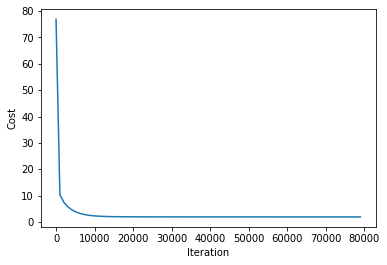

In [40]:
X=X_train.to_numpy()

from sklearn.preprocessing import normalize
X= normalize(X, norm='max', axis=0)

X_Test=X_test.to_numpy()
X_Test= normalize(X_Test, norm='max', axis=0)

model=gradient_descent(X,Y_train.to_numpy(),0.1,80000)


In [61]:
Prediction,Y_test,Y_hat=Predict(X_Test,Y_test.to_numpy(),model)
print(Prediction.T)

                                                           0
Actual     [[73], [76], [76], [77], [64], [60], [57], [62...
Predicted  [[73.36423844347011], [77.51337705803763], [76...


Text(0, 0.5, 'Predicted Values')

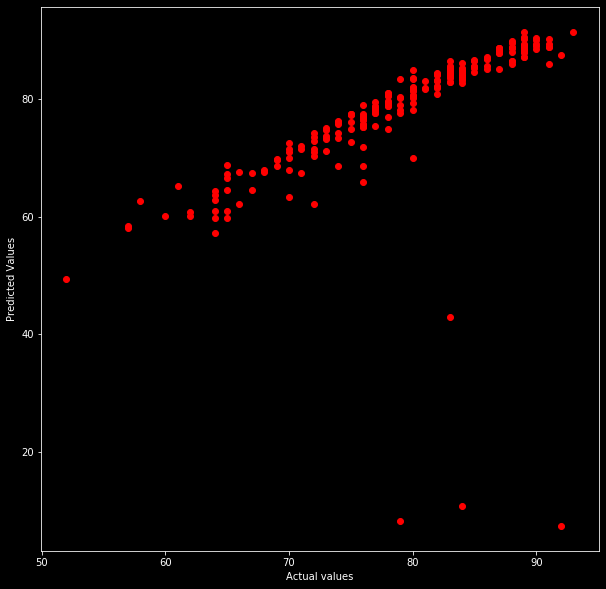

In [65]:
plt.style.use('dark_background')
plt.figure(figsize=(10, 10))
plt.scatter(Y_test,Y_hat, c = 'red')
plt.xlabel('Actual values')
plt.ylabel('Predicted Values')

In [2]:
manual={}
for col in X_train:
    manual[col]=[float(input(f"Enter {col}  : "))]
    
single=pd.DataFrame.from_dict(manual)
single=single.to_numpy()
single= normalize(single, norm='max', axis=0)
result=manual_predict(z,model)
print(result)

NameError: name 'X_train' is not defined